# Problems 1 & 2

## Preprocessing
First, we need to read the data. After that, we perform preprocessing steps. Since the magnitudes of different feature values vary significantly, we normalize the data using the `MinMAxScalar` function, which normalize the feature values in a way that their values fall between 0 and 1.

Since we want to train a SVM model, we have to convert our data label from the default of 0 and 1, to -1 and +1, to be compatible with SVM.

The main objective of the problem is predicting the risk.

We distribute our data across three sets: training, validation, and test. A common split is:

- **Training set:** 70%
- **Validation set:** 15%
- **Test set:** 15%

To achieve this, follow these steps:

1. **Assign Features and Targets:**  
   Assign all features to a variable `X` and the target values to a variable `y`.

2. **Initial Split:**  
   Use the `train_test_split` function to split the data into a training set (70%) and a temporary set (30%).

3. **Secondary Split:**  
   Apply `train_test_split` again on the temporary set to divide it into a validation set (15% of the total data) and a test set (15% of the total data).
   
   
### Dealing With Dummy Variables

In our dataset, some variables (features) are dummy meaning that their value does not have actual meaning. For example **Gender** has two values of 1 for male and 2 for female. However, these values does not have actual meanings (it does not meananingful if one say that the Gender value of male are less than female). So, we need to deal with these dummy vriables. A best and complete approach to deal with these dummy variables is to use One-hot encoding method with interaction terms. Nevertheless, in this problem as we are using non-linear kernels, adding these interactions only add unnecessary complexity to our problem, consequently, there is no need to add interaction terms. Moreover, it is worth mentioning that we do not normalize categorical columns. 

**SEX**
$$
MALE = 
\begin{cases}
1 & \text{if } SEX = 1 \\
0 & \text{otherwise}
\end{cases}
$$
\
\
\
**MARRIAGE**
$$
MARRIED = 
\begin{cases}
1 & \text{if } MARRIAGE = 1 \\
0 & \text{otherwise}
\end{cases}
$$

$$
SINGLE = 
\begin{cases}
1 & \text{if } MARRIAGE = 2 \\
0 & \text{otherwise}
\end{cases}
$$
\
\
\
**EDUCATION**
$$
GRADSCH = 
\begin{cases}
1 & \text{if } EDUCATION = 1 \\
0 & \text{otherwise}
\end{cases}
$$

$$
UNIVERSITY = 
\begin{cases}
1 & \text{if } EDUCATION = 2 \\
0 & \text{otherwise}
\end{cases}
$$

$$
HIGHSCH = 
\begin{cases}
1 & \text{if } EDUCATION = 3 \\
0 & \text{otherwise}
\end{cases}
$$
\
\
\
**PAY_0, PAY_2, PAY_3, PAY_4**
$$
PAY_0(-2) = 
\begin{cases}
1 & \text{if } PAY_0 = -2 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_0(-1) = 
\begin{cases}
1 & \text{if } PAY_0 = -1 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_0(0) = 
\begin{cases}
1 & \text{if } PAY_0 = 0 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_0(1) = 
\begin{cases}
1 & \text{if } PAY_0 = 1 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_0(2) = 
\begin{cases}
1 & \text{if } PAY_0 = 2 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_0(3) = 
\begin{cases}
1 & \text{if } PAY_0 = 3 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_0(4) = 
\begin{cases}
1 & \text{if } PAY_0 = 4 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_0(5) = 
\begin{cases}
1 & \text{if } PAY_0 = 5 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_0(6) = 
\begin{cases}
1 & \text{if } PAY_0 = 6 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_0(7) = 
\begin{cases}
1 & \text{if } PAY_0 = 7 \\
0 & \text{otherwise}
\end{cases}
$$
\
\
\
**PAY_5 and PAY_6**
$$
PAY_5(-2) = 
\begin{cases}
1 & \text{if } PAY_5 = -2 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_5(-1) = 
\begin{cases}
1 & \text{if } PAY_5 = -1 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_5(0) = 
\begin{cases}
1 & \text{if } PAY_5 = 0 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_5(2) = 
\begin{cases}
1 & \text{if } PAY_5 = 2 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_5(3) = 
\begin{cases}
1 & \text{if } PAY_5 = 3 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_5(4) = 
\begin{cases}
1 & \text{if } PAY_5 = 4 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_5(5) = 
\begin{cases}
1 & \text{if } PAY_5 = 5 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_5(6) = 
\begin{cases}
1 & \text{if } PAY_5 = 6 \\
0 & \text{otherwise}
\end{cases}
$$

$$
PAY_5(7) = 
\begin{cases}
1 & \text{if } PAY_5 = 7 \\
0 & \text{otherwise}
\end{cases}
$$

In [36]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split

##### Reading Data #####
df_risk = pd.read_csv("default of credit card clients.csv", header = 1)

##### Removiong Index and Adding Categorical Columns#####
df_risk1 = df_risk.drop(['ID'], axis = 1)

df_risk1['MALE'] = (df_risk1['SEX'] == 1).astype(int)

df_risk1['MARRIED'] = (df_risk1['MARRIAGE'] == 1).astype(int)
df_risk1['SINGLE'] = (df_risk1['MARRIAGE'] == 2).astype(int)

df_risk1['GRADSCH'] = (df_risk1['EDUCATION'] == 1).astype(int)
df_risk1['UNIVERSITY'] = (df_risk1['EDUCATION'] == 2).astype(int)
df_risk1['HIGHSCH'] = (df_risk1['EDUCATION'] == 3).astype(int)

df_risk1['PAY_0_(-2)'] = (df_risk1['PAY_0'] == -2).astype(int)
df_risk1['PAY_0_(-1)'] = (df_risk1['PAY_0'] == -1).astype(int)
df_risk1['PAY_0_(0)'] = (df_risk1['PAY_0'] == 0).astype(int)
df_risk1['PAY_0_(1)'] = (df_risk1['PAY_0'] == 1).astype(int)
df_risk1['PAY_0_(2)'] = (df_risk1['PAY_0'] == 2).astype(int)
df_risk1['PAY_0_(3)'] = (df_risk1['PAY_0'] == 3).astype(int)
df_risk1['PAY_0_(4)'] = (df_risk1['PAY_0'] == 4).astype(int)
df_risk1['PAY_0_(5)'] = (df_risk1['PAY_0'] == 5).astype(int)
df_risk1['PAY_0_(6)'] = (df_risk1['PAY_0'] == 6).astype(int)
df_risk1['PAY_0_(7)'] = (df_risk1['PAY_0'] == 7).astype(int)

df_risk1['PAY_2_(-2)'] = (df_risk1['PAY_2'] == -2).astype(int)
df_risk1['PAY_2_(-1)'] = (df_risk1['PAY_2'] == -1).astype(int)
df_risk1['PAY_2_(0)'] = (df_risk1['PAY_2'] == 0).astype(int)
df_risk1['PAY_2_(1)'] = (df_risk1['PAY_2'] == 1).astype(int)
df_risk1['PAY_2_(2)'] = (df_risk1['PAY_2'] == 2).astype(int)
df_risk1['PAY_2_(3)'] = (df_risk1['PAY_2'] == 3).astype(int)
df_risk1['PAY_2_(4)'] = (df_risk1['PAY_2'] == 4).astype(int)
df_risk1['PAY_2_(5)'] = (df_risk1['PAY_2'] == 5).astype(int)
df_risk1['PAY_2_(6)'] = (df_risk1['PAY_2'] == 6).astype(int)
df_risk1['PAY_2_(7)'] = (df_risk1['PAY_2'] == 7).astype(int)

df_risk1['PAY_3_(-2)'] = (df_risk1['PAY_3'] == -2).astype(int)
df_risk1['PAY_3_(-1)'] = (df_risk1['PAY_3'] == -1).astype(int)
df_risk1['PAY_3_(0)'] = (df_risk1['PAY_3'] == 0).astype(int)
df_risk1['PAY_3_(1)'] = (df_risk1['PAY_3'] == 1).astype(int)
df_risk1['PAY_3_(2)'] = (df_risk1['PAY_3'] == 2).astype(int)
df_risk1['PAY_3_(3)'] = (df_risk1['PAY_3'] == 3).astype(int)
df_risk1['PAY_3_(4)'] = (df_risk1['PAY_3'] == 4).astype(int)
df_risk1['PAY_3_(5)'] = (df_risk1['PAY_3'] == 5).astype(int)
df_risk1['PAY_3_(6)'] = (df_risk1['PAY_3'] == 6).astype(int)
df_risk1['PAY_3_(7)'] = (df_risk1['PAY_3'] == 7).astype(int)

df_risk1['PAY_4_(-2)'] = (df_risk1['PAY_4'] == -2).astype(int)
df_risk1['PAY_4_(-1)'] = (df_risk1['PAY_4'] == -1).astype(int)
df_risk1['PAY_4_(0)'] = (df_risk1['PAY_4'] == 0).astype(int)
df_risk1['PAY_4_(1)'] = (df_risk1['PAY_4'] == 1).astype(int)
df_risk1['PAY_4_(2)'] = (df_risk1['PAY_4'] == 2).astype(int)
df_risk1['PAY_4_(3)'] = (df_risk1['PAY_4'] == 3).astype(int)
df_risk1['PAY_4_(4)'] = (df_risk1['PAY_4'] == 4).astype(int)
df_risk1['PAY_4_(5)'] = (df_risk1['PAY_4'] == 5).astype(int)
df_risk1['PAY_4_(6)'] = (df_risk1['PAY_4'] == 6).astype(int)
df_risk1['PAY_4_(7)'] = (df_risk1['PAY_4'] == 7).astype(int)

df_risk1['PAY_5_(-2)'] = (df_risk1['PAY_5'] == -2).astype(int)
df_risk1['PAY_5_(-1)'] = (df_risk1['PAY_5'] == -1).astype(int)
df_risk1['PAY_5_(0)'] = (df_risk1['PAY_5'] == 0).astype(int)
df_risk1['PAY_5_(2)'] = (df_risk1['PAY_5'] == 2).astype(int)
df_risk1['PAY_5_(3)'] = (df_risk1['PAY_5'] == 3).astype(int)
df_risk1['PAY_5_(4)'] = (df_risk1['PAY_5'] == 4).astype(int)
df_risk1['PAY_5_(5)'] = (df_risk1['PAY_5'] == 5).astype(int)
df_risk1['PAY_5_(6)'] = (df_risk1['PAY_5'] == 6).astype(int)
df_risk1['PAY_5_(7)'] = (df_risk1['PAY_5'] == 7).astype(int)

df_risk1['PAY_6_(-2)'] = (df_risk1['PAY_6'] == -2).astype(int)
df_risk1['PAY_6_(-1)'] = (df_risk1['PAY_6'] == -1).astype(int)
df_risk1['PAY_6_(0)'] = (df_risk1['PAY_6'] == 0).astype(int)
df_risk1['PAY_6_(2)'] = (df_risk1['PAY_6'] == 2).astype(int)
df_risk1['PAY_6_(3)'] = (df_risk1['PAY_6'] == 3).astype(int)
df_risk1['PAY_6_(4)'] = (df_risk1['PAY_6'] == 4).astype(int)
df_risk1['PAY_6_(5)'] = (df_risk1['PAY_6'] == 5).astype(int)
df_risk1['PAY_6_(6)'] = (df_risk1['PAY_6'] == 6).astype(int)
df_risk1['PAY_6_(7)'] = (df_risk1['PAY_6'] == 7).astype(int)

target_col = 'default payment next month'
columns = [col for col in df_risk1.columns if col != target_col] + [target_col]
df_risk1 = df_risk1[columns]

df_risk_new = df_risk1.drop(['SEX', 'EDUCATION', 'MARRIAGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4'
                             , 'PAY_5', 'PAY_6'], axis = 1)

##### Checking the Independancy between the Features #####
rank = np.linalg.matrix_rank(df_risk_new.values)
num_features = df_risk_new.values.shape[1]

print("Rank of the DataFrame:", rank)
print("Number of features (columns):", num_features)

# Interpretation
if rank < num_features:
    print("Some features are linearly dependent.")
else:
    print("All features are linearly independent.")
    
##### Spliting Data (SVM) #####
##### Assigning Value of 1 when default payment of next month is YES, and -1 when it is NO  #####
X_SVM = df_risk_new.loc[:, "LIMIT_BAL":"PAY_6_(7)"]
y_SVM = df_risk_new["default payment next month"]*2 - 1

X_SVM_train, X_SVM_temp, y_SVM_train, y_SVM_temp = train_test_split(
    X_SVM, y_SVM, test_size = 0.3, random_state = 42, stratify = y_SVM
)

X_SVM_test, X_SVM_val, y_SVM_test, y_SVM_val = train_test_split(
    X_SVM_temp, y_SVM_temp, test_size = 0.5, random_state = 42, stratify = y_SVM_temp
)


df_risk_new_SVM_train = pd.concat([X_SVM_train, y_SVM_train], axis = 1)
df_risk_new_SVM_val = pd.concat([X_SVM_val, y_SVM_val], axis = 1)
df_risk_new_SVM_test = pd.concat([X_SVM_test, y_SVM_test], axis = 1)

##### Scaling the Data Values #####
##### Train set #####
scaler = MinMaxScaler()
binary_cols = [col for col in df_risk_new_SVM_train.columns if set(df_risk_new_SVM_train[col].unique()).issubset({0, 1})]
train_SVM_features = df_risk_new_SVM_train.drop(columns = binary_cols + ['default payment next month'])
train_SVM_scaled_features = pd.DataFrame(scaler.fit_transform(train_SVM_features), columns = train_SVM_features.columns, index = train_SVM_features.index)
df_risk_new_SVM_train_scaled = pd.concat(
    [train_SVM_scaled_features, df_risk_new_SVM_train[binary_cols + ['default payment next month']]],
    axis = 1)

##### Validation set #####
scaler = MinMaxScaler()
binary_cols = [col for col in df_risk_new_SVM_val.columns if set(df_risk_new_SVM_val[col].unique()).issubset({0, 1})]
val_SVM_features = df_risk_new_SVM_val.drop(columns = binary_cols + ['default payment next month'])
val_SVM_scaled_features = pd.DataFrame(scaler.fit_transform(val_SVM_features), columns = val_SVM_features.columns, index = val_SVM_features.index)
df_risk_new_SVM_val_scaled = pd.concat(
    [val_SVM_scaled_features, df_risk_new_SVM_val[binary_cols + ['default payment next month']]],
    axis = 1)

##### Test set #####
scaler = MinMaxScaler()
binary_cols = [col for col in df_risk_new_SVM_test.columns if set(df_risk_new_SVM_test[col].unique()).issubset({0, 1})]
test_SVM_features = df_risk_new_SVM_test.drop(columns = binary_cols + ['default payment next month'])
test_SVM_scaled_features = pd.DataFrame(scaler.fit_transform(test_SVM_features), columns = test_SVM_features.columns, index = test_SVM_features.index)
df_risk_new_SVM_test_scaled = pd.concat(
    [test_SVM_scaled_features, df_risk_new_SVM_test[binary_cols + ['default payment next month']]],
    axis = 1)

df_risk_new.head()

Rank of the DataFrame: 79
Number of features (columns): 79
All features are linearly independent.


,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,...,PAY_6_(-2),PAY_6_(-1),PAY_6_(0),PAY_6_(2),PAY_6_(3),PAY_6_(4),PAY_6_(5),PAY_6_(6),PAY_6_(7),default payment next month
0,20000,24,3913,3102,689,0,0,0,0,689,...,1,0,0,0,0,0,0,0,0,1
1,120000,26,2682,1725,2682,3272,3455,3261,0,1000,...,0,0,0,1,0,0,0,0,0,1
2,90000,34,29239,14027,13559,14331,14948,15549,1518,1500,...,0,0,1,0,0,0,0,0,0,0
3,50000,37,46990,48233,49291,28314,28959,29547,2000,2019,...,0,0,1,0,0,0,0,0,0,0
4,50000,57,8617,5670,35835,20940,19146,19131,2000,36681,...,0,0,1,0,0,0,0,0,0,0


### Checking the Minimum, Maximum, and the Range of Features
Now, we check the maximum, minimum, and the range of each feature values for the features both before and after scaling. We see that values of each features falls between 0 and 1.

In [39]:
##### Calculate minimum, maximum, and the range values for each feature columns before scaling and after scaling for train dataset of SVM #####
min_values_nonscaled_train_SVM = df_risk_new_SVM_train.min()
max_values_nonscaled_train_SVM = df_risk_new_SVM_train.max()
range_values_nonscaled_train_SVM = max_values_nonscaled_train_SVM - min_values_nonscaled_train_SVM
summary_df_risk_new_SVM_train_SVM = pd.DataFrame({
    'min': min_values_nonscaled_train_SVM,
    'max': max_values_nonscaled_train_SVM,
    'range': range_values_nonscaled_train_SVM
})
print("-" * 50)
print("Summary of each Column Feature before Scaling for Train Dataset for SVM:")
print(summary_df_risk_new_SVM_train_SVM)

min_values_scaled_train_SVM = df_risk_new_SVM_train_scaled.min()
max_values_scaled_train_SVM = df_risk_new_SVM_train_scaled.max()
range_values_scaled_train_SVM = max_values_scaled_train_SVM - min_values_scaled_train_SVM
summary_df_risk_new_SVM_train_scaled = pd.DataFrame({
    'min': min_values_scaled_train_SVM,
    'max': max_values_scaled_train_SVM,
    'range': range_values_scaled_train_SVM
})
print("-" * 50)
print("Summary of each Column Feature after Scaling for Train Dataset for SVM:")
print(summary_df_risk_new_SVM_train_scaled)

##### Calculate minimum, maximum, and the range values for each feature columns before scaling and after scaling for validation dataset of SVM #####
min_values_nonscaled_val_SVM = df_risk_new_SVM_val.min()
max_values_nonscaled_val_SVM = df_risk_new_SVM_val.max()
range_values_nonscaled_val_SVM = max_values_nonscaled_val_SVM - min_values_nonscaled_val_SVM
summary_df_risk_new_SVM_val_SVM = pd.DataFrame({
    'min': min_values_nonscaled_val_SVM,
    'max': max_values_nonscaled_val_SVM,
    'range': range_values_nonscaled_val_SVM
})
print("-" * 50)
print("Summary of each Column Feature before Scaling for Validation Dataset for SVM:")
print(summary_df_risk_new_SVM_val_SVM)

min_values_scaled_val_SVM = df_risk_new_SVM_val_scaled.min()
max_values_scaled_val_SVM = df_risk_new_SVM_val_scaled.max()
range_values_scaled_val_SVM = max_values_scaled_val_SVM - min_values_scaled_val_SVM
summary_df_risk_new_SVM_val_scaled = pd.DataFrame({
    'min': min_values_scaled_val_SVM,
    'max': max_values_scaled_val_SVM,
    'range': range_values_scaled_val_SVM
})
print("-" * 50)
print("Summary of each Column Feature after Scaling for Validation Dataset for SVM:")
print(summary_df_risk_new_SVM_val_scaled)

##### Calculate minimum, maximum, and the range values for each feature columns before scaling and after scaling for test dataset of SVM #####
min_values_nonscaled_test_SVM = df_risk_new_SVM_test.min()
max_values_nonscaled_test_SVM = df_risk_new_SVM_test.max()
range_values_nonscaled_test_SVM = max_values_nonscaled_test_SVM - min_values_nonscaled_test_SVM
summary_df_risk_new_SVM_test_SVM = pd.DataFrame({
    'min': min_values_nonscaled_test_SVM,
    'max': max_values_nonscaled_test_SVM,
    'range': range_values_nonscaled_test_SVM
})
print("-" * 50)
print("Summary of each Column Feature before Scaling for Test Dataset for SVM:")
print(summary_df_risk_new_SVM_test_SVM)

min_values_scaled_test_SVM = df_risk_new_SVM_test_scaled.min()
max_values_scaled_test_SVM = df_risk_new_SVM_test_scaled.max()
range_values_scaled_test_SVM = max_values_scaled_test_SVM - min_values_scaled_test_SVM
summary_df_risk_new_SVM_test_scaled = pd.DataFrame({
    'min': min_values_scaled_test_SVM,
    'max': max_values_scaled_test_SVM,
    'range': range_values_scaled_test_SVM
})
print("-" * 50)
print("Summary of each Column Feature after Scaling for Test Dataset for SVM:")
print(summary_df_risk_new_SVM_test_scaled)

--------------------------------------------------
Summary of each Column Feature before Scaling for Train Dataset for SVM:
                               min      max    range
LIMIT_BAL                    10000  1000000   990000
AGE                             21       75       54
BILL_AMT1                  -165580   964511  1130091
BILL_AMT2                   -69777   983931  1053708
BILL_AMT3                   -61506   855086   916592
...                            ...      ...      ...
PAY_6_(4)                        0        1        1
PAY_6_(5)                        0        1        1
PAY_6_(6)                        0        1        1
PAY_6_(7)                        0        1        1
default payment next month      -1        1        2

[79 rows x 3 columns]
--------------------------------------------------
Summary of each Column Feature after Scaling for Train Dataset for SVM:
                            min  max  range
LIMIT_BAL                   0.0  1.0    1.0
AGE   

## Splitting the Dataset
We can check the distribution of the data into these three sets to make sure that the data with each label are distributed properly among all the sets.

In [42]:
##### Creating Training, Validation, and Test Sets #####
##### SVM Model #####
X_SVM_train = df_risk_new_SVM_train_scaled.loc[:, "LIMIT_BAL":"PAY_6_(7)"]
y_SVM_train = df_risk_new_SVM_train_scaled["default payment next month"]

X_SVM_val = df_risk_new_SVM_val_scaled.loc[:, "LIMIT_BAL":"PAY_6_(7)"]
y_SVM_val = df_risk_new_SVM_val_scaled["default payment next month"]

X_SVM_test = df_risk_new_SVM_test_scaled.loc[:, "LIMIT_BAL":"PAY_6_(7)"]
y_SVM_test = df_risk_new_SVM_test_scaled["default payment next month"]

print("-" * 50)
print("Label distribution in Training Set (SVM):")
print(y_SVM_train.value_counts())

print("\nLabel distribution in Validation Set (SVM):")
print(y_SVM_val.value_counts())

print("\nLabel distribution in Test Set (SVM):")
print(y_SVM_test.value_counts())

--------------------------------------------------
Label distribution in Training Set (SVM):
default payment next month
-1    16355
 1     4645
Name: count, dtype: int64

Label distribution in Validation Set (SVM):
default payment next month
-1    3504
 1     996
Name: count, dtype: int64

Label distribution in Test Set (SVM):
default payment next month
-1    3505
 1     995
Name: count, dtype: int64


## SVM Model
Support Vector Machines (SVMs) are supervised learning models that aim to find the **optimal separating hyperplane** that maximizes the margin between classes.

### Problem Setup (Primal Form)

Given training data:
- $\mathbf{x}_i \in \mathbb{R}^n$ (feature vectors)
- $y_i \in \{-1, 1\}$ (class labels)

The goal is to find a hyperplane $\mathbf{w}^\top \mathbf{x} + b = 0$ that separates the classes with maximum margin.

#### Optimization problem (soft-margin SVM):

$$
\min_{\mathbf{w}, b, \boldsymbol{\xi}} \quad \frac{1}{2} \|\mathbf{w}\|^2 + C \sum_{i=1}^{N} \xi_i
$$

Subject to:
$$
y_i (\mathbf{w}^\top \mathbf{x}_i + b) \geq 1 - \xi_i, \quad \xi_i \geq 0
$$

Here, $C > 0$ is the regularization parameter controlling the trade-off between margin width and classification error.


### Hinge Loss (Loss Function Behind SVM)

SVMs optimize the **hinge loss**, which penalizes misclassifications and margin violations.

The **hinge loss** for a single example is defined as:

$$
\ell_{\text{hinge}}(y, f(\mathbf{x})) = \max(0, 1 - y f(\mathbf{x}))
$$

Where:
- $y \in \{-1, 1\}$ is the true label
- $f(\mathbf{x}) = \mathbf{w}^\top \mathbf{x} + b$ is the decision function

This means:
- If $y f(\mathbf{x}) \geq 1$, the loss is 0 (correct classification, outside the margin)
- If $y f(\mathbf{x}) < 1$, the point is either misclassified or within the margin → loss increases

Minimizing hinge loss encourages:
- Correct classification
- Larger margins (since smaller $|f(\mathbf{x})|$ near the boundary means higher loss)





### Dual Formulation (For Kernel Methods)

Instead of solving the primal directly, we solve its **dual** form:
$$
\max_{\boldsymbol{\alpha}} \quad \sum_{i=1}^{N} \alpha_i - \frac{1}{2}\sum_{i,j=1}^{N}\alpha_i \alpha_j y_i y_j K(\mathbf{x}_i, \mathbf{x}_j)
$$
Subject to:
$$
0 \leq \alpha_i \leq C, \quad \sum_{i=1}^{N} \alpha_i y_i = 0
$$

- $\alpha_i$ are the **dual coefficients**, and non-zero $\alpha_i$ correspond to **support vectors**.
- $K(\mathbf{x}_i, \mathbf{x}_j)$ is the **kernel function**.


### Common Kernels

1. **Linear Kernel**:
$$
K(\mathbf{x}, \mathbf{x}') = \mathbf{x}^\top \mathbf{x}'
$$

2. **Polynomial Kernel**:
$$
K(\mathbf{x}, \mathbf{x}') = (\mathbf{x}^\top \mathbf{x}' + r)^d
$$

3. **RBF (Gaussian) Kernel**:
$$
K(\mathbf{x}, \mathbf{x}') = \exp\left(-\gamma \|\mathbf{x} - \mathbf{x}'\|^2\right)
$$

### Hyperparameters:

- **C**: Regularization parameter — small C allows more margin violations (more tolerant); large C tries to classify all training points correctly.
- **$\gamma$**: Defines how far the influence of a single training example reaches — small γ = smooth boundary, large γ = tight fit.

### Outputs of SVM:

- **Support vectors**: Critical samples on the margin boundary.
- **Dual coefficients** (`dual_coef_`): Indicate how much each support vector contributes to the final decision function.
- **n_support_**: Number of support vectors for each class.

We now proceed to build an SVM model and explore its behavior with different kernel settings.


### Weighted SVM
We have the following interpreation from the data:
- **Non-risky Customers**: They are labeled by -1 in our dataset, and their number is much higher than **Risky** customers.
- **Risky**: They are labeled by 1 in our dataset, and their number is much less than **Non-risky** customers.

Because we have imbalancy in our data, our model leans toward predicitng most data is **Non-risky** customers which will be rsulted in high number of **False Negatives**. 

In this case **False Positive** means we predict a risky customer (+1), but the costumer is not actually a risky one (-1), so we may uncessearily penalize or reject a good customer.

On the other hand, **False Negative** means that we predict a customer is non-risky (-1), however, he/she is a rsiky one (+1). This results in giving a credit to a person who can't pay back which ends in big financial loss.

So minimizng the number of **False Negavties** is more important and consequently, **Recall** is a more important metric.

So we use `class_weight` option in `SVC` function to ephasize toward the importancy of **Risky** class. We run our model for different class_weight values including equality between the two classes.


### Linear Kernel
In order to make decision on what kernel to use (Linear, Polynomial, or Radial Basis Function, we train our model with each of them and then compare the performance.

In [46]:
from sklearn.svm import SVC
from sklearn.metrics import hinge_loss

C_values = [0.01, 0.1, 1, 10]
gamma = None
class_weight_options = [{1:1, -1:1}, {1:2, -1:1}, {1:4, -1:1},  {1:6, -1:1}]

trained_models_weighted_svm_linear_kernel = {}

for C in C_values:
    
    for cw in class_weight_options:
        print("-" * 50)
        print(f"Training SVM model with Linear Kernel| C = {C}, gamma = {gamma}, class_weight = {cw}")

        model_svm_linear_kernel = SVC(kernel = 'linear', C = C, class_weight = cw)

        model_svm_linear_kernel.fit(X_SVM_train, y_SVM_train)

        train_decision = model_svm_linear_kernel.decision_function(X_SVM_train)
        val_decision = model_svm_linear_kernel.decision_function(X_SVM_val)

        # Compute hinge loss
        train_loss = hinge_loss(y_SVM_train, train_decision)
        val_loss = hinge_loss(y_SVM_val, val_decision)

        print(f"Train Hinge Loss: {train_loss:.4f}")
        print(f"Validation Hinge Loss: {val_loss:.4f}")
        
        cw_str = str(cw)
        
        trained_models_weighted_svm_linear_kernel[(C, gamma, cw_str)] = {
            "model": model_svm_linear_kernel,
            "train_losses": train_loss,
            "val_losses": val_loss
        }
    
print("-" * 50)
print("All SVM models have been trained and stored.")


--------------------------------------------------
Training SVM model with Linear Kernel| C = 0.01, gamma = None, class_weight = {1: 1, -1: 1}
Train Hinge Loss: 0.3618
Validation Hinge Loss: 0.3634
--------------------------------------------------
Training SVM model with Linear Kernel| C = 0.01, gamma = None, class_weight = {1: 2, -1: 1}
Train Hinge Loss: 0.4134
Validation Hinge Loss: 0.4213
--------------------------------------------------
Training SVM model with Linear Kernel| C = 0.01, gamma = None, class_weight = {1: 4, -1: 1}
Train Hinge Loss: 0.4642
Validation Hinge Loss: 0.4742
--------------------------------------------------
Training SVM model with Linear Kernel| C = 0.01, gamma = None, class_weight = {1: 6, -1: 1}
Train Hinge Loss: 0.7677
Validation Hinge Loss: 0.7643
--------------------------------------------------
Training SVM model with Linear Kernel| C = 0.1, gamma = None, class_weight = {1: 1, -1: 1}
Train Hinge Loss: 0.3595
Validation Hinge Loss: 0.3615
-----------

### Evaluation Process (Linear Kernel)
In this part by applying our algorithm on Validation set, we evaluate the performance of our model and make decision on Hyperparameters.

#### Evaluation Metrics

1. **Accuracy:** Good for balanced datasets but may be misleading when classes are imbalanced. 

$$
\frac{TP + TN}{\text{Total Samples}}
$$

2. **Precision:** Indicates the correctness of positive predictions. Important when the cost of false positives is high.

$$
\frac{TP}{TP + FP}
$$

3. **Recall (Sensitivity):** Indicates how well the model captures all actual positives. In weather forecasting (like predicting cloud cover), missing a cloud event (false negative) might have significant consequences. Thus, high recall is typically crucial.

$$
\frac{TP}{TP + FN}
$$

4. **Specificity:** Measures the model’s ability to correctly identify negatives. It is important when false alarms (false positives) are costly.

$$
\frac{TN}{TN + FP}
$$

5. **F1 Score:** Provides a balance between precision and recall, which is useful when you need to optimize both metrics simultaneously.

$$
2\times\frac{Precision\times Recall}{Precision + Recall}
$$

Where:

- **TP (True Positives):** Actual 1’s predicted as 1.
- **TN (True Negatives):** Actual -1’s predicted as -1.
- **FP (False Positives):** Actual -1’s predicted as 1.
- **FN (False Negatives):** Actual 1’s predicted as -1.

#### Support Vectors and Dual Coefficitients
In the dual formulation of SVMs, we solve:

$$
\max_{\boldsymbol{\alpha}} \quad \sum_{i=1}^{N} \alpha_i - \frac{1}{2}\sum_{i,j=1}^{N}\alpha_i \alpha_j y_i y_j K(\mathbf{x}_i, \mathbf{x}_j)
$$
Subject to:
$$
0 \leq \alpha_i \leq C, \quad \sum_{i=1}^{N} \alpha_i y_i = 0
$$

- $\alpha_i$ (dual coefficients) determine the contribution of training points to the decision boundary.
- Only support vectors have non-zero $\alpha_i$.

In Scikit-learn, we can have access to these through:

- `model.dual_coef_`: Dual coefficients (Lagrange multipliers)
- `model.support_`: Index of support vectors
- `model.support_vectors_`: The support vectors themselves

Support vectors lie on or within the margin — they define the decision boundary. Those with $\alpha_i = C$ lie within the margin or are misclassified. Those with $0 < \alpha_i < C$ lie on the margin. We can use these values to discriminate between support vectors:

If we have the following:

- `ind = model.support_`:  indices of support vectors
- `α = model.dual_coef_[0]`: dual coefficients
- `y = target[ind]`: corresponding labels

Then those Support Vectors that are:

- Correctly classified on margin ($0 < \alpha_i < C$) can be found using: `np.where(α * y < C)[1]`
- Margin violators $\alpha_i = C$ can be found using: `np.where(α * y == C)[1]`

You can further split support vectors based on prediction correctness using:

`predictions = model.predict(model.support_vectors_)
ind_correct = np.where(predictions == y)[0]
ind_incorrect = np.where(predictions != y)[0]`

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = None, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  318  3370  134  678      0.82      0.704   0.319        0.962  0.439
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8216                      4435   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             249                                      4186   

   All Incorrectly Classified Support Vectors  
0                                        3781  


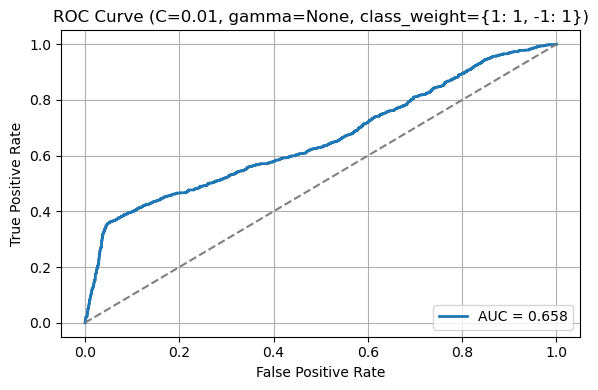

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = None, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  446  3184  320  550     0.807      0.582   0.448        0.909  0.506
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10863                      6872   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             552                                      6320   

   All Incorrectly Classified Support Vectors  
0                                        3991  


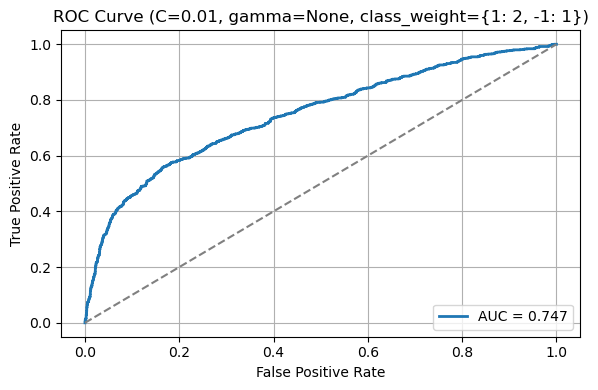

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = None, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  512  2982  522  484     0.776      0.495   0.514        0.851  0.504
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14877                     10276   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             554                                      9722   

   All Incorrectly Classified Support Vectors  
0                                        4601  


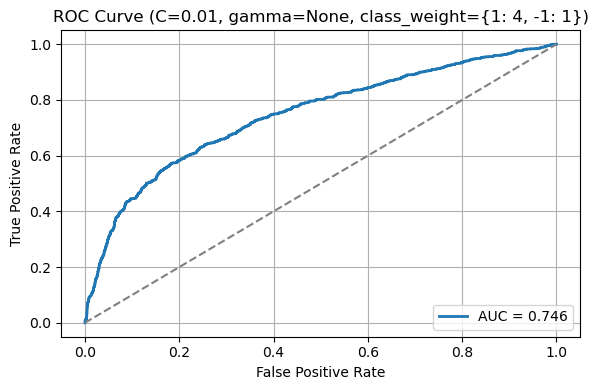

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = None, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  675  2201  1303  321     0.639      0.341   0.678        0.628  0.454
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            17603                     10230   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              18                                     10212   

   All Incorrectly Classified Support Vectors  
0                                        7373  


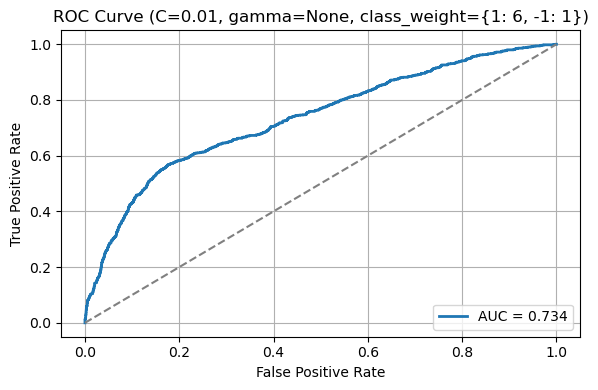

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = None, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  320  3366  138  676     0.819      0.699   0.321        0.961  0.44
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             7956                      4184   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             513                                      3671   

   All Incorrectly Classified Support Vectors  
0                                        3772  


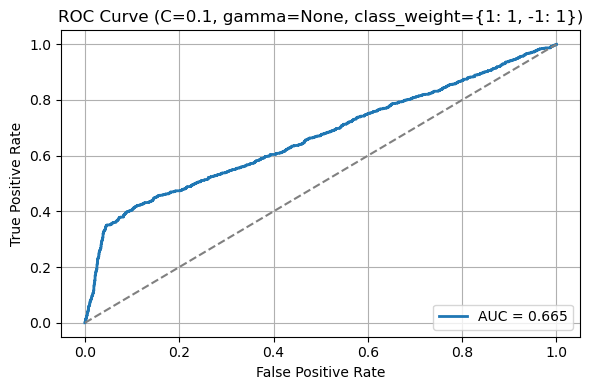

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = None, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  460  3105  399  536     0.792      0.536   0.462        0.886  0.496
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10897                      6585   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1057                                      5528   

   All Incorrectly Classified Support Vectors  
0                                        4312  


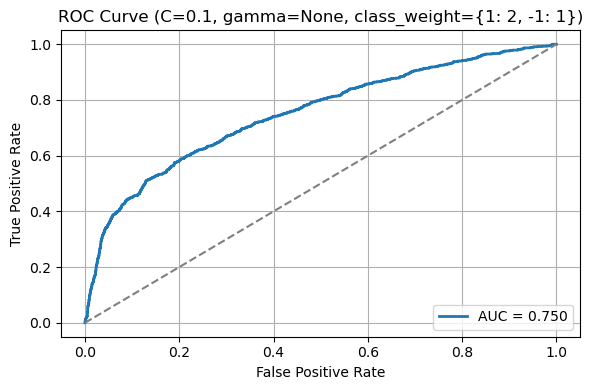

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = None, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  512  2983  521  484     0.777      0.496   0.514        0.851  0.505
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14768                     10167   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             979                                      9188   

   All Incorrectly Classified Support Vectors  
0                                        4601  


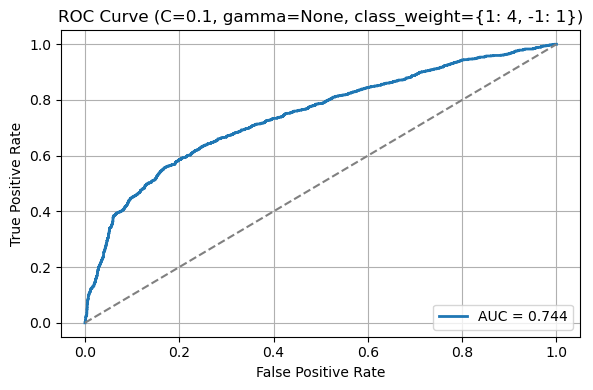

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = None, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  674  2241  1263  322     0.648      0.348   0.677         0.64  0.46
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            17284                      9973   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              23                                      9950   

   All Incorrectly Classified Support Vectors  
0                                        7311  


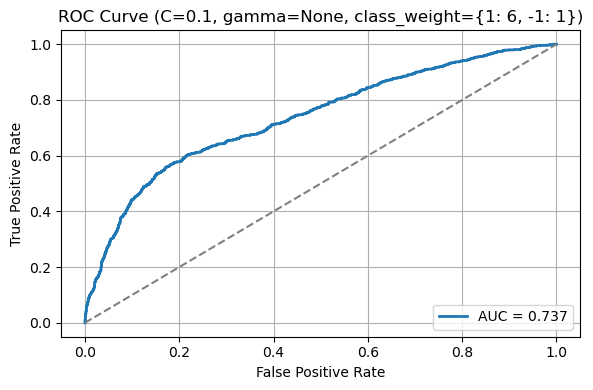

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = None, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  322  3366  138  674      0.82        0.7   0.323        0.961  0.442
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8161                      4397   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1185                                      3212   

   All Incorrectly Classified Support Vectors  
0                                        3764  


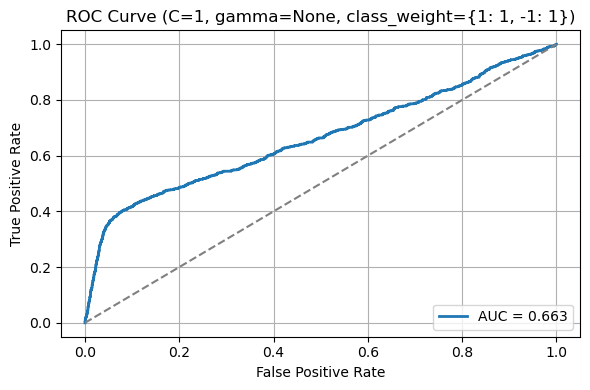

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = None, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  460  3106  398  536     0.792      0.536   0.462        0.886  0.496
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10967                      6662   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1405                                      5257   

   All Incorrectly Classified Support Vectors  
0                                        4305  


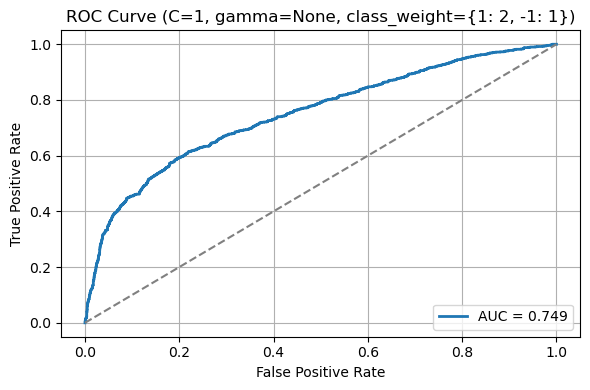

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = None, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  515  2984  520  481     0.778      0.498   0.517        0.852  0.507
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15054                     10466   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1539                                      8927   

   All Incorrectly Classified Support Vectors  
0                                        4588  


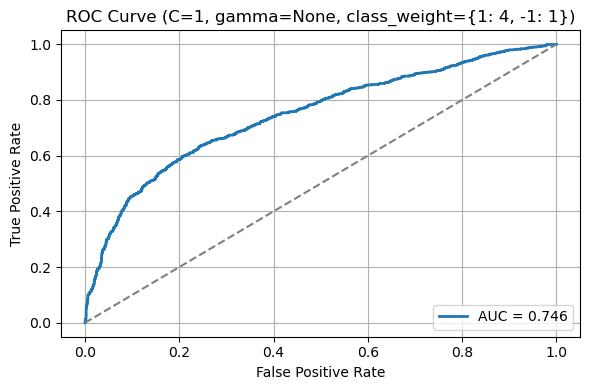

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = None, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  671  2310  1194  325     0.662       0.36   0.674        0.659  0.469
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            17212                     10074   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              24                                     10050   

   All Incorrectly Classified Support Vectors  
0                                        7138  


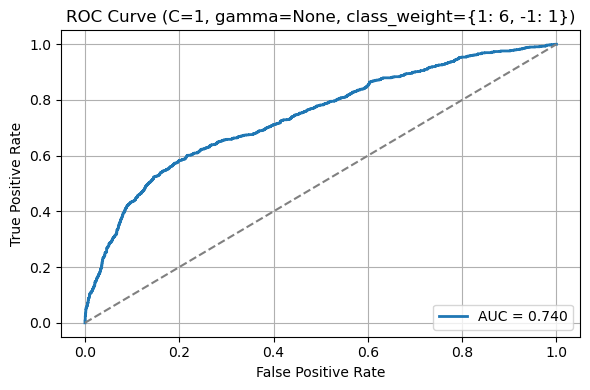

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = None, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  324  3366  138  672      0.82      0.701   0.325        0.961  0.444
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10660                      6897   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            4752                                      2145   

   All Incorrectly Classified Support Vectors  
0                                        3763  


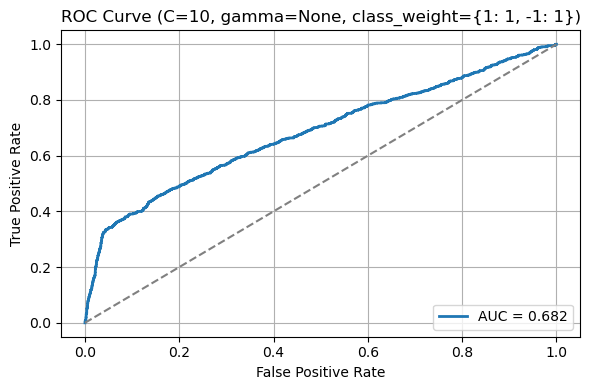

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = None, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  460  3106  398  536     0.792      0.536   0.462        0.886  0.496
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            11412                      7108   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2149                                      4959   

   All Incorrectly Classified Support Vectors  
0                                        4304  


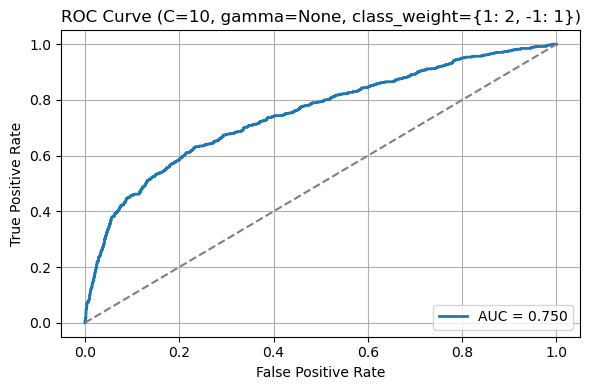

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = None, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  515  2984  520  481     0.778      0.498   0.517        0.852  0.507
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14613                     10026   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             910                                      9116   

   All Incorrectly Classified Support Vectors  
0                                        4587  


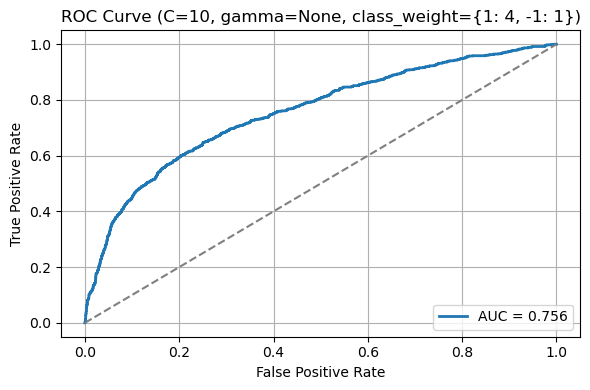

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = None, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  664  2370  1134  332     0.674      0.369   0.667        0.676  0.475
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            17161                     10118   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              38                                     10080   

   All Incorrectly Classified Support Vectors  
0                                        7043  


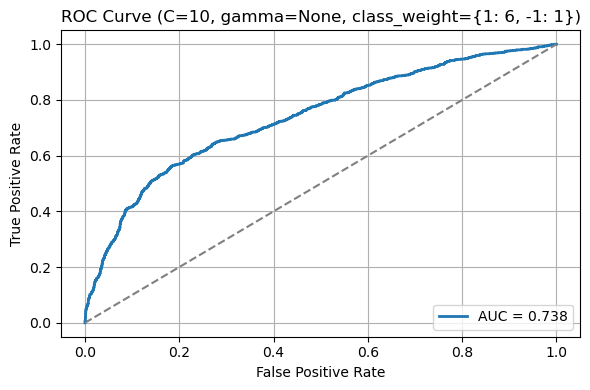

In [205]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Evaluation

C_values = [0.01, 0.1, 1, 10]
gamma = None  # Not used for linear kernel
class_weight_options = [{1:1, -1:1}, {1:2, -1:1}, {1:4, -1:1}, {1:6, -1:1}]

for C in C_values:
    for cw in class_weight_options:
        cw_str = str(cw)
        
        print("-" * 100)
        print(f"\nEvaluating model with C = {C}, gamma = {gamma}, class_weight = {cw_str}")
        
        model_info = trained_models_weighted_svm_linear_kernel.get((C, gamma, cw_str))
        if model_info is None:
            print(f"Model not found for (C={C}, gamma={gamma}, class_weight={cw_str})")
            continue
        
        model = model_info["model"]
        val_decision = model.decision_function(X_SVM_val)
        y_val_pred = np.sign(val_decision)

        evaluationresults = []
        supportvectorsresults = []

        # Evaluation Metrics
        TP = np.sum((y_SVM_val == 1) & (y_val_pred == 1))
        TN = np.sum((y_SVM_val == -1) & (y_val_pred == -1))
        FP = np.sum((y_SVM_val == -1) & (y_val_pred == 1))
        FN = np.sum((y_SVM_val == 1) & (y_val_pred == -1))

        Accuracy = (TP + TN) / len(y_SVM_val)
        Precision = TP / (TP + FP) if (TP + FP) > 0 else 0
        Recall = TP / (TP + FN) if (TP + FN) > 0 else 0
        Specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
        F1 = 2 * (Precision * Recall) / (Precision + Recall) if (Precision + Recall) > 0 else 0

        evaluationresults.append({
            "TP": TP,
            "TN": TN,
            "FP": FP,
            "FN": FN,
            "Accuracy": Accuracy,
            "Precision": Precision,
            "Recall": Recall,
            "Specificity": Specificity,
            "F1": F1,
        })

        # Support Vectors
        support_indices = model.support_
        dual_coefs = model.dual_coef_[0]
        y_support = y_SVM_train.to_numpy()[support_indices]

        influence = dual_coefs * y_support
        ind_on_margin_correct = np.where(influence < C)[0]
        indcloseincorrect = np.where(influence == C)[0]

        SV_decision = model.decision_function(pd.DataFrame(model.support_vectors_, columns=X_SVM_train.columns))
        y_SV_pred = np.sign(SV_decision)
        true_support_labels = y_SVM_train.to_numpy()[support_indices]

        ind_all_correct = np.where(y_SV_pred == true_support_labels)[0]
        ind_all_incorrect = np.where(y_SV_pred != true_support_labels)[0]
        ind_close_correct = np.setdiff1d(ind_all_correct, ind_on_margin_correct)

        supportvectorsresults.append({
            "Total Number of Support Vectors": len(support_indices),
            "All Correctly Classified": len(ind_all_correct),
            "Correctly Classified on Margin": len(ind_on_margin_correct),
            "Correctly Classified but Close to Margin": len(ind_close_correct),
            "All Incorrectly Classified Support Vectors": len(ind_all_incorrect)
        })

        # Print metrics
        df_evaluationresults = pd.DataFrame(evaluationresults)
        print("\nEvaluation Metrics on the Validation Set:")
        print(df_evaluationresults.round(3))

        print("-" * 50)

        df_supportvectorsresults = pd.DataFrame(supportvectorsresults)
        print("\nSupport Vectors Type:")
        print(df_supportvectorsresults.round(3))

        # Plot ROC Curve
        fpr, tpr, _ = roc_curve(y_SVM_val, val_decision, pos_label=1)
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(6, 4))
        plt.plot(fpr, tpr, lw=2, label=f"AUC = {roc_auc:.3f}")
        plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
        plt.title(f"ROC Curve (C={C}, gamma={gamma}, class_weight={cw_str})")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.tight_layout()
        plt.show()


### Results (Linear Kernel)
Now, we can make decision on the value of hyper parameters and class weight ratios.

In the following table:
-**C**: is the regularization parameter

-$\gamma$: is the influence parameter

-**CWR**: is the ratio of more-important class to less-important class

-**Loss**: is the Hinge Loss

-**TP**: is the True Positive

-**TN**: is the True Negative

-**FP**: is the False Positive

-**FN**: is the False Negative

-**Recall**: is the Recall metric

-**F1**: is the F1 Score metric

-**CCSVR**: is the ratio of Correctly Classified Support Vectors to all Support Vectors

-**CCOMR**: is the ratio of Correctly Classified Support Vectors on Margin to all Correctly Classified Support Vectors

-**CCOMR**: is the ratio of Correctly Classified Support Vectors Close to Margin to all Correctly Classified Support Vectors

-**ICSVR**: is the ratio of Incorrectly Classified Support Vectors to all Support Vectors

-**NSV**: is the total number of Support Vectors

In the following tables, we ignored those models with the lowest values for **F1 Scores**. We only look at the model with the highest values for **F1 Score** as well as the basic model of equivalent ratio between the classes. As it can be seen from the results, we can increase the **Class Weight Ratio** as much as we want to increase the **Recall** and make the **FN** predictions to zero, but this happens at the cost of loosing precision and ending up with the high value for **FP**. **F1 Score** compromise between **Precision** and **Recall**. Increasing the value of **Recall** increases the value of **F1** score first, but it has a peak, and after that increase in the value of **Recall** makes the **F1 Score** decrease. This is why **F1 Score** is an important metric for picking a model. Therefore, ignoring those models with the lowest value for **F1 Score** seems reasonable. For those models with the same evaluation metrics, we choose the one with the fewer **Support Vectors** as it is the simpler model and more generalized model. Finally, the ROC curve was considered (which computes true positive rate vs. false positive rate at various thresholds) and auc (for the area under the curve).

<br><br>


<div style="overflow-x:auto">

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  |NSV    |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|-------|-------|
| 0.01 | NoN  | 1   |0.36  |134 |678 |0.32    |0.44|0.54    |0.06    |0.94    |0.46    |8216   |0.66   | 
| 0.01 | NoN  | 2   |0.36  |320 |550 |0.45    |0.51|0.63    |0.08    |0.92    |0.37    |10863  |0.75   | 
| 0.01 | NoN  | 4   |0.47  |522 |484 |0.51    |0.51|0.69    |0.05    |0.95    |0.31    |14877  |0.75   |


<br><br>
    
| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  |NSV    |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|-------|-------|
| 0.1  | NoN  | 1   |0.36  |138 |676 |0.32    |0.44|0.52    |0.12    |0.88    |0.48    |7956   |0.67   |

    
<br><br>    

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  |NSV    |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|-------|-------|
| 1    | NoN  | 1   |0.36  |138 |674 |0.32    |0.44|0.54    |0.27    |0.73    |0.46    |8161   |0.66   |
| 1    | NoN  | 4   |0.45  |520 |481 |0.52    |0.51|0.70    |0.15    |0.85    |0.30    |15054  |0.75   |

 
<br><br>    

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  |NSV    |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|-------|-------|
| 10   | NoN  | 1   |0.36  |138 |672 |0.32    |0.44|0.65    |0.66    |0.34    |0.35    |10660  |0.68   |
| 10   | NoN  | 4   |0.45  |520 |481 |0.52    |0.51|0.69    |0.09    |0.91    |0.31    |14613  |0.76   |

<br><br>
    
We can see that the best values for **F1** Score and **Recall** happen in the following models:

- **$C = 0.01$**, **$\gamma = NoN$**, **CWR = 4**
- **$C = 1.00$**, **$\gamma = NoN$**, **CWR = 4**
- **$C = 10.0$**, **$\gamma = NoN$**, **CWR = 4**


    
Among these models, we choose **$C = 10.0$**, **$\gamma = NoN$**, **CWR = 4** model as our final model since it has the overall better performance on the following parameters:
- **$NSV = 14613$**
- **$FN = 484$**
- **$CCSVR = 0.69$**
- **$ROC = 0.76$**

### Quadratic Kernel

In [217]:
from sklearn.svm import SVC
from sklearn.metrics import hinge_loss

C_values = [0.01, 0.1, 1, 10]
gamma_values = [0.01, 0.1, 0.5, 1]
class_weight_options = [{1:1, -1:1}, {1:2, -1:1}, {1:4, -1:1},  {1:6, -1:1}]

trained_models_weighted_svm_quadratic_kernel = {}

for C in C_values:
    
    for gamma in gamma_values:
        
        for cw in class_weight_options:
            
            print("-" * 50)
            print(f"Training SVM model with Quadratic Kernel C = {C}, gamma = {gamma}, and class_weight = {cw}")

            model_svm_quadratic_kernel = SVC(kernel = 'poly', degree = 2, C = C, gamma = gamma, class_weight = cw)

            model_svm_quadratic_kernel.fit(X_SVM_train, y_SVM_train)

            train_decision = model_svm_quadratic_kernel.decision_function(X_SVM_train)
            val_decision = model_svm_quadratic_kernel.decision_function(X_SVM_val)

            # Compute hinge loss
            train_loss = hinge_loss(y_SVM_train, train_decision)
            val_loss = hinge_loss(y_SVM_val, val_decision)

            print(f"Train Hinge Loss: {train_loss:.4f}")
            print(f"Validation Hinge Loss: {val_loss:.4f}")
            
            cw_str = str(cw)
            trained_models_weighted_svm_quadratic_kernel[(C, gamma, cw_str)] = {
                "model": model_svm_quadratic_kernel,
                "train_losses": train_loss,
                "val_losses": val_loss
            }

print("-" * 50)
print("All SVM models have been trained and stored.")

--------------------------------------------------
Training SVM model with Quadratic Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 1, -1: 1}
Train Hinge Loss: 0.4419
Validation Hinge Loss: 0.4423
--------------------------------------------------
Training SVM model with Quadratic Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 2, -1: 1}
Train Hinge Loss: 0.4414
Validation Hinge Loss: 0.4420
--------------------------------------------------
Training SVM model with Quadratic Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 4, -1: 1}
Train Hinge Loss: 1.4859
Validation Hinge Loss: 1.4862
--------------------------------------------------
Training SVM model with Quadratic Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 6, -1: 1}
Train Hinge Loss: 1.5451
Validation Hinge Loss: 1.5448
--------------------------------------------------
Training SVM model with Quadratic Kernel C = 0.01, gamma = 0.1, and class_weight = {1: 1, -1: 1}
Train Hinge Loss: 0.3962
Validation 

### Evaluation Process (Quadratic Kernel)

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9290                      4645   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               0                                      4645   

   All Incorrectly Classified Support Vectors  
0                                        4645  


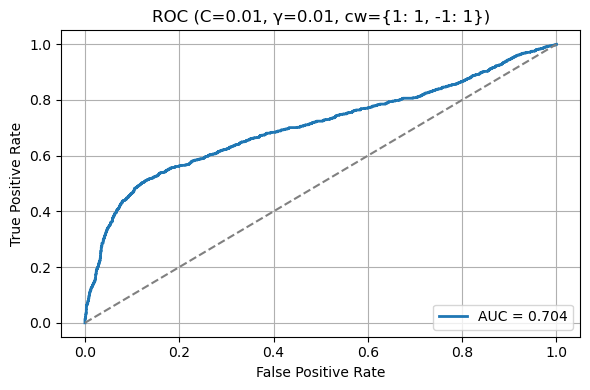

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13935                      9290   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               0                                      9290   

   All Incorrectly Classified Support Vectors  
0                                        4645  


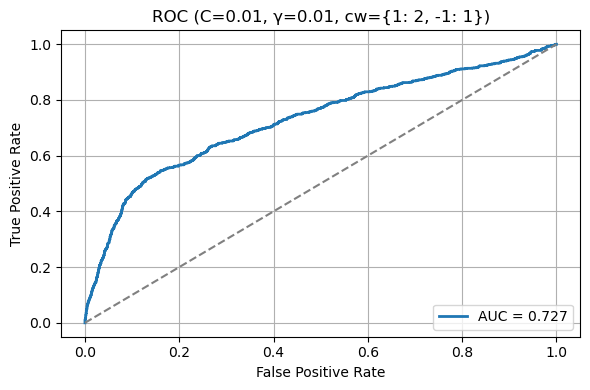

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP  TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  996   0  3504   0     0.221      0.221     1.0          0.0  0.362
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            20447                      4092   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               0                                      4092   

   All Incorrectly Classified Support Vectors  
0                                       16355  


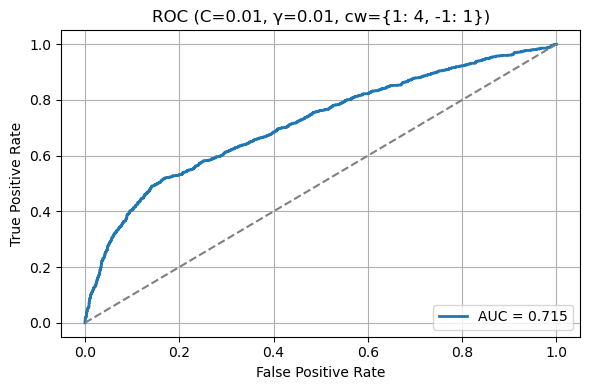

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP  TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  996   0  3504   0     0.221      0.221     1.0          0.0  0.362
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            19234                      2879   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               4                                      2875   

   All Incorrectly Classified Support Vectors  
0                                       16355  


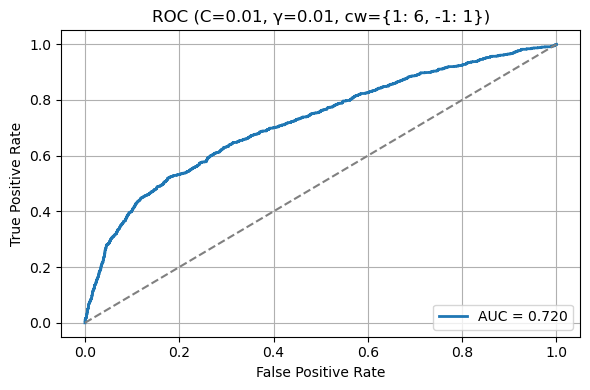

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  165  3423  81  831     0.797      0.671   0.166        0.977  0.266
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9355                      5210   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             210                                      5000   

   All Incorrectly Classified Support Vectors  
0                                        4145  


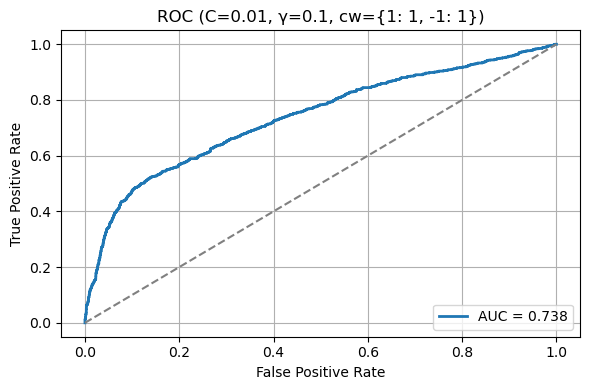

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  435  3209  295  561      0.81      0.596   0.437        0.916  0.504
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            12090                      8182   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             117                                      8065   

   All Incorrectly Classified Support Vectors  
0                                        3908  


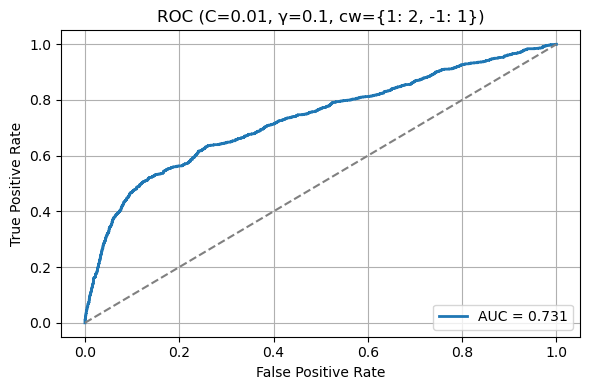

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  554  2933  571  442     0.775      0.492   0.556        0.837  0.522
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16288                     11692   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              47                                     11645   

   All Incorrectly Classified Support Vectors  
0                                        4596  


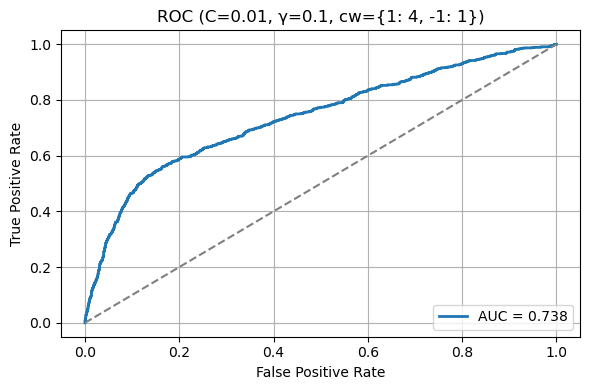

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  766  1680  1824  230     0.544      0.296   0.769        0.479  0.427
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            18295                      8876   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              15                                      8861   

   All Incorrectly Classified Support Vectors  
0                                        9419  


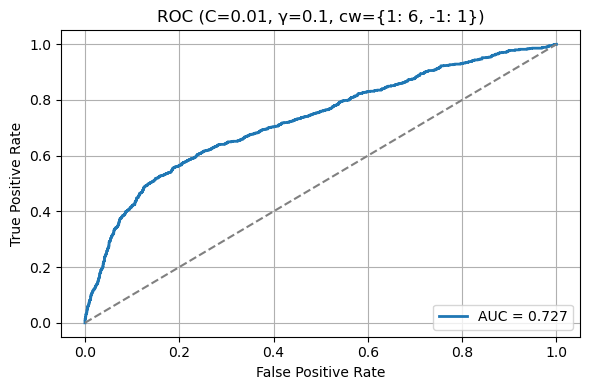

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  336  3339  165  660     0.817      0.671   0.337        0.953  0.449
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8783                      5090   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1647                                      3443   

   All Incorrectly Classified Support Vectors  
0                                        3693  


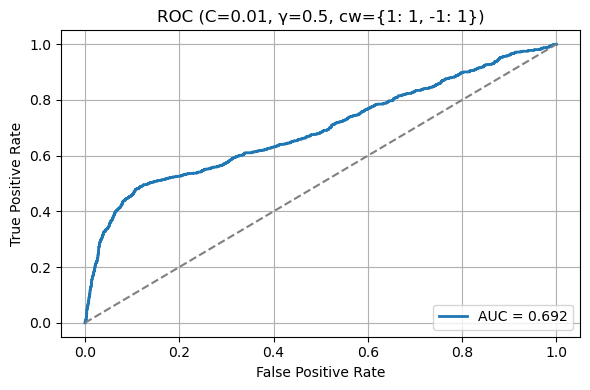

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  453  3175  329  543     0.806      0.579   0.455        0.906  0.51
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10532                      6599   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             909                                      5690   

   All Incorrectly Classified Support Vectors  
0                                        3933  


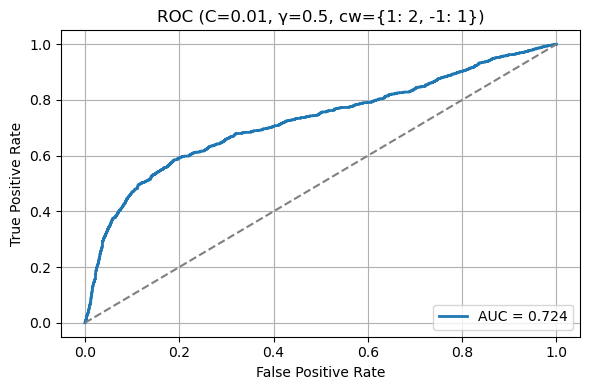

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  595  2839  665  401     0.763      0.472   0.597         0.81  0.527
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13849                      8944   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             404                                      8540   

   All Incorrectly Classified Support Vectors  
0                                        4905  


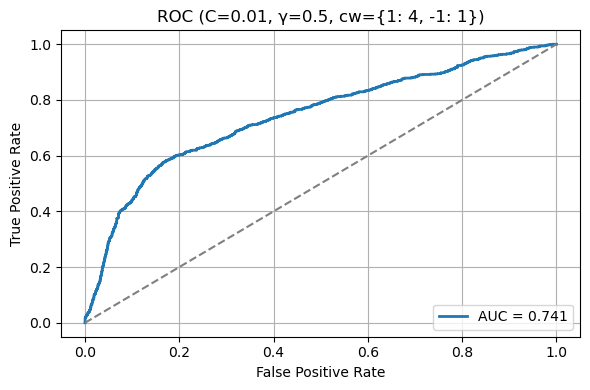

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  680  2401  1103  316     0.685      0.381   0.683        0.685  0.489
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16661                      9817   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             102                                      9715   

   All Incorrectly Classified Support Vectors  
0                                        6844  


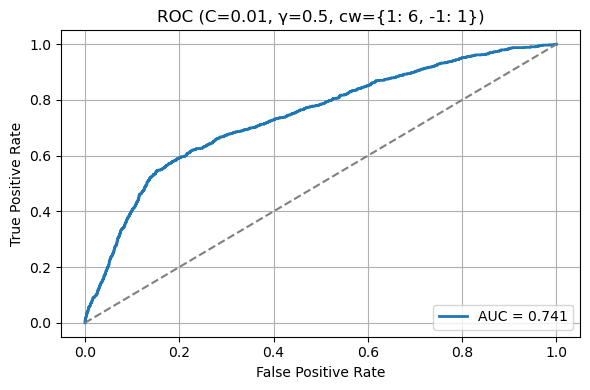

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  342  3333  171  654     0.817      0.667   0.343        0.951  0.453
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9281                      5623   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2756                                      2867   

   All Incorrectly Classified Support Vectors  
0                                        3658  


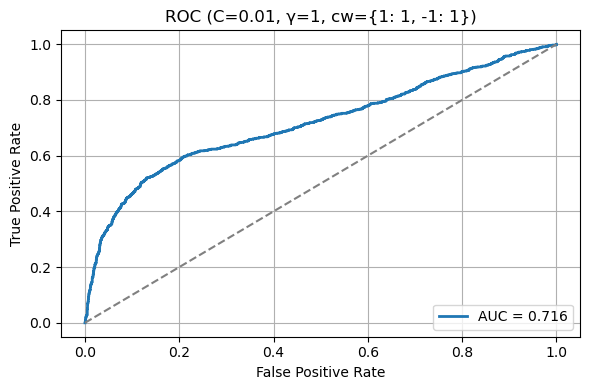

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  456  3168  336  540     0.805      0.576   0.458        0.904  0.51
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10553                      6613   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1331                                      5282   

   All Incorrectly Classified Support Vectors  
0                                        3940  


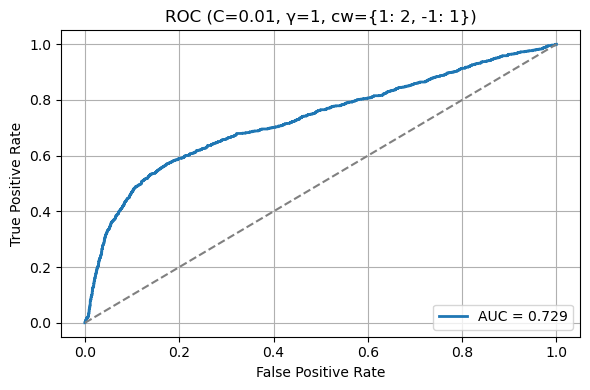

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  595  2843  661  401     0.764      0.474   0.597        0.811  0.528
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13642                      8751   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             500                                      8251   

   All Incorrectly Classified Support Vectors  
0                                        4891  


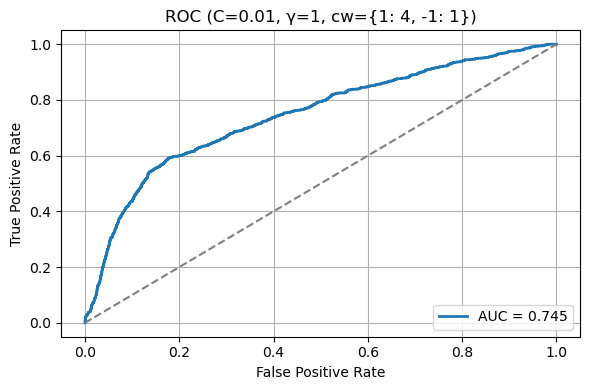

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  662  2462  1042  334     0.694      0.388   0.665        0.703  0.49
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16352                      9780   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             155                                      9625   

   All Incorrectly Classified Support Vectors  
0                                        6572  


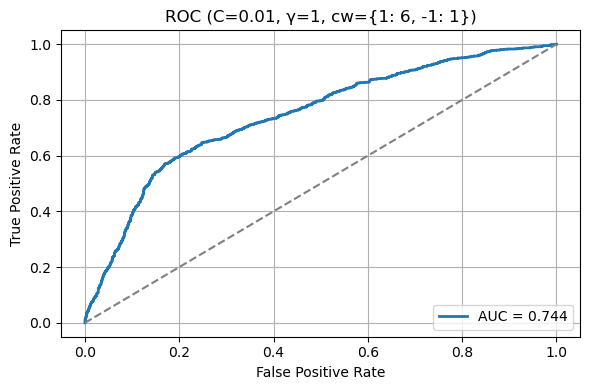

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9292                      4647   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               4                                      4643   

   All Incorrectly Classified Support Vectors  
0                                        4645  


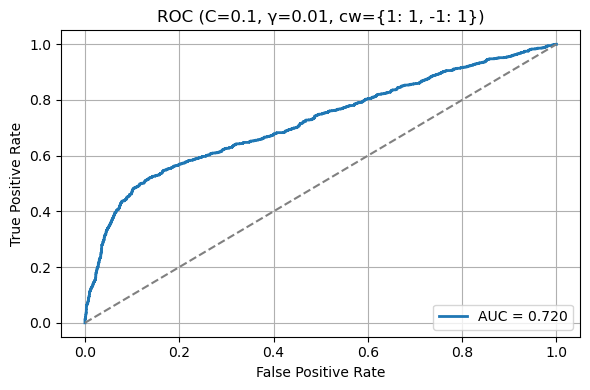

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0   1  3504   0  995     0.779        1.0   0.001          1.0  0.002
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13938                      9293   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               6                                      9287   

   All Incorrectly Classified Support Vectors  
0                                        4645  


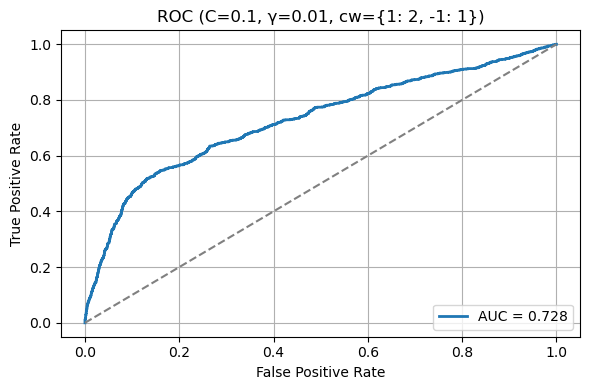

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  753  1806  1698  243     0.569      0.307   0.756        0.515  0.437
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            20446                     11468   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               0                                     11468   

   All Incorrectly Classified Support Vectors  
0                                        8978  


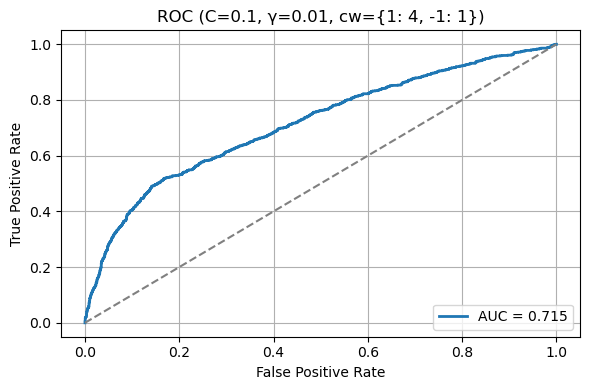

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP  TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  996   0  3504   0     0.221      0.221     1.0          0.0  0.362
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            19110                      2755   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              12                                      2743   

   All Incorrectly Classified Support Vectors  
0                                       16355  


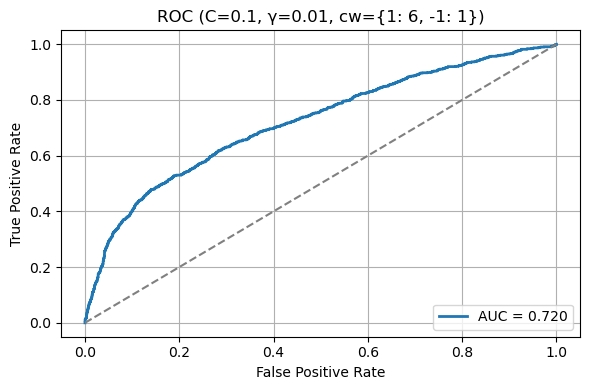

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  312  3370  134  684     0.818        0.7   0.313        0.962  0.433
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8656                      4927   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1016                                      3911   

   All Incorrectly Classified Support Vectors  
0                                        3729  


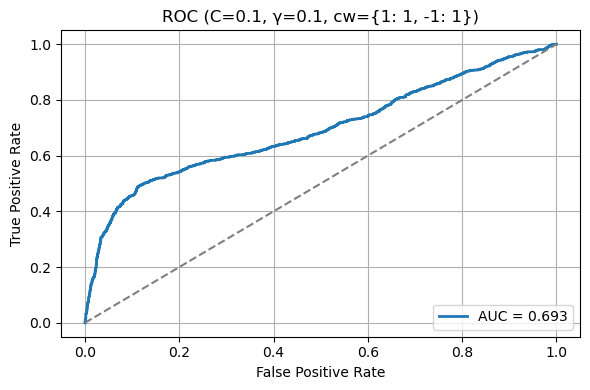

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  446  3184  320  550     0.807      0.582   0.448        0.909  0.506
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10646                      6725   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             603                                      6122   

   All Incorrectly Classified Support Vectors  
0                                        3921  


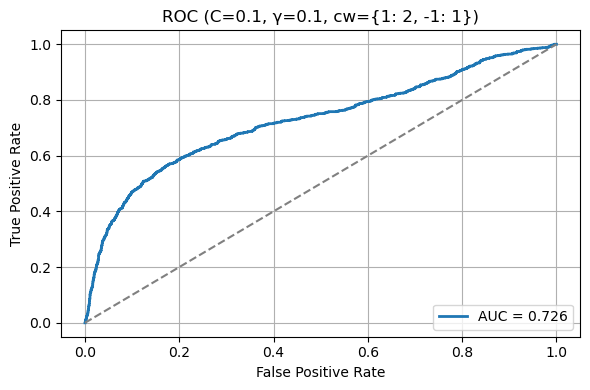

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  587  2860  644  409     0.766      0.477   0.589        0.816  0.527
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14118                      9268   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             300                                      8968   

   All Incorrectly Classified Support Vectors  
0                                        4850  


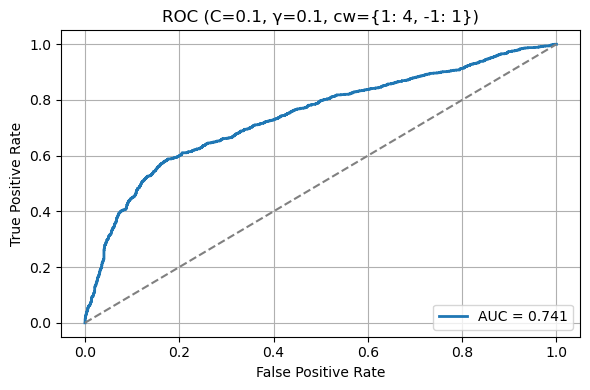

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  692  2254  1250  304     0.655      0.356   0.695        0.643  0.471
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16936                      9681   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              87                                      9594   

   All Incorrectly Classified Support Vectors  
0                                        7255  


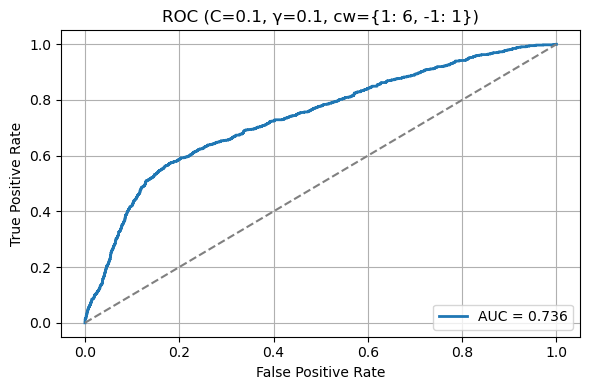

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  343  3323  181  653     0.815      0.655   0.344        0.948  0.451
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9482                      5823   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            3180                                      2643   

   All Incorrectly Classified Support Vectors  
0                                        3659  


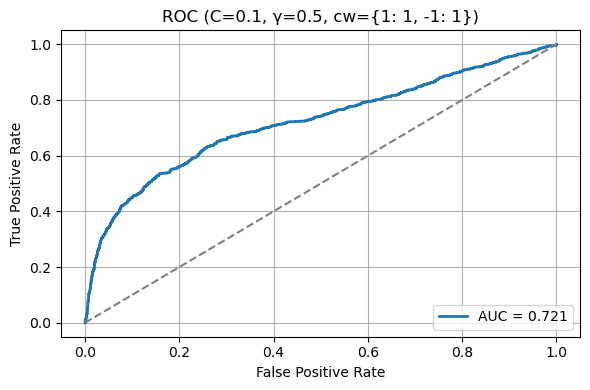

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  479  3142  362  517     0.805       0.57   0.481        0.897  0.522
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10516                      6555   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1422                                      5133   

   All Incorrectly Classified Support Vectors  
0                                        3961  


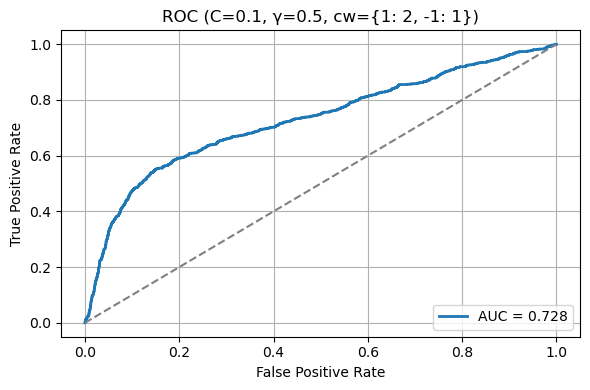

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  593  2841  663  403     0.763      0.472   0.595        0.811  0.527
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13519                      8648   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             491                                      8157   

   All Incorrectly Classified Support Vectors  
0                                        4871  


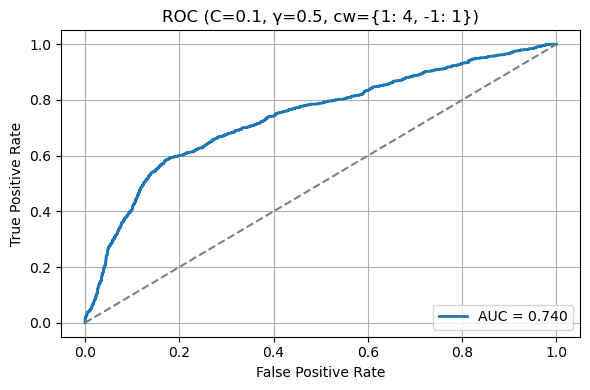

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  662  2461  1043  334     0.694      0.388   0.665        0.702  0.49
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16206                      9621   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             213                                      9408   

   All Incorrectly Classified Support Vectors  
0                                        6585  


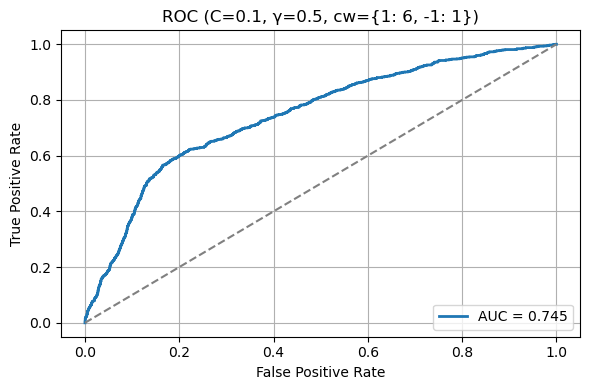

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  348  3319  185  648     0.815      0.653   0.349        0.947  0.455
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9819                      6197   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            3793                                      2404   

   All Incorrectly Classified Support Vectors  
0                                        3622  


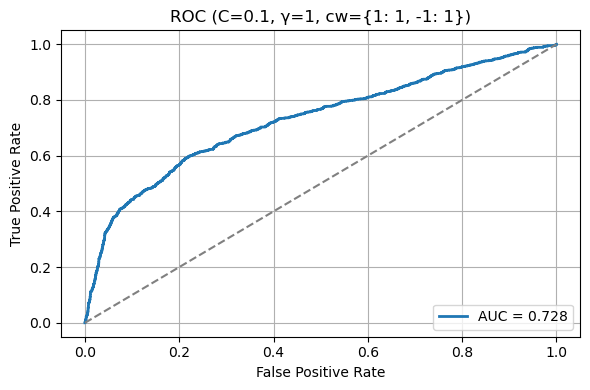

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  479  3128  376  517     0.802       0.56   0.481        0.893  0.518
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10416                      6500   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1421                                      5079   

   All Incorrectly Classified Support Vectors  
0                                        3916  


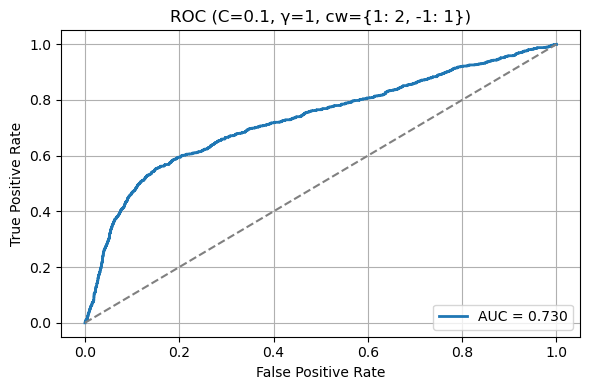

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  590  2836  668  406     0.761      0.469   0.592        0.809  0.524
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13408                      8595   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             513                                      8082   

   All Incorrectly Classified Support Vectors  
0                                        4813  


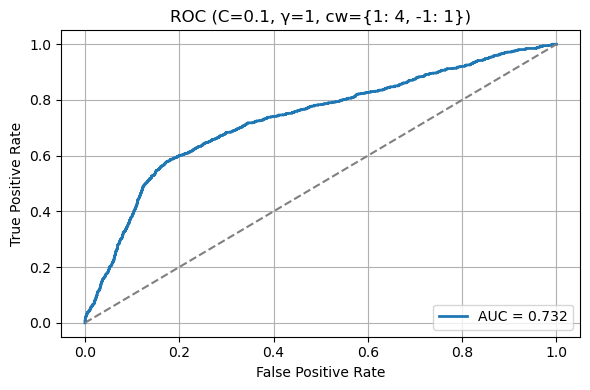

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  686  2378  1126  310     0.681      0.379   0.689        0.679  0.489
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15973                      9419   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             247                                      9172   

   All Incorrectly Classified Support Vectors  
0                                        6554  


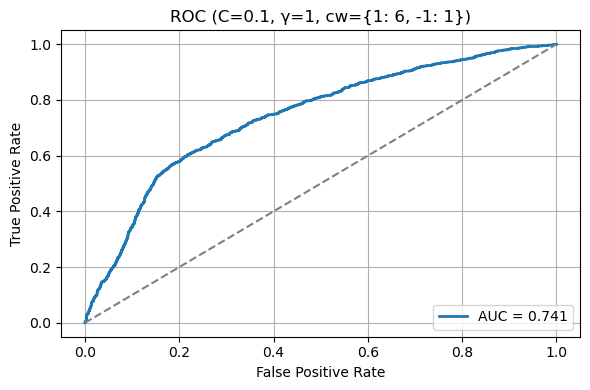

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  165  3423  81  831     0.797      0.671   0.166        0.977  0.266
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9359                      5214   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             216                                      4998   

   All Incorrectly Classified Support Vectors  
0                                        4145  


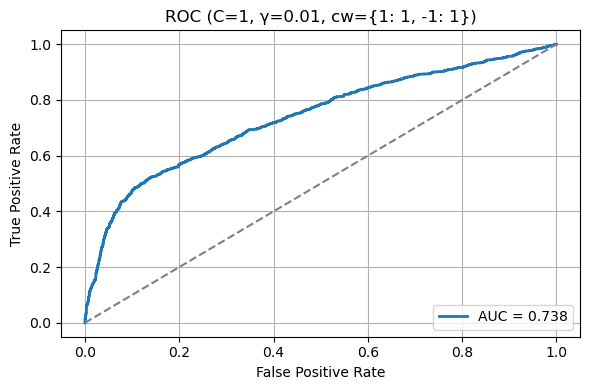

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  435  3209  295  561      0.81      0.596   0.437        0.916  0.504
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            12077                      8169   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             101                                      8068   

   All Incorrectly Classified Support Vectors  
0                                        3908  


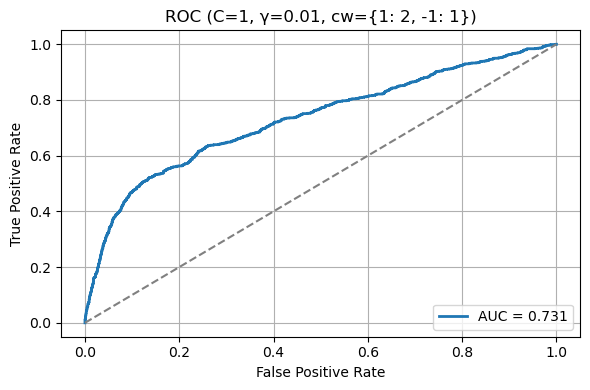

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  554  2933  571  442     0.775      0.492   0.556        0.837  0.522
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16281                     11685   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              37                                     11648   

   All Incorrectly Classified Support Vectors  
0                                        4596  


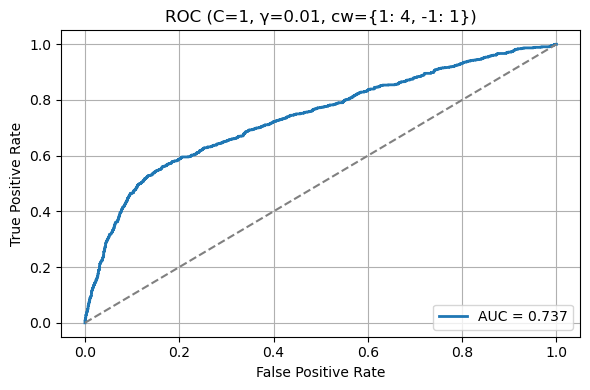

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  766  1680  1824  230     0.544      0.296   0.769        0.479  0.427
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            18294                      8875   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              17                                      8858   

   All Incorrectly Classified Support Vectors  
0                                        9419  


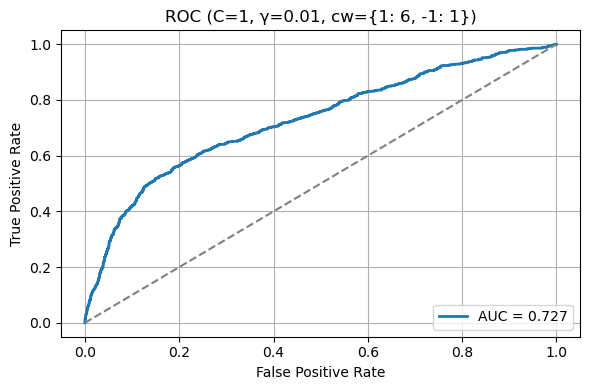

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  342  3333  171  654     0.817      0.667   0.343        0.951  0.453
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9267                      5608   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2755                                      2853   

   All Incorrectly Classified Support Vectors  
0                                        3659  


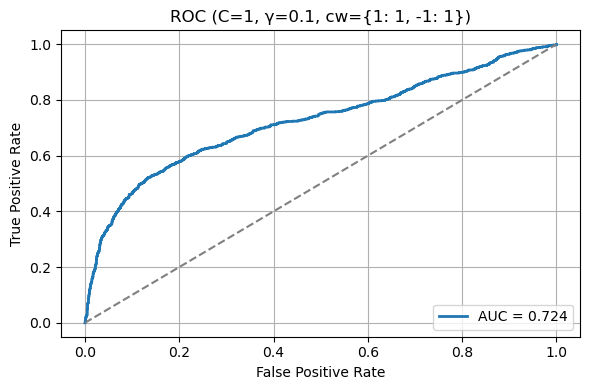

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  456  3168  336  540     0.805      0.576   0.458        0.904  0.51
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10524                      6584   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1289                                      5295   

   All Incorrectly Classified Support Vectors  
0                                        3940  


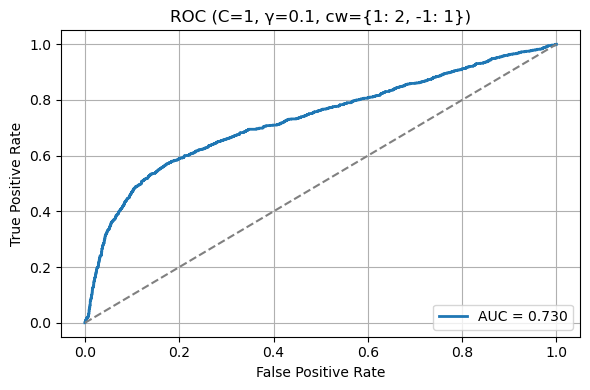

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  595  2843  661  401     0.764      0.474   0.597        0.811  0.528
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13626                      8735   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             489                                      8246   

   All Incorrectly Classified Support Vectors  
0                                        4891  


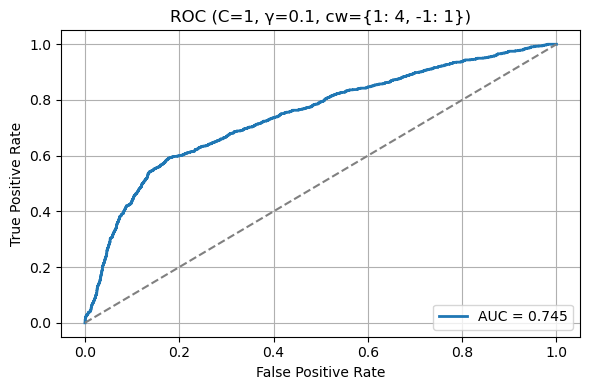

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  663  2461  1043  333     0.694      0.389   0.666        0.702  0.491
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16352                      9780   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             159                                      9621   

   All Incorrectly Classified Support Vectors  
0                                        6572  


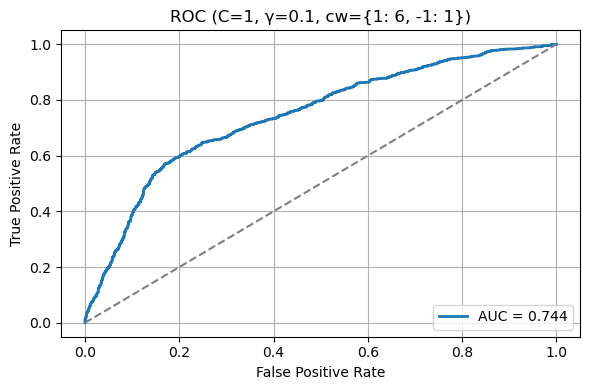

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  347  3322  182  649     0.815      0.656   0.348        0.948  0.455
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9758                      6171   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            3797                                      2374   

   All Incorrectly Classified Support Vectors  
0                                        3587  


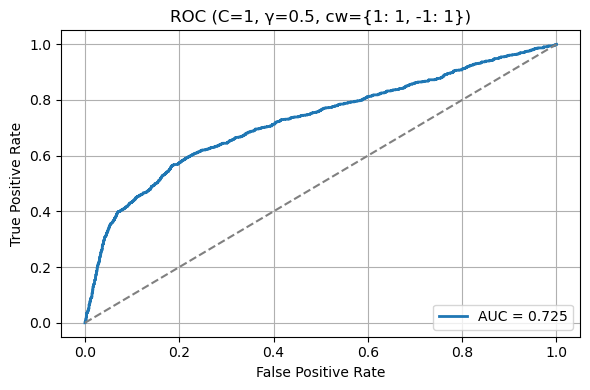

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  482  3117  387  514       0.8      0.555   0.484         0.89  0.517
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10324                      6413   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1349                                      5064   

   All Incorrectly Classified Support Vectors  
0                                        3911  


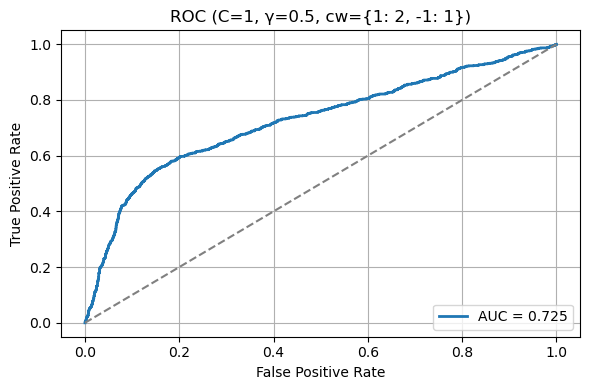

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  588  2831  673  408      0.76      0.466    0.59        0.808  0.521
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13357                      8583   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             552                                      8031   

   All Incorrectly Classified Support Vectors  
0                                        4774  


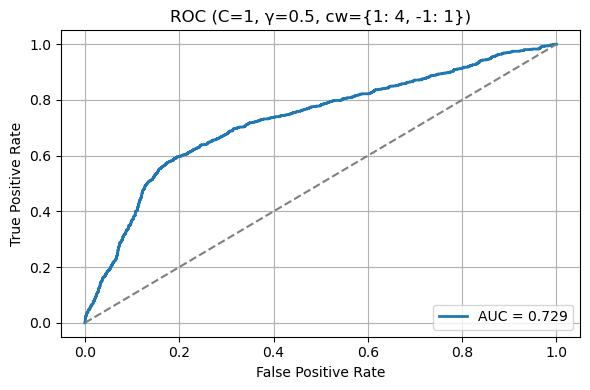

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  740  2123  1381  256     0.636      0.349   0.743        0.606  0.475
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15870                      9286   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             338                                      8948   

   All Incorrectly Classified Support Vectors  
0                                        6584  


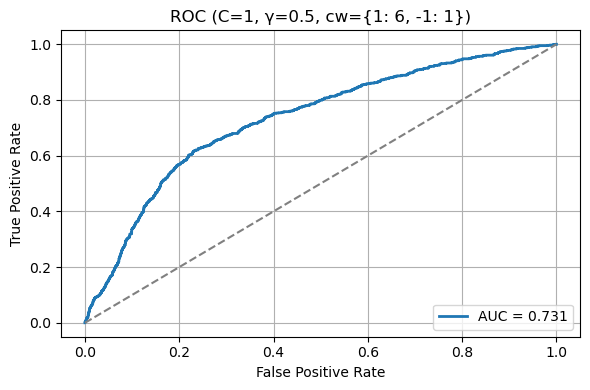

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  342  3322  182  654     0.814      0.653   0.343        0.948  0.45
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9019                      5462   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2894                                      2568   

   All Incorrectly Classified Support Vectors  
0                                        3557  


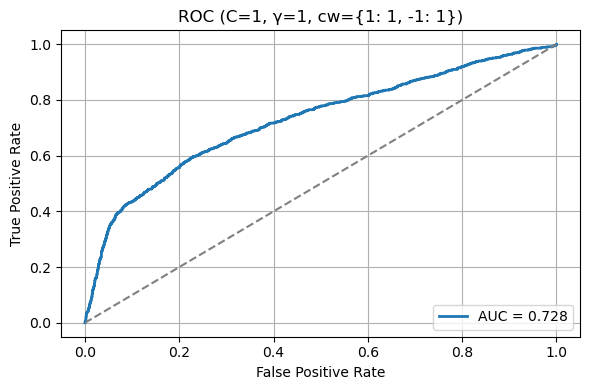

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  494  3081  423  502     0.794      0.539   0.496        0.879  0.516
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10124                      6233   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1136                                      5097   

   All Incorrectly Classified Support Vectors  
0                                        3891  


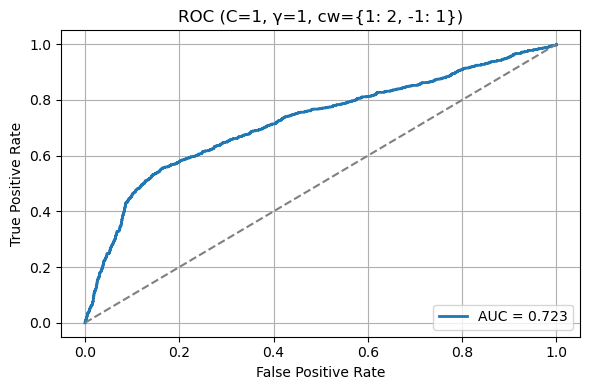

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  602  2731  773  394     0.741      0.438   0.604        0.779  0.508
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13276                      8543   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             574                                      7969   

   All Incorrectly Classified Support Vectors  
0                                        4733  


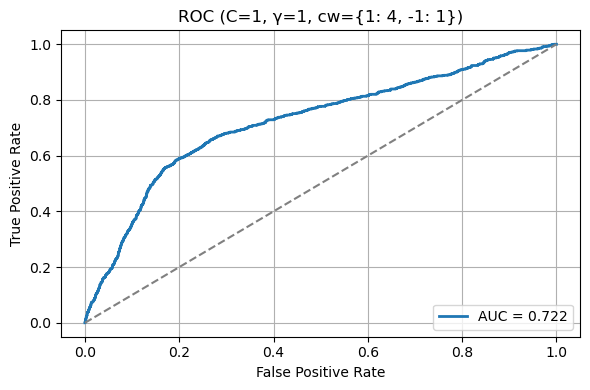

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  741  1896  1608  255     0.586      0.315   0.744        0.541  0.443
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15679                      9035   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             382                                      8653   

   All Incorrectly Classified Support Vectors  
0                                        6644  


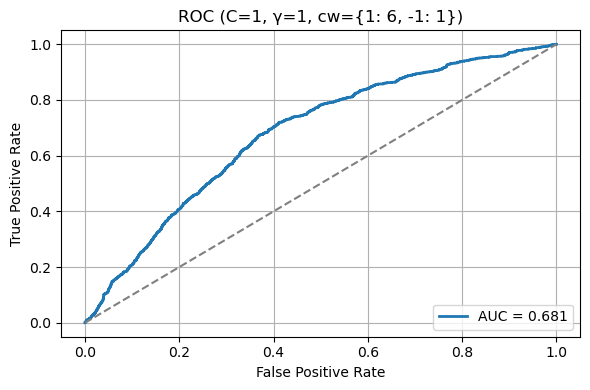

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  312  3370  134  684     0.818        0.7   0.313        0.962  0.433
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8671                      4942   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1044                                      3898   

   All Incorrectly Classified Support Vectors  
0                                        3729  


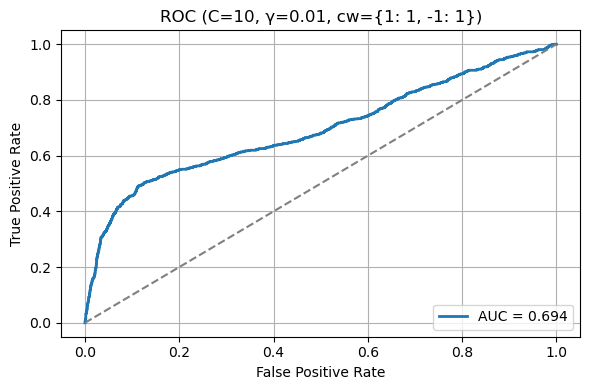

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  446  3184  320  550     0.807      0.582   0.448        0.909  0.506
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10646                      6725   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             611                                      6114   

   All Incorrectly Classified Support Vectors  
0                                        3921  


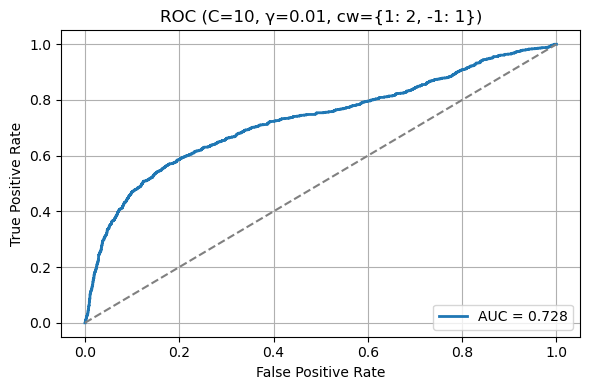

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  587  2860  644  409     0.766      0.477   0.589        0.816  0.527
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14105                      9256   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             276                                      8980   

   All Incorrectly Classified Support Vectors  
0                                        4849  


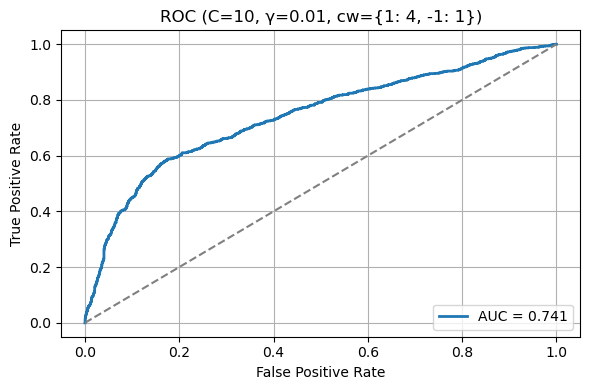

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  692  2253  1251  304     0.654      0.356   0.695        0.643  0.471
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16937                      9684   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              84                                      9600   

   All Incorrectly Classified Support Vectors  
0                                        7253  


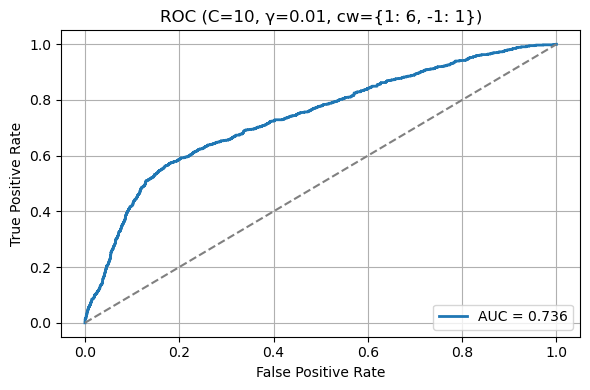

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  348  3319  185  648     0.815      0.653   0.349        0.947  0.455
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9749                      6127   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            3682                                      2445   

   All Incorrectly Classified Support Vectors  
0                                        3622  


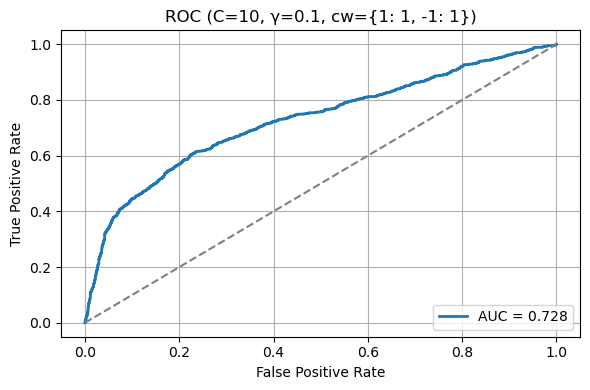

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  479  3128  376  517     0.802       0.56   0.481        0.893  0.518
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10440                      6524   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1439                                      5085   

   All Incorrectly Classified Support Vectors  
0                                        3916  


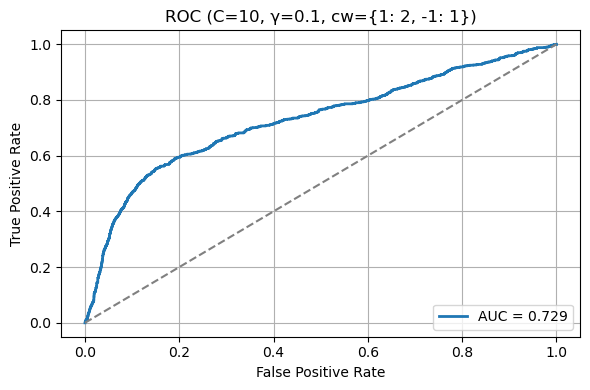

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  590  2836  668  406     0.761      0.469   0.592        0.809  0.524
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13423                      8609   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             520                                      8089   

   All Incorrectly Classified Support Vectors  
0                                        4814  


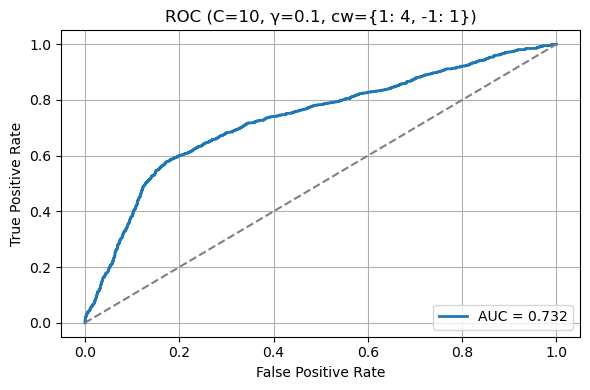

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  686  2378  1126  310     0.681      0.379   0.689        0.679  0.489
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15975                      9420   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             251                                      9169   

   All Incorrectly Classified Support Vectors  
0                                        6555  


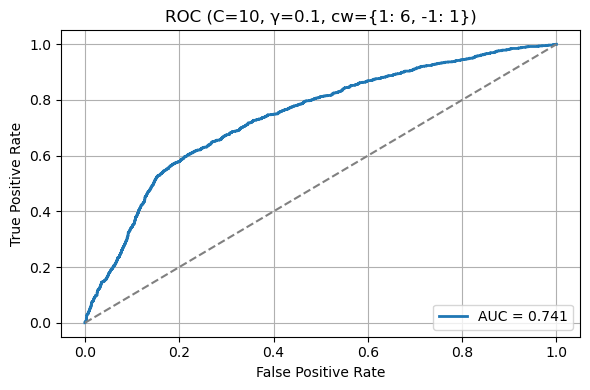

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  341  3323  181  655     0.814      0.653   0.342        0.948  0.449
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8566                      5022   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2311                                      2711   

   All Incorrectly Classified Support Vectors  
0                                        3544  


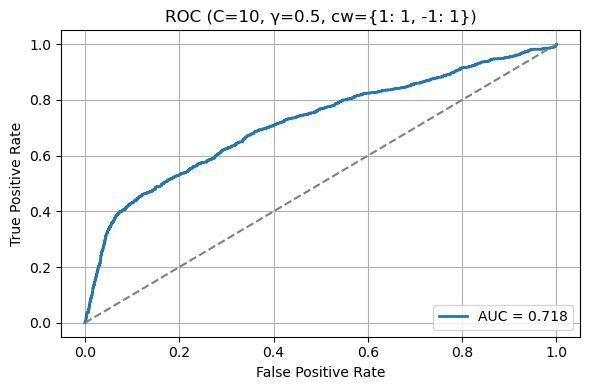

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  521  3015  489  475     0.786      0.516   0.523         0.86  0.519
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10004                      6153   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1053                                      5100   

   All Incorrectly Classified Support Vectors  
0                                        3851  


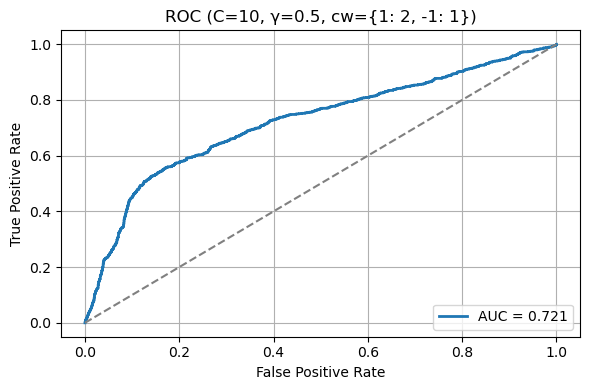

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  640  2597  907  356     0.719      0.414   0.643        0.741  0.503
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13218                      8538   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             591                                      7947   

   All Incorrectly Classified Support Vectors  
0                                        4680  


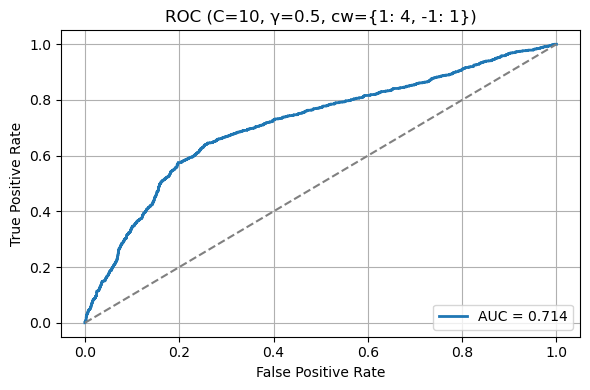

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  751  1775  1729  245     0.561      0.303   0.754        0.507  0.432
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15563                      8909   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             439                                      8470   

   All Incorrectly Classified Support Vectors  
0                                        6654  


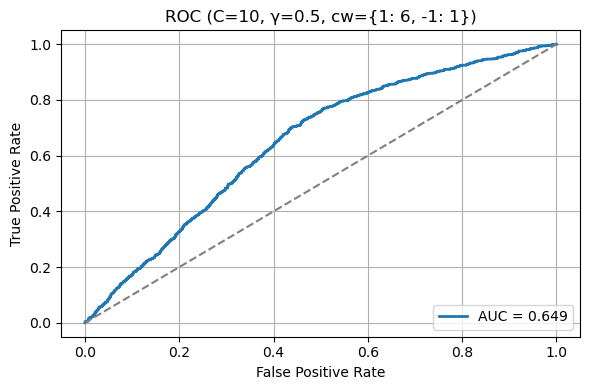

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  344  3321  183  652     0.814      0.653   0.345        0.948  0.452
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8055                      4523   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1571                                      2952   

   All Incorrectly Classified Support Vectors  
0                                        3532  


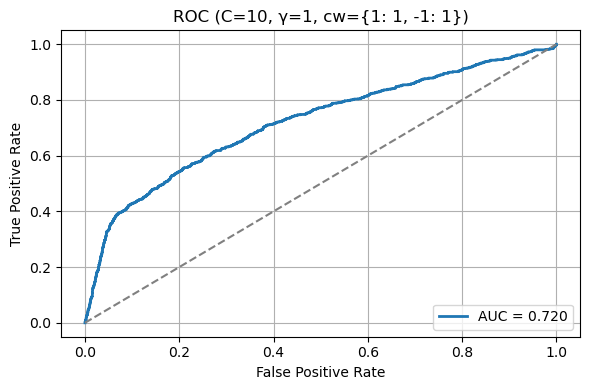

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  554  2878  626  442     0.763      0.469   0.556        0.821  0.509
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9904                      6086   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             945                                      5141   

   All Incorrectly Classified Support Vectors  
0                                        3818  


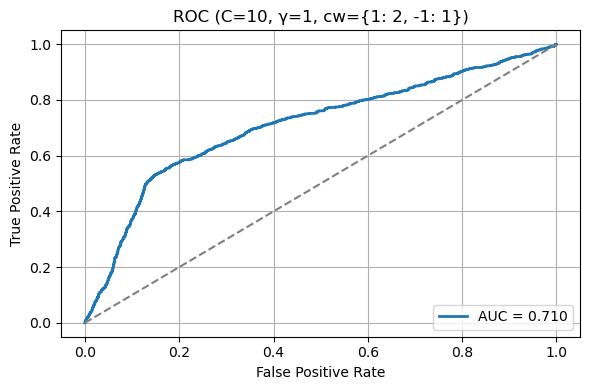

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  726  2010  1494  270     0.608      0.327   0.729        0.574  0.451
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13156                      8505   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             662                                      7843   

   All Incorrectly Classified Support Vectors  
0                                        4651  


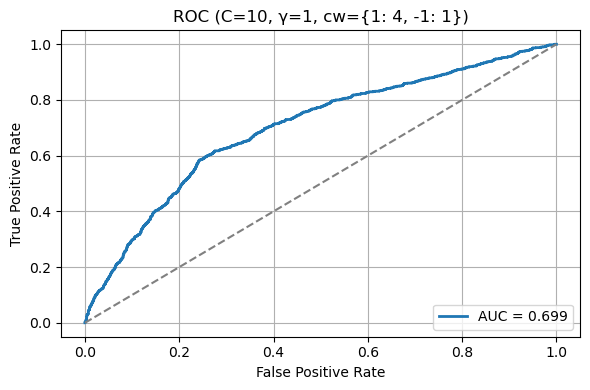

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  758  1613  1891  238     0.527      0.286   0.761         0.46  0.416
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15409                      8673   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             504                                      8169   

   All Incorrectly Classified Support Vectors  
0                                        6736  


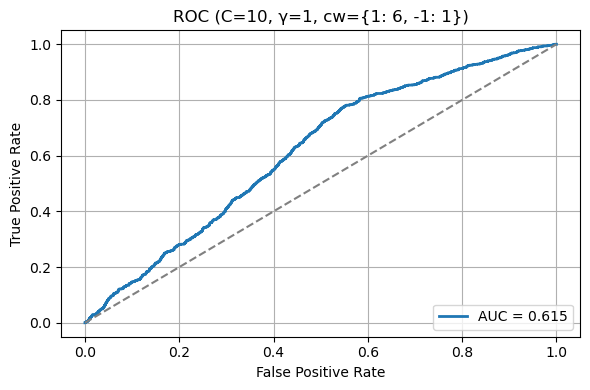

In [219]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Evaluation
C_values = [0.01, 0.1, 1, 10]
gamma_values = [0.01, 0.1, 0.5, 1]
class_weight_options = [{1:1, -1:1}, {1:2, -1:1}, {1:4, -1:1}, {1:6, -1:1}]

for C in C_values:
    for gamma in gamma_values:
        for cw in class_weight_options:
            cw_str = str(cw)

            key = (C, gamma, cw_str)
            if key not in trained_models_weighted_svm_quadratic_kernel:
                print(f"Model not found for C={C}, gamma={gamma}, class_weight={cw_str}")
                continue
            
            print("-" * 100)
            print(f"\nEvaluating model with C = {C}, gamma = {gamma}, class_weight = {cw_str}")
            
            model_info = trained_models_weighted_svm_quadratic_kernel[key]
            model = model_info["model"]
            
            val_decision = model.decision_function(X_SVM_val)
            y_val_pred = np.sign(val_decision)
            
            evaluationresults = []
            supportvectorsresults = []
            
            # Evaluation Metrics
            TP = np.sum((y_SVM_val == 1) & (y_val_pred == 1))
            TN = np.sum((y_SVM_val == -1) & (y_val_pred == -1))
            FP = np.sum((y_SVM_val == -1) & (y_val_pred == 1))
            FN = np.sum((y_SVM_val == 1) & (y_val_pred == -1))

            Accuracy = (TP + TN) / len(y_SVM_val)
            Precision = TP / (TP + FP) if (TP + FP) > 0 else 0
            Recall = TP / (TP + FN) if (TP + FN) > 0 else 0
            Specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
            F1 = 2 * (Precision * Recall) / (Precision + Recall) if (Precision + Recall) > 0 else 0

            evaluationresults.append({
                "TP": TP,
                "TN": TN,
                "FP": FP,
                "FN": FN,
                "Accuracy": Accuracy,
                "Precision": Precision,
                "Recall": Recall,
                "Specificity": Specificity,
                "F1": F1,
            })
            
            # Support Vectors
            support_indices = model.support_
            dual_coefs = model.dual_coef_[0]
            y_support = y_SVM_train.to_numpy()[support_indices]

            influence = dual_coefs * y_support
            ind_on_margin_correct = np.where(influence < C)[0]
            indcloseincorrect = np.where(influence == C)[0]

            SV_decision = model.decision_function(
                pd.DataFrame(model.support_vectors_, columns=X_SVM_train.columns)
            )
            y_SV_pred = np.sign(SV_decision)
            true_support_labels = y_SVM_train.to_numpy()[support_indices]

            ind_all_correct = np.where(y_SV_pred == true_support_labels)[0]
            ind_all_incorrect = np.where(y_SV_pred != true_support_labels)[0]
            ind_close_correct = np.setdiff1d(ind_all_correct, ind_on_margin_correct)

            supportvectorsresults.append({
                "Total Number of Support Vectors": len(support_indices),
                "All Correctly Classified": len(ind_all_correct),
                "Correctly Classified on Margin": len(ind_on_margin_correct),
                "Correctly Classified but Close to Margin": len(ind_close_correct),
                "All Incorrectly Classified Support Vectors": len(ind_all_incorrect)
            })

            # Print metrics
            df_evaluationresults = pd.DataFrame(evaluationresults)
            print("\nEvaluation Metrics on the Validation Set:")
            print(df_evaluationresults.round(3))

            print("-" * 50)

            df_supportvectorsresults = pd.DataFrame(supportvectorsresults)
            print("\nSupport Vectors Type:")
            print(df_supportvectorsresults.round(3))

            # Plot ROC Curve
            fpr, tpr, _ = roc_curve(y_SVM_val, val_decision, pos_label=1)
            roc_auc = auc(fpr, tpr)

            plt.figure(figsize=(6, 4))
            plt.plot(fpr, tpr, lw=2, label=f"AUC = {roc_auc:.3f}")
            plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
            plt.title(f"ROC (C={C}, γ={gamma}, cw={cw_str})")
            plt.xlabel("False Positive Rate")
            plt.ylabel("True Positive Rate")
            plt.legend(loc="lower right")
            plt.grid(True)
            plt.tight_layout()
            plt.show()


### Results (Quadratic Kernel)
Now, we can make decision on the value of hyper parameters and class weight ratios.

In the following tables, we ignored those models with the lowest values for **F1 Scores**. We only look at the model with the highest values for **F1 Score** as well as the basic model of equivalent ratio between the classes. As it can be seen from the results, we can increase the **Class Weight Ratio** as much as we want to increase the **Recall** and make the **FN** predictions to zero, but this happens at the cost of loosing precision and ending up with the high value for **FP**. **F1 Score** compromise between **Precision** and **Recall**. Increasing the value of **Recall** increases the value of **F1** score first, but it has a peak, and after that increase in the value of **Recall** makes the **F1 Score** decrease. This is why **F1 Score** is an important metric for picking a model. Therefore, ignoring those models with the lowest value for **F1 Score** seems reasonable. For those models with the same evaluation metrics, we choose the one with the fewer **Support Vectors** as it is the simpler model and more generalized model. Finally, the ROC curve was considered (which computes true positive rate vs. false positive rate at various thresholds) and auc (for the area under the curve).


<br>

<div style="overflow-x:auto">

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 0.01 | 0.01 | 1   |0.44  |0   |996 |0.00    |0.00|0.50    |0.00    |1.00    |0.50    |9290  |0.70   |
| 0.01 | 0.1  | 1   |0.40  |81  |831 |0.17    |0.27|0.56    |0.04    |0.96    |0.44    |9355  |0.74   |
| 0.01 | 0.5  | 1   |0.37  |165 |660 |0.34    |0.45|0.58    |0.33    |0.67    |0.42    |8783  |0.69   |
| 0.01 | 0.5  | 4   |0.48  |665 |401 |0.60    |0.53|0.66    |0.05    |0.95    |0.34    |13849 |0.74   |
| 0.01 | 1    | 1   |0.37  |171 |654 |0.34    |0.45|0.57    |0.49    |0.51    |0.43    |9281  |0.72   |
| 0.01 | 1    | 4   |0.49  |661 |401 |0.60    |0.53|0.64    |0.06    |0.94    |0.36    |13642 |0.75   |

<br><br>
    
| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 0.1  | 0.01 | 1   |0.44  |0   |996 |0.00    |0.00|0.50    |0.00    |1.00    |0.50    |9292  |0.72   |
| 0.1  | 0.1  | 1   |0.37  |134 |684 |0.31    |0.43|0.57    |0.21    |0.79    |0.43    |8656  |0.69   |
| 0.1  | 0.1  | 4   |0.48  |644 |409 |0.59    |0.53|0.66    |0.03    |0.97    |0.34    |14118 |0.74   |
| 0.1  | 0.5  | 1   |0.37  |181 |653 |0.34    |0.45|0.61    |0.55    |0.45    |0.39    |9482  |0.72   |
| 0.1  | 0.5  | 4   |0.49  |663 |403 |0.60    |0.53|0.64    |0.06    |0.94    |0.36    |13519 |0.74   |
| 0.1  | 1    | 1   |0.37  |185 |648 |0.35    |0.46|0.63    |0.61    |0.39    |0.37    |9819  |0.73   |
    
<br><br>    

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 1    | 0.01 | 1   |0.40  |81  |831 |0.31    |0.43|0.56    |0.04    |0.96    |0.44    |8671  |0.74   |
| 1    | 0.1  | 1   |0.37  |171 |654 |0.34    |0.45|0.61    |0.49    |0.51    |0.39    |9267  |0.72   |
| 1    | 0.1  | 4   |0.49  |661 |401 |0.60    |0.53|0.64    |0.06    |0.94    |0.36    |13626 |0.75   |
| 1    | 0.5  | 1   |0.38  |182 |649 |0.35    |0.46|0.63    |0.62    |0.38    |0.37    |9758  |0.73   |
| 1    | 1    | 1   |0.38  |182 |654 |0.34    |0.45|0.61    |0.53    |0.47    |0.39    |9019  |0.73   |
 
<br><br>    

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 10   | 0.01 | 1   |0.37  |134 |684 |0.17    |0.27|0.57    |0.21    |0.79    |0.43    |9359  |0.69   |
| 10   | 0.01 | 4   |0.48  |644 |409 |0.59    |0.53|0.66    |0.03    |0.97    |0.34    |14105 |0.74   |
| 10   | 0.1  | 1   |0.37  |185 |648 |0.35    |0.46|0.63    |0.60    |0.40    |0.37    |9749  |0.73   |
| 10   | 0.5  | 1   |0.39  |181 |655 |0.34    |0.45|0.59    |0.46    |0.54    |0.41    |8566  |0.72   |
| 10   | 1    | 1   |0.40  |183 |652 |0.35    |0.45|0.56    |0.35    |0.65    |0.44    |8055  |0.72   |

<br><br>
    
We can see that the best values for **F1** Score and **Recall** happen in the following models:

- **$C = 0.01$**, **$\gamma = 0.50$**, **CWR = 4**
- **$C = 0.01$**, **$\gamma = 1.00$**, **CWR = 4**
- **$C = 0.10$**, **$\gamma = 0.50$**, **CWR = 4**
- **$C = 1.00$**, **$\gamma = 0.10$**, **CWR = 4**


    
Among these models, we choose **$C = 0.10$**, **$\gamma = 0.50$**, **CWR = 4** model as our final model since it has the overall better performance on the following parameters:
- **$NSV = 13519$**
- **$FN = 403$**
- **$CCSVR = 0.64$**
- **$ROC = 0.74$**

### Cubic Kernel

In [55]:
from sklearn.svm import SVC
from sklearn.metrics import hinge_loss

C_values = [0.01, 0.1, 1, 10]
gamma_values = [0.01, 0.1, 0.5, 1]
class_weight_options = [{1:1, -1:1}, {1:2, -1:1}, {1:4, -1:1},  {1:6, -1:1}]

trained_models_weighted_svm_cubic_kernel = {}

for C in C_values:
    
    for gamma in gamma_values:
        
        for cw in class_weight_options:
            
            print("-" * 50)
            print(f"Training SVM model with Cubic Kernel C = {C}, gamma = {gamma}, and class_weight = {cw}")

            model_svm_cubic_kernel = SVC(kernel = 'poly', degree = 3, C = C, gamma = gamma, class_weight = cw)

            model_svm_cubic_kernel.fit(X_SVM_train, y_SVM_train)

            train_decision = model_svm_cubic_kernel.decision_function(X_SVM_train)
            val_decision = model_svm_cubic_kernel.decision_function(X_SVM_val)

            # Compute hinge loss
            train_loss = hinge_loss(y_SVM_train, train_decision)
            val_loss = hinge_loss(y_SVM_val, val_decision)

            print(f"Train Hinge Loss: {train_loss:.4f}")
            print(f"Validation Hinge Loss: {val_loss:.4f}")
            
            cw_str = str(cw)
            trained_models_weighted_svm_cubic_kernel[(C, gamma, cw_str)] = {
                "model": model_svm_cubic_kernel,
                "train_losses": train_loss,
                "val_losses": val_loss
            }

print("-" * 50)
print("All SVM models have been trained and stored.")

--------------------------------------------------
Training SVM model with Cubic Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 1, -1: 1}
Train Hinge Loss: 0.4424
Validation Hinge Loss: 0.4426
--------------------------------------------------
Training SVM model with Cubic Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 2, -1: 1}
Train Hinge Loss: 0.4424
Validation Hinge Loss: 0.4427
--------------------------------------------------
Training SVM model with Cubic Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 4, -1: 1}
Train Hinge Loss: 1.5525
Validation Hinge Loss: 1.5523
--------------------------------------------------
Training SVM model with Cubic Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 6, -1: 1}
Train Hinge Loss: 1.5563
Validation Hinge Loss: 1.5560
--------------------------------------------------
Training SVM model with Cubic Kernel C = 0.01, gamma = 0.1, and class_weight = {1: 1, -1: 1}
Train Hinge Loss: 0.4072
Validation Hinge Loss: 0.4116
-

### Evaluation Process (Cubic Kernel)

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9290                      4645   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               0                                      4645   

   All Incorrectly Classified Support Vectors  
0                                        4645  


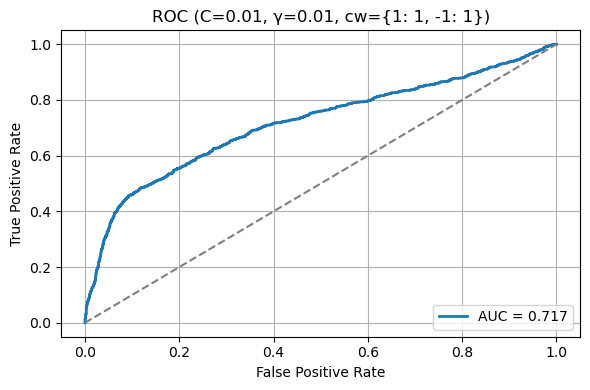

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13935                      9290   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               0                                      9290   

   All Incorrectly Classified Support Vectors  
0                                        4645  


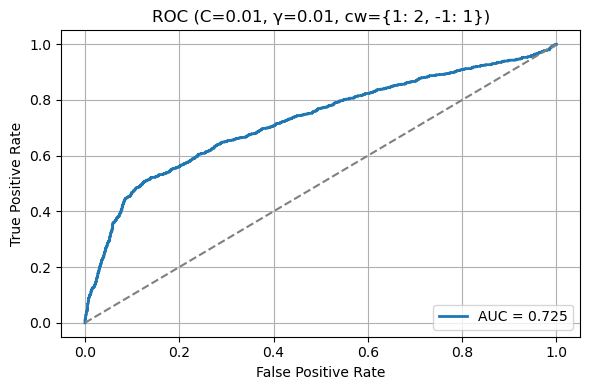

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP  TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  996   0  3504   0     0.221      0.221     1.0          0.0  0.362
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            20485                      4130   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               1                                      4129   

   All Incorrectly Classified Support Vectors  
0                                       16355  


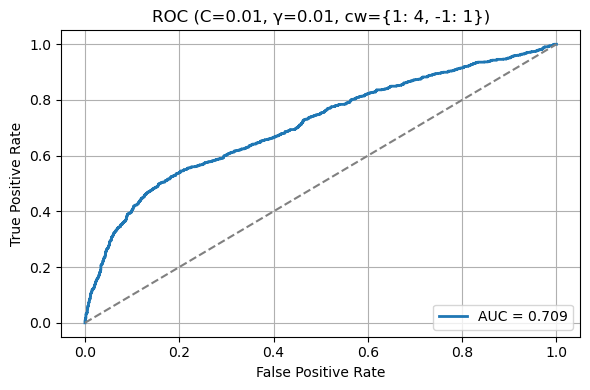

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP  TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  996   0  3504   0     0.221      0.221     1.0          0.0  0.362
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            19707                      3352   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              10                                      3342   

   All Incorrectly Classified Support Vectors  
0                                       16355  


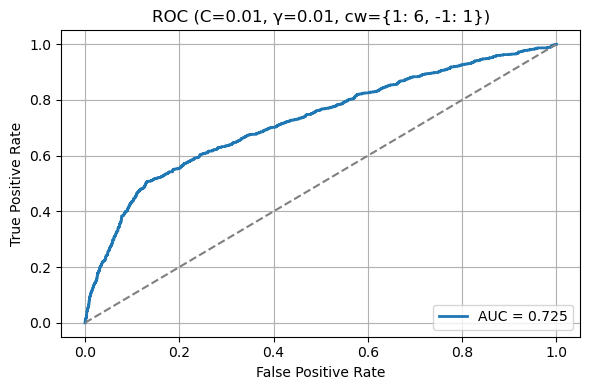

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  87  3475  29  909     0.792       0.75   0.087        0.992  0.156
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9484                      5133   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             372                                      4761   

   All Incorrectly Classified Support Vectors  
0                                        4351  


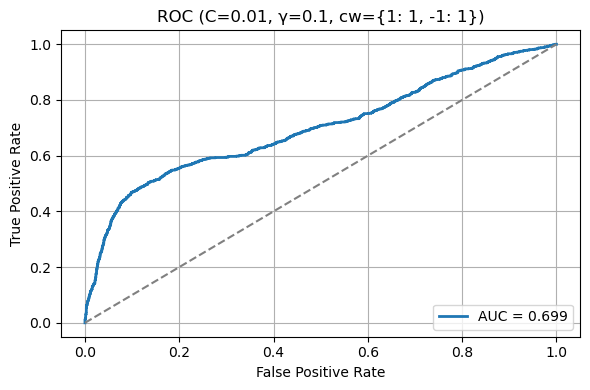

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  397  3239  265  599     0.808        0.6   0.399        0.924  0.479
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            12721                      8799   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             138                                      8661   

   All Incorrectly Classified Support Vectors  
0                                        3922  


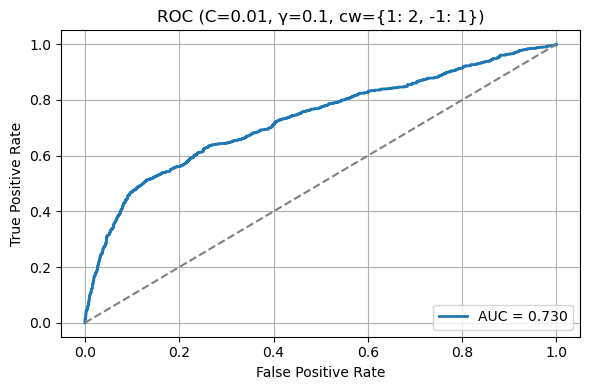

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  572  2869  635  424     0.765      0.474   0.574        0.819  0.519
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16783                     11978   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              48                                     11930   

   All Incorrectly Classified Support Vectors  
0                                        4805  


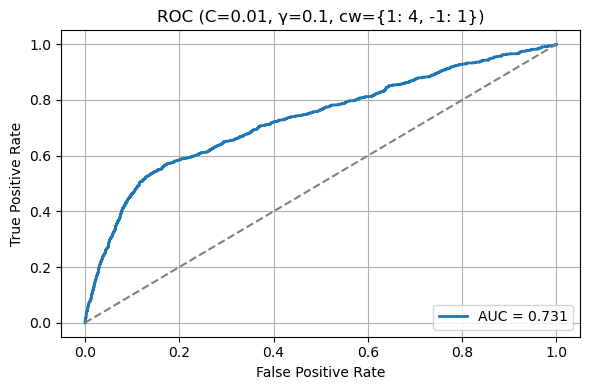

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  798  1529  1975  198     0.517      0.288   0.801        0.436  0.423
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            18240                      8233   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              38                                      8195   

   All Incorrectly Classified Support Vectors  
0                                       10007  


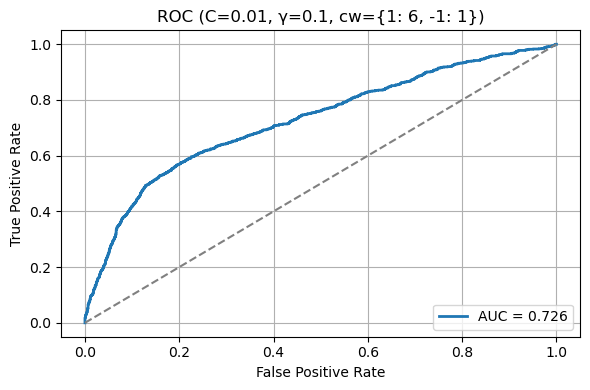

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  346  3333  171  650     0.818      0.669   0.347        0.951  0.457
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8834                      5220   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2242                                      2978   

   All Incorrectly Classified Support Vectors  
0                                        3614  


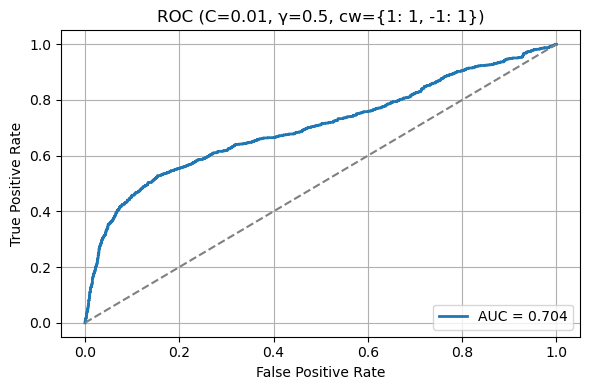

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  492  3120  384  504     0.803      0.562   0.494         0.89  0.526
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10613                      6731   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1524                                      5207   

   All Incorrectly Classified Support Vectors  
0                                        3882  


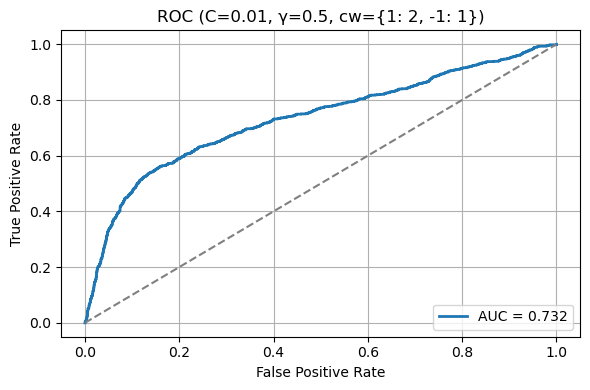

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  598  2775  729  398      0.75      0.451     0.6        0.792  0.515
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13672                      8791   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             733                                      8058   

   All Incorrectly Classified Support Vectors  
0                                        4881  


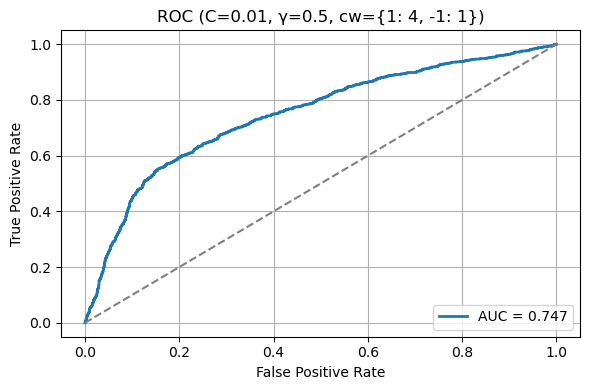

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  676  2417  1087  320     0.687      0.383   0.679         0.69  0.49
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16131                      9404   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             394                                      9010   

   All Incorrectly Classified Support Vectors  
0                                        6727  


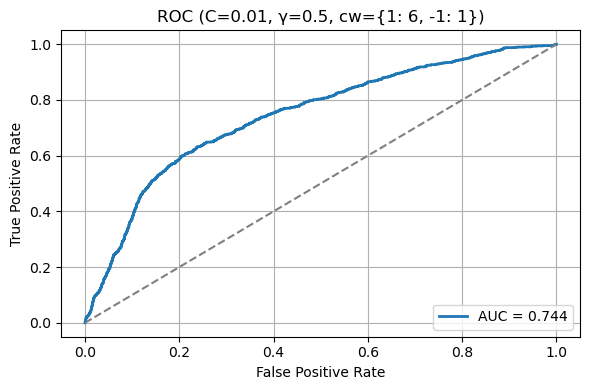

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  354  3330  174  642     0.819       0.67   0.355         0.95  0.465
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8592                      5159   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2355                                      2804   

   All Incorrectly Classified Support Vectors  
0                                        3433  


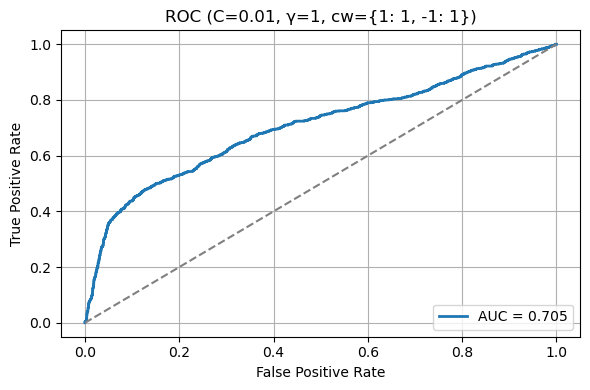

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  464  3143  361  532     0.802      0.562   0.466        0.897  0.51
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10287                      6760   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1645                                      5115   

   All Incorrectly Classified Support Vectors  
0                                        3527  


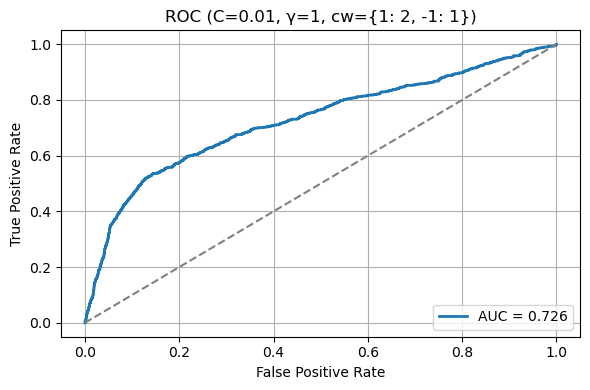

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  577  2793  711  419     0.749      0.448   0.579        0.797  0.505
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13299                      8886   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1033                                      7853   

   All Incorrectly Classified Support Vectors  
0                                        4413  


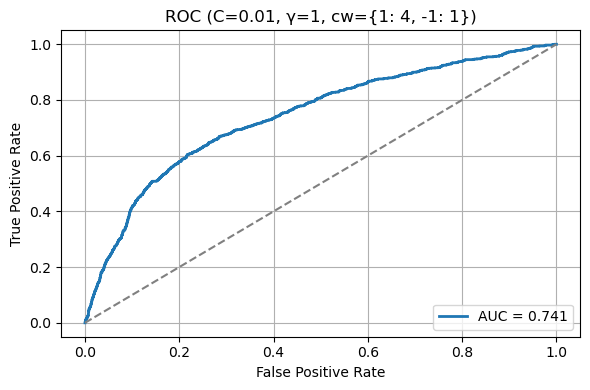

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  647  2423  1081  349     0.682      0.374    0.65        0.691  0.475
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15502                      8742   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             790                                      7952   

   All Incorrectly Classified Support Vectors  
0                                        6760  


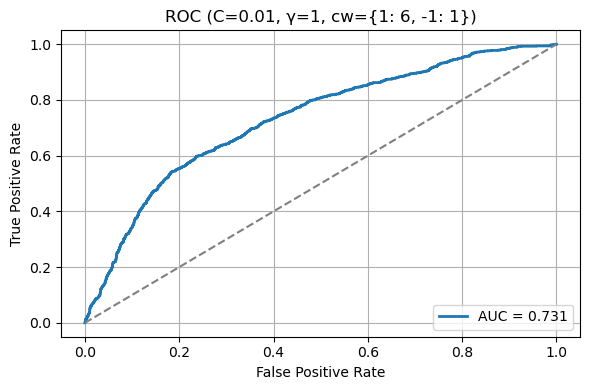

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9290                      4645   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               0                                      4645   

   All Incorrectly Classified Support Vectors  
0                                        4645  


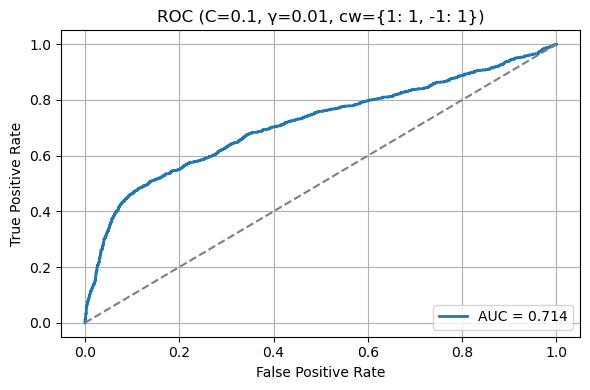

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13935                      9290   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               0                                      9290   

   All Incorrectly Classified Support Vectors  
0                                        4645  


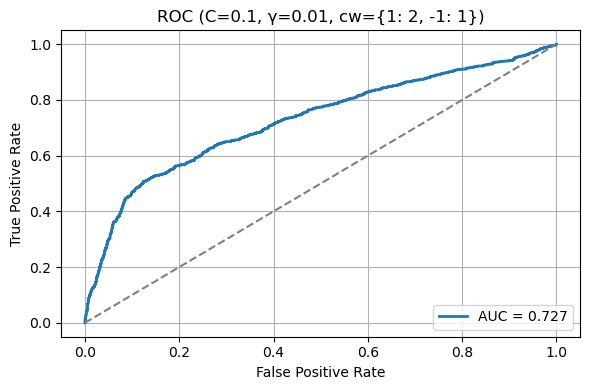

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP  TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  996   0  3504   0     0.221      0.221     1.0          0.0  0.362
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            20452                      4097   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               1                                      4096   

   All Incorrectly Classified Support Vectors  
0                                       16355  


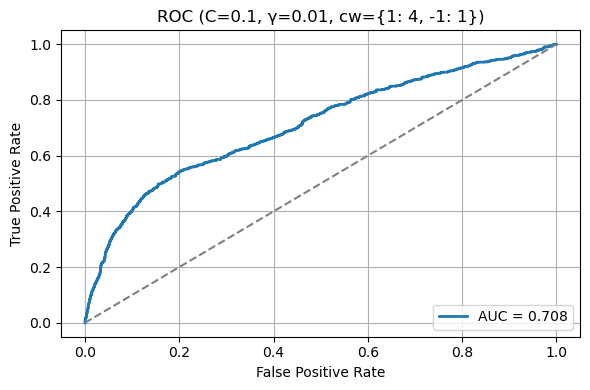

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP  TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  996   0  3504   0     0.221      0.221     1.0          0.0  0.362
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            19380                      3025   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              12                                      3013   

   All Incorrectly Classified Support Vectors  
0                                       16355  


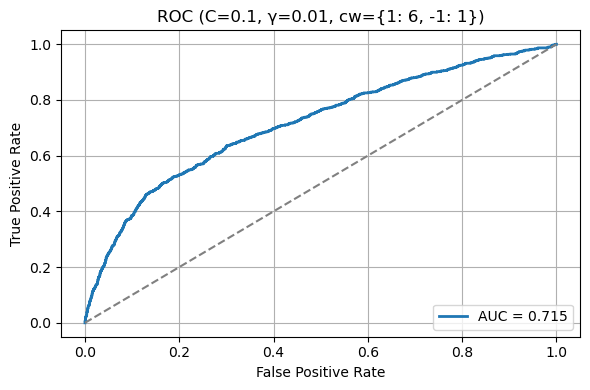

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  318  3351  153  678     0.815      0.675   0.319        0.956  0.434
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8905                      5182   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1111                                      4071   

   All Incorrectly Classified Support Vectors  
0                                        3723  


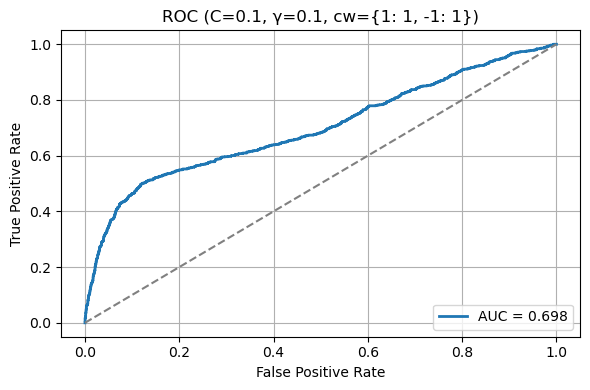

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  449  3187  317  547     0.808      0.586   0.451         0.91  0.51
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10918                      7023   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             732                                      6291   

   All Incorrectly Classified Support Vectors  
0                                        3895  


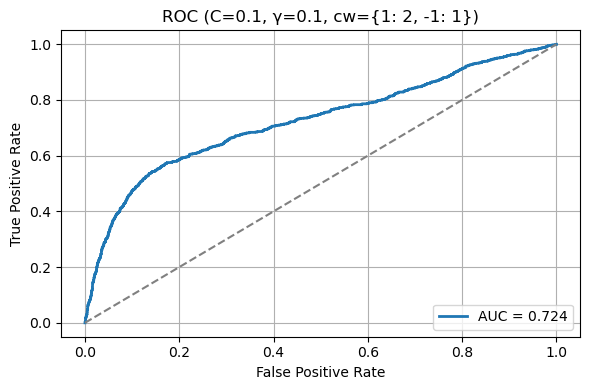

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  602  2816  688  394      0.76      0.467   0.604        0.804  0.527
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14314                      9351   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             373                                      8978   

   All Incorrectly Classified Support Vectors  
0                                        4963  


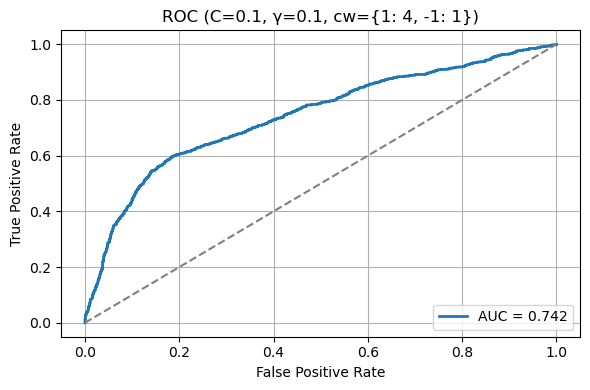

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  713  2163  1341  283     0.639      0.347   0.716        0.617  0.468
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16954                      9373   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             141                                      9232   

   All Incorrectly Classified Support Vectors  
0                                        7581  


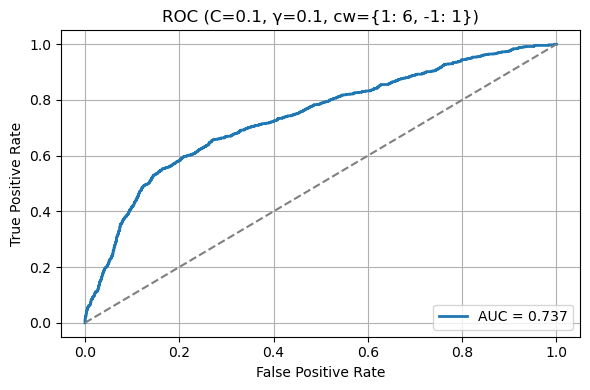

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  355  3330  174  641     0.819      0.671   0.356         0.95  0.466
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8587                      5176   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2379                                      2797   

   All Incorrectly Classified Support Vectors  
0                                        3411  


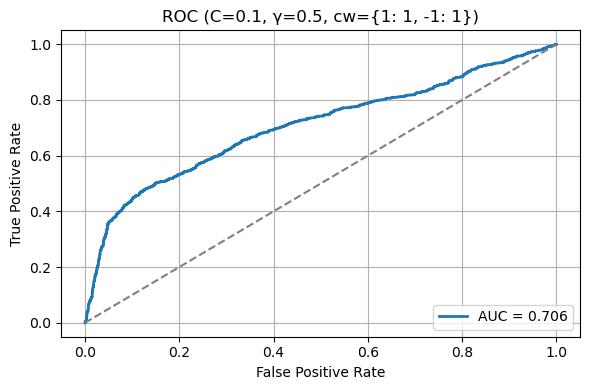

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  462  3147  357  534     0.802      0.564   0.464        0.898  0.509
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10267                      6752   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1695                                      5057   

   All Incorrectly Classified Support Vectors  
0                                        3515  


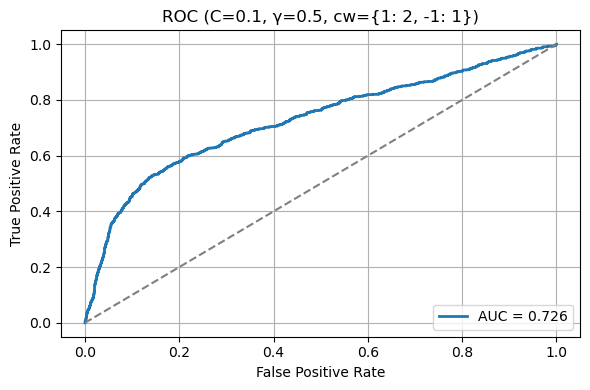

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  578  2791  713  418     0.749      0.448    0.58        0.797  0.505
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13251                      8872   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1071                                      7801   

   All Incorrectly Classified Support Vectors  
0                                        4379  


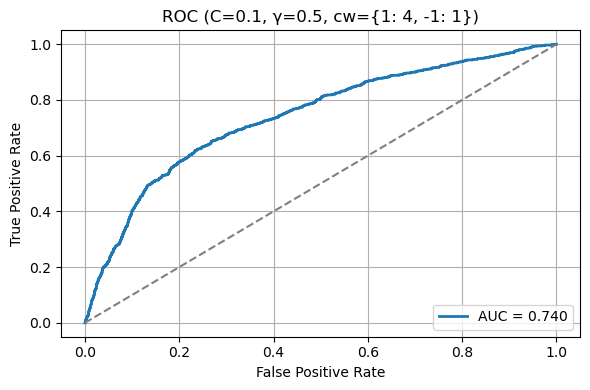

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  646  2394  1110  350     0.676      0.368   0.649        0.683  0.469
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15409                      8717   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             832                                      7885   

   All Incorrectly Classified Support Vectors  
0                                        6692  


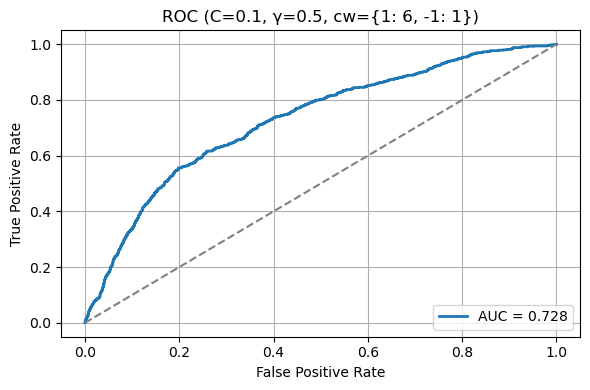

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  369  3273  231  627     0.809      0.615    0.37        0.934  0.462
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8299                      5110   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2446                                      2664   

   All Incorrectly Classified Support Vectors  
0                                        3189  


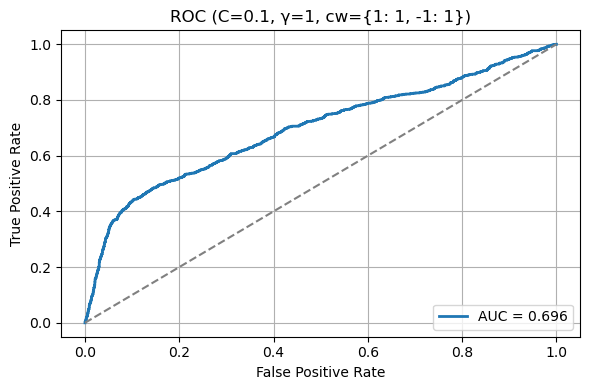

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  464  3081  423  532     0.788      0.523   0.466        0.879  0.493
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10034                      6750   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2027                                      4723   

   All Incorrectly Classified Support Vectors  
0                                        3284  


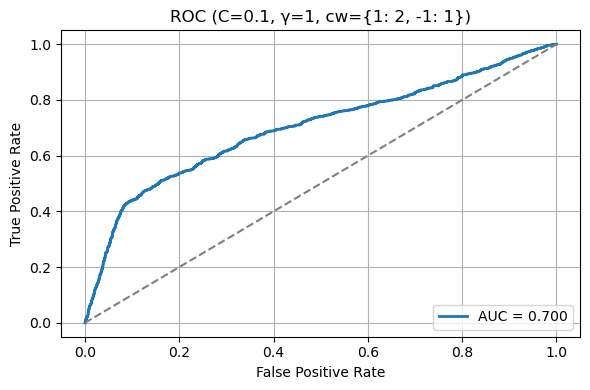

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  636  2427  1077  360     0.681      0.371   0.639        0.693  0.47
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            12818                      8689   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1571                                      7118   

   All Incorrectly Classified Support Vectors  
0                                        4129  


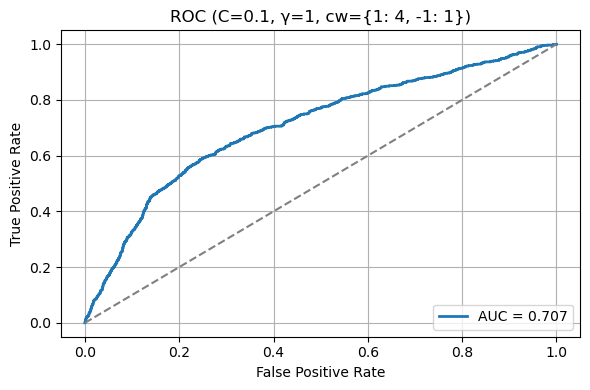

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  691  2111  1393  305     0.623      0.332   0.694        0.602  0.449
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14662                      8392   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1298                                      7094   

   All Incorrectly Classified Support Vectors  
0                                        6270  


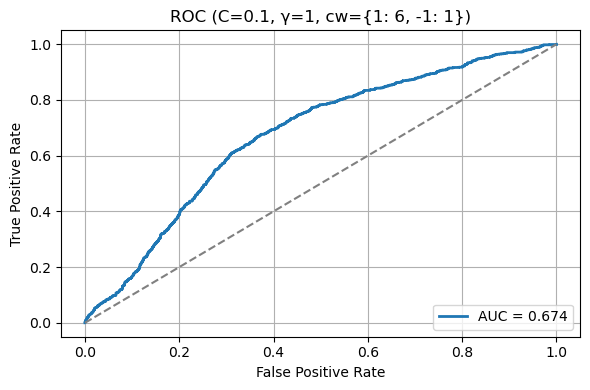

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9302                      4657   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              24                                      4633   

   All Incorrectly Classified Support Vectors  
0                                        4645  


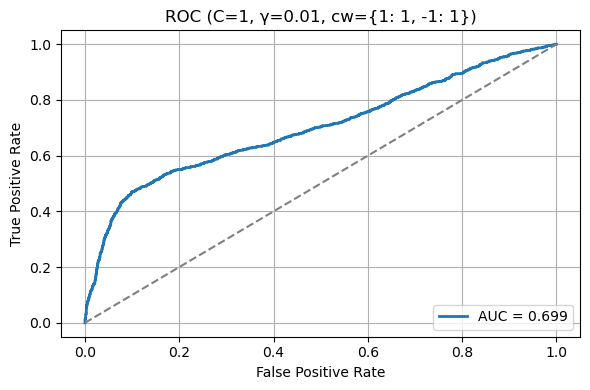

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13939                      9294   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               8                                      9286   

   All Incorrectly Classified Support Vectors  
0                                        4645  


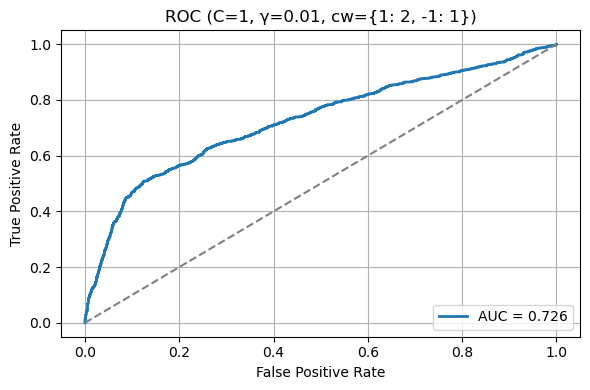

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  825  1350  2154  171     0.483      0.277   0.828        0.385  0.415
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            20447                      9787   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               0                                      9787   

   All Incorrectly Classified Support Vectors  
0                                       10660  


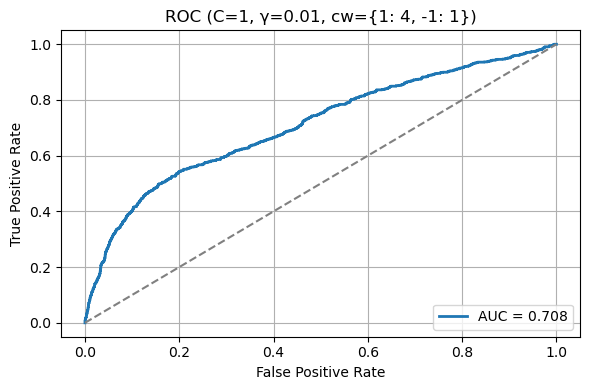

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP  TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  996   0  3504   0     0.221      0.221     1.0          0.0  0.362
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            19183                      2828   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              12                                      2816   

   All Incorrectly Classified Support Vectors  
0                                       16355  


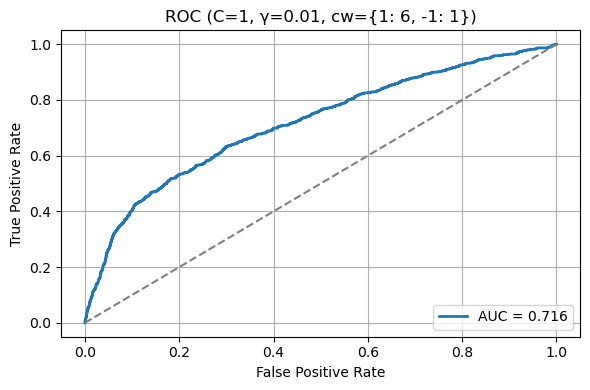

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  346  3335  169  650     0.818      0.672   0.347        0.952  0.458
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8880                      5258   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2234                                      3024   

   All Incorrectly Classified Support Vectors  
0                                        3622  


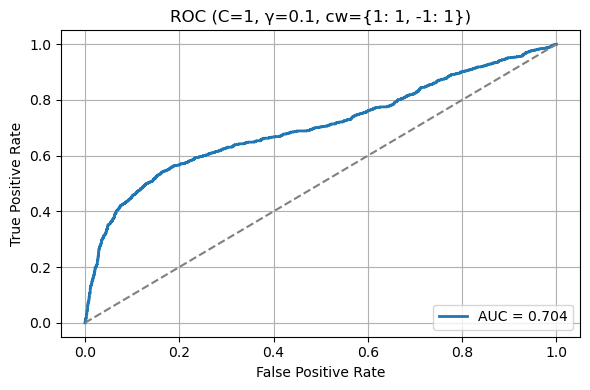

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  500  3114  390  496     0.803      0.562   0.502        0.889  0.53
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10624                      6678   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1498                                      5180   

   All Incorrectly Classified Support Vectors  
0                                        3946  


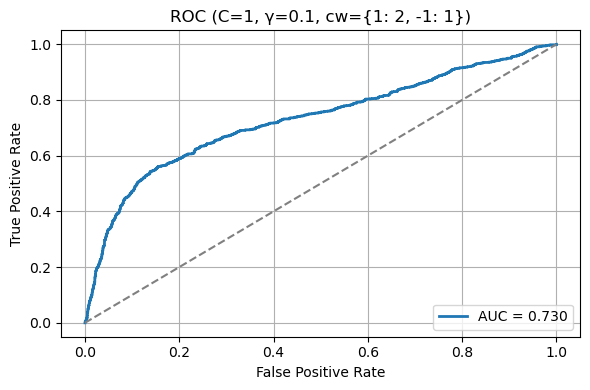

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  599  2767  737  397     0.748      0.448   0.601         0.79  0.514
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13695                      8773   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             695                                      8078   

   All Incorrectly Classified Support Vectors  
0                                        4922  


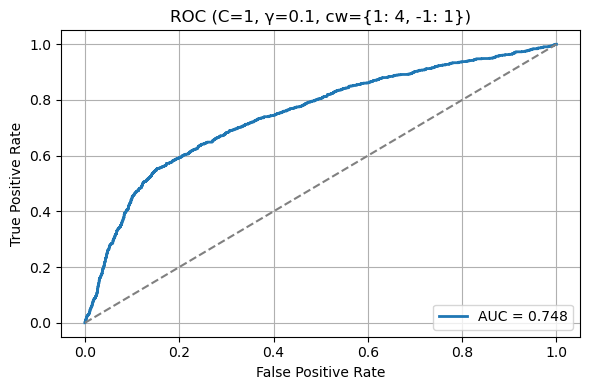

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  685  2402  1102  311     0.686      0.383   0.688        0.686  0.492
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16181                      9455   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             343                                      9112   

   All Incorrectly Classified Support Vectors  
0                                        6726  


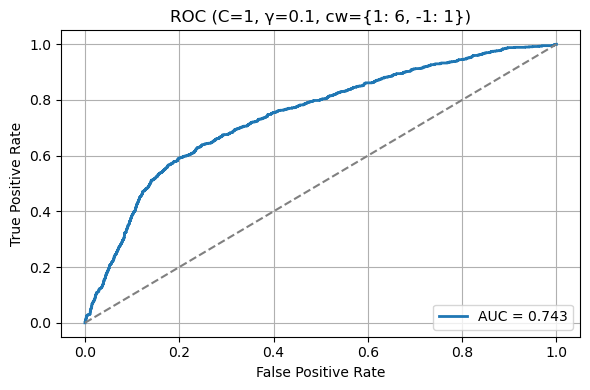

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  373  3269  235  623     0.809      0.613   0.374        0.933  0.465
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8242                      5080   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2469                                      2611   

   All Incorrectly Classified Support Vectors  
0                                        3162  


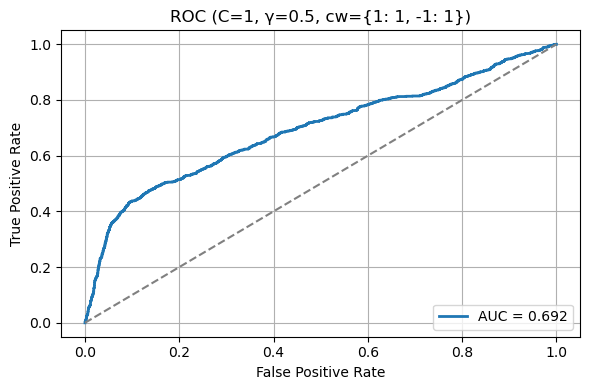

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  466  3070  434  530     0.786      0.518   0.468        0.876  0.492
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9993                      6727   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2057                                      4670   

   All Incorrectly Classified Support Vectors  
0                                        3266  


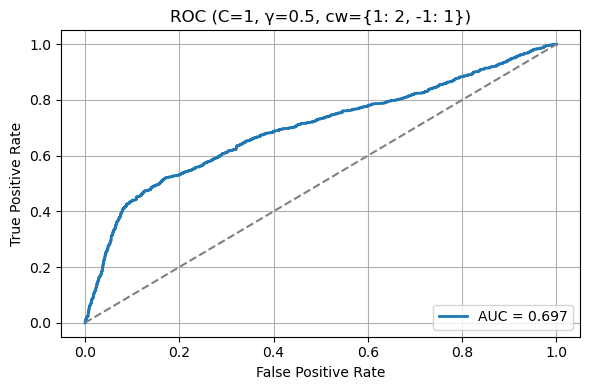

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  647  2376  1128  349     0.672      0.365    0.65        0.678  0.467
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            12758                      8646   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1612                                      7034   

   All Incorrectly Classified Support Vectors  
0                                        4112  


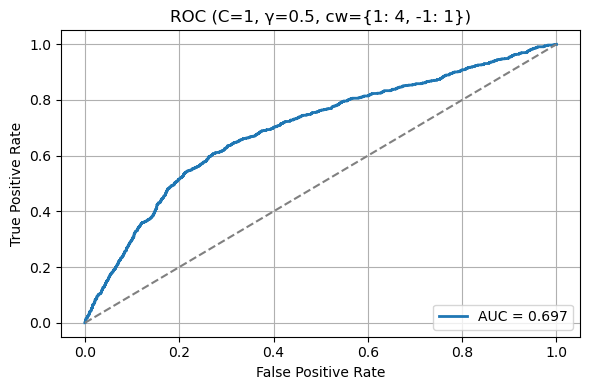

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  696  2065  1439  300     0.614      0.326   0.699        0.589  0.445
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14573                      8362   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1347                                      7015   

   All Incorrectly Classified Support Vectors  
0                                        6211  


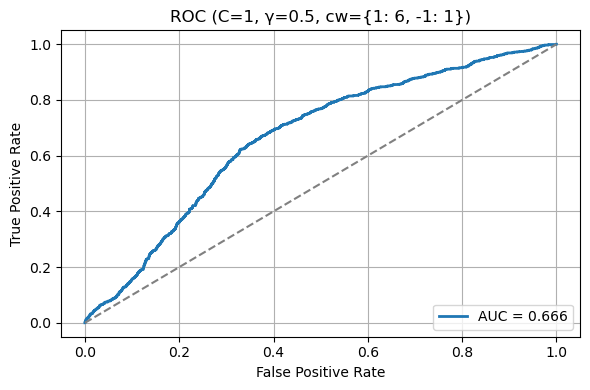

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  422  3057  447  574     0.773      0.486   0.424        0.872  0.453
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8221                      5253   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2825                                      2428   

   All Incorrectly Classified Support Vectors  
0                                        2968  


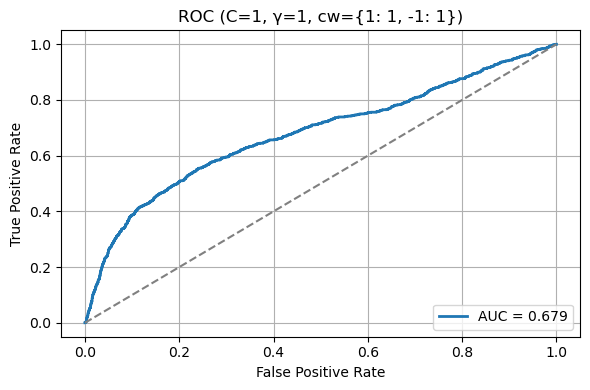

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  514  2748  756  482     0.725      0.405   0.516        0.784  0.454
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9773                      6762   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2397                                      4365   

   All Incorrectly Classified Support Vectors  
0                                        3011  


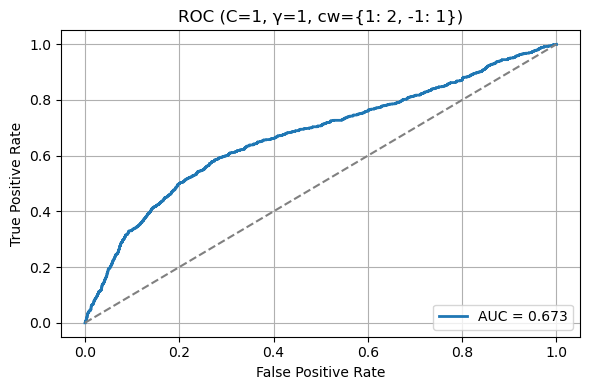

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  590  2426  1078  406      0.67      0.354   0.592        0.692  0.443
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            12320                      8460   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2011                                      6449   

   All Incorrectly Classified Support Vectors  
0                                        3860  


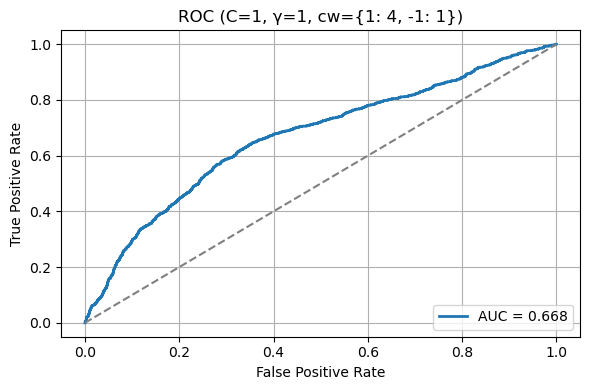

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  698  1848  1656  298     0.566      0.297   0.701        0.527  0.417
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13880                      8070   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1745                                      6325   

   All Incorrectly Classified Support Vectors  
0                                        5810  


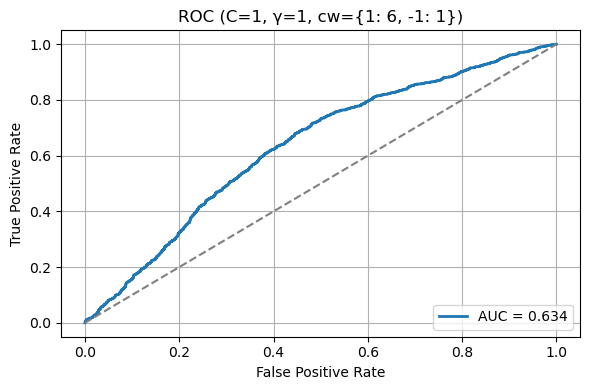

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  87  3475  29  909     0.792       0.75   0.087        0.992  0.156
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9485                      5134   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             375                                      4759   

   All Incorrectly Classified Support Vectors  
0                                        4351  


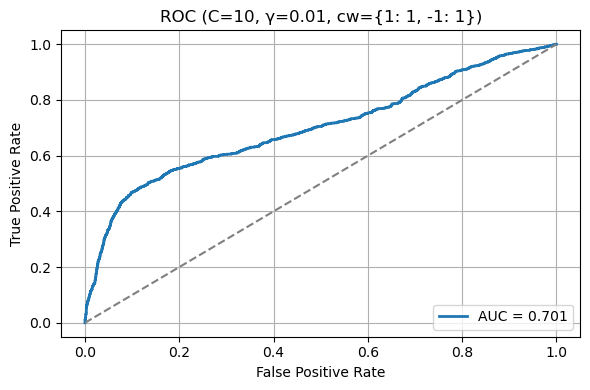

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  397  3239  265  599     0.808        0.6   0.399        0.924  0.479
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            12724                      8802   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             143                                      8659   

   All Incorrectly Classified Support Vectors  
0                                        3922  


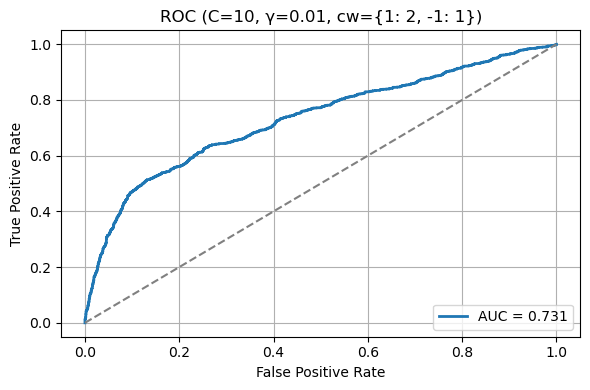

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  572  2869  635  424     0.765      0.474   0.574        0.819  0.519
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16776                     11971   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              33                                     11938   

   All Incorrectly Classified Support Vectors  
0                                        4805  


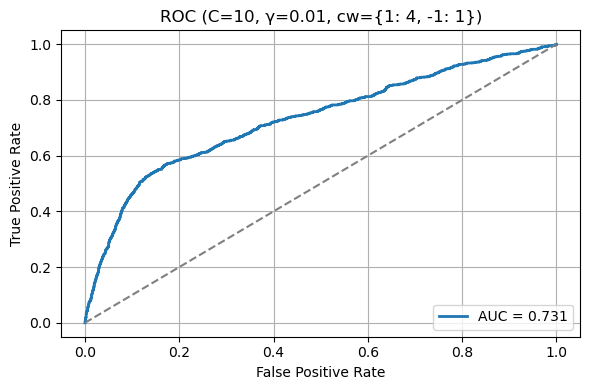

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  798  1529  1975  198     0.517      0.288   0.801        0.436  0.423
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            18237                      8230   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              31                                      8199   

   All Incorrectly Classified Support Vectors  
0                                       10007  


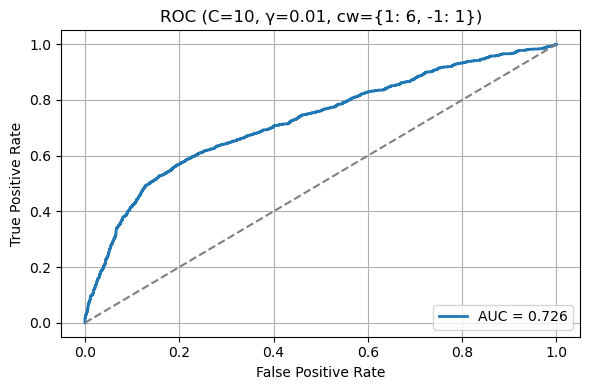

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  354  3330  174  642     0.819       0.67   0.355         0.95  0.465
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8621                      5188   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2376                                      2812   

   All Incorrectly Classified Support Vectors  
0                                        3433  


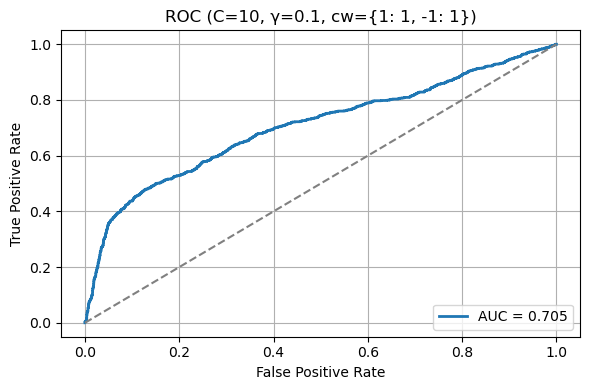

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  464  3143  361  532     0.802      0.562   0.466        0.897  0.51
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10296                      6771   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1660                                      5111   

   All Incorrectly Classified Support Vectors  
0                                        3525  


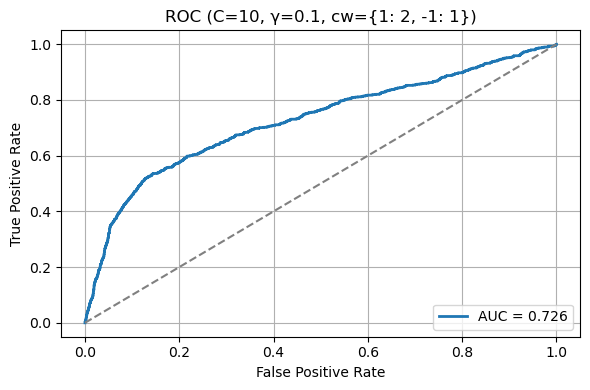

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  577  2793  711  419     0.749      0.448   0.579        0.797  0.505
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13299                      8885   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1034                                      7851   

   All Incorrectly Classified Support Vectors  
0                                        4414  


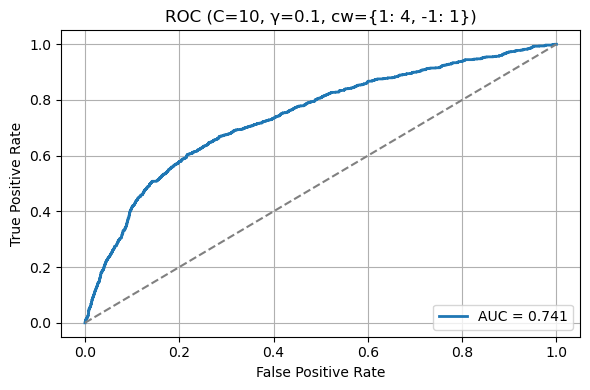

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  647  2423  1081  349     0.682      0.374    0.65        0.691  0.475
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15498                      8734   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             787                                      7947   

   All Incorrectly Classified Support Vectors  
0                                        6764  


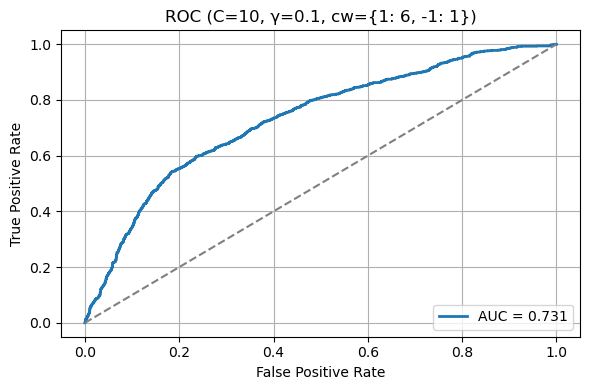

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  435  3006  498  561     0.765      0.466   0.437        0.858  0.451
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8188                      5247   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2844                                      2403   

   All Incorrectly Classified Support Vectors  
0                                        2941  


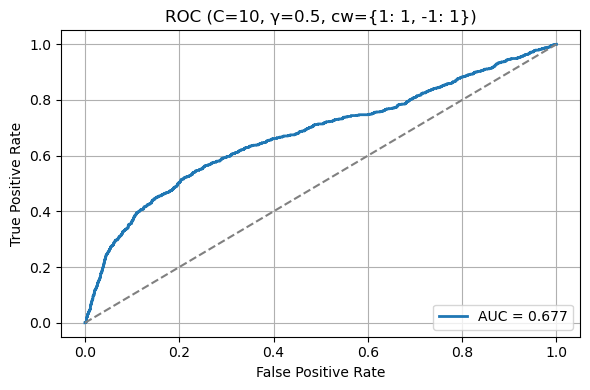

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  502  2719  785  494     0.716       0.39   0.504        0.776  0.44
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9786                      6789   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2461                                      4328   

   All Incorrectly Classified Support Vectors  
0                                        2997  


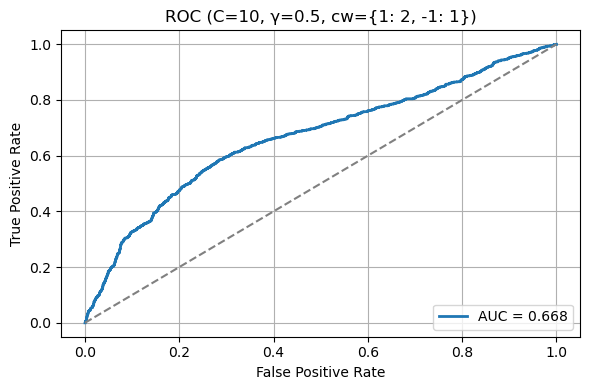

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  582  2415  1089  414     0.666      0.348   0.584        0.689  0.436
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            12283                      8436   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2036                                      6400   

   All Incorrectly Classified Support Vectors  
0                                        3847  


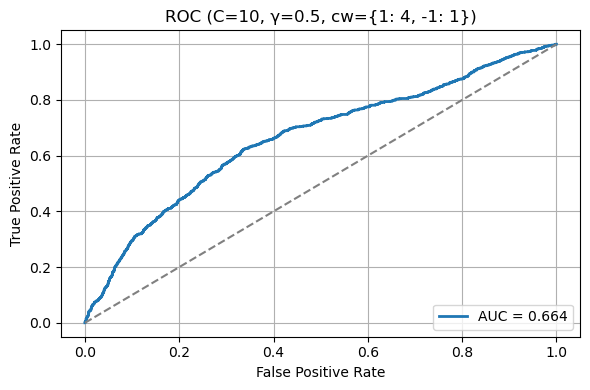

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  698  1823  1681  298      0.56      0.293   0.701         0.52  0.414
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13832                      8044   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1805                                      6239   

   All Incorrectly Classified Support Vectors  
0                                        5788  


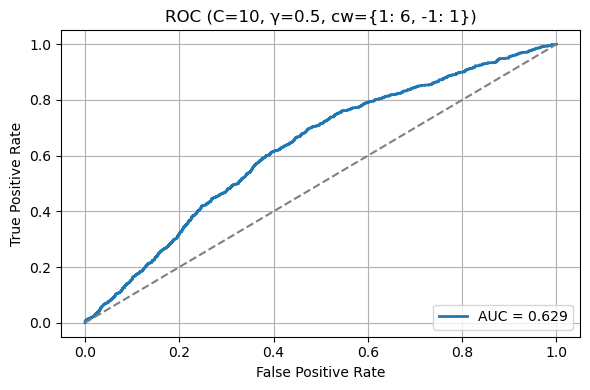

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  486  2602  902  510     0.686       0.35   0.488        0.743  0.408
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8136                      5441   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            3138                                      2303   

   All Incorrectly Classified Support Vectors  
0                                        2695  


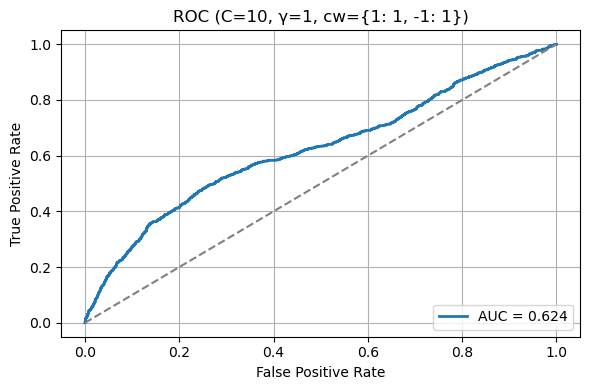

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  557  2410  1094  439     0.659      0.337   0.559        0.688  0.421
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9589                      6828   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2816                                      4012   

   All Incorrectly Classified Support Vectors  
0                                        2761  


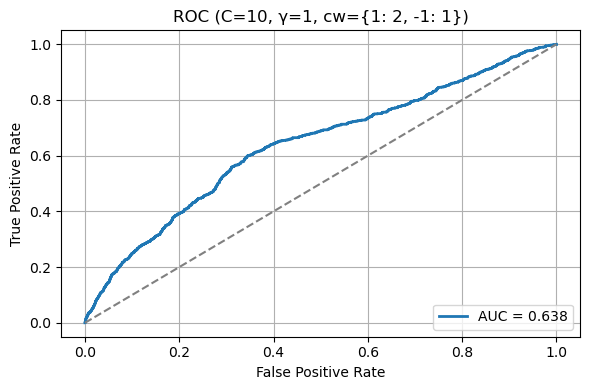

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  609  2090  1414  387       0.6      0.301   0.611        0.596  0.403
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            11857                      8264   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2427                                      5837   

   All Incorrectly Classified Support Vectors  
0                                        3593  


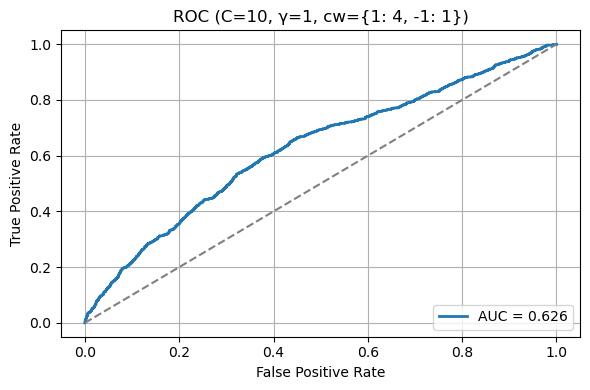

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  677  1848  1656  319     0.561       0.29    0.68        0.527  0.407
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13161                      7933   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2236                                      5697   

   All Incorrectly Classified Support Vectors  
0                                        5228  


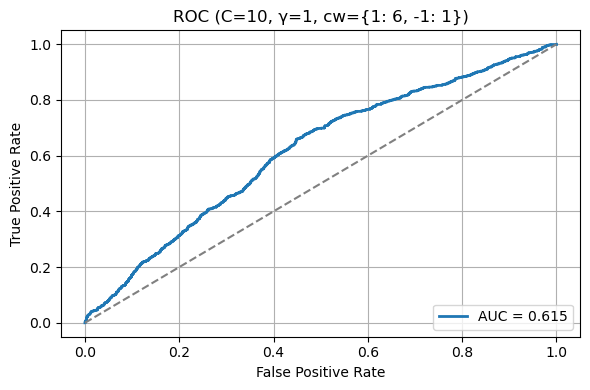

In [224]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Evaluation
C_values = [0.01, 0.1, 1, 10]
gamma_values = [0.01, 0.1, 0.5, 1]
class_weight_options = [{1:1, -1:1}, {1:2, -1:1}, {1:4, -1:1}, {1:6, -1:1}]

for C in C_values:
    for gamma in gamma_values:
        for cw in class_weight_options:
            cw_str = str(cw)

            key = (C, gamma, cw_str)
            if key not in trained_models_weighted_svm_cubic_kernel:
                print(f"Model not found for C={C}, gamma={gamma}, class_weight={cw_str}")
                continue
            
            print("-" * 100)
            print(f"\nEvaluating model with C = {C}, gamma = {gamma}, class_weight = {cw_str}")
            
            model_info = trained_models_weighted_svm_cubic_kernel[key]
            model = model_info["model"]
            
            val_decision = model.decision_function(X_SVM_val)
            y_val_pred = np.sign(val_decision)
            
            evaluationresults = []
            supportvectorsresults = []
            
            # Evaluation Metrics
            TP = np.sum((y_SVM_val == 1) & (y_val_pred == 1))
            TN = np.sum((y_SVM_val == -1) & (y_val_pred == -1))
            FP = np.sum((y_SVM_val == -1) & (y_val_pred == 1))
            FN = np.sum((y_SVM_val == 1) & (y_val_pred == -1))

            Accuracy = (TP + TN) / len(y_SVM_val)
            Precision = TP / (TP + FP) if (TP + FP) > 0 else 0
            Recall = TP / (TP + FN) if (TP + FN) > 0 else 0
            Specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
            F1 = 2 * (Precision * Recall) / (Precision + Recall) if (Precision + Recall) > 0 else 0

            evaluationresults.append({
                "TP": TP,
                "TN": TN,
                "FP": FP,
                "FN": FN,
                "Accuracy": Accuracy,
                "Precision": Precision,
                "Recall": Recall,
                "Specificity": Specificity,
                "F1": F1,
            })
            
            # Support Vectors
            support_indices = model.support_
            dual_coefs = model.dual_coef_[0]
            y_support = y_SVM_train.to_numpy()[support_indices]

            influence = dual_coefs * y_support
            ind_on_margin_correct = np.where(influence < C)[0]
            indcloseincorrect = np.where(influence == C)[0]

            SV_decision = model.decision_function(
                pd.DataFrame(model.support_vectors_, columns=X_SVM_train.columns)
            )
            y_SV_pred = np.sign(SV_decision)
            true_support_labels = y_SVM_train.to_numpy()[support_indices]

            ind_all_correct = np.where(y_SV_pred == true_support_labels)[0]
            ind_all_incorrect = np.where(y_SV_pred != true_support_labels)[0]
            ind_close_correct = np.setdiff1d(ind_all_correct, ind_on_margin_correct)

            supportvectorsresults.append({
                "Total Number of Support Vectors": len(support_indices),
                "All Correctly Classified": len(ind_all_correct),
                "Correctly Classified on Margin": len(ind_on_margin_correct),
                "Correctly Classified but Close to Margin": len(ind_close_correct),
                "All Incorrectly Classified Support Vectors": len(ind_all_incorrect)
            })

            # Print metrics
            df_evaluationresults = pd.DataFrame(evaluationresults)
            print("\nEvaluation Metrics on the Validation Set:")
            print(df_evaluationresults.round(3))

            print("-" * 50)

            df_supportvectorsresults = pd.DataFrame(supportvectorsresults)
            print("\nSupport Vectors Type:")
            print(df_supportvectorsresults.round(3))

            # Plot ROC Curve
            fpr, tpr, _ = roc_curve(y_SVM_val, val_decision, pos_label=1)
            roc_auc = auc(fpr, tpr)

            plt.figure(figsize=(6, 4))
            plt.plot(fpr, tpr, lw=2, label=f"AUC = {roc_auc:.3f}")
            plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
            plt.title(f"ROC (C={C}, γ={gamma}, cw={cw_str})")
            plt.xlabel("False Positive Rate")
            plt.ylabel("True Positive Rate")
            plt.legend(loc="lower right")
            plt.grid(True)
            plt.tight_layout()
            plt.show()


### Results (Cubic Kernel)
Now, we can make decision on the value of hyperparameters and class weight ratios.

In the following tables, we ignored those models with the lowest values for **F1 Scores**. We only look at the model with the highest values for **F1 Score** as well as the basic model of equivalent ratio between the classes. As it can be seen from the results, we can increase the **Class Weight Ratio** as much as we want to increase the **Recall** and make the **FN** predictions to zero, but this happens at the cost of loosing precision and ending up with the high value for **FP**. **F1 Score** compromise between **Precision** and **Recall**. Increasing the value of **Recall** increases the value of **F1** score first, but it has a peak, and after that, an increase in the value of **Recall** makes the **F1 Score** decrease. This is why **F1 Score** is an important metric for picking a model. Therefore, ignoring those models with the lowest value for **F1 Score** seems reasonable. For those models with the same evaluation metrics, we choose the one with the fewer **Support Vectors** as it is the simpler model and more generalized model. Finally, the ROC curve was considered (which computes true positive rate vs. false positive rate at various thresholds) and auc (for the area under the curve).


<br>

<div style="overflow-x:auto">

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 0.01 | 0.01 | 1   |0.44  |0   |996 |0.00    |0.00|0.50    |0.00    |1.00    |0.50    |9290  |0.72   |
| 0.01 | 0.1  | 1   |0.41  |29  |989 |0.09    |0.16|0.54    |0.07    |0.93    |0.46    |9484  |0.70   |
| 0.01 | 0.5  | 1   |0.37  |171 |650 |0.35    |0.46|0.59    |0.43    |0.57    |0.41    |8834  |0.70   |
| 0.01 | 0.5  | 2   |0.41  |384 |504 |0.49    |0.53|0.63    |0.23    |0.77    |0.37    |10613 |0.73   |
| 0.01 | 1    | 1   |0.38  |174 |642 |0.36    |0.47|0.60    |0.46    |0.54    |0.40    |8592  |0.71   |

<br><br>
    
| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 0.1  | 0.01 | 1   |0.44  |0   |996 |0.00    |0.00|0.50    |0.00    |1.00    |0.50    |9292  |0.71   |
| 0.1  | 0.1  | 1   |0.37  |153 |678 |0.32    |0.43|0.58    |0.21    |0.79    |0.42    |8905  |0.70   |
| 0.1  | 0.1  | 4   |0.50  |688 |394 |0.60    |0.53|0.65    |0.04    |0.96    |0.34    |14314 |0.74   |
| 0.1  | 0.5  | 1   |0.39  |147 |641 |0.36    |0.47|0.60    |0.46    |0.54    |0.40    |8587  |0.71   |
| 0.1  | 1    | 1   |0.44  |231 |627 |0.37    |0.46|0.62    |0.61    |0.48    |0.52    |8299  |0.70   |
    
<br><br>    

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 1    | 0.01 | 1   |0.44  |0   |996 |0.00    |0.00|0.50    |0.00    |1.00    |0.50    |9302  |0.70   |
| 1    | 0.1  | 1   |0.37  |169 |650 |0.35    |0.46|0.59    |0.42    |0.58    |0.41    |8880  |0.70   |
| 1    | 0.1  | 2   |0.41  |390 |496 |0.50    |0.53|0.63    |0.22    |0.78    |0.37    |10624 |0.73   |
| 1    | 0.5  | 1   |0.45  |235 |623 |0.37    |0.47|0.62    |0.49    |0.51    |0.38    |8242  |0.70   |
| 1    | 1    | 1   |0.61  |447 |574 |0.42    |0.45|0.64    |0.54    |0.46    |0.36    |8221  |0.68   |
 
<br><br>    

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 10   | 0.01 | 1   |0.41  |29  |909 |0.09    |0.16|0.54    |0.07    |0.93    |0.46    |9485  |0.70   |
| 10   | 0.1  | 1   |0.38  |174 |642 |0.36    |0.47|0.60    |0.46    |0.54    |0.40    |8621  |0.71   |
| 10   | 0.5  | 1   |0.64  |498 |561 |0.44    |0.45|0.64    |0.54    |0.46    |0.36    |8188  |0.68   |
| 10   | 1    | 1   |1.32  |902 |510 |0.49    |0.41|0.67    |0.58    |0.41    |0.33    |8136  |0.62   |

<br><br>
    
We can see that the best values for **F1** Score and **Recall** happen in the following models:

- **$C = 0.10$**, **$\gamma = 0.10$**, **CWR = 4**


    
Among these models, we choose **$C = 0.10$**, **$\gamma = 0.10$**, **CWR = 4** model as our final model since it has the overall better performance on the following parameters:
- **$NSV = 14134$**
- **$FN = 394$**
- **$CCSVR = 0.65$**
- **$ROC = 0.74$**

### RBF Kernel

In [65]:
from sklearn.svm import SVC
from sklearn.metrics import hinge_loss

C_values = [0.01, 0.1, 1, 10]
gamma_values = [0.01, 0.1, 0.5, 1]
class_weight_options = [{1:1, -1:1}, {1:2, -1:1}, {1:4, -1:1},  {1:6, -1:1}]

trained_models_weighted_svm_rbf_kernel = {}

for C in C_values:
    
    for gamma in gamma_values:
        
        for cw in class_weight_options:
            
            print("-" * 50)
            print(f"Training SVM model with RBF Kernel C = {C}, gamma = {gamma}, and class_weight = {cw}")

            model_svm_rbf_kernel = SVC(kernel = 'rbf', C = C, gamma = gamma, class_weight = cw)

            model_svm_rbf_kernel.fit(X_SVM_train, y_SVM_train)

            train_decision = model_svm_rbf_kernel.decision_function(X_SVM_train)
            val_decision = model_svm_rbf_kernel.decision_function(X_SVM_val)

            # Compute hinge loss
            train_loss = hinge_loss(y_SVM_train, train_decision)
            val_loss = hinge_loss(y_SVM_val, val_decision)

            print(f"Train Hinge Loss: {train_loss:.4f}")
            print(f"Validation Hinge Loss: {val_loss:.4f}")
            
            cw_str = str(cw)
            trained_models_weighted_svm_rbf_kernel[(C, gamma, cw_str)] = {
                "model": model_svm_rbf_kernel,
                "train_losses": train_loss,
                "val_losses": val_loss
            }

print("-" * 50)
print("All SVM models have been trained and stored.")

--------------------------------------------------
Training SVM model with RBF Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 1, -1: 1}
Train Hinge Loss: 0.4333
Validation Hinge Loss: 0.4348
--------------------------------------------------
Training SVM model with RBF Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 2, -1: 1}
Train Hinge Loss: 0.4167
Validation Hinge Loss: 0.4257
--------------------------------------------------
Training SVM model with RBF Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 4, -1: 1}
Train Hinge Loss: 0.5678
Validation Hinge Loss: 0.5764
--------------------------------------------------
Training SVM model with RBF Kernel C = 0.01, gamma = 0.01, and class_weight = {1: 6, -1: 1}
Train Hinge Loss: 1.4005
Validation Hinge Loss: 1.3999
--------------------------------------------------
Training SVM model with RBF Kernel C = 0.01, gamma = 0.1, and class_weight = {1: 1, -1: 1}
Train Hinge Loss: 0.3944
Validation Hinge Loss: 0.4022
-----------

### Evaluation Process (RBF)

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9313                      4668   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              46                                      4622   

   All Incorrectly Classified Support Vectors  
0                                        4645  


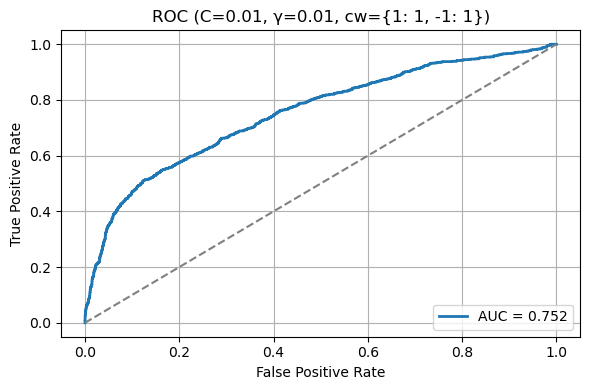

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  252  3364  140  744     0.804      0.643   0.253         0.96  0.363
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13679                      9626   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              23                                      9603   

   All Incorrectly Classified Support Vectors  
0                                        4053  


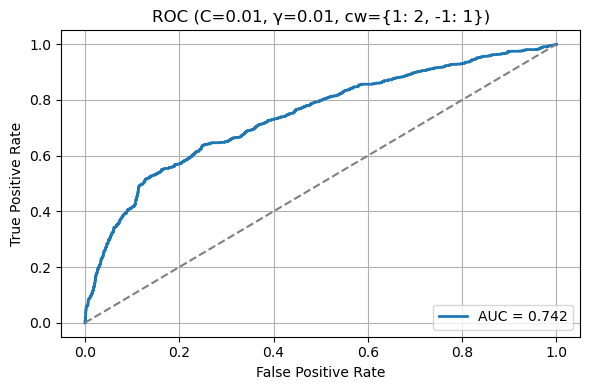

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  513  3054  450  483     0.793      0.533   0.515        0.872  0.524
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            19206                     14912   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               4                                     14908   

   All Incorrectly Classified Support Vectors  
0                                        4294  


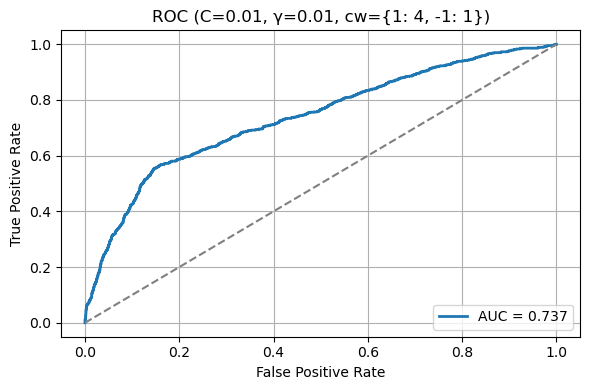

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP  TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  996   0  3504   0     0.221      0.221     1.0          0.0  0.362
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            19091                      2736   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                               2                                      2734   

   All Incorrectly Classified Support Vectors  
0                                       16355  


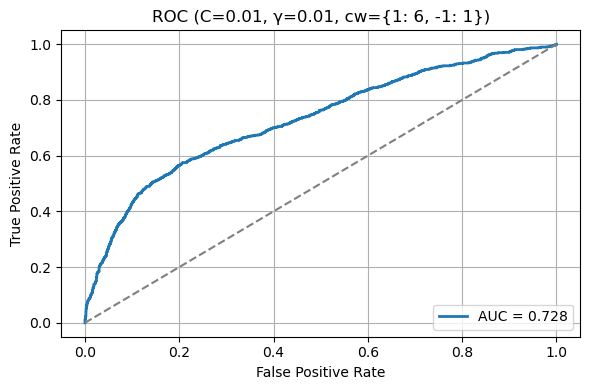

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  179  3415  89  817     0.799      0.668    0.18        0.975  0.283
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9381                      5313   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             220                                      5093   

   All Incorrectly Classified Support Vectors  
0                                        4068  


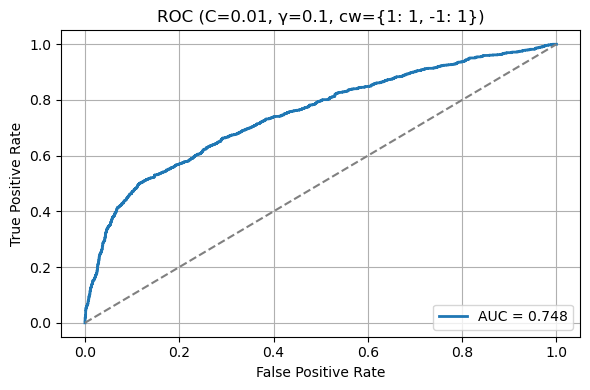

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  442  3196  308  554     0.808      0.589   0.444        0.912  0.506
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            11991                      8077   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             114                                      7963   

   All Incorrectly Classified Support Vectors  
0                                        3914  


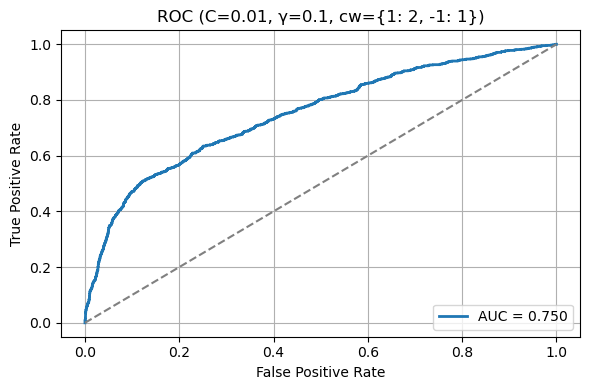

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  543  2973  531  453     0.781      0.506   0.545        0.848  0.525
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16177                     11687   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              47                                     11640   

   All Incorrectly Classified Support Vectors  
0                                        4490  


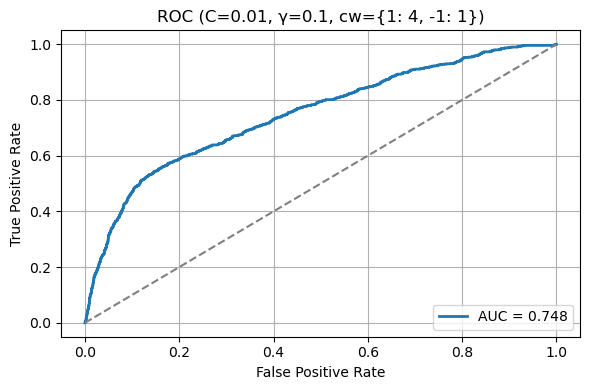

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  776  1639  1865  220     0.537      0.294   0.779        0.468  0.427
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            18281                      8723   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              25                                      8698   

   All Incorrectly Classified Support Vectors  
0                                        9558  


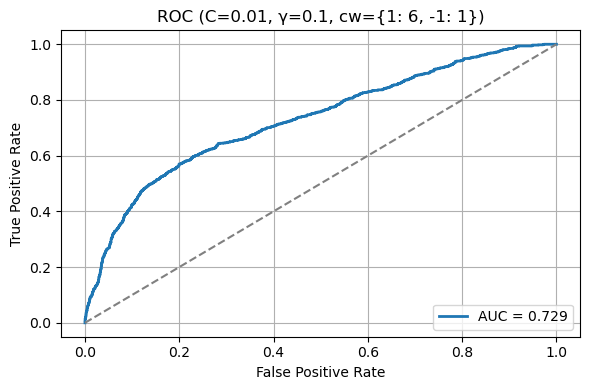

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity    F1
0   5  3503   1  991      0.78      0.833   0.005          1.0  0.01
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9925                      5332   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1273                                      4059   

   All Incorrectly Classified Support Vectors  
0                                        4593  


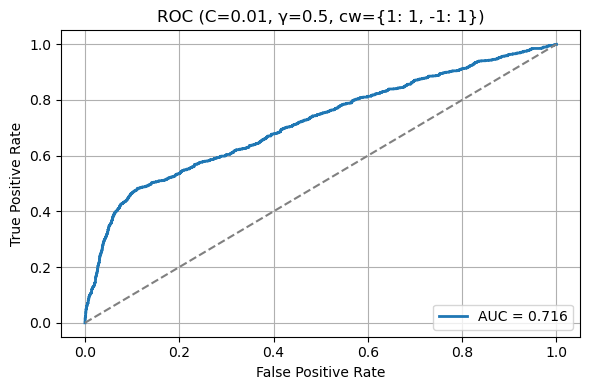

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  233  3381  123  763     0.803      0.654   0.234        0.965  0.345
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13717                      9738   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             190                                      9548   

   All Incorrectly Classified Support Vectors  
0                                        3979  


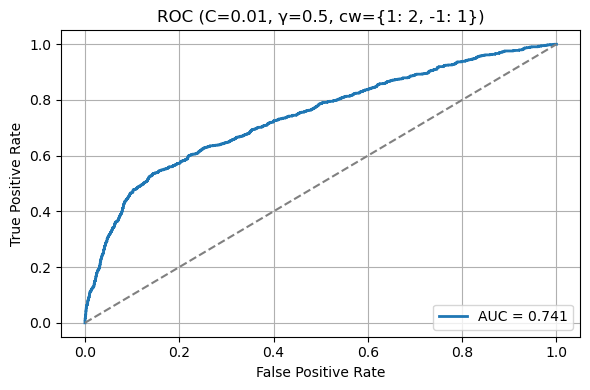

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  732  1978  1526  264     0.602      0.324   0.735        0.564  0.45
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            17135                      9261   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              97                                      9164   

   All Incorrectly Classified Support Vectors  
0                                        7874  


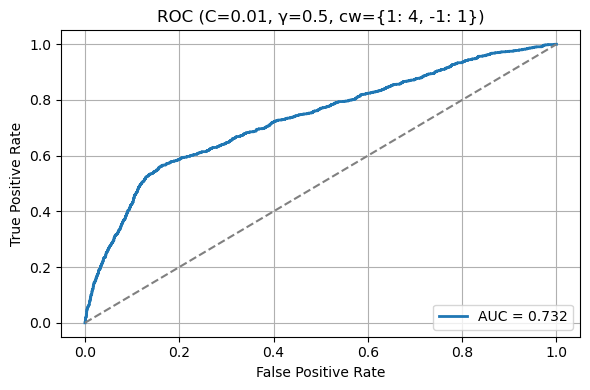

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  836  1277  2227  160      0.47      0.273   0.839        0.364  0.412
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            18382                      7528   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             296                                      7232   

   All Incorrectly Classified Support Vectors  
0                                       10854  


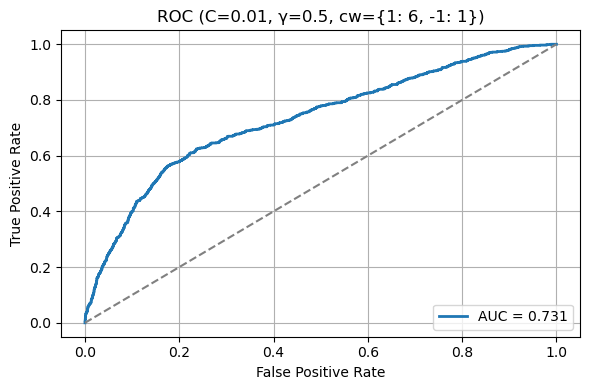

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10600                      5955   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2590                                      3365   

   All Incorrectly Classified Support Vectors  
0                                        4645  


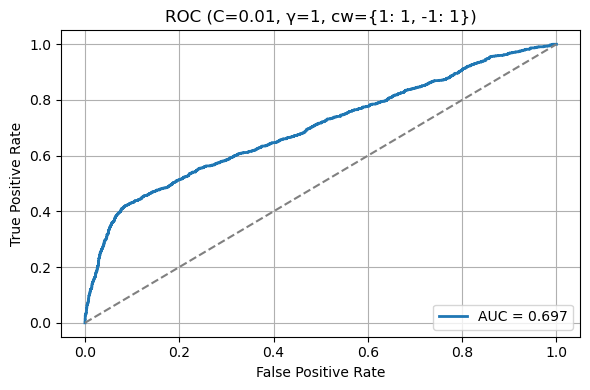

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  21  3501   3  975     0.783      0.875   0.021        0.999  0.041
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14088                      9590   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             323                                      9267   

   All Incorrectly Classified Support Vectors  
0                                        4498  


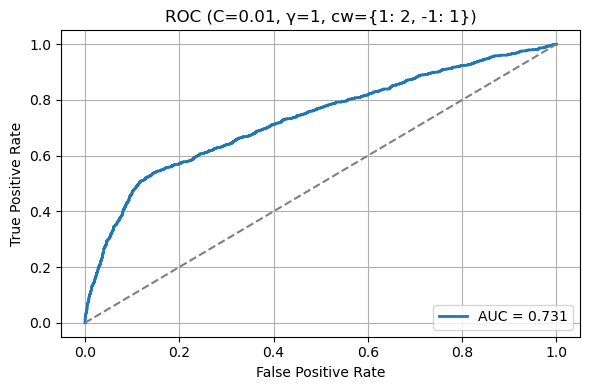

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  813  1467  2037  183     0.507      0.285   0.816        0.419  0.423
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            18124                      8168   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              84                                      8084   

   All Incorrectly Classified Support Vectors  
0                                        9956  


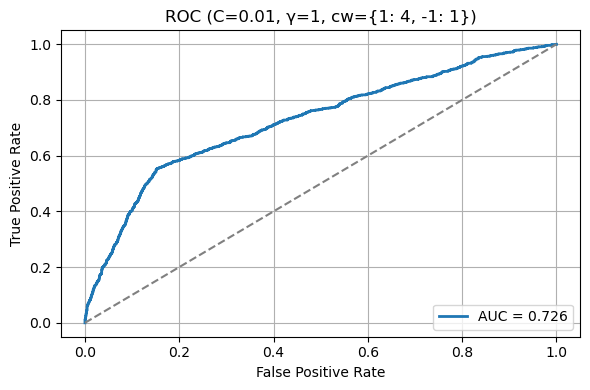

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.01, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP   TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  897  926  2578  99     0.405      0.258   0.901        0.264  0.401
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            19040                      6965   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             211                                      6754   

   All Incorrectly Classified Support Vectors  
0                                       12075  


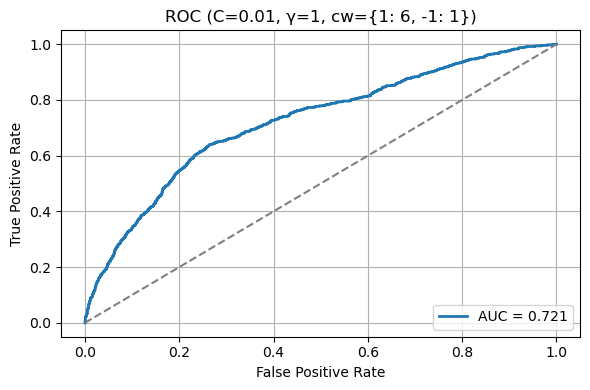

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  290  3382  122  706     0.816      0.704   0.291        0.965  0.412
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9086                      5251   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             254                                      4997   

   All Incorrectly Classified Support Vectors  
0                                        3835  


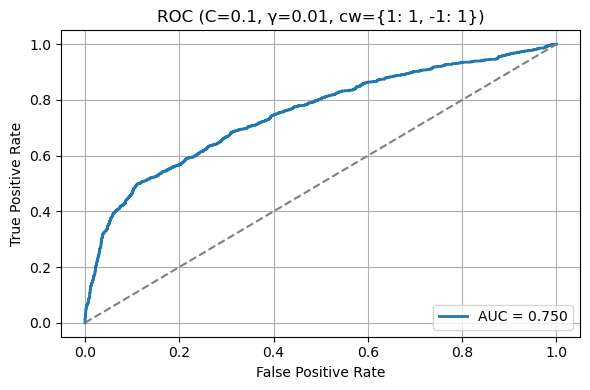

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  441  3190  314  555     0.807      0.584   0.443         0.91  0.504
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            11327                      7396   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             145                                      7251   

   All Incorrectly Classified Support Vectors  
0                                        3931  


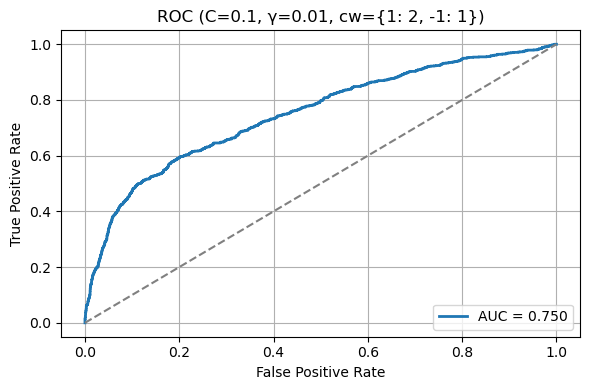

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  534  2963  541  462     0.777      0.497   0.536        0.846  0.516
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15530                     10891   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              55                                     10836   

   All Incorrectly Classified Support Vectors  
0                                        4639  


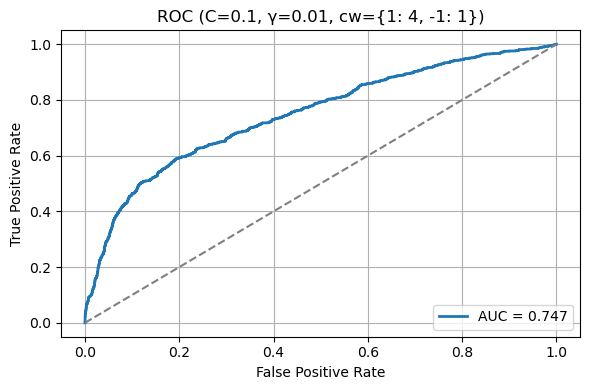

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  735  1887  1617  261     0.583      0.312   0.738        0.539  0.439
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            18336                      9647   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              10                                      9637   

   All Incorrectly Classified Support Vectors  
0                                        8689  


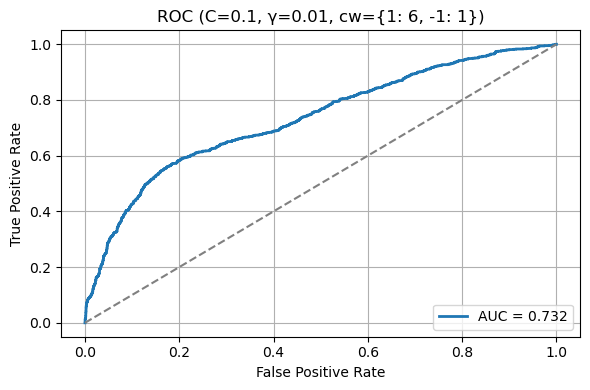

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  317  3367  137  679     0.819      0.698   0.318        0.961  0.437
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8571                      4841   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             955                                      3886   

   All Incorrectly Classified Support Vectors  
0                                        3730  


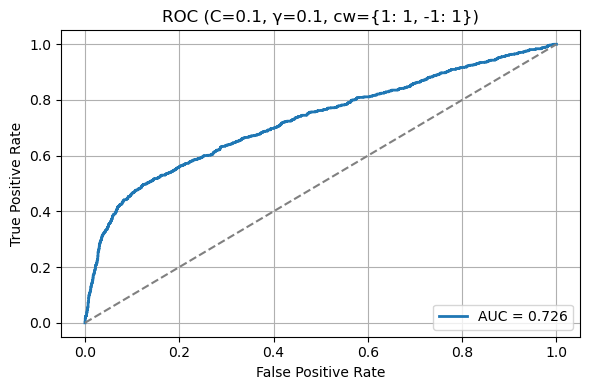

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  446  3184  320  550     0.807      0.582   0.448        0.909  0.506
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10573                      6654   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             544                                      6110   

   All Incorrectly Classified Support Vectors  
0                                        3919  


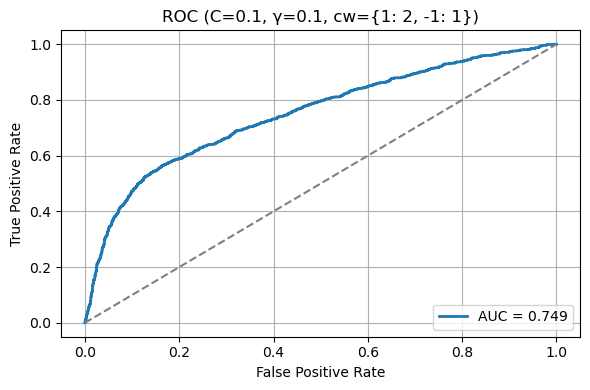

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  600  2819  685  396      0.76      0.467   0.602        0.805  0.526
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14137                      9213   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             289                                      8924   

   All Incorrectly Classified Support Vectors  
0                                        4924  


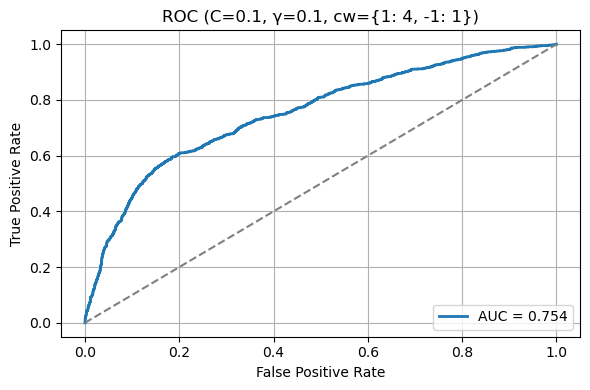

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  715  2192  1312  281     0.646      0.353   0.718        0.626  0.473
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16934                      9520   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              98                                      9422   

   All Incorrectly Classified Support Vectors  
0                                        7414  


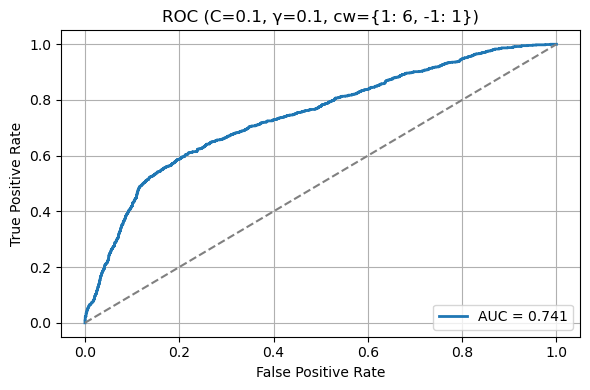

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  270  3377  127  726      0.81       0.68   0.271        0.964  0.388
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9685                      5876   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2078                                      3798   

   All Incorrectly Classified Support Vectors  
0                                        3809  


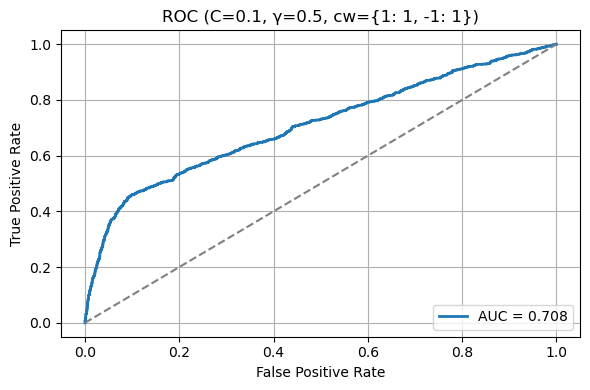

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  447  3176  328  549     0.805      0.577   0.449        0.906  0.505
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            11613                      7867   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1062                                      6805   

   All Incorrectly Classified Support Vectors  
0                                        3746  


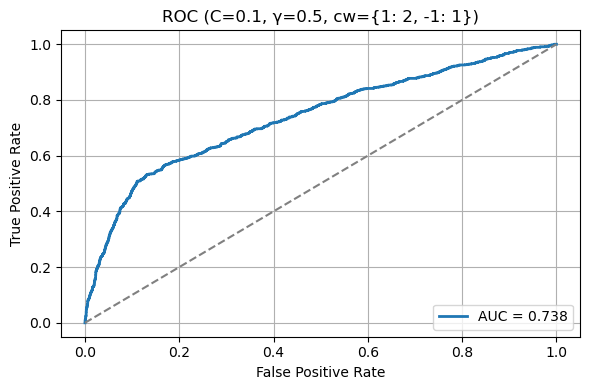

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  612  2718  786  384      0.74      0.438   0.614        0.776  0.511
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14996                     10103   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             636                                      9467   

   All Incorrectly Classified Support Vectors  
0                                        4893  


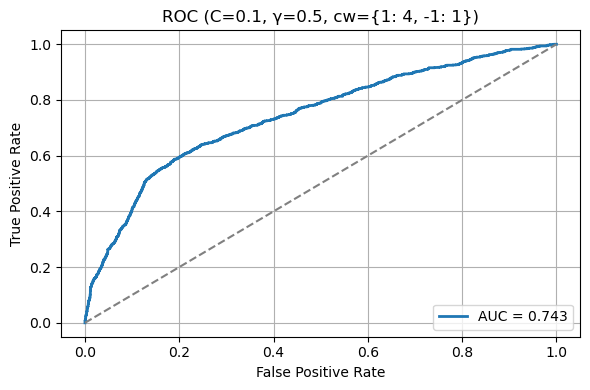

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  776  1920  1584  220     0.599      0.329   0.779        0.548  0.462
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            17350                      9188   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             538                                      8650   

   All Incorrectly Classified Support Vectors  
0                                        8162  


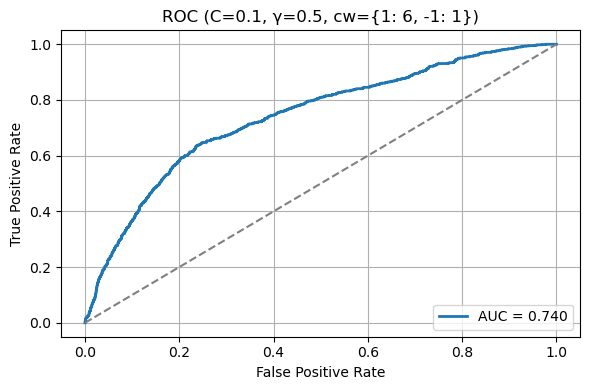

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  150  3445  59  846     0.799      0.718   0.151        0.983  0.249
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10941                      6800   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            3554                                      3246   

   All Incorrectly Classified Support Vectors  
0                                        4141  


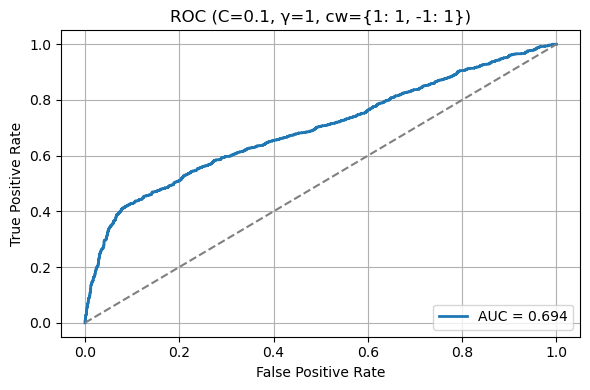

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  295  3326  178  701     0.805      0.624   0.296        0.949  0.402
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            12922                      9194   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1071                                      8123   

   All Incorrectly Classified Support Vectors  
0                                        3728  


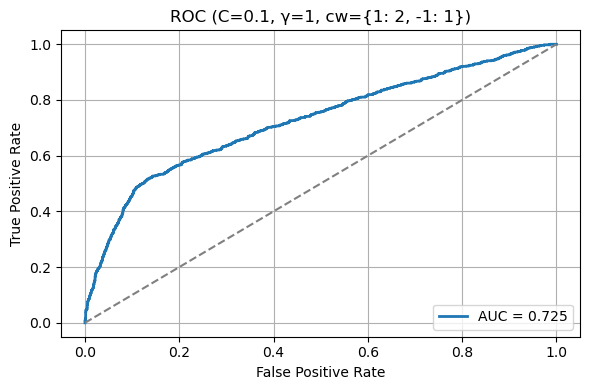

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  704  2226  1278  292     0.651      0.355   0.707        0.635  0.473
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15961                      9429   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             424                                      9005   

   All Incorrectly Classified Support Vectors  
0                                        6532  


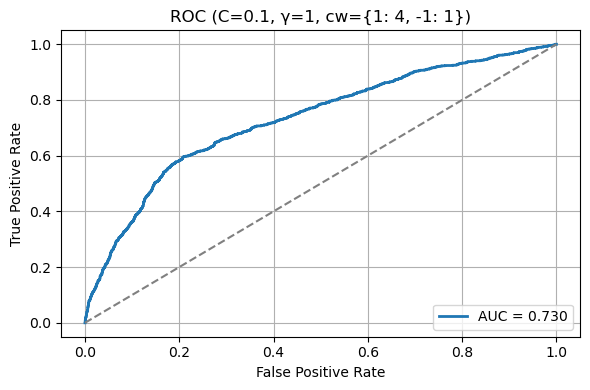

----------------------------------------------------------------------------------------------------

Evaluating model with C = 0.1, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  804  1688  1816  192     0.554      0.307   0.807        0.482  0.445
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            17801                      8928   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             416                                      8512   

   All Incorrectly Classified Support Vectors  
0                                        8873  


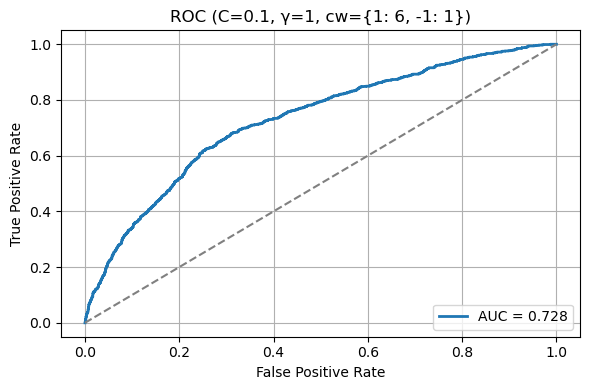

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  320  3367  137  676     0.819        0.7   0.321        0.961  0.44
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8501                      4728   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1231                                      3497   

   All Incorrectly Classified Support Vectors  
0                                        3773  


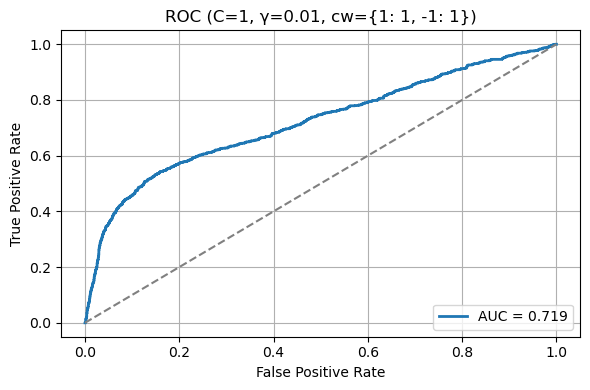

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  439  3191  313  557     0.807      0.584   0.441        0.911  0.502
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10542                      6614   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             416                                      6198   

   All Incorrectly Classified Support Vectors  
0                                        3928  


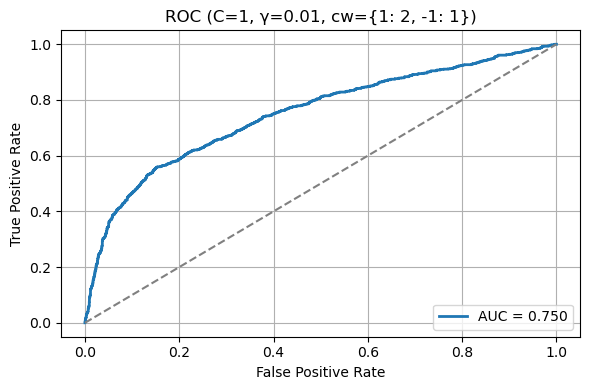

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  549  2919  585  447     0.771      0.484   0.551        0.833  0.515
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14314                      9577   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             193                                      9384   

   All Incorrectly Classified Support Vectors  
0                                        4737  


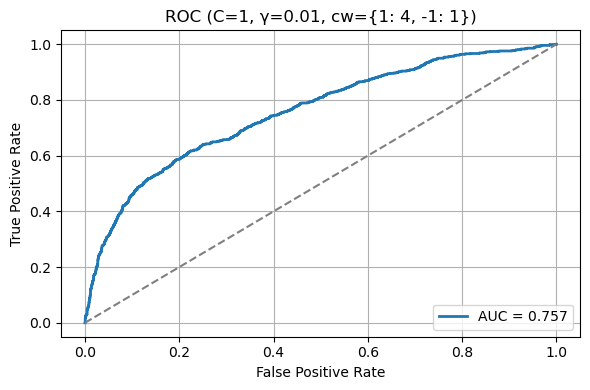

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  686  2170  1334  310     0.635       0.34   0.689        0.619  0.455
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            17202                      9684   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              47                                      9637   

   All Incorrectly Classified Support Vectors  
0                                        7518  


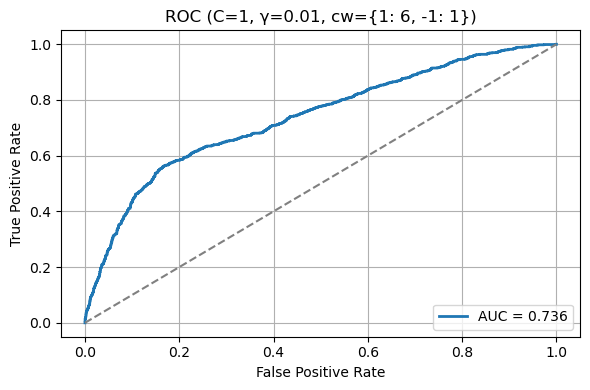

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  341  3334  170  655     0.817      0.667   0.342        0.951  0.453
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8732                      5076   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2118                                      2958   

   All Incorrectly Classified Support Vectors  
0                                        3656  


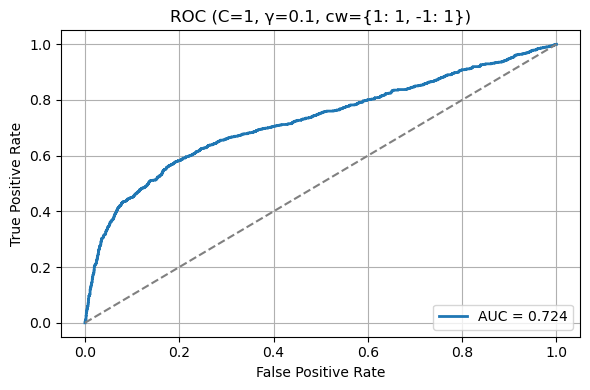

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  498  3120  384  498     0.804      0.565     0.5         0.89  0.53
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10546                      6608   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1382                                      5226   

   All Incorrectly Classified Support Vectors  
0                                        3938  


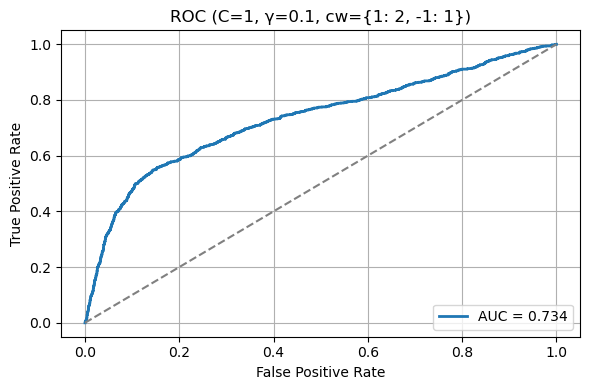

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  593  2790  714  403     0.752      0.454   0.595        0.796  0.515
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13762                      8889   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             703                                      8186   

   All Incorrectly Classified Support Vectors  
0                                        4873  


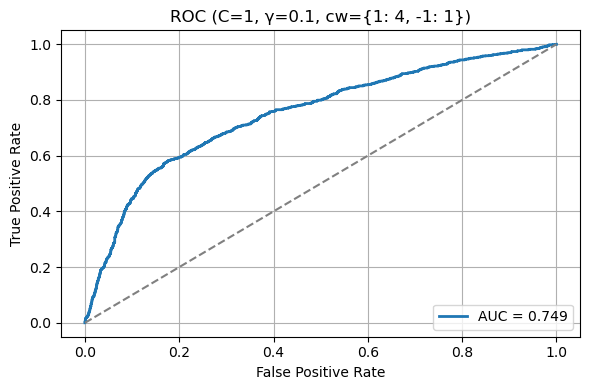

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  705  2344  1160  291     0.678      0.378   0.708        0.669  0.493
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16305                      9396   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             344                                      9052   

   All Incorrectly Classified Support Vectors  
0                                        6909  


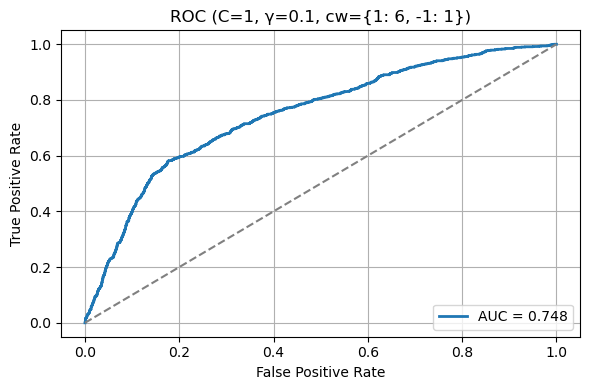

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  342  3329  175  654     0.816      0.662   0.343         0.95  0.452
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9608                      6375   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            3551                                      2824   

   All Incorrectly Classified Support Vectors  
0                                        3233  


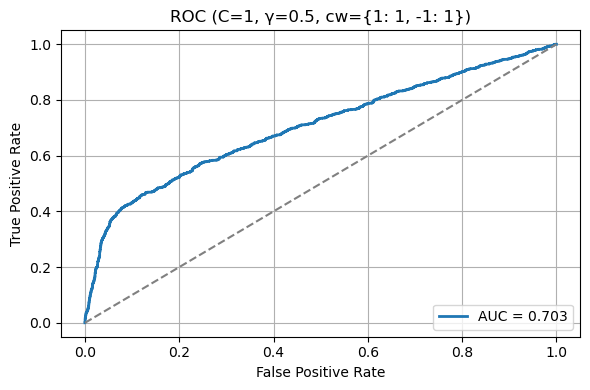

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  472  3118  386  524     0.798       0.55   0.474         0.89  0.509
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            11271                      8022   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2926                                      5096   

   All Incorrectly Classified Support Vectors  
0                                        3249  


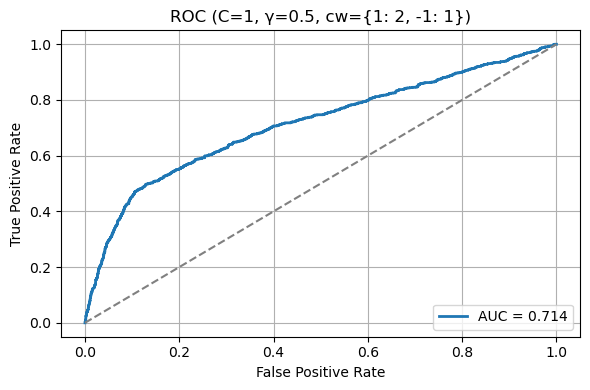

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  575  2789  715  421     0.748      0.446   0.577        0.796  0.503
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14042                      9979   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2114                                      7865   

   All Incorrectly Classified Support Vectors  
0                                        4063  


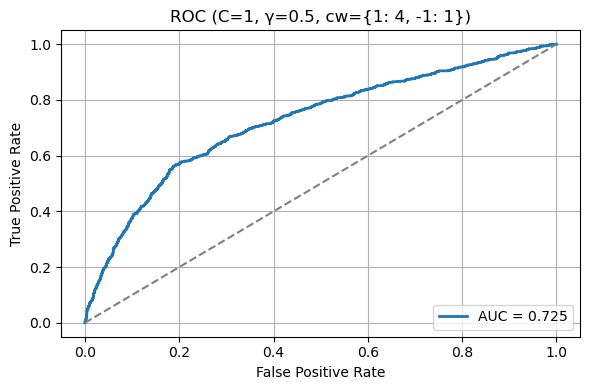

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  666  2377  1127  330     0.676      0.371   0.669        0.678  0.478
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16032                      9931   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1720                                      8211   

   All Incorrectly Classified Support Vectors  
0                                        6101  


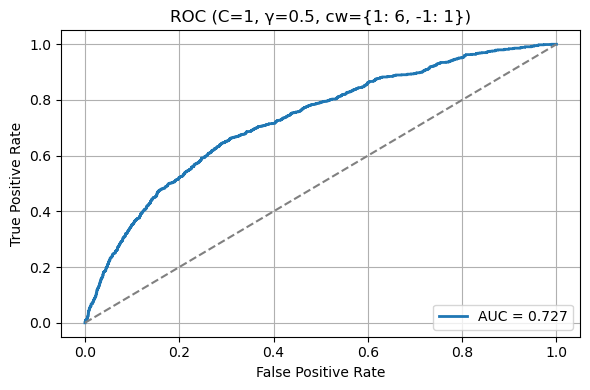

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  311  3338  166  685     0.811      0.652   0.312        0.953  0.422
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10661                      7691   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            4763                                      2928   

   All Incorrectly Classified Support Vectors  
0                                        2970  


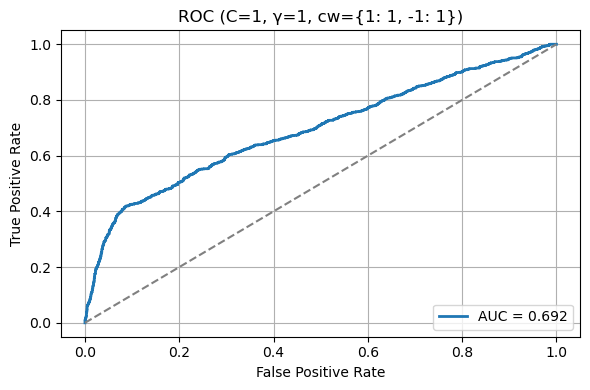

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  415  3138  366  581      0.79      0.531   0.417        0.896  0.467
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            12111                      9040   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            4157                                      4883   

   All Incorrectly Classified Support Vectors  
0                                        3071  


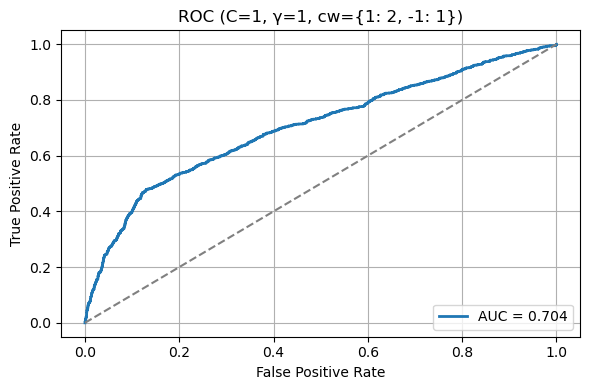

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  532  2822  682  464     0.745      0.438   0.534        0.805  0.481
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14554                     10621   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            3316                                      7305   

   All Incorrectly Classified Support Vectors  
0                                        3933  


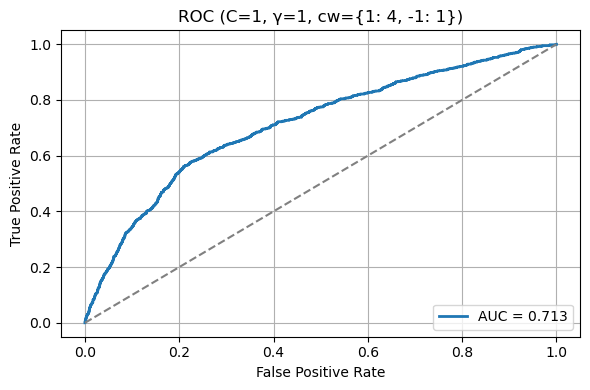

----------------------------------------------------------------------------------------------------

Evaluating model with C = 1, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  610  2464  1040  386     0.683       0.37   0.612        0.703  0.461
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16325                     10516   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2826                                      7690   

   All Incorrectly Classified Support Vectors  
0                                        5809  


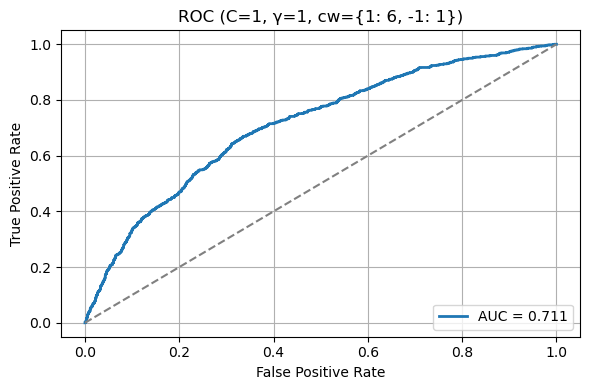

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  321  3366  138  675     0.819      0.699   0.322        0.961  0.441
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             8952                      5184   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2340                                      2844   

   All Incorrectly Classified Support Vectors  
0                                        3768  


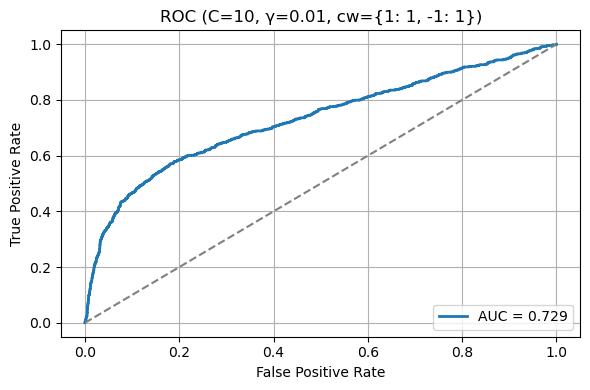

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  453  3180  324  543     0.807      0.583   0.455        0.908  0.511
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10594                      6649   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1266                                      5383   

   All Incorrectly Classified Support Vectors  
0                                        3945  


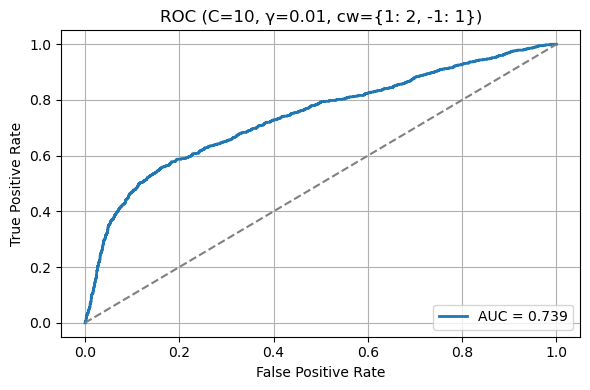

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  598  2833  671  398     0.762      0.471     0.6        0.809  0.528
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13759                      8825   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             371                                      8454   

   All Incorrectly Classified Support Vectors  
0                                        4934  


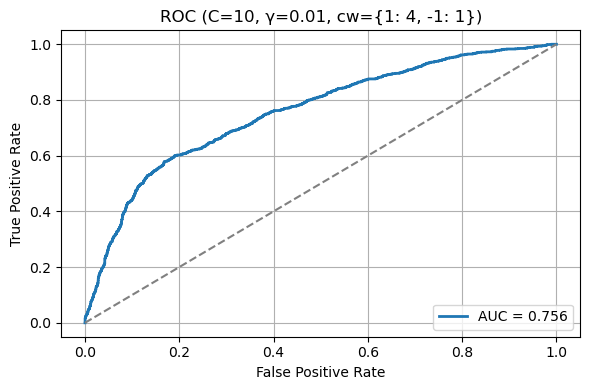

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.01, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  685  2369  1135  311     0.679      0.376   0.688        0.676  0.487
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            16608                      9682   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                              99                                      9583   

   All Incorrectly Classified Support Vectors  
0                                        6926  


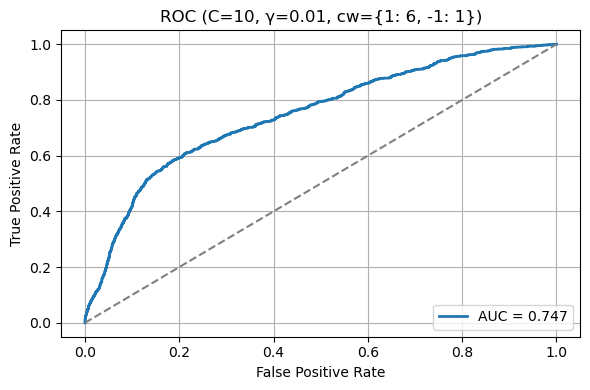

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  349  3334  170  647     0.818      0.672    0.35        0.951  0.461
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9033                      5612   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2962                                      2650   

   All Incorrectly Classified Support Vectors  
0                                        3421  


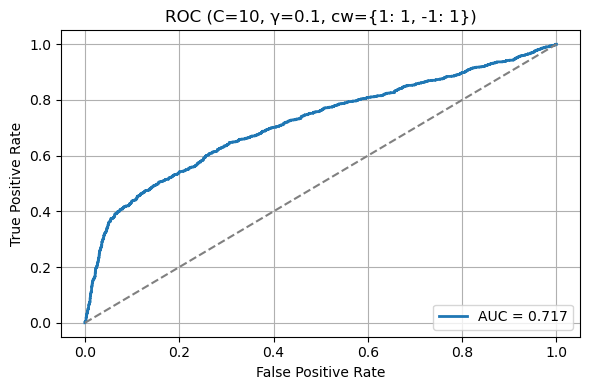

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  476  3135  369  520     0.802      0.563   0.478        0.895  0.517
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10612                      7131   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            2072                                      5059   

   All Incorrectly Classified Support Vectors  
0                                        3481  


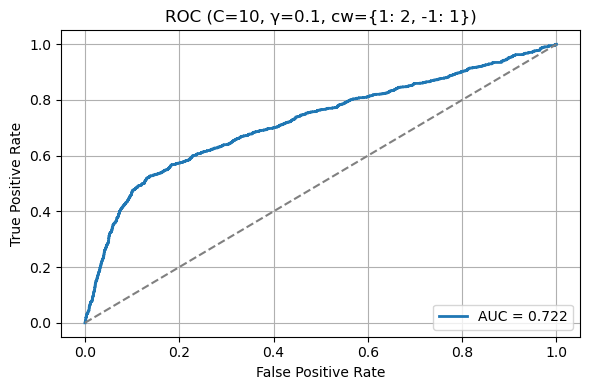

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  588  2780  724  408     0.748      0.448    0.59        0.793  0.51
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13481                      9125   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            1222                                      7903   

   All Incorrectly Classified Support Vectors  
0                                        4356  


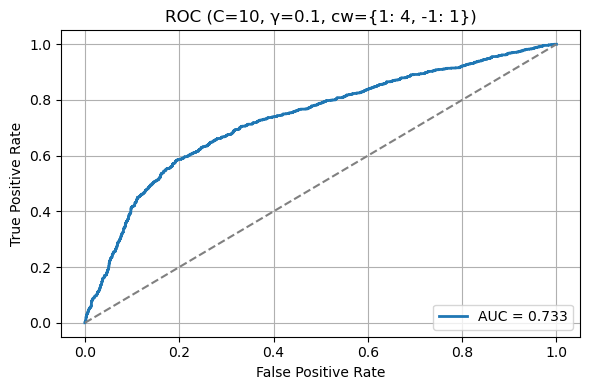

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  697  2301  1203  299     0.666      0.367     0.7        0.657  0.481
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15639                      9058   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             906                                      8152   

   All Incorrectly Classified Support Vectors  
0                                        6581  


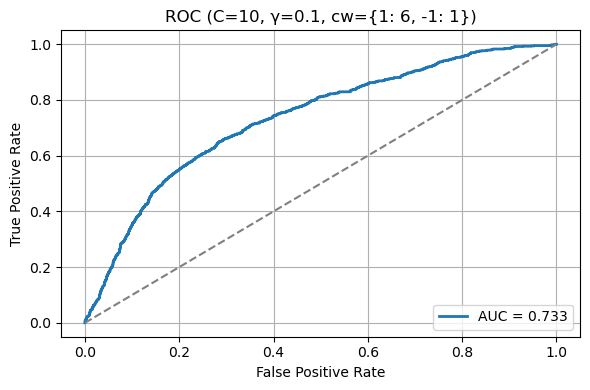

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  369  3273  231  627     0.809      0.615    0.37        0.934  0.462
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                             9774                      6963   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            5024                                      1939   

   All Incorrectly Classified Support Vectors  
0                                        2811  


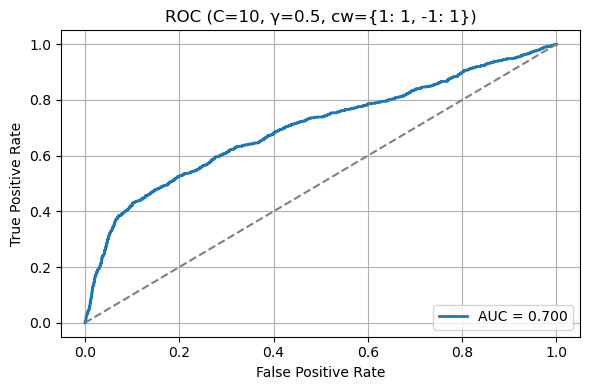

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  439  3081  423  557     0.782      0.509   0.441        0.879  0.473
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            11031                      8139   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            4340                                      3799   

   All Incorrectly Classified Support Vectors  
0                                        2892  


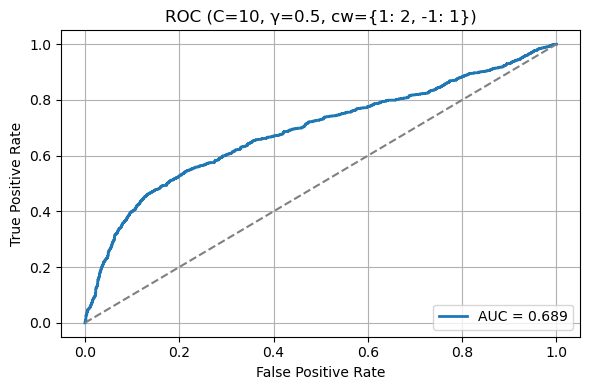

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  529  2820  684  467     0.744      0.436   0.531        0.805  0.479
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13301                      9639   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            3516                                      6123   

   All Incorrectly Classified Support Vectors  
0                                        3662  


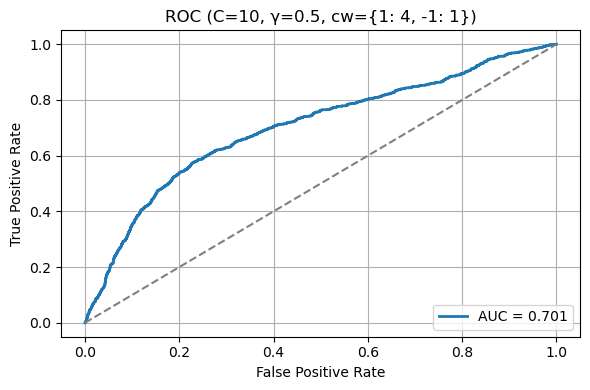

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 0.5, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  599  2498  1006  397     0.688      0.373   0.601        0.713  0.461
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            14852                      9460   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            3137                                      6323   

   All Incorrectly Classified Support Vectors  
0                                        5392  


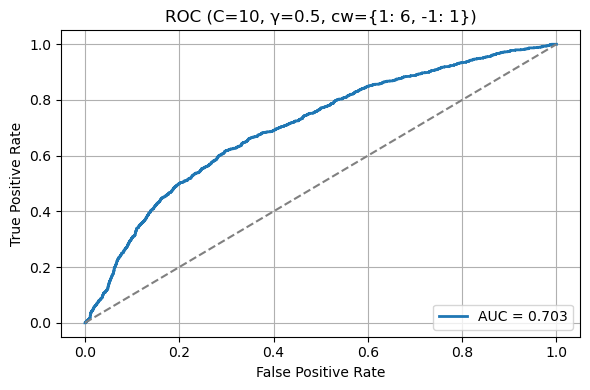

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 1, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  333  3289  215  663     0.805      0.608   0.334        0.939  0.431
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            10721                      8089   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            6228                                      1861   

   All Incorrectly Classified Support Vectors  
0                                        2632  


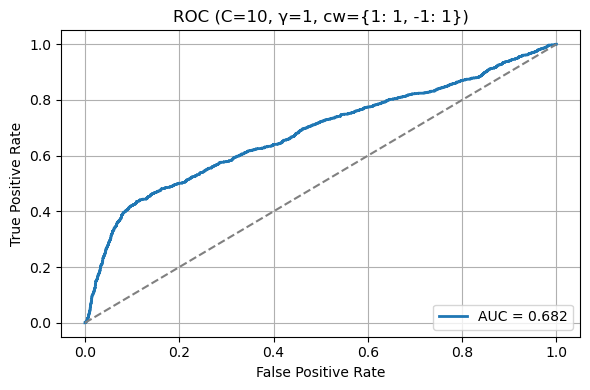

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 2, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  395  3099  405  601     0.776      0.494   0.397        0.884  0.44
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            11846                      9175   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            5485                                      3690   

   All Incorrectly Classified Support Vectors  
0                                        2671  


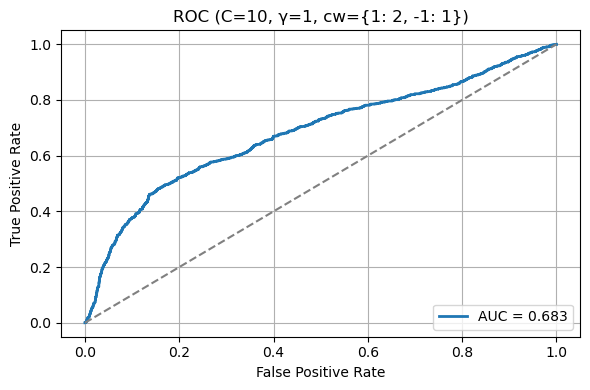

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 4, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  488  2866  638  508     0.745      0.433    0.49        0.818  0.46
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13863                     10476   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            4563                                      5913   

   All Incorrectly Classified Support Vectors  
0                                        3387  


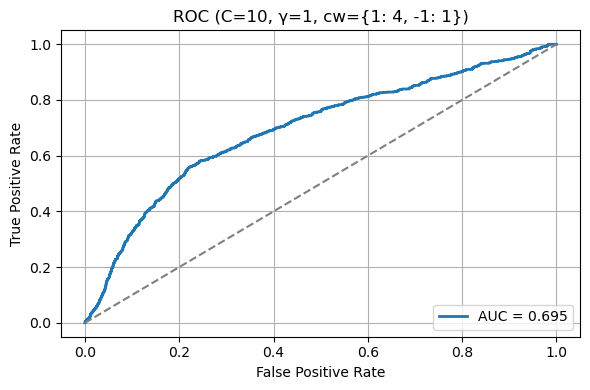

----------------------------------------------------------------------------------------------------

Evaluating model with C = 10, gamma = 1, class_weight = {1: 6, -1: 1}

Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  550  2532  972  446     0.685      0.361   0.552        0.723  0.437
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            15250                     10059   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                            4165                                      5894   

   All Incorrectly Classified Support Vectors  
0                                        5191  


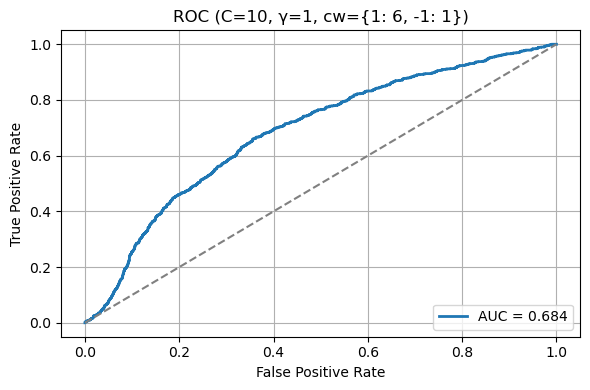

In [229]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Evaluation
C_values = [0.01, 0.1, 1, 10]
gamma_values = [0.01, 0.1, 0.5, 1]
class_weight_options = [{1:1, -1:1}, {1:2, -1:1}, {1:4, -1:1}, {1:6, -1:1}]

for C in C_values:
    for gamma in gamma_values:
        for cw in class_weight_options:
            cw_str = str(cw)

            key = (C, gamma, cw_str)
            if key not in trained_models_weighted_svm_rbf_kernel:
                print(f"Model not found for C={C}, gamma={gamma}, class_weight={cw_str}")
                continue
            
            print("-" * 100)
            print(f"\nEvaluating model with C = {C}, gamma = {gamma}, class_weight = {cw_str}")
            
            model_info = trained_models_weighted_svm_rbf_kernel[key]
            model = model_info["model"]
            
            val_decision = model.decision_function(X_SVM_val)
            y_val_pred = np.sign(val_decision)
            
            evaluationresults = []
            supportvectorsresults = []
            
            # Evaluation Metrics
            TP = np.sum((y_SVM_val == 1) & (y_val_pred == 1))
            TN = np.sum((y_SVM_val == -1) & (y_val_pred == -1))
            FP = np.sum((y_SVM_val == -1) & (y_val_pred == 1))
            FN = np.sum((y_SVM_val == 1) & (y_val_pred == -1))

            Accuracy = (TP + TN) / len(y_SVM_val)
            Precision = TP / (TP + FP) if (TP + FP) > 0 else 0
            Recall = TP / (TP + FN) if (TP + FN) > 0 else 0
            Specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
            F1 = 2 * (Precision * Recall) / (Precision + Recall) if (Precision + Recall) > 0 else 0

            evaluationresults.append({
                "TP": TP,
                "TN": TN,
                "FP": FP,
                "FN": FN,
                "Accuracy": Accuracy,
                "Precision": Precision,
                "Recall": Recall,
                "Specificity": Specificity,
                "F1": F1,
            })
            
            # Support Vectors
            support_indices = model.support_
            dual_coefs = model.dual_coef_[0]
            y_support = y_SVM_train.to_numpy()[support_indices]

            influence = dual_coefs * y_support
            ind_on_margin_correct = np.where(influence < C)[0]
            indcloseincorrect = np.where(influence == C)[0]

            SV_decision = model.decision_function(
                pd.DataFrame(model.support_vectors_, columns=X_SVM_train.columns)
            )
            y_SV_pred = np.sign(SV_decision)
            true_support_labels = y_SVM_train.to_numpy()[support_indices]

            ind_all_correct = np.where(y_SV_pred == true_support_labels)[0]
            ind_all_incorrect = np.where(y_SV_pred != true_support_labels)[0]
            ind_close_correct = np.setdiff1d(ind_all_correct, ind_on_margin_correct)

            supportvectorsresults.append({
                "Total Number of Support Vectors": len(support_indices),
                "All Correctly Classified": len(ind_all_correct),
                "Correctly Classified on Margin": len(ind_on_margin_correct),
                "Correctly Classified but Close to Margin": len(ind_close_correct),
                "All Incorrectly Classified Support Vectors": len(ind_all_incorrect)
            })

            # Print metrics
            df_evaluationresults = pd.DataFrame(evaluationresults)
            print("\nEvaluation Metrics on the Validation Set:")
            print(df_evaluationresults.round(3))

            print("-" * 50)

            df_supportvectorsresults = pd.DataFrame(supportvectorsresults)
            print("\nSupport Vectors Type:")
            print(df_supportvectorsresults.round(3))

            # Plot ROC Curve
            fpr, tpr, _ = roc_curve(y_SVM_val, val_decision, pos_label=1)
            roc_auc = auc(fpr, tpr)

            plt.figure(figsize=(6, 4))
            plt.plot(fpr, tpr, lw=2, label=f"AUC = {roc_auc:.3f}")
            plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
            plt.title(f"ROC (C={C}, γ={gamma}, cw={cw_str})")
            plt.xlabel("False Positive Rate")
            plt.ylabel("True Positive Rate")
            plt.legend(loc="lower right")
            plt.grid(True)
            plt.tight_layout()
            plt.show()


### Results (RBF Kernel)
Now, we can make decision on the value of hyperparameters and class weight ratios.

In the following tables, we ignored those models with the lowest values for **F1 Scores**. We only look at the model with the highest values for **F1 Score** as well as the basic model of equivalent ratio between the classes. As it can be seen from the results, we can increase the **Class Weight Ratio** as much as we want to increase the **Recall** and make the **FN** predictions to zero, but this happens at the cost of loosing precision and ending up with the high value for **FP**. **F1 Score** compromise between **Precision** and **Recall**. Increasing the value of **Recall** increases the value of **F1** score first, but it has a peak, and after that increase in the value of **Recall** makes the **F1 Score** decrease. This is why **F1 Score** is an important metric for picking a model. Therefore, ignoring those models with the lowest value for **F1 Score** seems reasonable. For those models with the same evaluation metrics, we choose the one with the fewer **Support Vectors** as it is the simpler model and more generalized model. Finally, the ROC curve was considered (which computes true positive rate vs. false positive rate at various thresholds) and auc (for the area under the curve).


<br>

<div style="overflow-x:auto">

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 0.01 | 0.01 | 1   |0.43  |0   |996 |0.00    |0.00|0.50    |0.00    |1.00    |0.50    |9313  |0.75   |
| 0.01 | 0.01 | 4   |0.58  |450 |483 |0.52    |0.53|0.78    |0.00    |1.00    |0.22    |19206 |0.74   |
| 0.01 | 0.1  | 1   |0.40  |89  |817 |0.18    |0.28|0.57    |0.04    |0.96    |0.43    |9381  |0.75   |
| 0.01 | 0.1  | 4   |0.50  |531 |453 |0.55    |0.53|0.72    |0.00    |1.00    |0.28    |16177 |0.75   |
| 0.01 | 0.5  | 1   |0.43  |1   |991 |0.00    |0.01|0.54    |0.24    |0.76    |0.46    |9925  |0.72   |
| 0.01 | 1    | 1   |0.44  |0   |996 |0.00    |0.00|0.56    |0.43    |1.00    |0.57    |10600 |0.70   |

<br><br>
    
| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 0.1  | 0.01 | 1   |0.39  |122 |706 |0.29    |0.41|0.58    |0.05    |0.95    |0.42    |9086  |0.75   |
| 0.1  | 0.1  | 1   |0.37  |137 |679 |0.32    |0.44|0.56    |0.20    |0.80    |0.44    |8571  |0.73   |
| 0.1  | 0.1  | 4   |0.49  |685 |396 |0.60    |0.53|0.65    |0.03    |0.97    |0.34    |14137 |0.75   |
| 0.1  | 0.5  | 1   |0.39  |127 |726 |0.27    |0.39|0.61    |0.35    |0.65    |0.39    |9685  |0.71   |
| 0.1  | 1    | 1   |0.41  |59  |846 |0.15    |0.25|0.62    |0.52    |0.48    |0.52    |10941 |0.70   |
    
<br><br>    

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 1    | 0.01 | 1   |0.36  |137 |676 |0.32    |0.44|0.56    |0.26    |0.74    |0.44    |8501  |0.72   |
| 1    | 0.1  | 1   |0.37  |170 |655 |0.34    |0.45|0.58    |0.42    |0.58    |0.42    |8732  |0.72   |
| 1    | 0.1  | 2   |0.41  |384 |498 |0.50    |0.53|0.63    |0.21    |0.79    |0.37    |10546 |0.73   |
| 1    | 0.5  | 1   |0.40  |175 |654 |0.34    |0.45|0.66    |0.56    |0.44    |0.34    |9608  |0.70   |
| 1    | 1    | 1   |0.43  |166 |675 |0.31    |0.42|0.72    |0.62    |0.38    |0.28    |10661 |0.69   |
 
<br><br>    

| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  |ROC    |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|-------|
| 10   | 0.01 | 1   |0.36  |138 |675 |0.32    |0.44|0.58    |0.45    |0.55    |0.42    |8952  |0.73   |
| 10   | 0.01 | 4   |0.48  |671 |398 |0.60    |0.53|0.64    |0.04    |0.96    |0.36    |13759 |0.76   |
| 10   | 0.1  | 1   |0.38  |170 |647 |0.35    |0.46|0.62    |0.53    |0.47    |0.38    |9033  |0.72   |
| 10   | 0.5  | 1   |0.43  |231 |627 |0.37    |0.46|0.71    |0.72    |0.28    |0.29    |9774  |0.70   |
| 10   | 1    | 1   |0.46  |215 |663 |0.33    |0.41|0.75    |0.77    |0.23    |0.25    |10721 |0.68   |

<br><br>
    
We can see that the best values for **F1** Score and **Recall** happen in the following models:

- **$C = 0.10$**, **$\gamma = 0.10$**, **CWR = 4**
- **$C = 10.00$**, **$\gamma = 0.01$**, **CWR = 4**


    
Among these models, we choose **$C = 10.00$**, **$\gamma = 0.01$**, **CWR = 4** model as our final model since it has the overall better performance on the following parameters:
- **$NSV = 13759$**
- **$FN = 398$**
- **$CCSVR = 0.64$**
- **$ROC = 0.76$**

### Final Model
Comparing the chosen models for Linear Kernel, Quadratic Kernel, Cubic Kernel, and RBF Kernel, we finally chose the RBF Kernel as our final model for the rest of the project. This model performs as well as other models and has the advantage of simplicity and better ROC.

This model has the following features:
<bar><br>
| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  | ROC  |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|------|
| 10  | 0.01  | 4   |0.57  |671 |398 |0.60    |0.53|0.64    |0.04    |0.96    |0.36    |13759 |0.76  |

In [253]:
from sklearn.svm import SVC
from sklearn.metrics import hinge_loss

C_values = [10]
gamma_values = [0.01]
class_weight_options = [{1:4, -1:1}]

trained_models_weighted_svm_rbf_kernel_final = {}

for C in C_values:
    
    for gamma in gamma_values:
        
        for cw in class_weight_options:
            
            print("-" * 50)
            print(f"Training SVM model with RBF Kernel C = {C}, gamma = {gamma}, and class_weight = {cw}")

            model_svm_rbf_kernel_final = SVC(kernel = 'rbf', C = C, gamma = gamma, class_weight = cw)

            model_svm_rbf_kernel_final.fit(X_SVM_train, y_SVM_train)

            train_decision = model_svm_rbf_kernel_final.decision_function(X_SVM_train)
            val_decision = model_svm_rbf_kernel_final.decision_function(X_SVM_val)

            # Compute hinge loss
            train_loss = hinge_loss(y_SVM_train, train_decision)
            val_loss = hinge_loss(y_SVM_val, val_decision)

            print(f"Train Hinge Loss: {train_loss:.4f}")
            print(f"Validation Hinge Loss: {val_loss:.4f}")
            
            cw_str = str(cw)
            trained_models_weighted_svm_rbf_kernel_final[(C, gamma, cw_str)] = {
                "model": model_svm_rbf_kernel_final,
                "train_losses": train_loss,
                "val_losses": val_loss
            }

print("-" * 50)
print("Final SVM model have been trained and stored.")

--------------------------------------------------
Training SVM model with RBF Kernel C = 10, gamma = 0.01, and class_weight = {1: 4, -1: 1}
Train Hinge Loss: 0.4685
Validation Hinge Loss: 0.4829
--------------------------------------------------
Final SVM model have been trained and stored.


### Prediction on Test Data
Now we use our chosen model to make prediction on Test Data.

In [255]:
# Prediction

C = 10
gamma = 0.01
cw_str = str({1:4, -1:1})
    
model_info = trained_models_weighted_svm_rbf_kernel_final[(C, gamma, cw_str)]
model = model_info["model"]

evaluationresults = []
supportvectorsresults = []

test_decision = model.decision_function(X_SVM_test)
y_test_pred = np.sign(test_decision)

# Evaluation Metrics
TP = np.sum((y_SVM_test == 1) & (y_test_pred == 1))
TN = np.sum((y_SVM_test == -1) & (y_test_pred == -1))
FP = np.sum((y_SVM_test == -1) & (y_test_pred == 1))
FN = np.sum((y_SVM_test == 1) & (y_test_pred == -1))

Accuracy = (TP + TN) / len(y_SVM_test) if len(y_SVM_test) > 0 else 0
Precision = TP / (TP + FP) if (TP + FP) > 0 else 0
Recall = TP / (TP + FN) if (TP + FN) > 0 else 0
Specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
F1 = 2 * (Precision * Recall) / (Precision + Recall) if (Precision + Recall) > 0 else 0

# Support Vectors
support_indices = model.support_
dual_coefs = model.dual_coef_[0]
y_support = y_SVM_train.to_numpy()[support_indices]

# Compute influence (α_i * y_i)
influence = dual_coefs * y_support

# Find indices where influence < C
ind_on_margin_correct = np.where(influence < C)[0]

# Find indices that are misclassified or close to margin
indcloseincorrect = np.where(influence == C)[0]

# Predict on support vectors themselves

SV_decision = model.decision_function(pd.DataFrame(model.support_vectors_, columns=X_SVM_train.columns))
y_SV_pred = np.sign(SV_decision)

# True labels of the support vectors
true_support_labels = y_SVM_train.to_numpy()[support_indices]

# Which support vectors are correctly and incorrectly predicted
ind_all_correct = np.where(y_SV_pred == true_support_labels)[0]
ind_all_incorrect = np.where(y_SV_pred != true_support_labels)[0]

# Support vectors that are correctly predicted but close to margin
ind_close_correct = np.setdiff1d(ind_all_correct, ind_on_margin_correct)

evaluationresults.append({
    "TP": TP,
    "TN": TN,
    "FP": FP,
    "FN": FN,
    "Accuracy": Accuracy,
    "Precision": Precision,
    "Recall": Recall,
    "Specificity": Specificity,
    "F1": F1,

})

supportvectorsresults.append({
"Total Number of Support Vectors": len(support_indices),
"All Correctly Classified": len(ind_all_correct),
"Correctly Classified on Margin": len(ind_on_margin_correct),
"Correctly Classified but Close to Margin": len(ind_close_correct),
"All Incorrectly Classified Support Vectors": len(ind_all_incorrect)
    
})

df_evaluationresults = pd.DataFrame(evaluationresults)
print("\nEvaluation Metrics on the Test Set:")
print(df_evaluationresults.round(3))

print("-" * 50)

df_supportvectorsresults = pd.DataFrame(supportvectorsresults)
print("\nSupport Vectors Type:")
print(df_supportvectorsresults.round(3))


Evaluation Metrics on the Test Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  584  2855  650  411     0.764      0.473   0.587        0.815  0.524
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13759                      8825   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             371                                      8454   

   All Incorrectly Classified Support Vectors  
0                                        4934  


# Problem 3

By default, Support Vector Machines (SVMs) produce a hard decision — a class label — based on whether a data point lies on one side of the decision boundary or the other. However, in many applications like credit risk modeling, we want a probability estimate instead of a strict yes/no classification.

When `probability=True` is set in `SVC`, Scikit-learn applies a post-training calibration method called Platt scaling, which transforms the SVM's decision function values (margins) into probabilities.

**Mathematical Formulation**
Let $f(x)$ be the decision function output from the SVM (the signed distance from the hyperplane). Platt scaling fits a sigmoid function to this output:

$$
P(y = 1|x) = \frac{1}{1 + exp(Af(x) + b)}
$$

 
Where $A$ and $B$ are learned by minimizing the negative log-likelihood on a held-out validation set. This sigmoid maps the unbounded margin scores $f(x)$ into calibrated probabilities between 0 and 1. (More complete mathematical explanation can be found on the answer to the Problem 2 of the theory part of the assignment).


**What SVM Does by Default**

SVM finds the **maximum-margin hyperplane**:

A decision boundary that is **as far as possible** from the closest points of both classes (**support vectors**).

The default classification rule:

$$
f(x) = \mathbf{w}^\top \phi(x) + b \quad \Rightarrow \quad
\begin{cases}
\text{Class } +1 & \text{if } f(x) \geq 0 \\
\text{Class } -1 & \text{if } f(x) < 0
\end{cases}
$$

**What `class_weight` Does**

`class_weight` modifies the **training objective**:

- Increases the penalty for misclassifying the **important** class  
- The SVM is incentivized to **reduce errors** for this class  
- Result: The **decision boundary shifts** toward the **less important** class  

**What Thresholding Does**

**Threshold** = post-training **decision rule**  
Used to turn scores/probabilities into final predictions.

**Default behavior:**
$$
\text{Predict class } +1 \quad \text{if margin } \geq 0
$$

**Changing the threshold lets you:**
- Boost **recall**
- Reduce **false positives**

**In Summary**
- Use `class_weight` to **shift the boundary** during training.
- Use **thresholding** to **tune your decisions** at prediction time.


## Final Model with Probability

In [257]:
from sklearn.svm import SVC
from sklearn.metrics import hinge_loss

C_values = [10]
gamma_values = [0.01]
class_weight_options = [{1:4, -1:1}]

trained_models_weighted_svm_rbf_kernel_prob_final = {}

for C in C_values:
    
    for gamma in gamma_values:
        
        for cw in class_weight_options:
            
            print("-" * 50)
            print(f"Training SVM model with RBF Kernel C = {C}, gamma = {gamma}, and class_weight = {cw}, with probability = True")

            # Train model with built-in Platt scaling enabled
            model_svm_rbf_kernel_prob = SVC(kernel = 'rbf', C = C, gamma = gamma, class_weight = cw, probability = True)

            model_svm_rbf_kernel_prob.fit(X_SVM_train, y_SVM_train)

            # Get decision function outputs
            train_decision = model_svm_rbf_kernel_prob.decision_function(X_SVM_train)
            val_decision = model_svm_rbf_kernel_prob.decision_function(X_SVM_val)

            # Compute hinge loss
            train_loss = hinge_loss(y_SVM_train, train_decision)
            val_loss = hinge_loss(y_SVM_val, val_decision)

            print(f"Train Hinge Loss: {train_loss:.4f}")
            print(f"Validation Hinge Loss: {val_loss:.4f}")
            
            # Get probability predictions from Platt scaling
            val_probs = model_svm_rbf_kernel_prob.predict_proba(X_SVM_val)[:, 1]
            print("Sample Platt-scaled probabilities (validation):")
            print(val_probs[:10])
            
            cw_str = str(cw)
            trained_models_weighted_svm_rbf_kernel_prob_final[(C, gamma, cw_str)] = {
                "model": model_svm_rbf_kernel_prob,
                "train_losses": train_loss,
                "val_losses": val_loss,
                "val_probs": val_probs  # optional: store probabilities for later use
            }

print("-" * 50)
print("Final SVM model have been trained and stored.")


--------------------------------------------------
Training SVM model with RBF Kernel C = 10, gamma = 0.01, and class_weight = {1: 4, -1: 1}, with probability = True
Train Hinge Loss: 0.4685
Validation Hinge Loss: 0.4829
Sample Platt-scaled probabilities (validation):
[0.50970487 0.11246081 0.50773043 0.13351293 0.51461257 0.34488458
 0.1125486  0.11193351 0.49244757 0.11000688]
--------------------------------------------------
Final SVM model have been trained and stored.


### Evaluation Process (RBF Kernel With Probability)


Evaluation Metrics on the Validation Set (Multiple Thresholds):
    Threshold   TP    TN    FP   FN  Accuracy  Precision  Recall  Specificity  \
0         0.0  996     0  3504    0     0.221      0.221   1.000        0.000   
1         0.1  996    11  3493    0     0.224      0.222   1.000        0.003   
2         0.2  603  2783   721  393     0.752      0.455   0.605        0.794   
3         0.3  579  2889   615  417     0.771      0.485   0.581        0.824   
4         0.4  528  3031   473  468     0.791      0.527   0.530        0.865   
5         0.5  492  3098   406  504     0.798      0.548   0.494        0.884   
6         0.6   34  3485    19  962     0.782      0.642   0.034        0.995   
7         0.7   19  3501     3  977     0.782      0.864   0.019        0.999   
8         0.8    9  3503     1  987     0.780      0.900   0.009        1.000   
9         0.9    0  3504     0  996     0.779      0.000   0.000        1.000   
10        1.0    0  3504     0  996     0.77

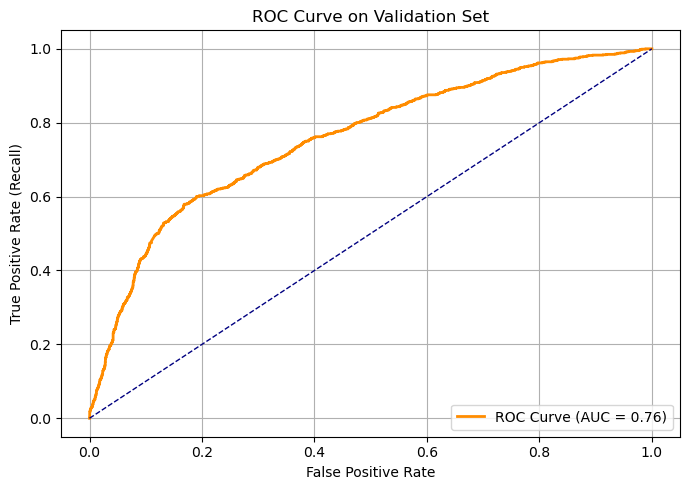

In [263]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Evaluation
C = 10
gamma = 0.01
cw_str = str({1:4, -1:1})

model_info = trained_models_weighted_svm_rbf_kernel_prob_final[(C, gamma, cw_str)]
model = model_info["model"]
val_probs = model_info["val_probs"]

thresholds = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
evaluationresults = []
supportvectorsresults = []

for threshold in thresholds:
    
    y_val_pred = (val_probs >= threshold).astype(int) * 2 - 1  # Convert to -1/+1

    # Evaluation Metrics
    TP = np.sum((y_SVM_val == 1) & (y_val_pred == 1))
    TN = np.sum((y_SVM_val == -1) & (y_val_pred == -1))
    FP = np.sum((y_SVM_val == -1) & (y_val_pred == 1))
    FN = np.sum((y_SVM_val == 1) & (y_val_pred == -1))

    Accuracy = (TP + TN) / len(y_SVM_val)
    Precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    Recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    Specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
    F1 = 2 * (Precision * Recall) / (Precision + Recall) if (Precision + Recall) > 0 else 0

    evaluationresults.append({
        "Threshold": threshold,
        "TP": TP,
        "TN": TN,
        "FP": FP,
        "FN": FN,
        "Accuracy": Accuracy,
        "Precision": Precision,
        "Recall": Recall,
        "Specificity": Specificity,
        "F1": F1,
    })

# Support Vectors (do this once outside threshold loop)
support_indices = model.support_
dual_coefs = model.dual_coef_[0]
y_support = y_SVM_train.to_numpy()[support_indices]

influence = dual_coefs * y_support
ind_on_margin_correct = np.where(influence < C)[0]
indcloseincorrect = np.where(influence == C)[0]

SV_decision = model.decision_function(pd.DataFrame(model.support_vectors_, columns=X_SVM_train.columns))
y_SV_pred = np.sign(SV_decision)
true_support_labels = y_SVM_train.to_numpy()[support_indices]

ind_all_correct = np.where(y_SV_pred == true_support_labels)[0]
ind_all_incorrect = np.where(y_SV_pred != true_support_labels)[0]
ind_close_correct = np.setdiff1d(ind_all_correct, ind_on_margin_correct)

supportvectorsresults.append({
    "Total Number of Support Vectors": len(support_indices),
    "All Correctly Classified": len(ind_all_correct),
    "Correctly Classified on Margin": len(ind_on_margin_correct),
    "Correctly Classified but Close to Margin": len(ind_close_correct),
    "All Incorrectly Classified Support Vectors": len(ind_all_incorrect)
})

# Convert results to DataFrames
df_evaluationresults = pd.DataFrame(evaluationresults)
df_supportvectorsresults = pd.DataFrame(supportvectorsresults)

# Print results
print("\nEvaluation Metrics on the Validation Set (Multiple Thresholds):")
print(df_evaluationresults.round(3))

print("-" * 50)
print("\nSupport Vectors Type:")
print(df_supportvectorsresults.round(3))

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_SVM_val, val_probs, pos_label=1)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, color = 'darkorange', lw = 2, label = f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color = 'navy', lw = 1, linestyle = '--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate (Recall)")
plt.title("ROC Curve on Validation Set")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()


### Results (RBF Kernel With Probability)
The model achieved an **AUC of 0.76**. The model is good at ranking positives above negatives, indicating a good ability to distinguish between classes. At a **threshold of 0.3**, the evaluation metrics suggest:

- **Accuracy: 0.77** – The overall classification performance is decent.
- **Recall: 0.58** – The model captures most of the actual positives but may allow some false negatives.
- **F1 Score: 0.53** – A good balance between precision and recall, indicating that the model is performing good enough.

We can see that picking the best threshold of 0.3, our prediction on the validation set is so close to our prediction on the validation set without incorporating probability in the SVM training loop. This indicates that our base model was good enough; changing the threshold does not affect our model in the positive way if we increase it or decrease it from the optimal threshold of 0.4. Again, we can see that we can reach the Recall of 1 by moving the threshold near 0 or 0.1, but this costs a lot of FP predictions and a low F1 Score.

### Prediction on Test Data
Now we use our chosen model to make prediction on Test Data.

In [265]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Evaluation
C = 10
gamma = 0.01
cw_str = str({1:4, -1:1})
threshold = 0.3

model_info = trained_models_weighted_svm_rbf_kernel_prob_final[(C, gamma, cw_str)]
model = model_info["model"]
test_probs = model_svm_rbf_kernel_prob.predict_proba(X_SVM_test)[:, 1]

evaluationresults = []
supportvectorsresults = []
 
y_test_pred = (test_probs >= threshold).astype(int) * 2 - 1  # Convert to -1/+1

# Evaluation Metrics
TP = np.sum((y_SVM_test == 1) & (y_test_pred == 1))
TN = np.sum((y_SVM_test == -1) & (y_test_pred == -1))
FP = np.sum((y_SVM_test == -1) & (y_test_pred == 1))
FN = np.sum((y_SVM_test == 1) & (y_test_pred == -1))

Accuracy = (TP + TN) / len(y_SVM_test)
Precision = TP / (TP + FP) if (TP + FP) > 0 else 0
Recall = TP / (TP + FN) if (TP + FN) > 0 else 0
Specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
F1 = 2 * (Precision * Recall) / (Precision + Recall) if (Precision + Recall) > 0 else 0

evaluationresults.append({
    "Threshold": threshold,
    "TP": TP,
    "TN": TN,
    "FP": FP,
    "FN": FN,
    "Accuracy": Accuracy,
    "Precision": Precision,
    "Recall": Recall,
    "Specificity": Specificity,
    "F1": F1,
})

# Support Vectors (do this once outside threshold loop)
support_indices = model.support_
dual_coefs = model.dual_coef_[0]
y_support = y_SVM_train.to_numpy()[support_indices]

influence = dual_coefs * y_support
ind_on_margin_correct = np.where(influence < C)[0]
indcloseincorrect = np.where(influence == C)[0]

SV_decision = model.decision_function(pd.DataFrame(model.support_vectors_, columns=X_SVM_train.columns))
y_SV_pred = np.sign(SV_decision)
true_support_labels = y_SVM_train.to_numpy()[support_indices]

ind_all_correct = np.where(y_SV_pred == true_support_labels)[0]
ind_all_incorrect = np.where(y_SV_pred != true_support_labels)[0]
ind_close_correct = np.setdiff1d(ind_all_correct, ind_on_margin_correct)

supportvectorsresults.append({
    "Total Number of Support Vectors": len(support_indices),
    "All Correctly Classified": len(ind_all_correct),
    "Correctly Classified on Margin": len(ind_on_margin_correct),
    "Correctly Classified but Close to Margin": len(ind_close_correct),
    "All Incorrectly Classified Support Vectors": len(ind_all_incorrect)
})

# Convert results to DataFrames
df_evaluationresults = pd.DataFrame(evaluationresults)
df_supportvectorsresults = pd.DataFrame(supportvectorsresults)

# Print results
print("\nEvaluation Metrics on the Validation Set (Multiple Thresholds):")
print(df_evaluationresults.round(3))

print("-" * 50)
print("\nSupport Vectors Type:")
print(df_supportvectorsresults.round(3))



Evaluation Metrics on the Validation Set (Multiple Thresholds):
   Threshold   TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity  \
0        0.3  562  2921  584  433     0.774       0.49   0.565        0.833   

      F1  
0  0.525  
--------------------------------------------------

Support Vectors Type:
   Total Number of Support Vectors  All Correctly Classified  \
0                            13759                      8825   

   Correctly Classified on Margin  Correctly Classified but Close to Margin  \
0                             371                                      8454   

   All Incorrectly Classified Support Vectors  
0                                        4934  


# Problem 4

Boosting is an ensemble learning technique that combines multiple weak learners to build a strong classifier.
- A weak learner is a model that performs just slightly better than random chance (like small SVM trained on a data subset).
- Boosting trains these learners sequentially, and each new model focuses on the mistakes made by the previous ones.

Over time, the ensemble “boosts” accuracy by correcting past errors.

SVMs are strong learners, not weak ones — but we can still use boosting-style logic by:

- Training each SVM on a random subset of data.
- Averaging the decision functions for the final prediction.

We boost by training on different data subsets, leveraging diversity.

In what follows, we explain the changes we have made to our **Base SVM with RBF Kernel** model to make it compatible with Boosting:
- **Grid Search Values Section**: These are your grid search options. We are exploring: Different SVM regularization (C) and kernel scale (gamma), Class imbalance weights, Number of learners (n_estimators), and Training subset size per learner

- **`subset_indices`**: Randomly sample a subset of training data for each base learner. `random_state=42 + i` ensures reproducibility but different splits.

- **# Average metrics**: We average our loss across all base learners.

In [276]:
from sklearn.svm import SVC
from sklearn.metrics import hinge_loss
import numpy as np
import pandas as pd

# Grid search values
C_values = [0.01, 0.1, 1, 10]
gamma_values = [0.01, 0.1]
class_weight_options = [{1:1, -1:1}, {1:2, -1:1}, {1:4, -1:1}]
n_estimators_options = [3, 6, 9]
subset_fraction_options = [0.3, 0.6, 0.9]

# Store results
boosted_models_weighted_svm_rbf_kernel = {}

# Looping through all combinations
for n_estimators in n_estimators_options:
    for subset_fraction in subset_fraction_options:
        for C in C_values:
            for gamma in gamma_values:
                for cw in class_weight_options:

                    print("-" * 60)
                    print(f"Boosted Ensemble | Estimators: {n_estimators}, Subset Fraction: {subset_fraction}")
                    print(f"Training SVM: C = {C}, gamma = {gamma}, class_weight = {cw}")

                    ensemble_models = []
                    train_losses = []
                    val_losses = []

                    for i in range(n_estimators):
                        subset_indices = X_SVM_train.sample(frac=subset_fraction, random_state = 42 + i).index
                        X_subset = X_SVM_train.loc[subset_indices]
                        y_subset = y_SVM_train.loc[subset_indices]

                        model = SVC(kernel='rbf', C = C, gamma = gamma, class_weight = cw)
                        model.fit(X_subset, y_subset)

                        # Store model
                        ensemble_models.append(model)

                        # Decision values on full training & val sets
                        train_decision = model.decision_function(X_SVM_train)
                        val_decision = model.decision_function(X_SVM_val)

                        train_loss = hinge_loss(y_SVM_train, train_decision)
                        val_loss = hinge_loss(y_SVM_val, val_decision)

                        train_losses.append(train_loss)
                        val_losses.append(val_loss)

                    # Average metrics
                    avg_train_loss = np.mean(train_losses)
                    avg_val_loss = np.mean(val_losses)

                    print(f"Average Train Hinge Loss: {avg_train_loss:.4f}")
                    print(f"Average Validation Hinge Loss: {avg_val_loss:.4f}")

                    # Use tuple of all hyperparameters as the key
                    key = (n_estimators, subset_fraction, C, gamma, str(cw))
                    boosted_models_weighted_svm_rbf_kernel[key] = {
                        "models": ensemble_models,
                        "avg_train_loss": avg_train_loss,
                        "avg_val_loss": avg_val_loss
                    }

print("-" * 60)
print("All boosted SVM ensembles have been trained and stored.")


------------------------------------------------------------
Boosted Ensemble | Estimators: 3, Subset Fraction: 0.3
Training SVM: C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}
Average Train Hinge Loss: 0.4396
Average Validation Hinge Loss: 0.4403
------------------------------------------------------------
Boosted Ensemble | Estimators: 3, Subset Fraction: 0.3
Training SVM: C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}
Average Train Hinge Loss: 0.4338
Average Validation Hinge Loss: 0.4371
------------------------------------------------------------
Boosted Ensemble | Estimators: 3, Subset Fraction: 0.3
Training SVM: C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}
Average Train Hinge Loss: 1.1160
Average Validation Hinge Loss: 1.1199
------------------------------------------------------------
Boosted Ensemble | Estimators: 3, Subset Fraction: 0.3
Training SVM: C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}
Average Train Hinge Loss: 0.4276
Average Validation Hing

## Evaluation Process (Boosting SVM with RBF Kernel)

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


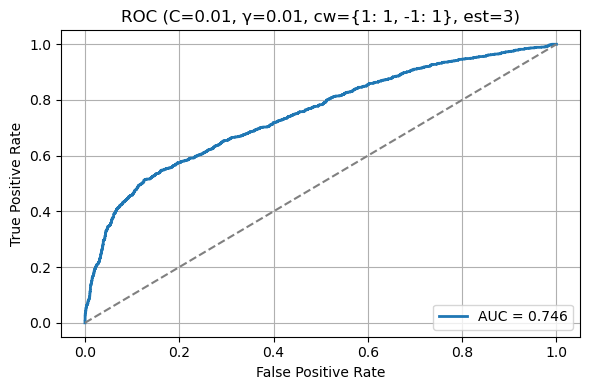

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


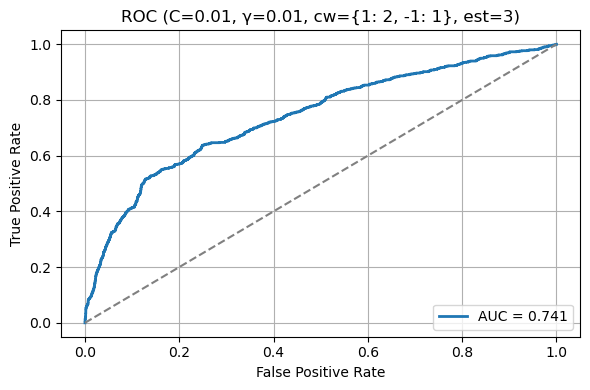

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP  TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  990  25  3479   6     0.226      0.222   0.994        0.007  0.362


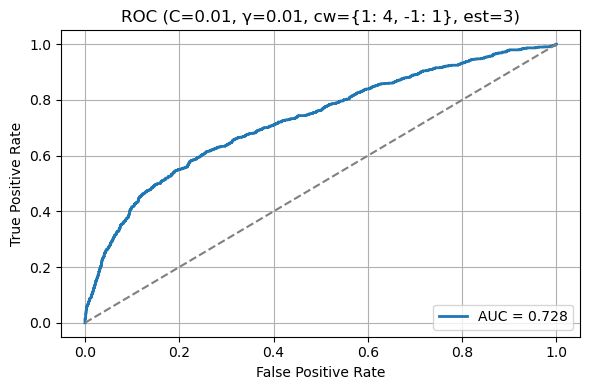

Model not found for (3, 0.3, 0.01, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


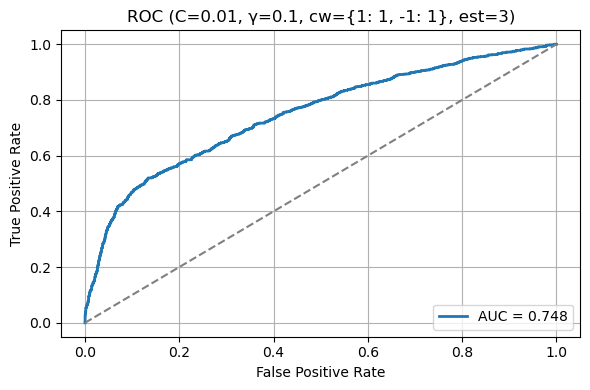

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  290  3333  171  706     0.805      0.629   0.291        0.951  0.398


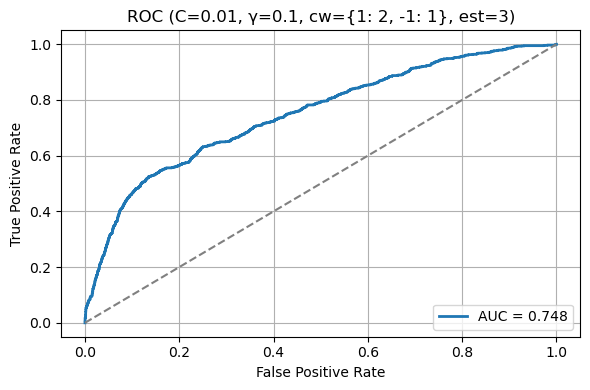

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  570  2872  632  426     0.765      0.474   0.572         0.82  0.519


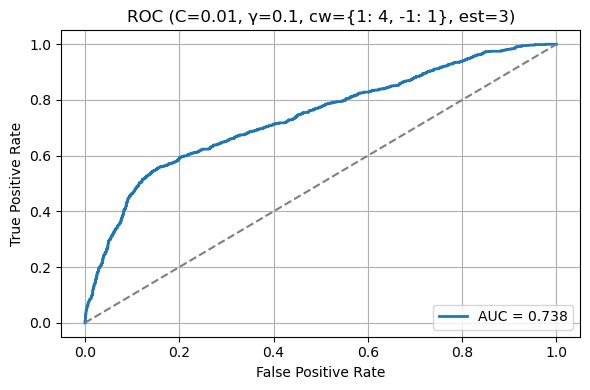

Model not found for (3, 0.3, 0.01, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  79  3479  25  917     0.791       0.76   0.079        0.993  0.144


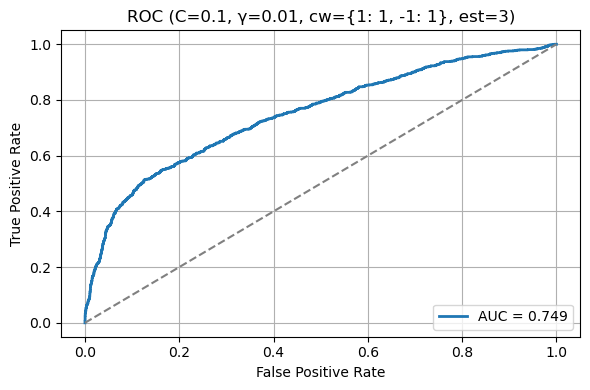

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  340  3291  213  656     0.807      0.615   0.341        0.939  0.439


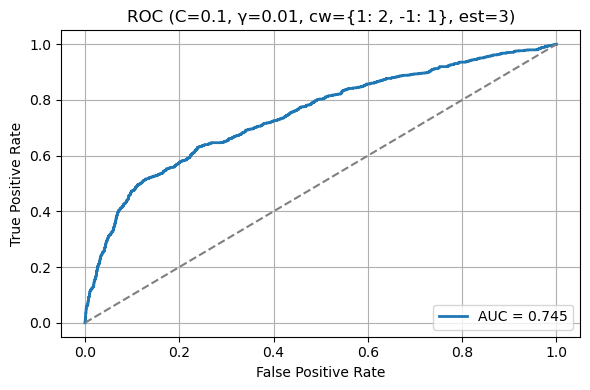

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  510  3060  444  486     0.793      0.535   0.512        0.873  0.523


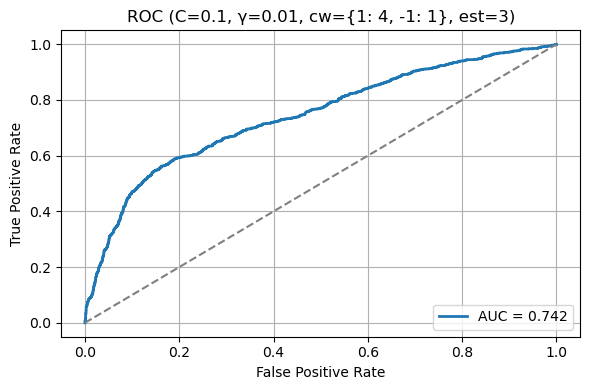

Model not found for (3, 0.3, 0.1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  293  3384  120  703     0.817      0.709   0.294        0.966  0.416


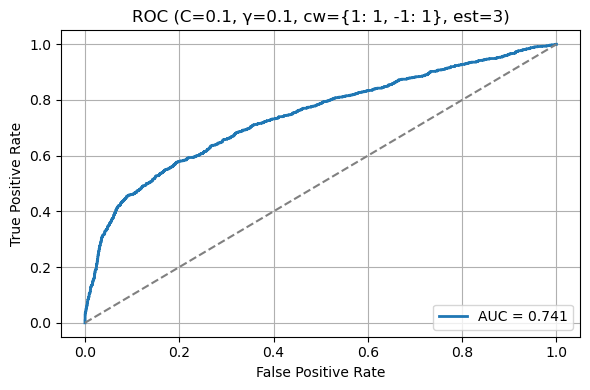

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  437  3196  308  559     0.807      0.587   0.439        0.912  0.502


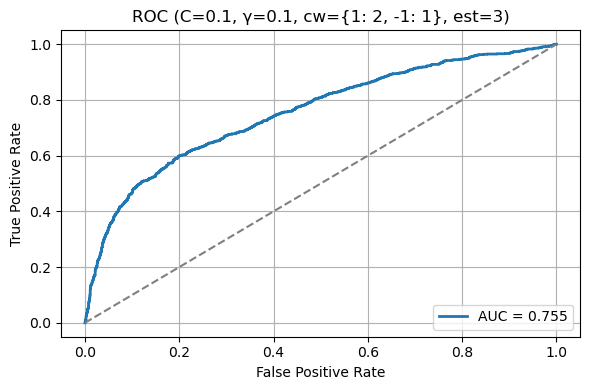

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  569  2892  612  427     0.769      0.482   0.571        0.825  0.523


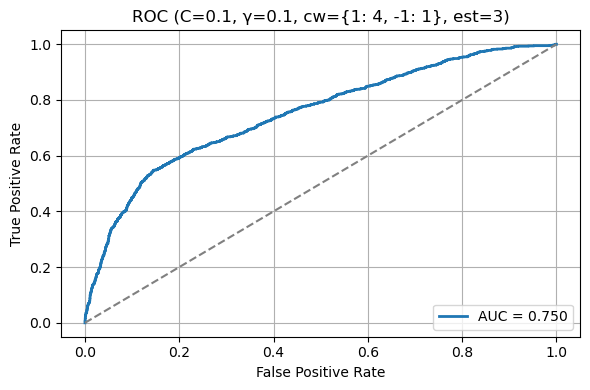

Model not found for (3, 0.3, 0.1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  312  3372  132  684     0.819      0.703   0.313        0.962  0.433


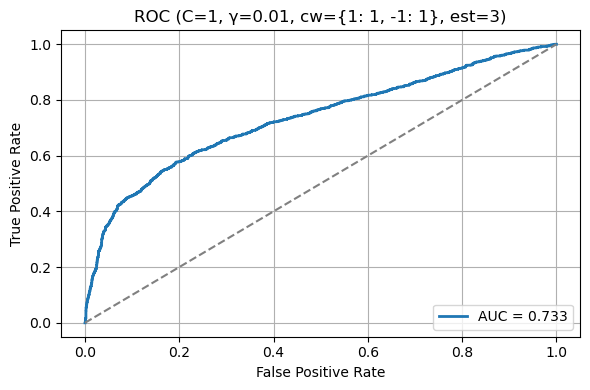

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  444  3190  314  552     0.808      0.586   0.446         0.91  0.506


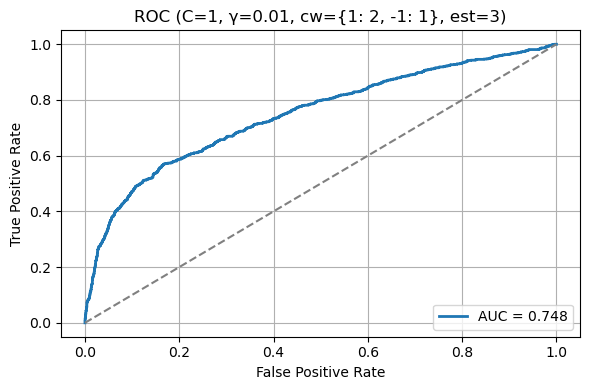

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  534  2951  553  462     0.774      0.491   0.536        0.842  0.513


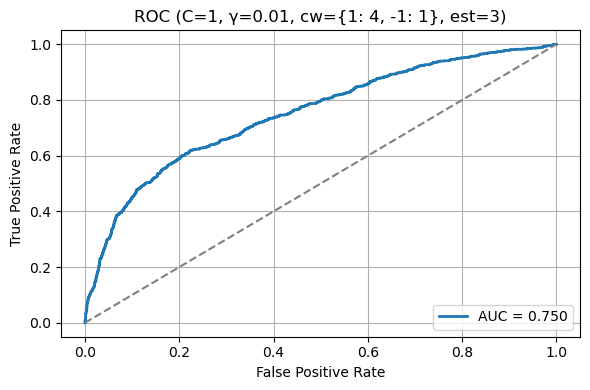

Model not found for (3, 0.3, 1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  336  3339  165  660     0.817      0.671   0.337        0.953  0.449


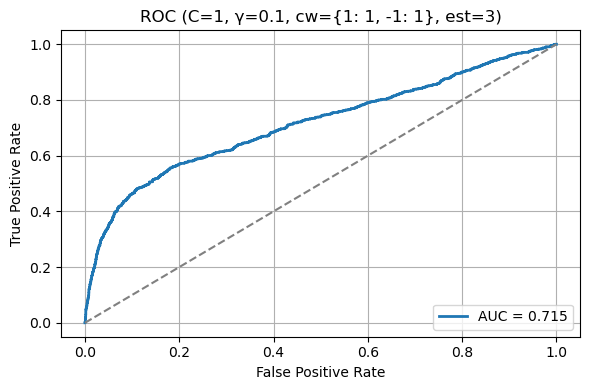

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  472  3155  349  524     0.806      0.575   0.474          0.9  0.52


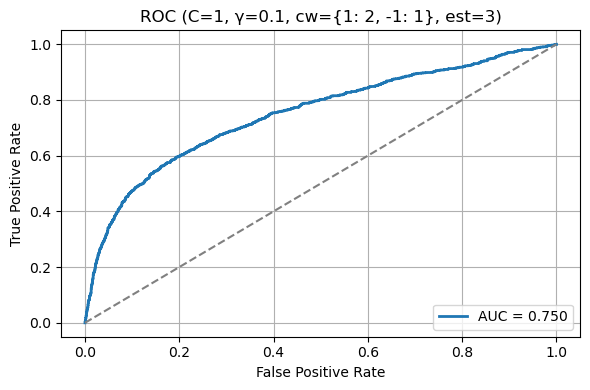

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  595  2795  709  401     0.753      0.456   0.597        0.798  0.517


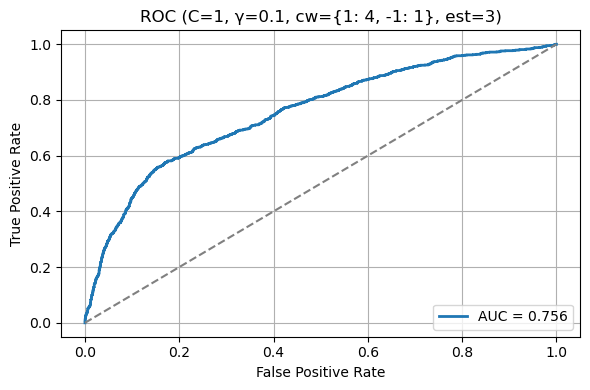

Model not found for (3, 0.3, 1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  322  3368  136  674      0.82      0.703   0.323        0.961  0.443


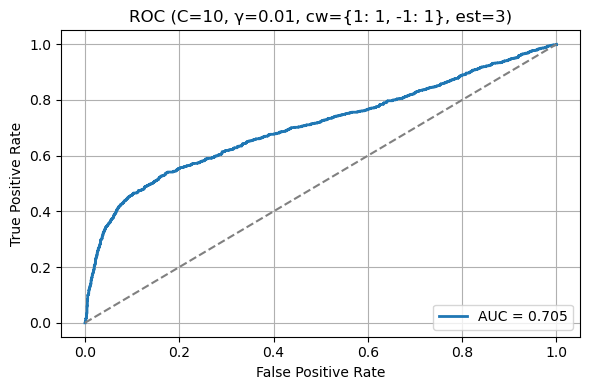

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  447  3184  320  549     0.807      0.583   0.449        0.909  0.507


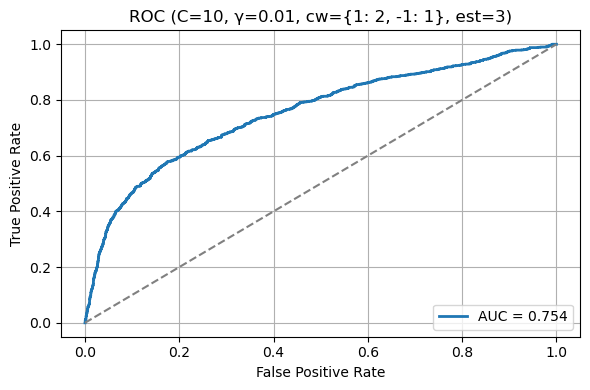

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  584  2846  658  412     0.762       0.47   0.586        0.812  0.522


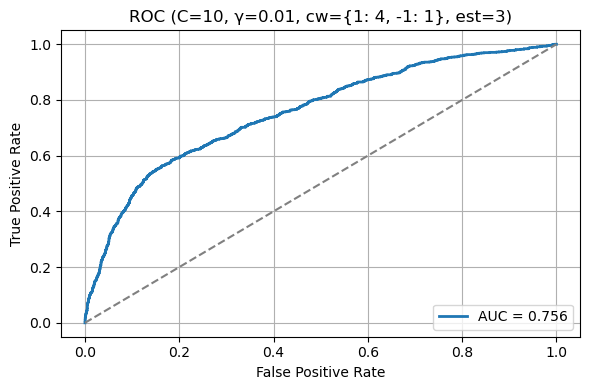

Model not found for (3, 0.3, 10, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  352  3327  177  644     0.818      0.665   0.353        0.949  0.462


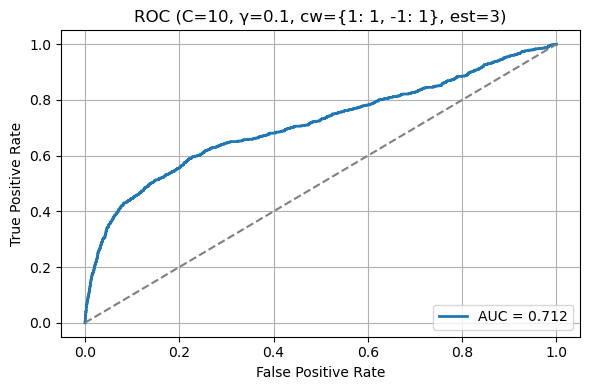

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  441  3155  349  555     0.799      0.558   0.443          0.9  0.494


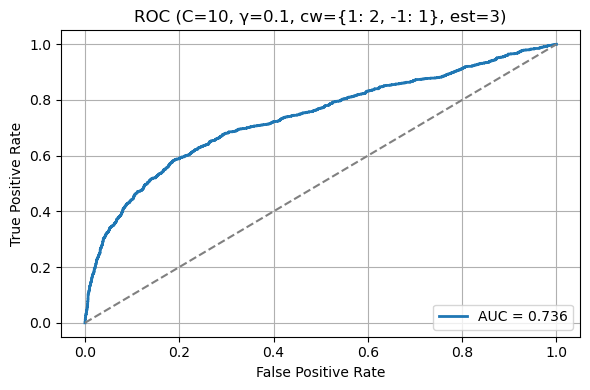

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  557  2859  645  439     0.759      0.463   0.559        0.816  0.507


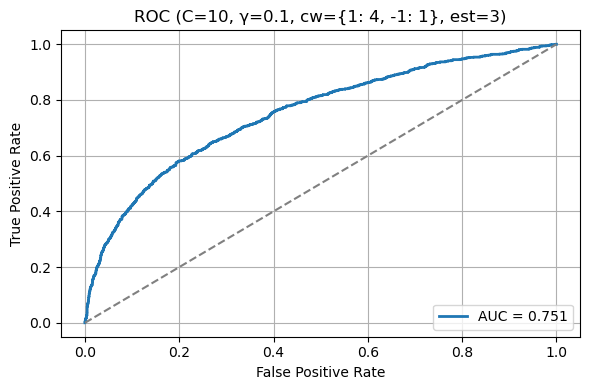

Model not found for (3, 0.3, 10, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


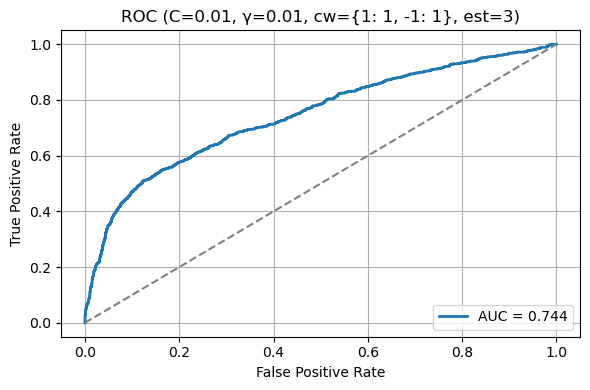

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  121  3441  63  875     0.792      0.658   0.121        0.982  0.205


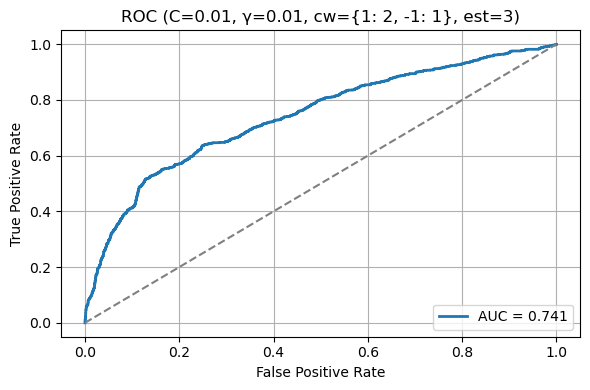

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  532  2848  656  464     0.751      0.448   0.534        0.813  0.487


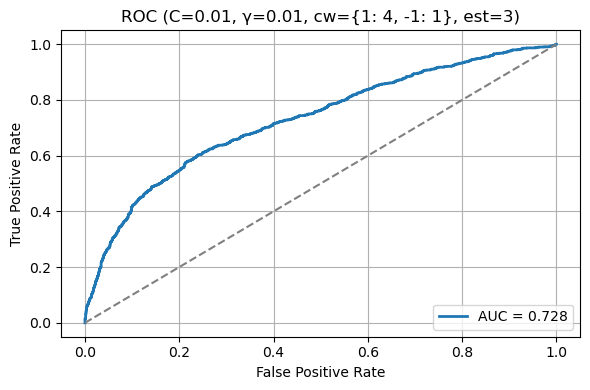

Model not found for (3, 0.6, 0.01, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  67  3483  21  929     0.789      0.761   0.067        0.994  0.124


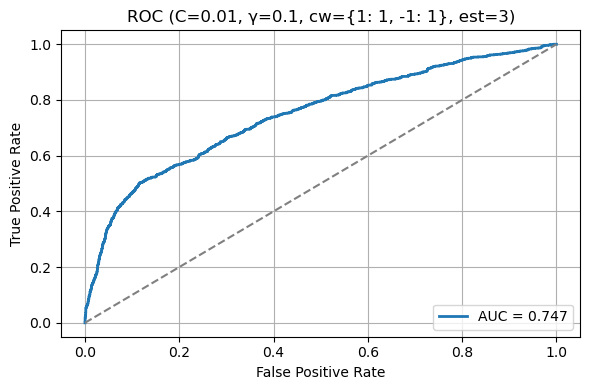

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  430  3204  300  566     0.808      0.589   0.432        0.914  0.498


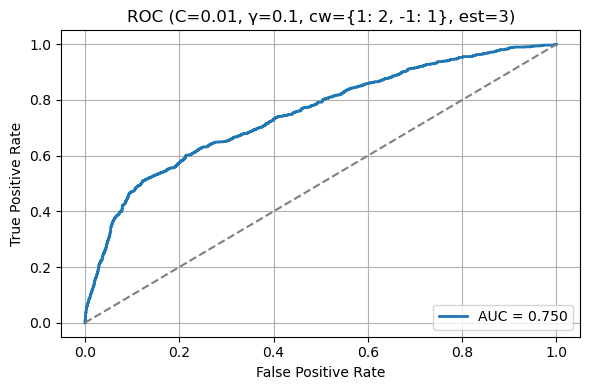

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  540  2971  533  456      0.78      0.503   0.542        0.848  0.522


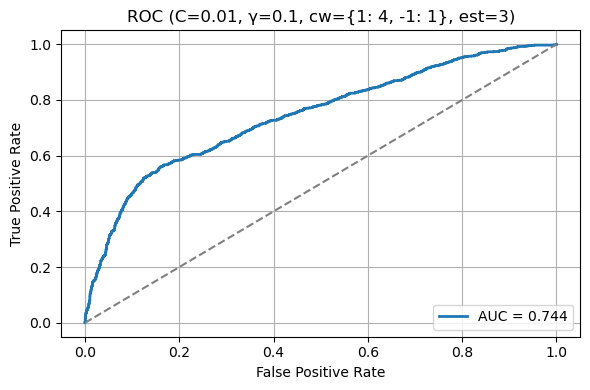

Model not found for (3, 0.6, 0.01, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity   F1
0  281  3376  128  715     0.813      0.687   0.282        0.963  0.4


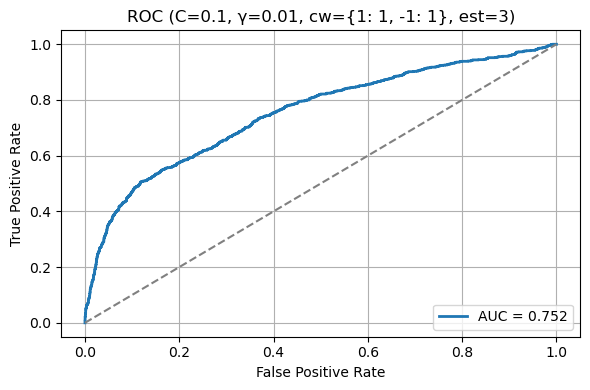

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  437  3195  309  559     0.807      0.586   0.439        0.912  0.502


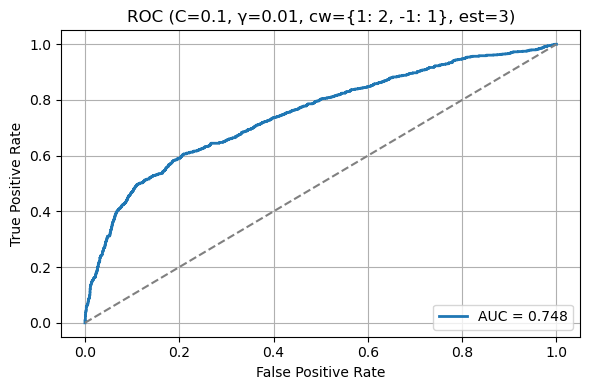

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  530  2977  527  466     0.779      0.501   0.532         0.85  0.516


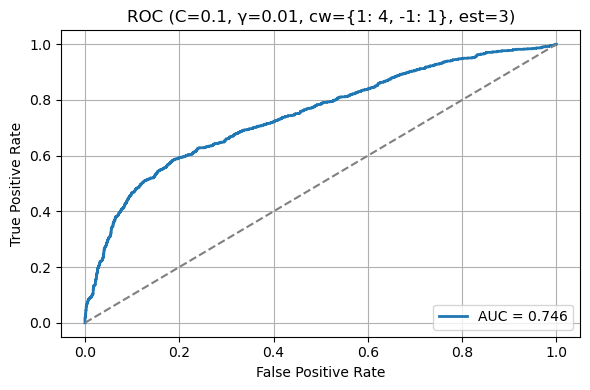

Model not found for (3, 0.6, 0.1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  313  3375  129  683      0.82      0.708   0.314        0.963  0.435


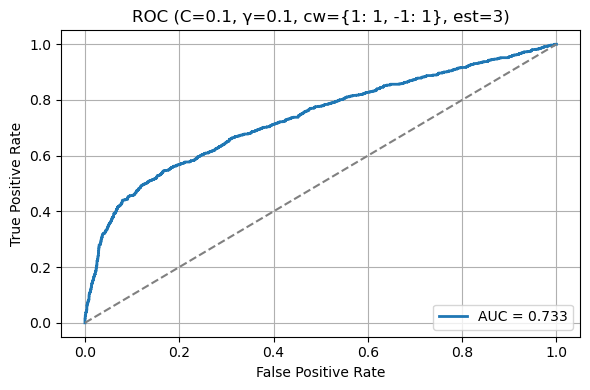

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  443  3188  316  553     0.807      0.584   0.445         0.91  0.505


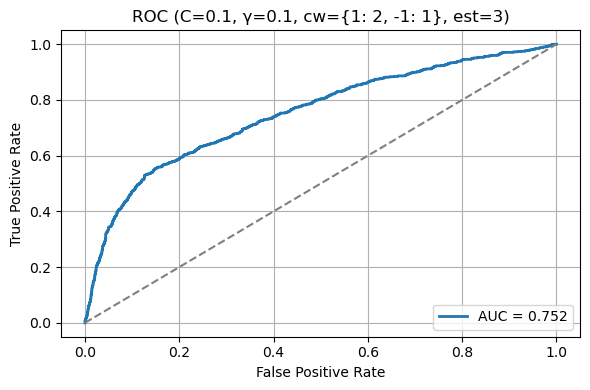

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  581  2854  650  415     0.763      0.472   0.583        0.814  0.522


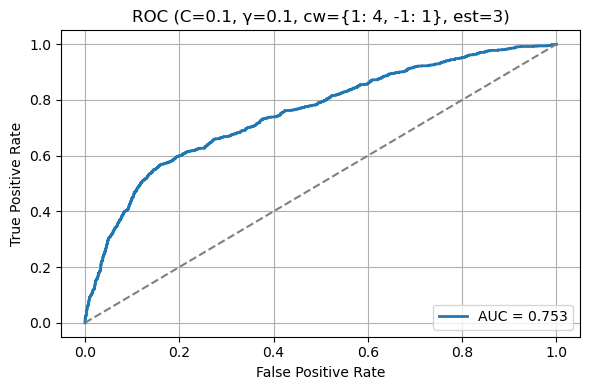

Model not found for (3, 0.6, 0.1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  318  3370  134  678      0.82      0.704   0.319        0.962  0.439


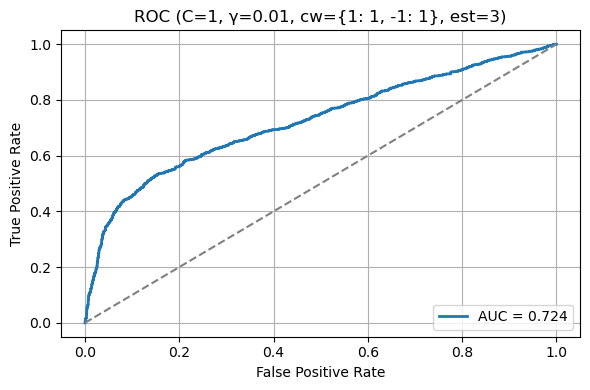

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  443  3193  311  553     0.808      0.588   0.445        0.911  0.506


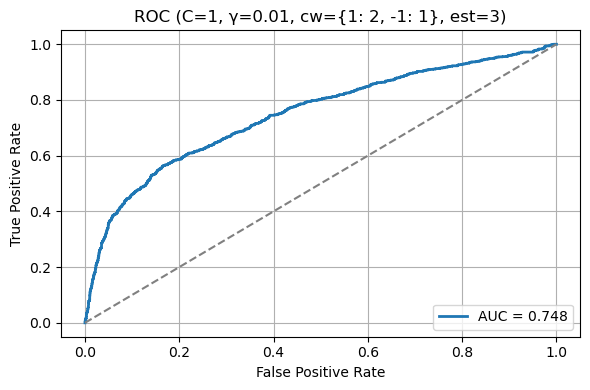

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  542  2935  569  454     0.773      0.488   0.544        0.838  0.514


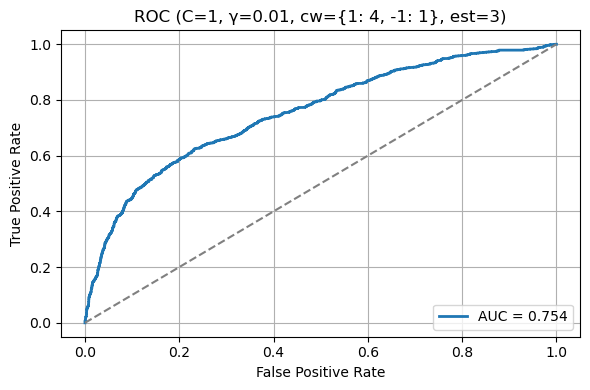

Model not found for (3, 0.6, 1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  338  3329  175  658     0.815      0.659   0.339         0.95  0.448


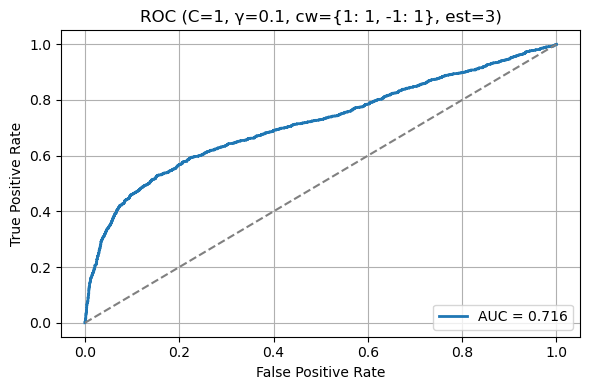

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  494  3109  395  502     0.801      0.556   0.496        0.887  0.524


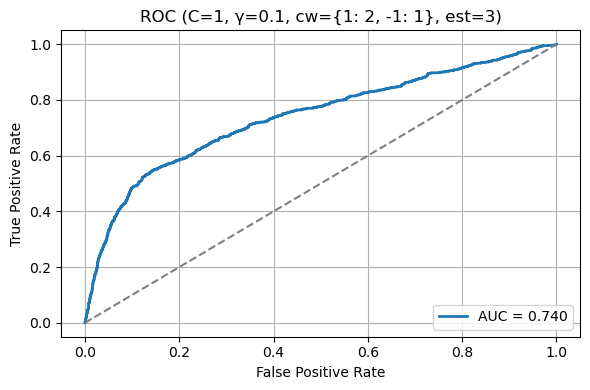

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  601  2785  719  395     0.752      0.455   0.603        0.795  0.519


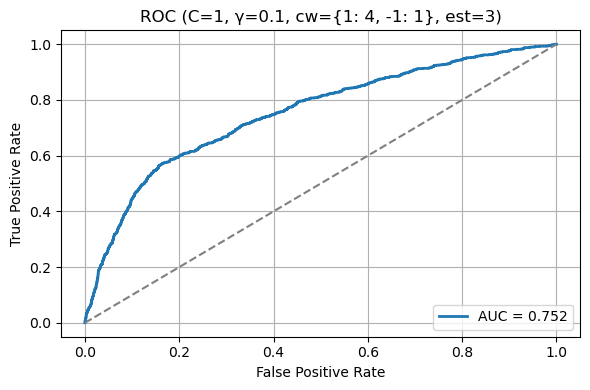

Model not found for (3, 0.6, 1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  322  3366  138  674      0.82        0.7   0.323        0.961  0.442


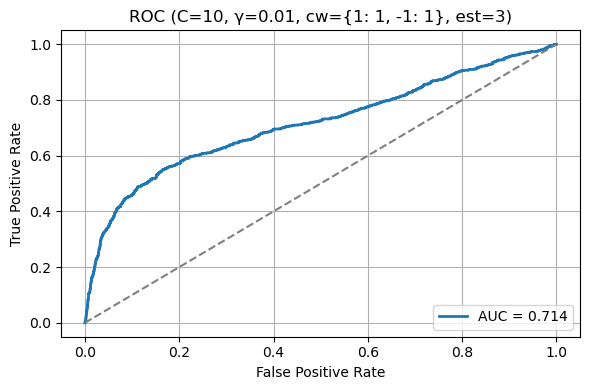

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  451  3181  323  545     0.807      0.583   0.453        0.908  0.51


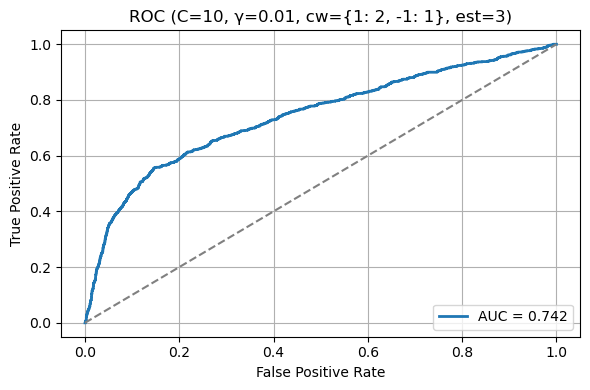

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  590  2825  679  406     0.759      0.465   0.592        0.806  0.521


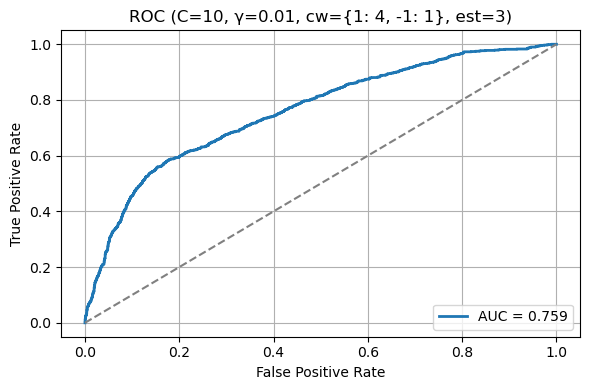

Model not found for (3, 0.6, 10, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  347  3322  182  649     0.815      0.656   0.348        0.948  0.455


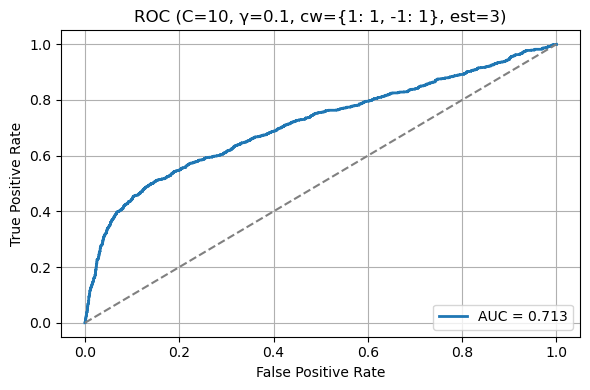

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  472  3118  386  524     0.798       0.55   0.474         0.89  0.509


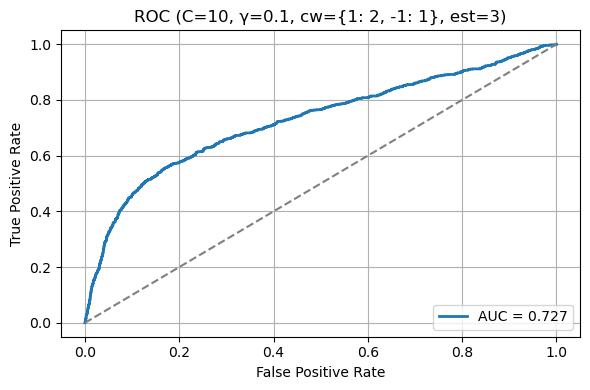

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  571  2798  706  425     0.749      0.447   0.573        0.799  0.502


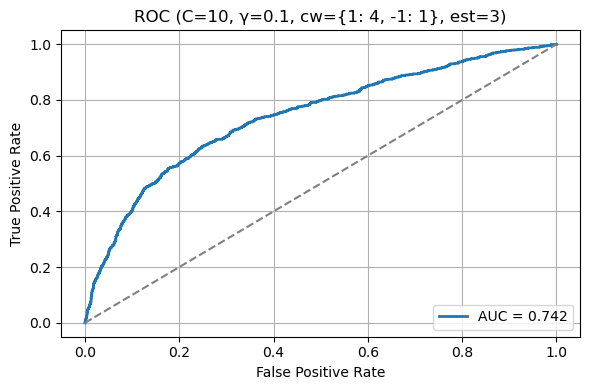

Model not found for (3, 0.6, 10, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


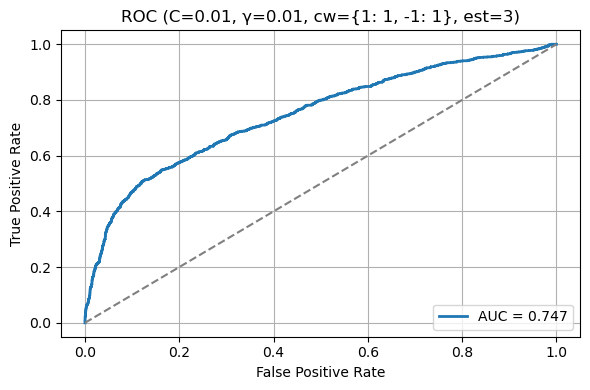

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  250  3365  139  746     0.803      0.643   0.251         0.96  0.361


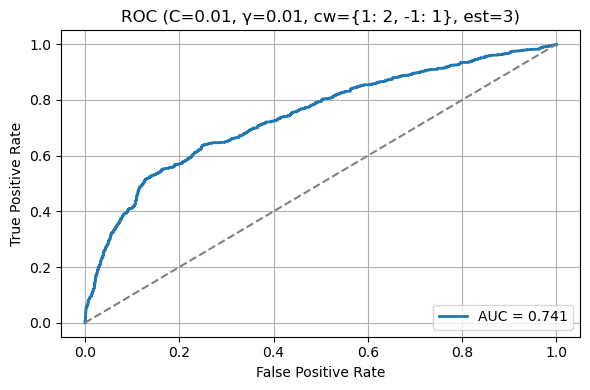

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  508  3041  463  488     0.789      0.523    0.51        0.868  0.517


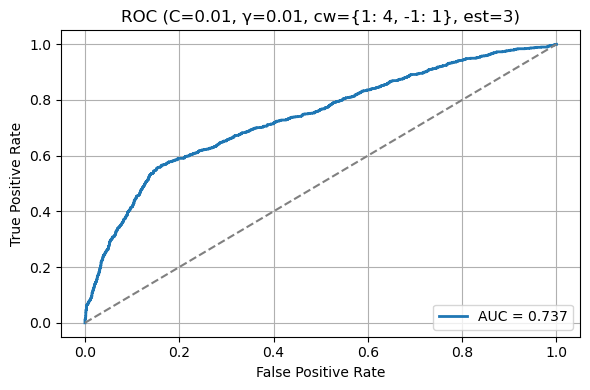

Model not found for (3, 0.9, 0.01, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  165  3429  75  831     0.799      0.688   0.166        0.979  0.267


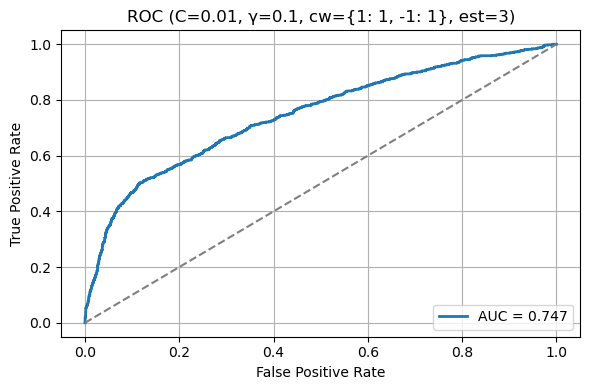

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  441  3199  305  555     0.809      0.591   0.443        0.913  0.506


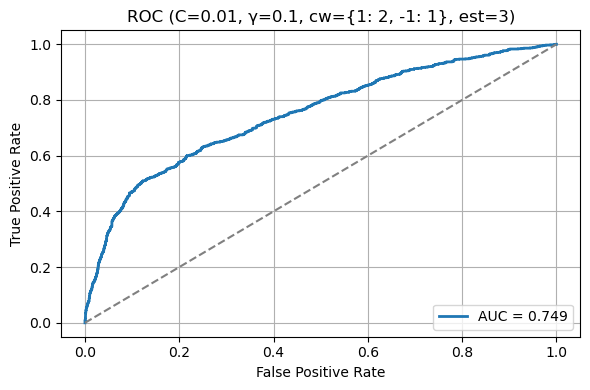

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  543  2976  528  453     0.782      0.507   0.545        0.849  0.525


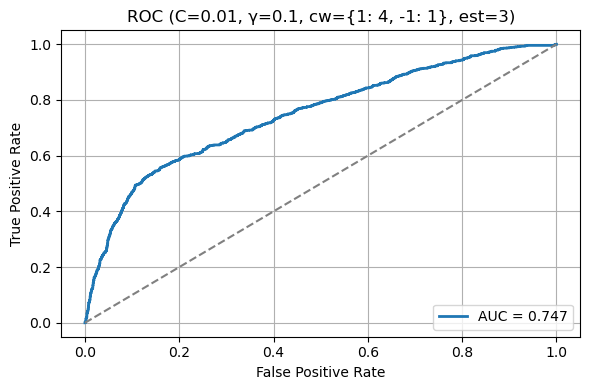

Model not found for (3, 0.9, 0.01, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  290  3382  122  706     0.816      0.704   0.291        0.965  0.412


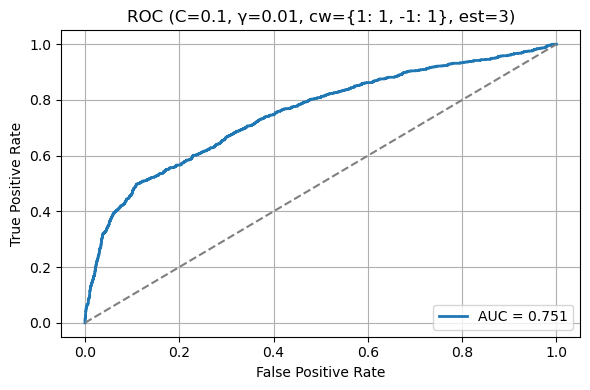

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  443  3190  314  553     0.807      0.585   0.445         0.91  0.505


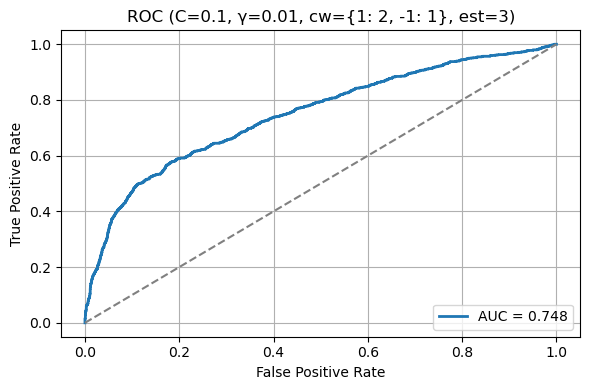

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  537  2959  545  459     0.777      0.496   0.539        0.844  0.517


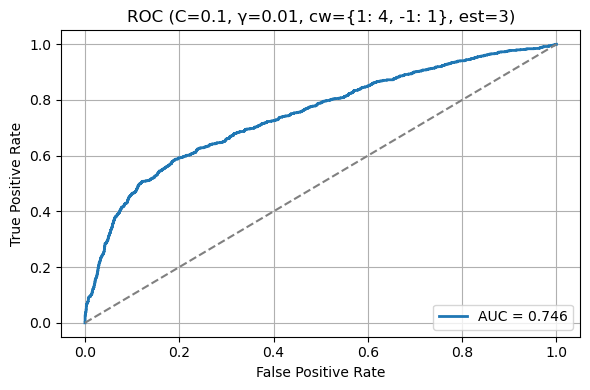

Model not found for (3, 0.9, 0.1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  318  3365  139  678     0.818      0.696   0.319         0.96  0.438


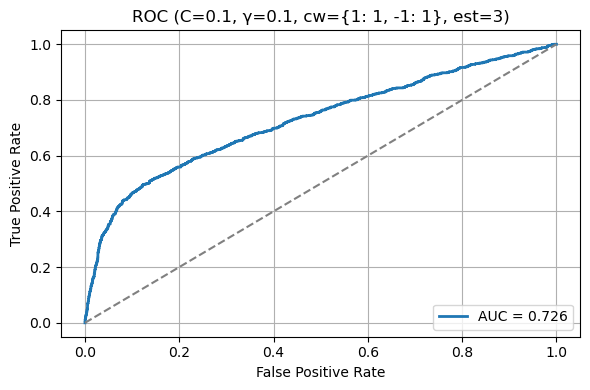

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  445  3185  319  551     0.807      0.582   0.447        0.909  0.506


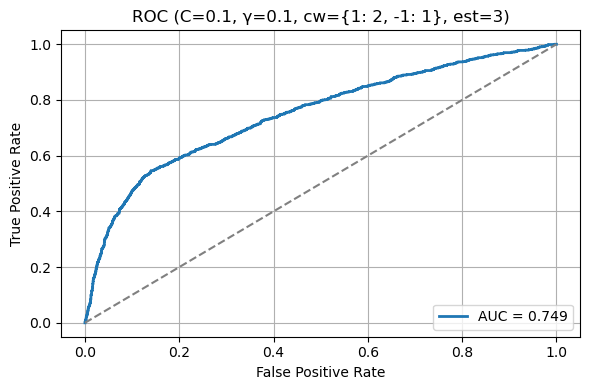

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  597  2828  676  399     0.761      0.469   0.599        0.807  0.526


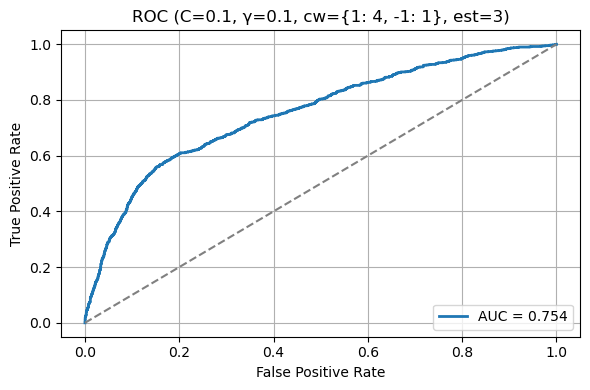

Model not found for (3, 0.9, 0.1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  320  3368  136  676      0.82      0.702   0.321        0.961  0.441


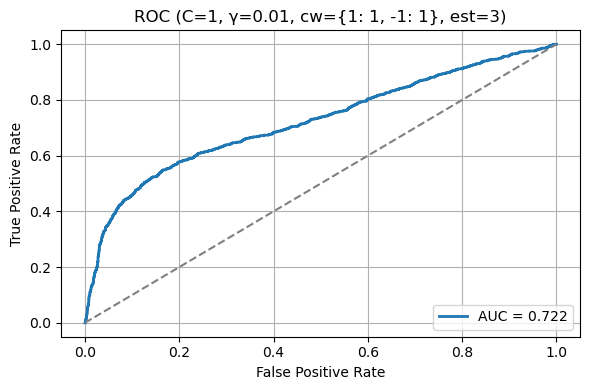

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  442  3192  312  554     0.808      0.586   0.444        0.911  0.505


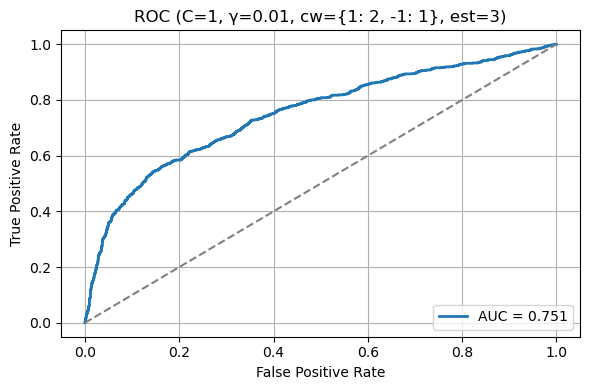

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  548  2921  583  448     0.771      0.485    0.55        0.834  0.515


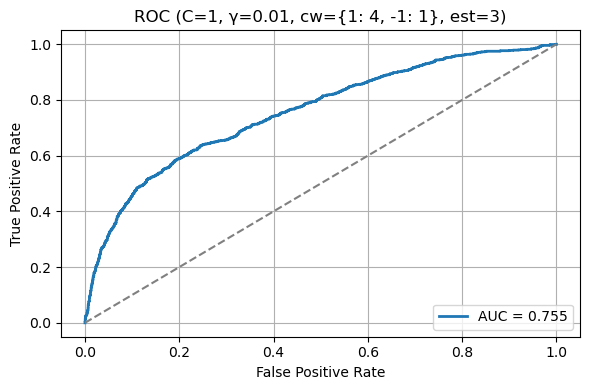

Model not found for (3, 0.9, 1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  342  3331  173  654     0.816      0.664   0.343        0.951  0.453


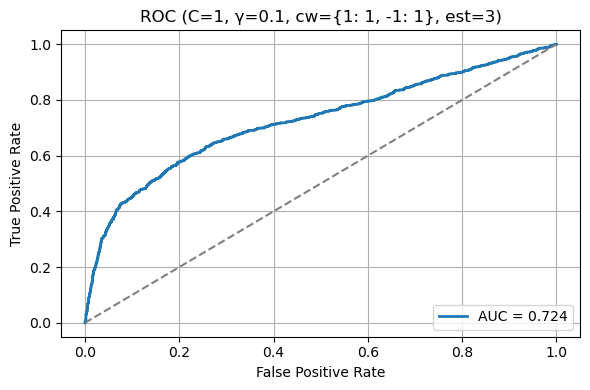

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  504  3097  407  492       0.8      0.553   0.506        0.884  0.529


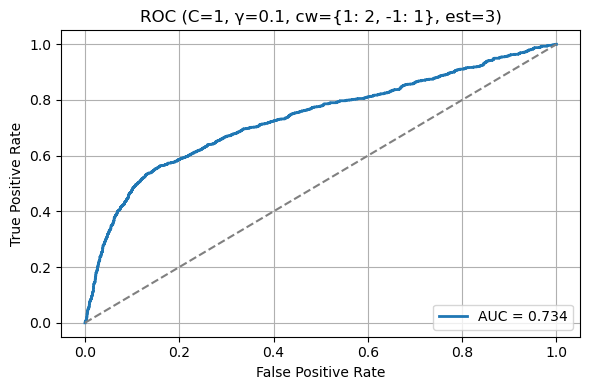

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  595  2779  725  401      0.75      0.451   0.597        0.793  0.514


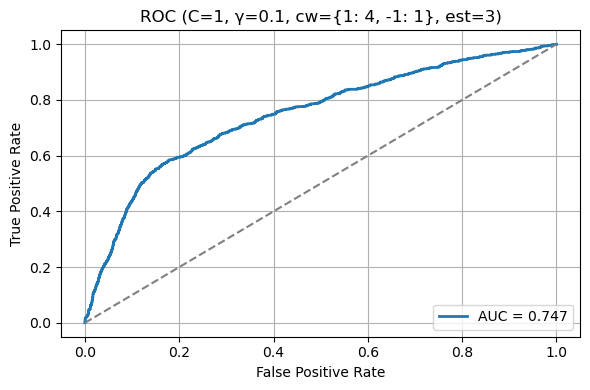

Model not found for (3, 0.9, 1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  322  3365  139  674     0.819      0.698   0.323         0.96  0.442


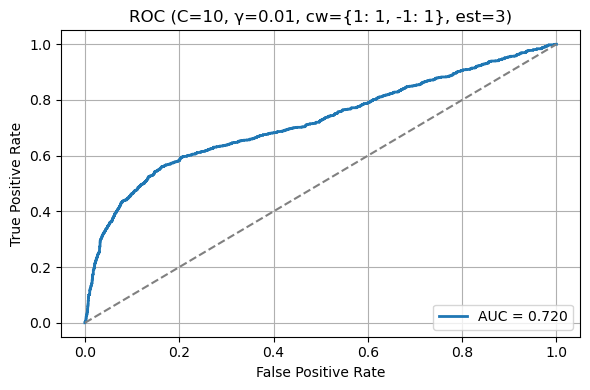

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  455  3176  328  541     0.807      0.581   0.457        0.906  0.512


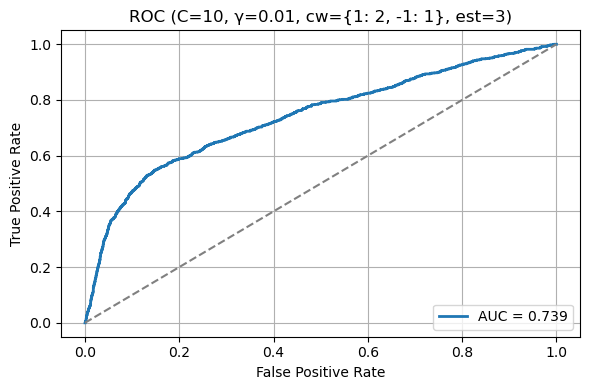

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  599  2821  683  397      0.76      0.467   0.601        0.805  0.526


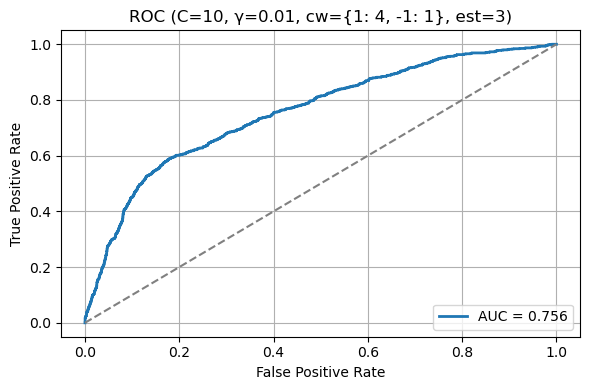

Model not found for (3, 0.9, 10, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  352  3329  175  644     0.818      0.668   0.353         0.95  0.462


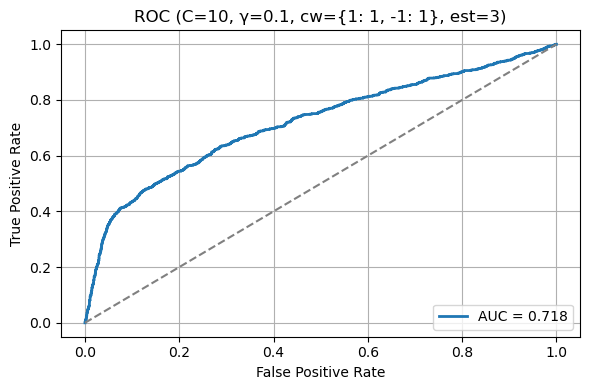

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  484  3122  382  512     0.801      0.559   0.486        0.891  0.52


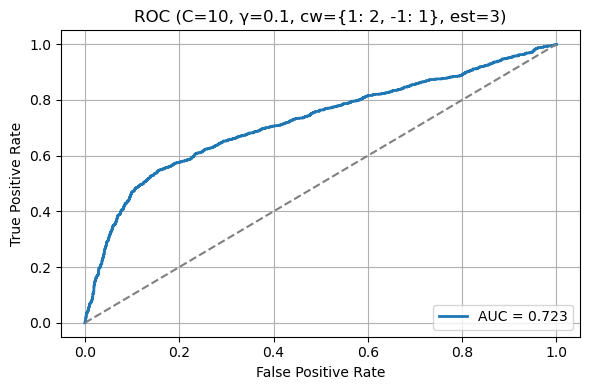

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 3, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  583  2782  722  413     0.748      0.447   0.585        0.794  0.507


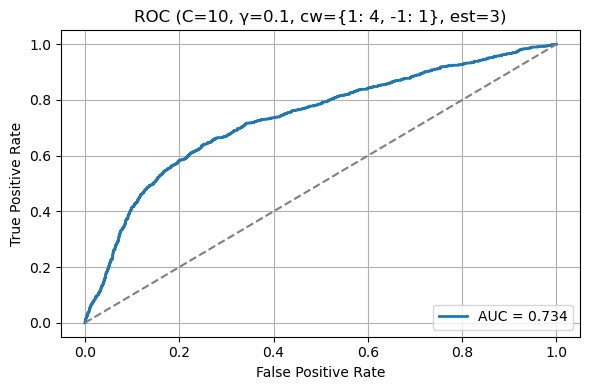

Model not found for (3, 0.9, 10, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


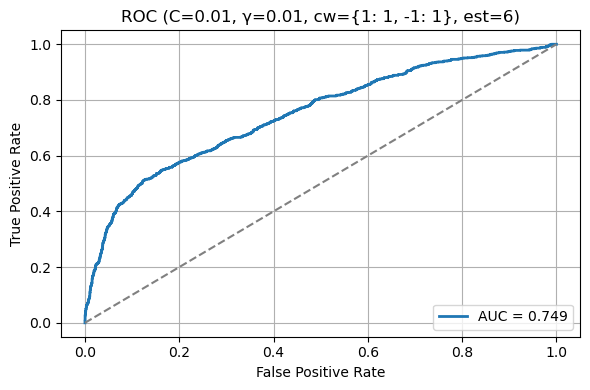

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


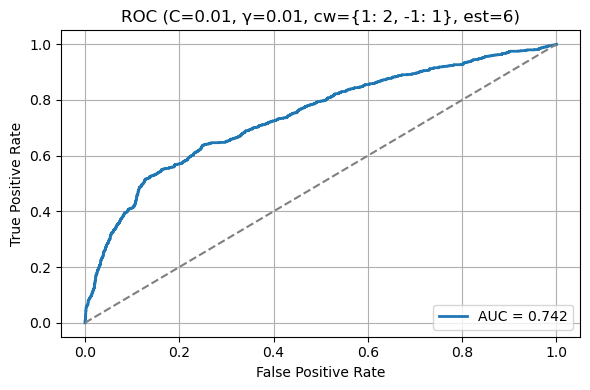

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP   TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  936  646  2858  60     0.352      0.247    0.94        0.184  0.391


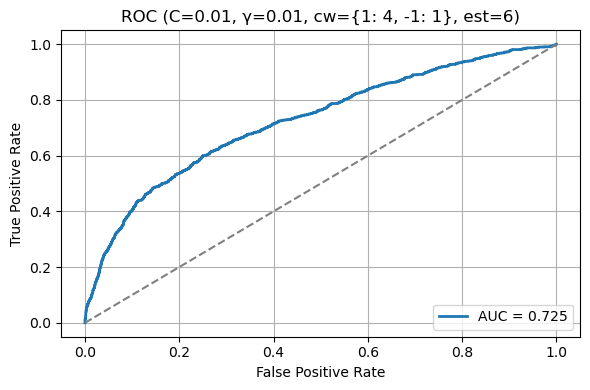

Model not found for (6, 0.3, 0.01, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


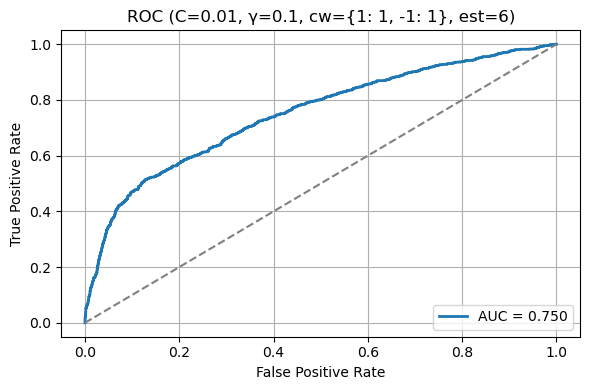

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  294  3329  175  702     0.805      0.627   0.295         0.95  0.401


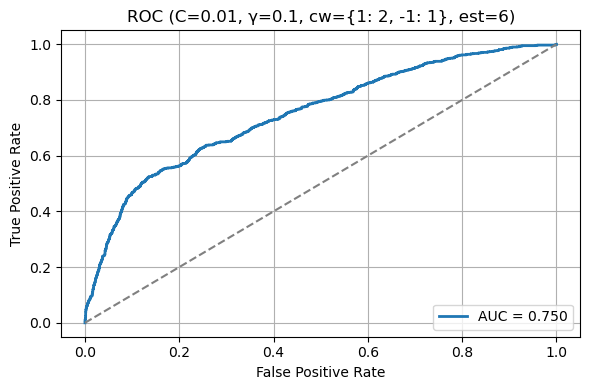

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  563  2908  596  433     0.771      0.486   0.565         0.83  0.523


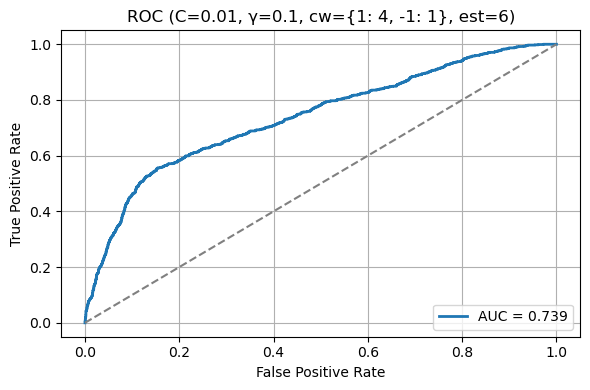

Model not found for (6, 0.3, 0.01, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  71  3481  23  925     0.789      0.755   0.071        0.993  0.13


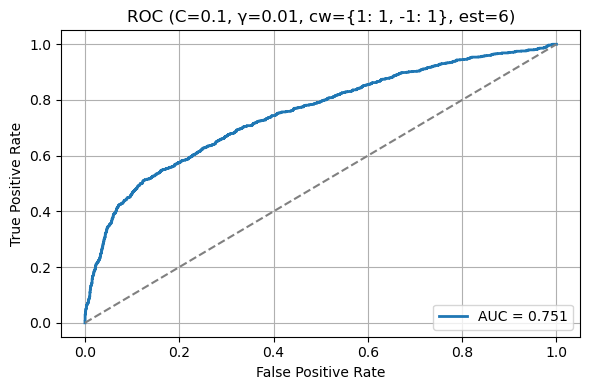

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  341  3290  214  655     0.807      0.614   0.342        0.939  0.44


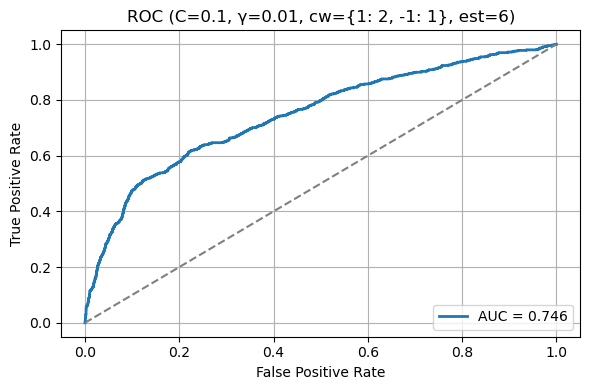

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  530  3003  501  466     0.785      0.514   0.532        0.857  0.523


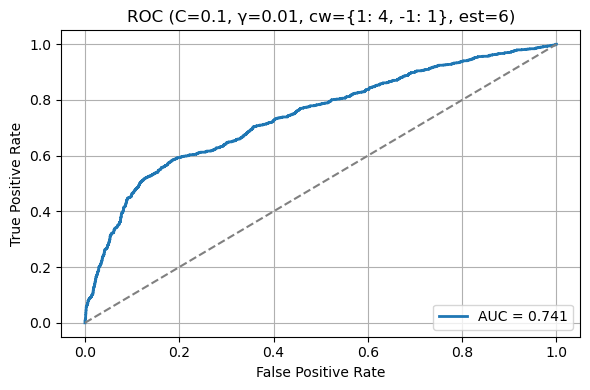

Model not found for (6, 0.3, 0.1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  294  3384  120  702     0.817       0.71   0.295        0.966  0.417


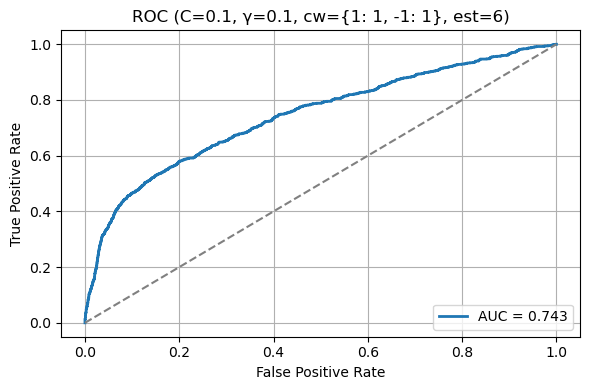

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  436  3197  307  560     0.807      0.587   0.438        0.912  0.501


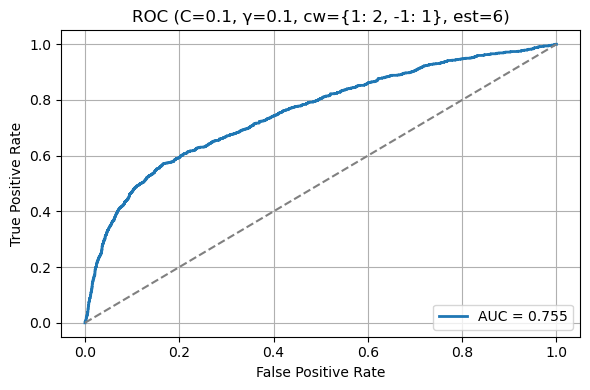

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  566  2893  611  430     0.769      0.481   0.568        0.826  0.521


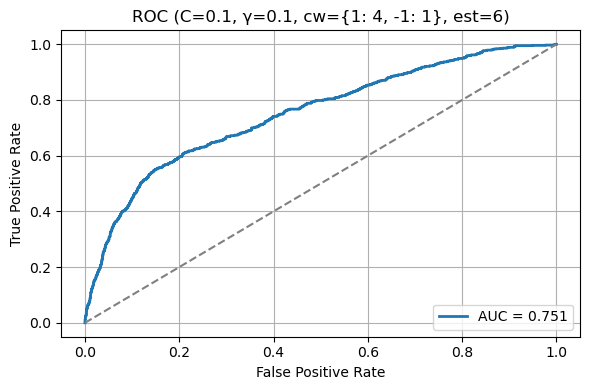

Model not found for (6, 0.3, 0.1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  312  3372  132  684     0.819      0.703   0.313        0.962  0.433


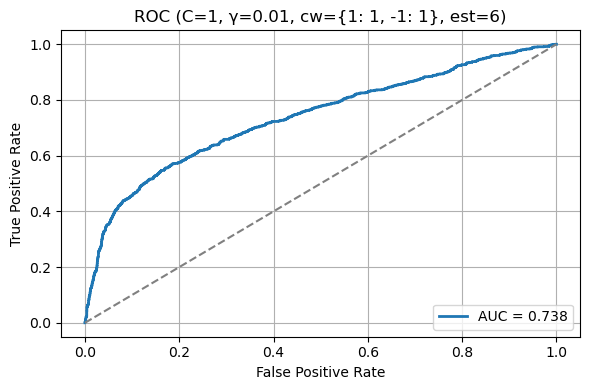

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  444  3189  315  552     0.807      0.585   0.446         0.91  0.506


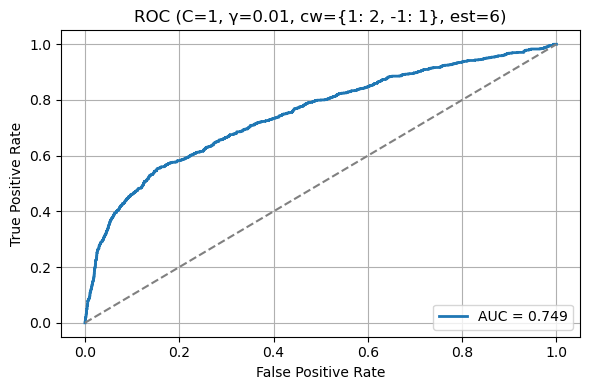

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  534  2951  553  462     0.774      0.491   0.536        0.842  0.513


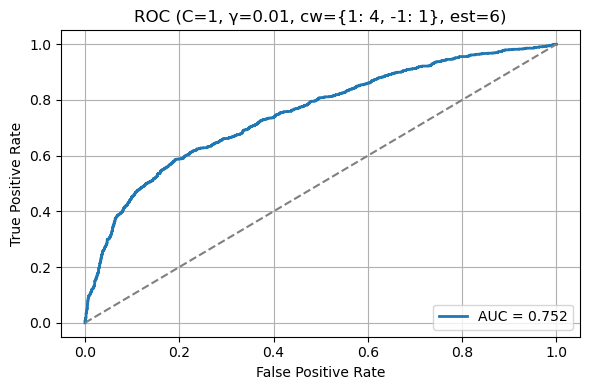

Model not found for (6, 0.3, 1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  338  3332  172  658     0.816      0.663   0.339        0.951  0.449


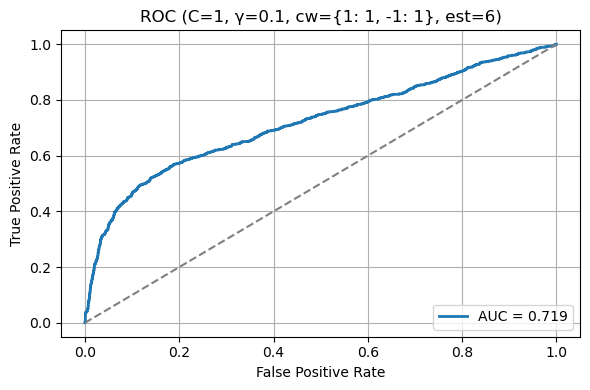

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  478  3132  372  518     0.802      0.562    0.48        0.894  0.518


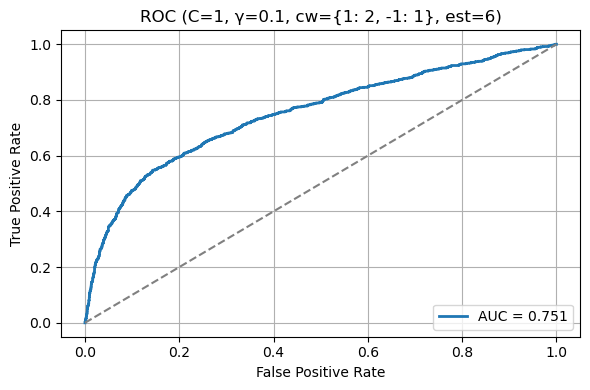

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  595  2800  704  401     0.754      0.458   0.597        0.799  0.519


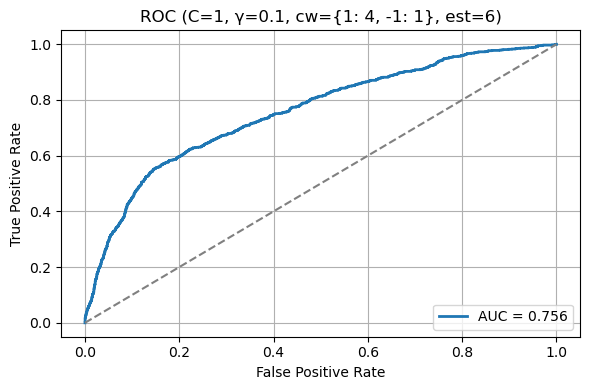

Model not found for (6, 0.3, 1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  320  3367  137  676     0.819        0.7   0.321        0.961  0.44


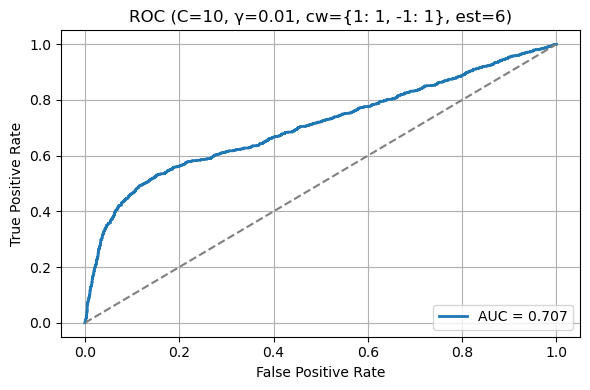

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  441  3192  312  555     0.807      0.586   0.443        0.911  0.504


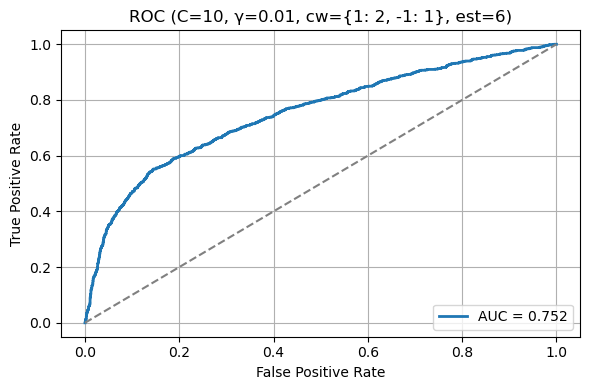

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  568  2875  629  428     0.765      0.475    0.57         0.82  0.518


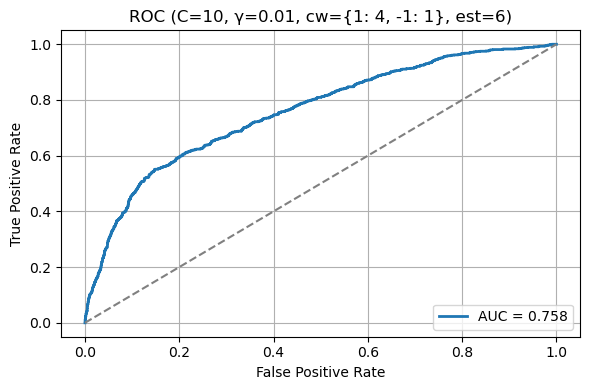

Model not found for (6, 0.3, 10, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  351  3318  186  645     0.815      0.654   0.352        0.947  0.458


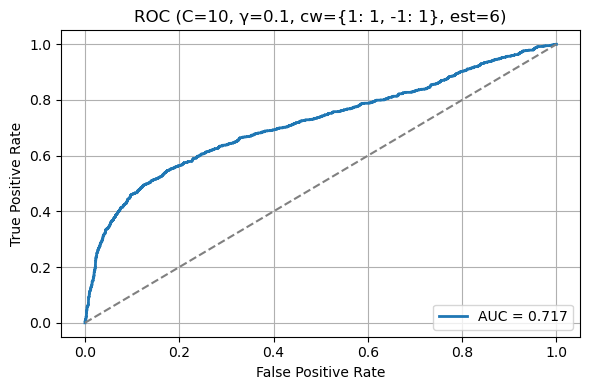

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  457  3150  354  539     0.802      0.564   0.459        0.899  0.506


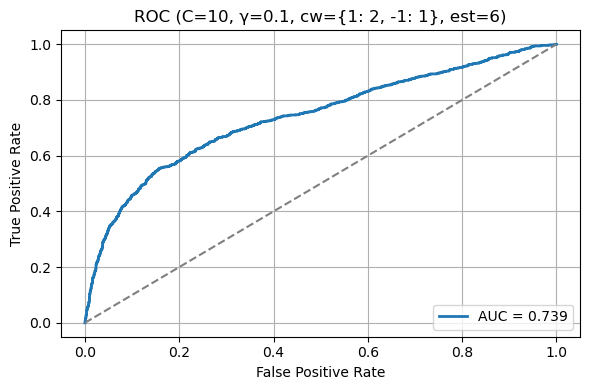

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  569  2847  657  427     0.759      0.464   0.571        0.812  0.512


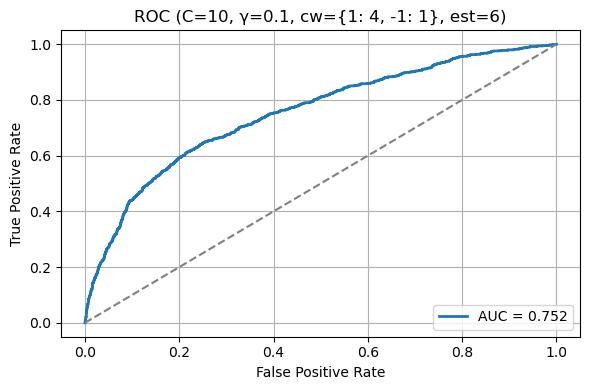

Model not found for (6, 0.3, 10, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


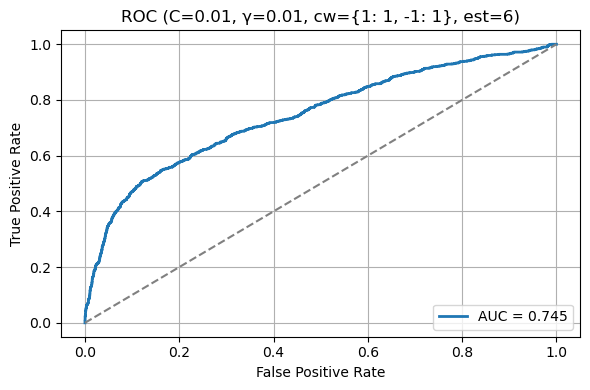

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  118  3443  61  878     0.791      0.659   0.118        0.983  0.201


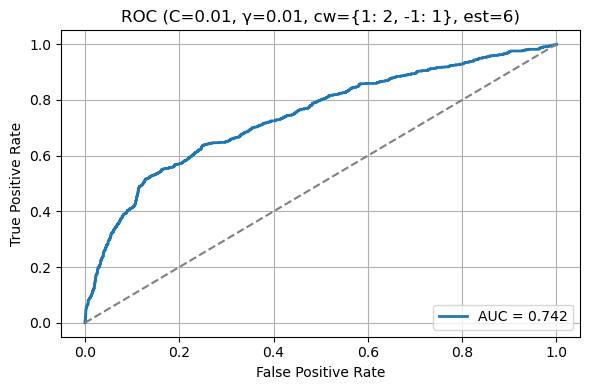

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  515  2912  592  481     0.762      0.465   0.517        0.831  0.49


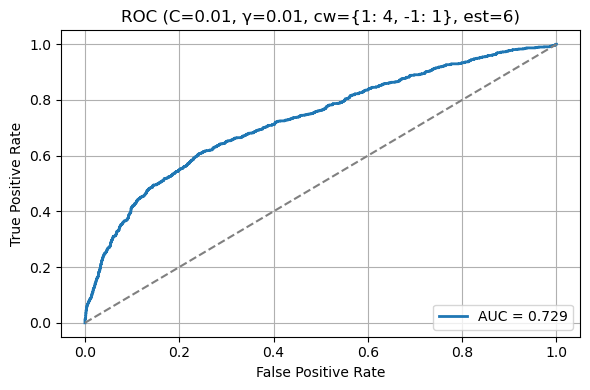

Model not found for (6, 0.6, 0.01, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  62  3489  15  934     0.789      0.805   0.062        0.996  0.116


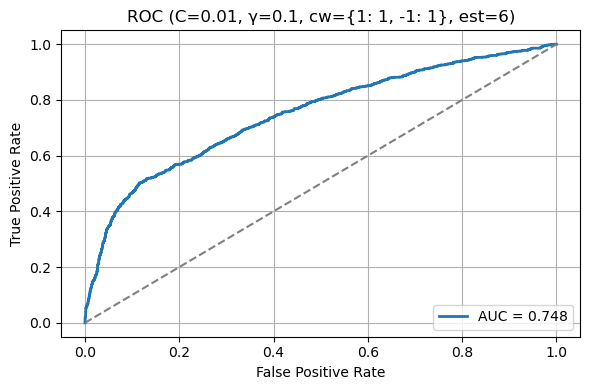

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  430  3204  300  566     0.808      0.589   0.432        0.914  0.498


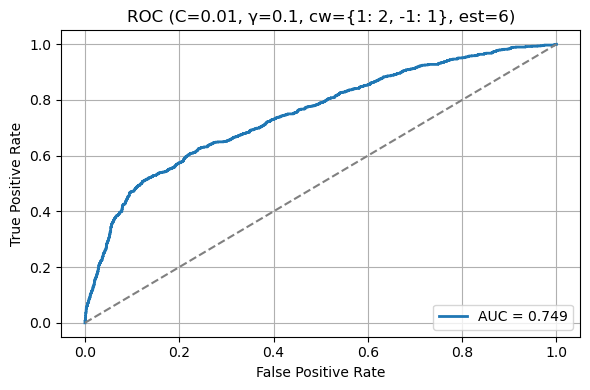

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  539  2975  529  457     0.781      0.505   0.541        0.849  0.522


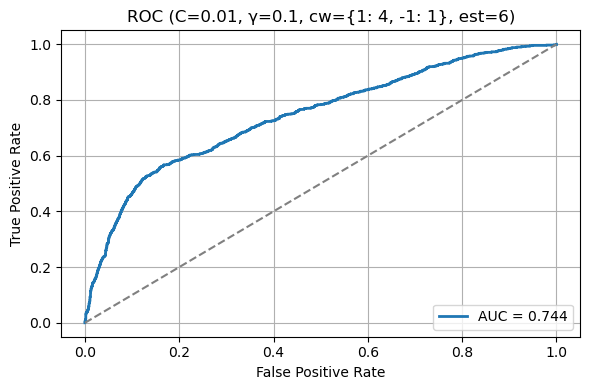

Model not found for (6, 0.6, 0.01, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  228  3416  88  768      0.81      0.722   0.229        0.975  0.348


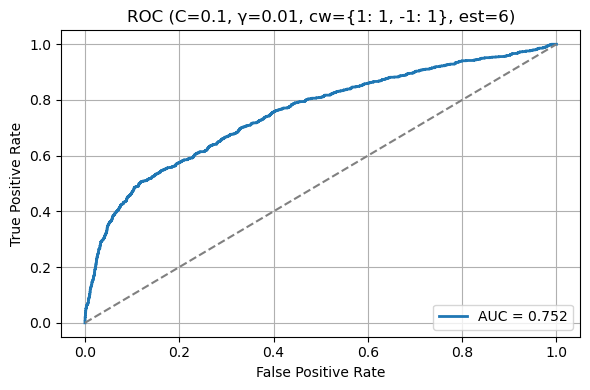

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  437  3196  308  559     0.807      0.587   0.439        0.912  0.502


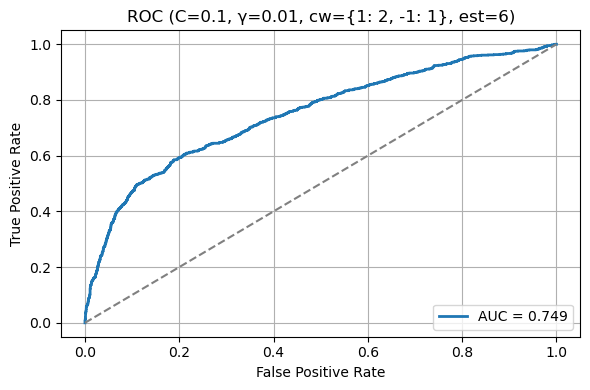

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  530  2980  524  466      0.78      0.503   0.532         0.85  0.517


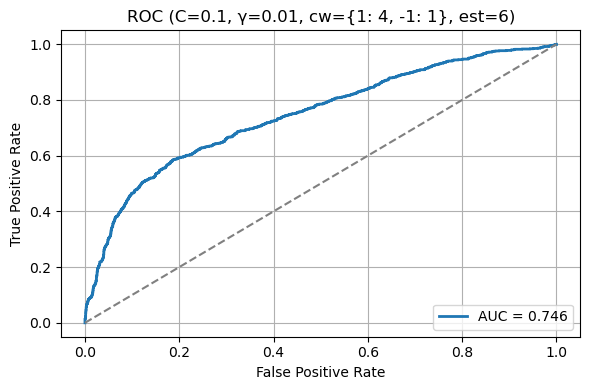

Model not found for (6, 0.6, 0.1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  313  3374  130  683     0.819      0.707   0.314        0.963  0.435


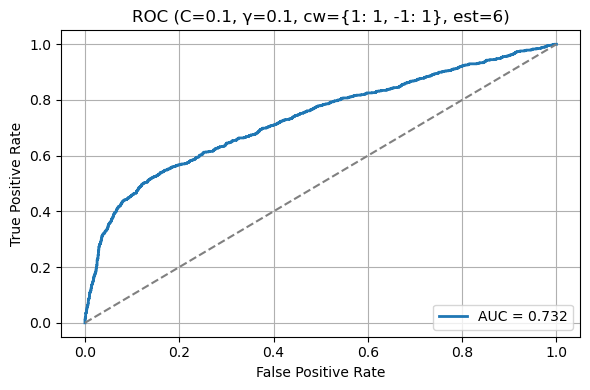

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  442  3186  318  554     0.806      0.582   0.444        0.909  0.503


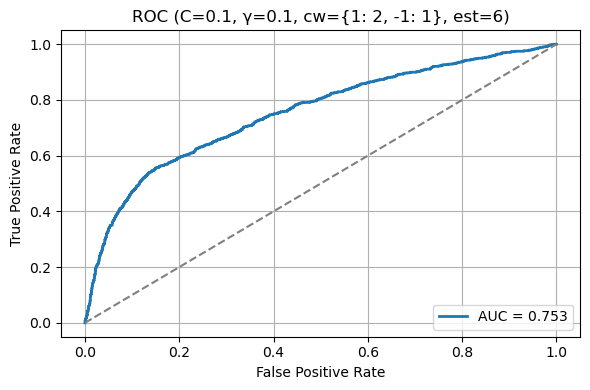

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  579  2866  638  417     0.766      0.476   0.581        0.818  0.523


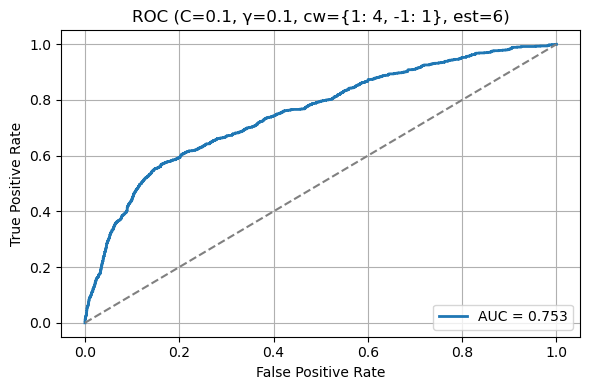

Model not found for (6, 0.6, 0.1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  318  3370  134  678      0.82      0.704   0.319        0.962  0.439


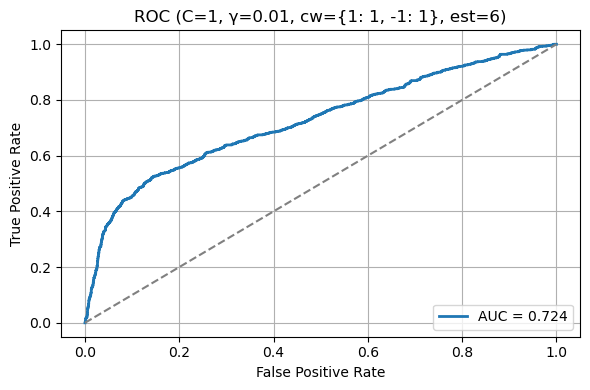

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  444  3193  311  552     0.808      0.588   0.446        0.911  0.507


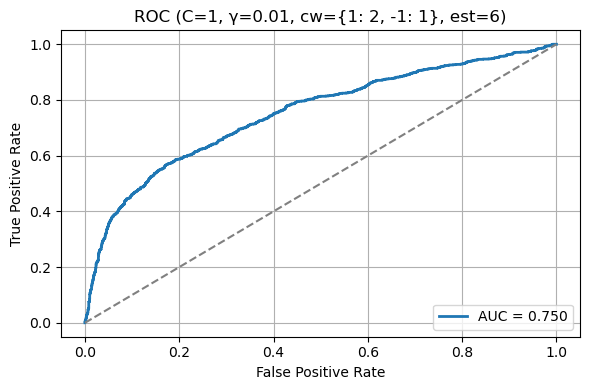

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  542  2937  567  454     0.773      0.489   0.544        0.838  0.515


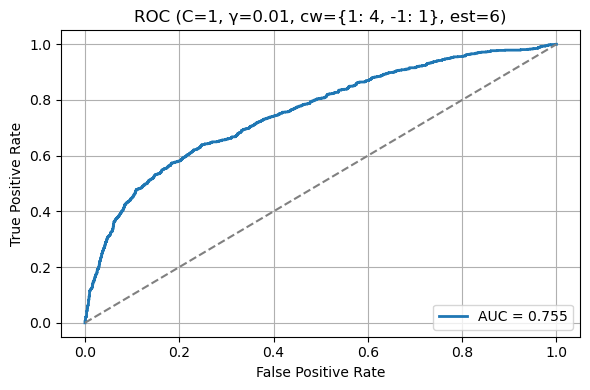

Model not found for (6, 0.6, 1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  340  3329  175  656     0.815       0.66   0.341         0.95  0.45


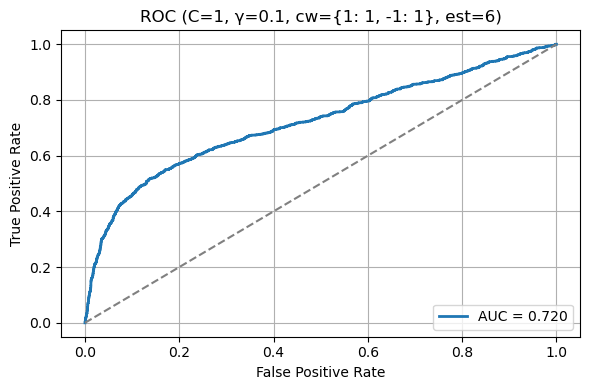

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  490  3119  385  506     0.802       0.56   0.492         0.89  0.524


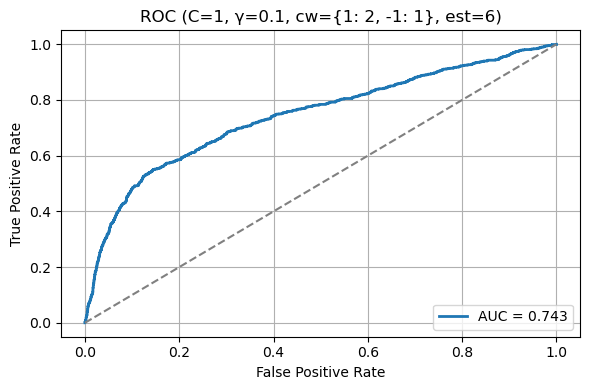

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  595  2794  710  401     0.753      0.456   0.597        0.797  0.517


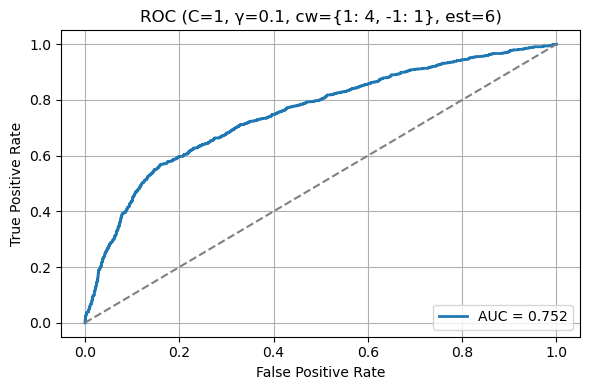

Model not found for (6, 0.6, 1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  320  3366  138  676     0.819      0.699   0.321        0.961  0.44


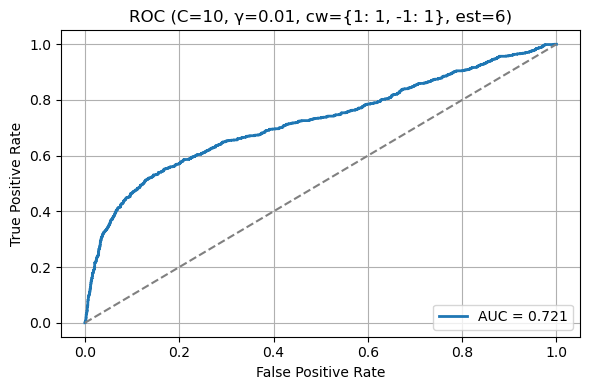

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  449  3182  322  547     0.807      0.582   0.451        0.908  0.508


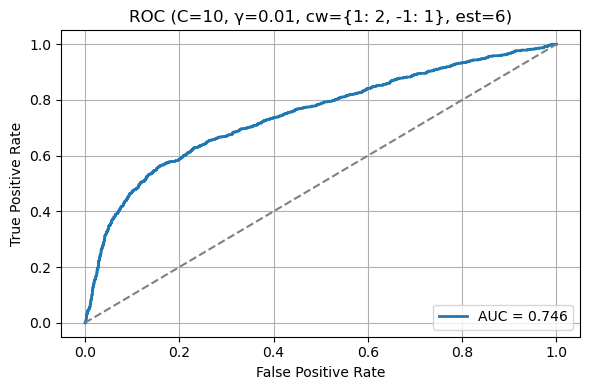

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  590  2831  673  406      0.76      0.467   0.592        0.808  0.522


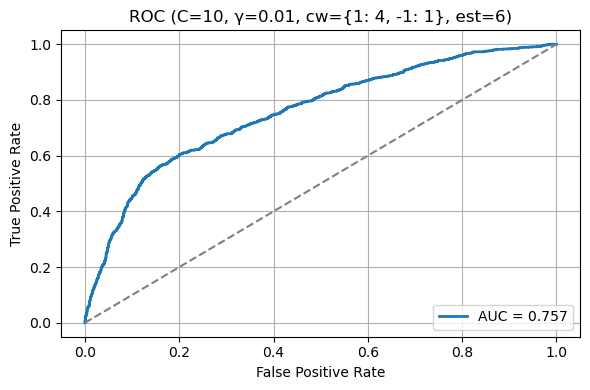

Model not found for (6, 0.6, 10, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  348  3323  181  648     0.816      0.658   0.349        0.948  0.456


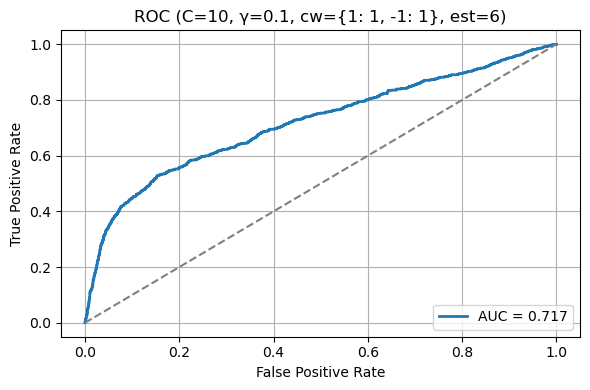

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  472  3128  376  524       0.8      0.557   0.474        0.893  0.512


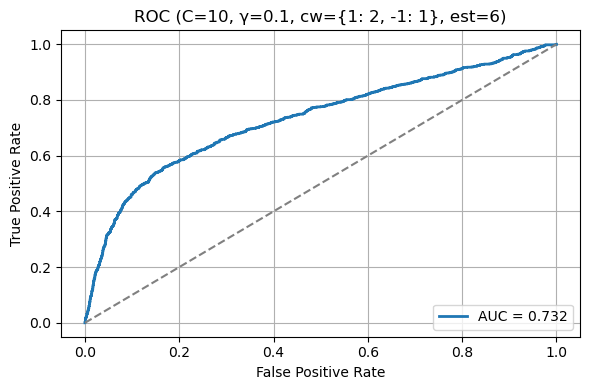

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  578  2808  696  418     0.752      0.454    0.58        0.801  0.509


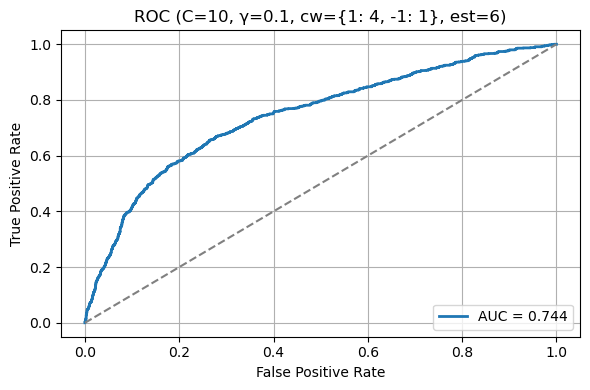

Model not found for (6, 0.6, 10, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


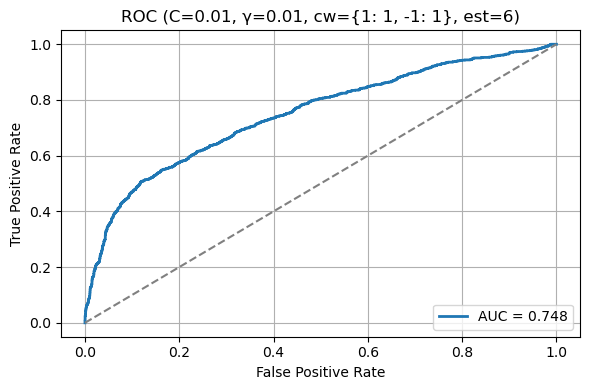

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  249  3365  139  747     0.803      0.642    0.25         0.96  0.36


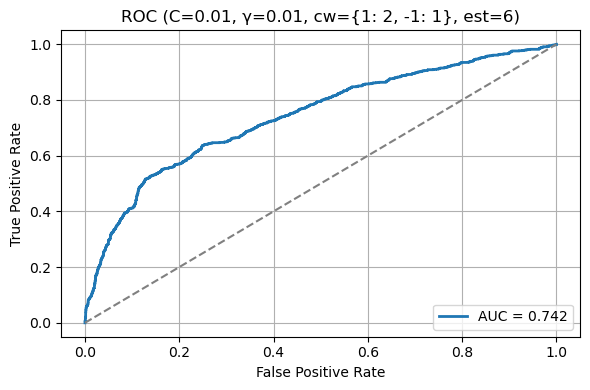

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  503  3051  453  493      0.79      0.526   0.505        0.871  0.515


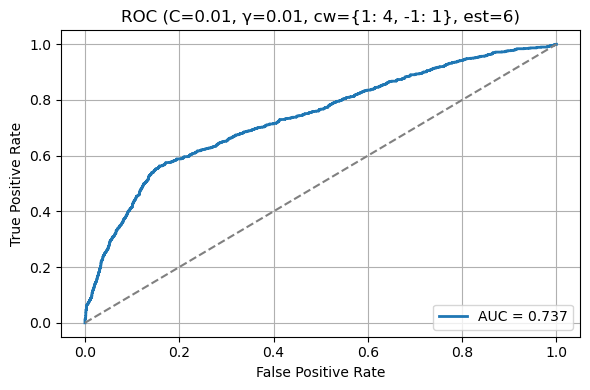

Model not found for (6, 0.9, 0.01, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  163  3429  75  833     0.798      0.685   0.164        0.979  0.264


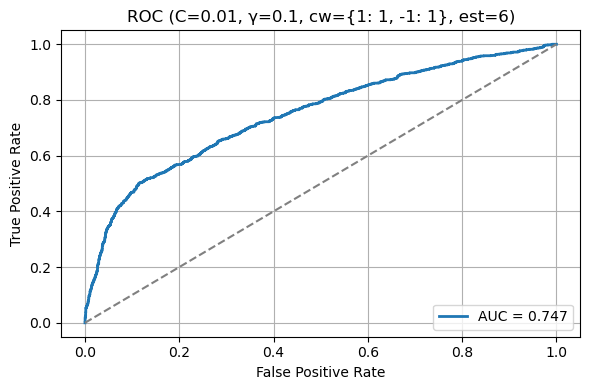

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  440  3199  305  556     0.809      0.591   0.442        0.913  0.505


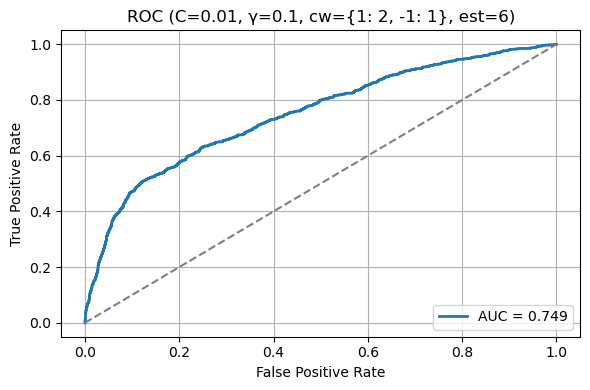

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  543  2978  526  453     0.782      0.508   0.545         0.85  0.526


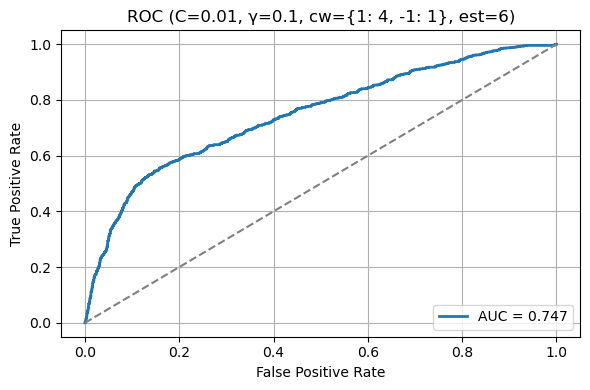

Model not found for (6, 0.9, 0.01, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  290  3382  122  706     0.816      0.704   0.291        0.965  0.412


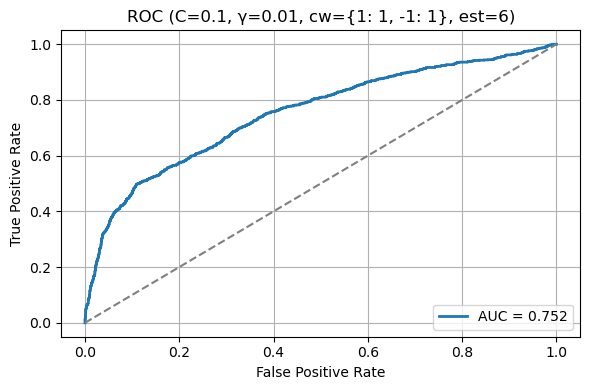

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  441  3190  314  555     0.807      0.584   0.443         0.91  0.504


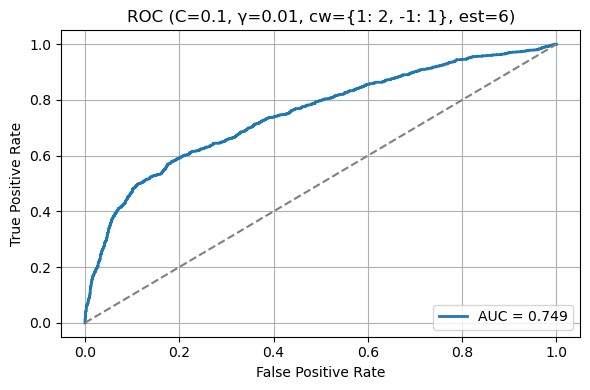

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  537  2959  545  459     0.777      0.496   0.539        0.844  0.517


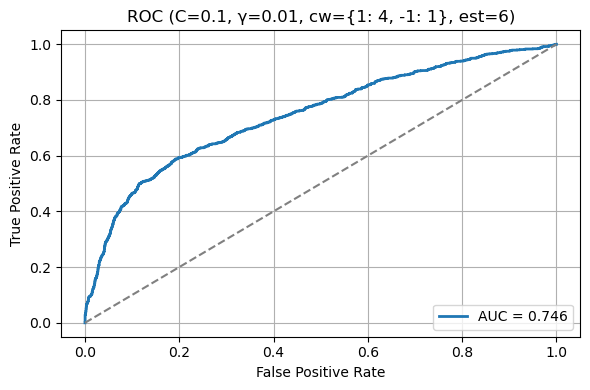

Model not found for (6, 0.9, 0.1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  319  3369  135  677      0.82      0.703    0.32        0.961  0.44


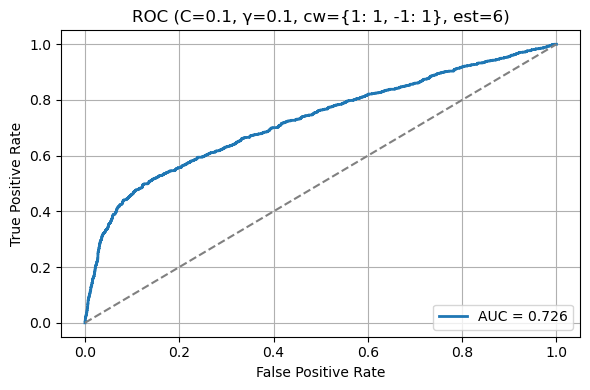

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  446  3185  319  550     0.807      0.583   0.448        0.909  0.507


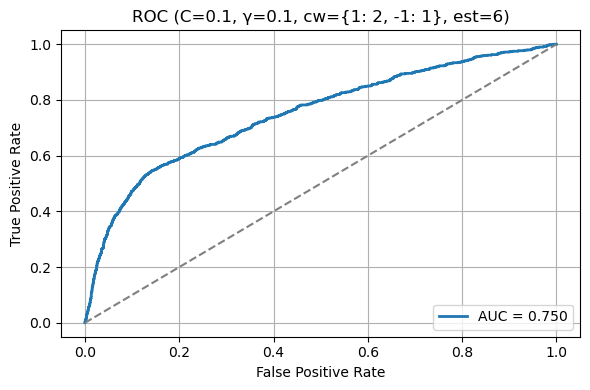

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  601  2816  688  395     0.759      0.466   0.603        0.804  0.526


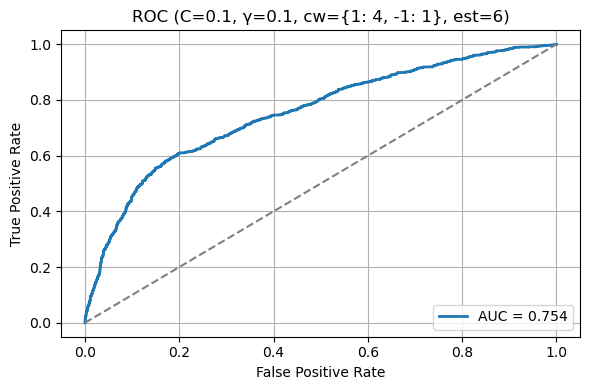

Model not found for (6, 0.9, 0.1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  320  3368  136  676      0.82      0.702   0.321        0.961  0.441


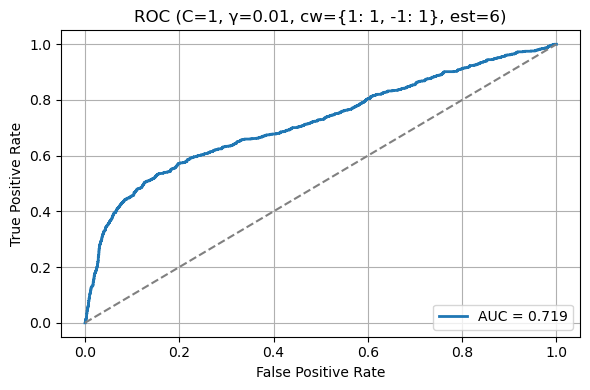

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  440  3192  312  556     0.807      0.585   0.442        0.911  0.503


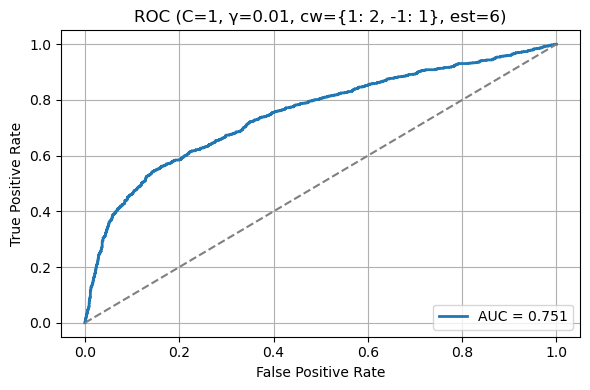

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  549  2920  584  447     0.771      0.485   0.551        0.833  0.516


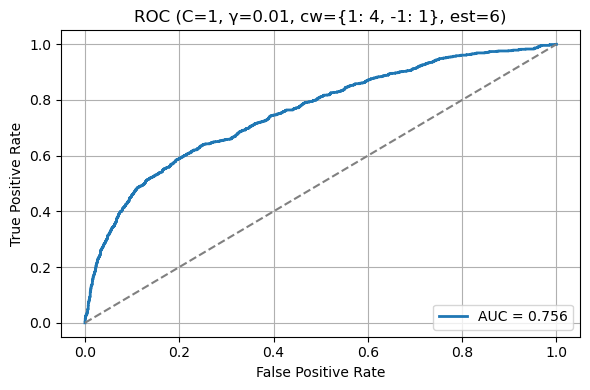

Model not found for (6, 0.9, 1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  342  3334  170  654     0.817      0.668   0.343        0.951  0.454


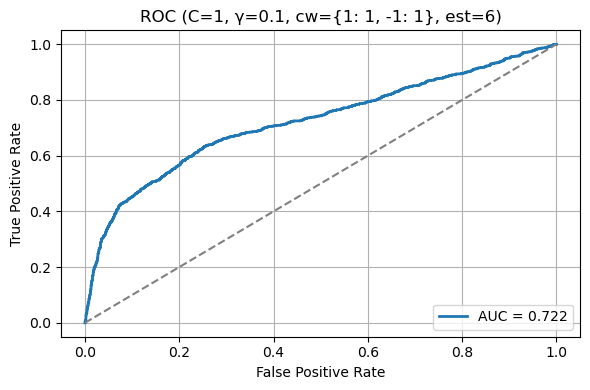

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  500  3103  401  496     0.801      0.555   0.502        0.886  0.527


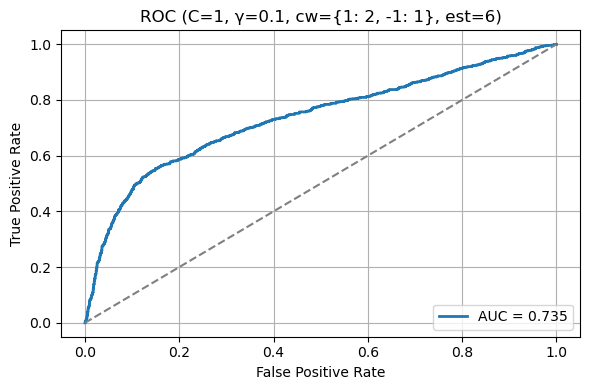

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  596  2787  717  400     0.752      0.454   0.598        0.795  0.516


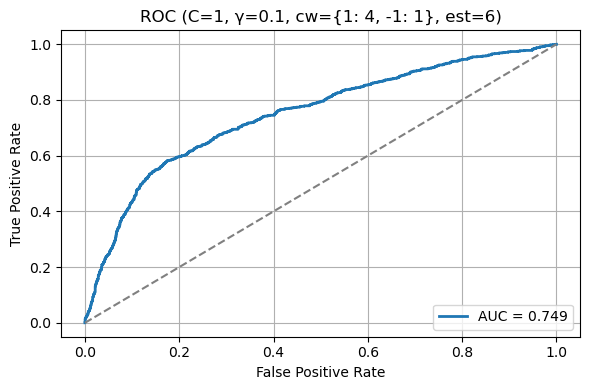

Model not found for (6, 0.9, 1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  321  3366  138  675     0.819      0.699   0.322        0.961  0.441


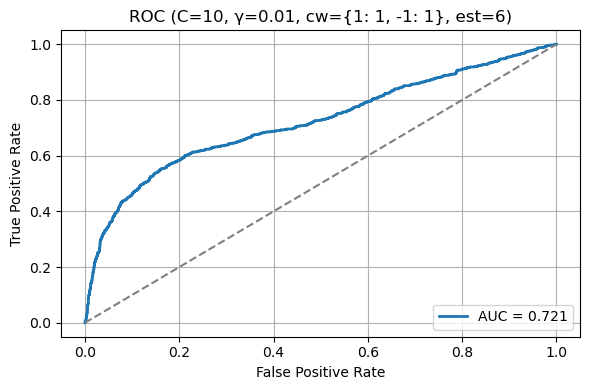

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  452  3180  324  544     0.807      0.582   0.454        0.908  0.51


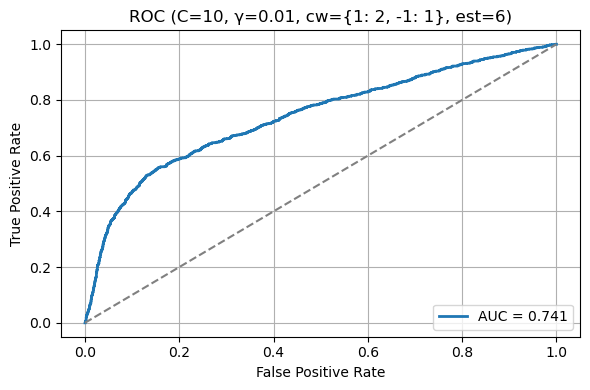

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  597  2828  676  399     0.761      0.469   0.599        0.807  0.526


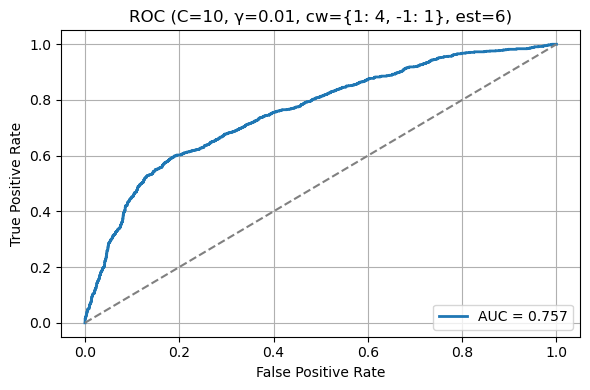

Model not found for (6, 0.9, 10, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  350  3333  171  646     0.818      0.672   0.351        0.951  0.461


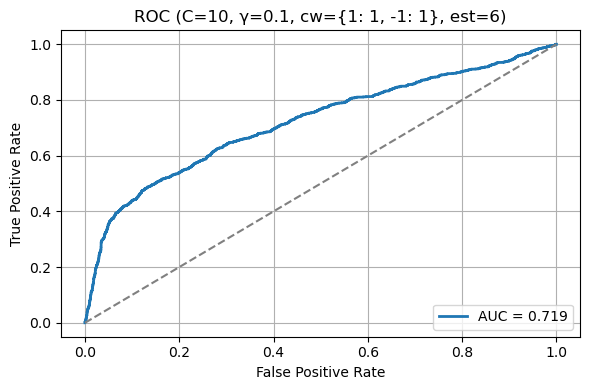

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  482  3136  368  514     0.804      0.567   0.484        0.895  0.522


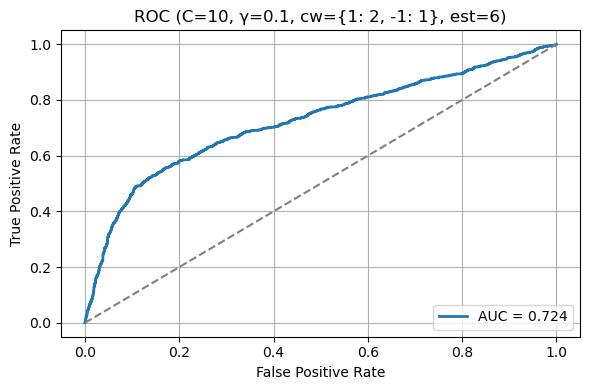

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 6, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  590  2784  720  406      0.75       0.45   0.592        0.795  0.512


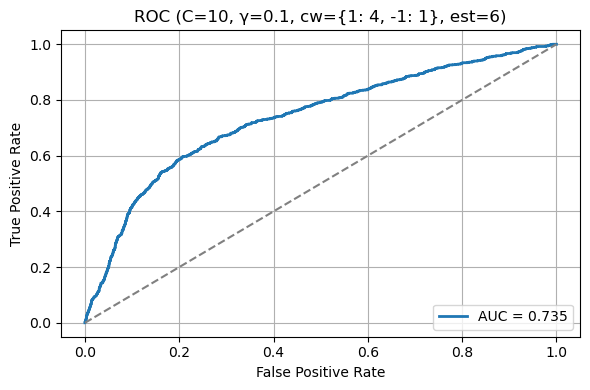

Model not found for (6, 0.9, 10, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


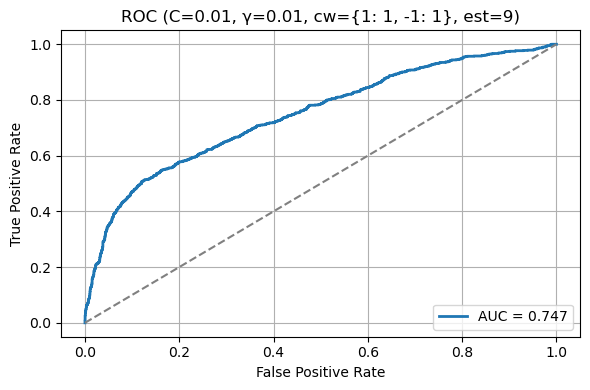

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


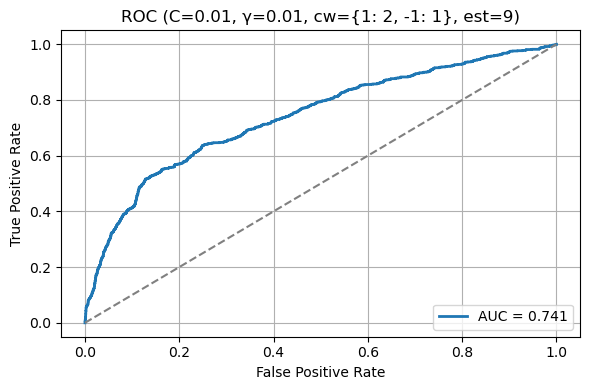

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP   TN    FP  FN  Accuracy  Precision  Recall  Specificity     F1
0  971  334  3170  25      0.29      0.234   0.975        0.095  0.378


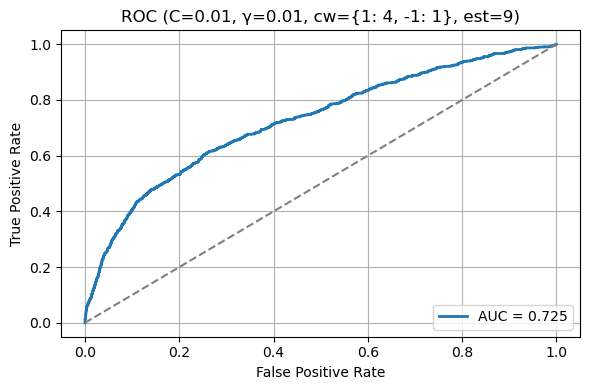

Model not found for (9, 0.3, 0.01, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


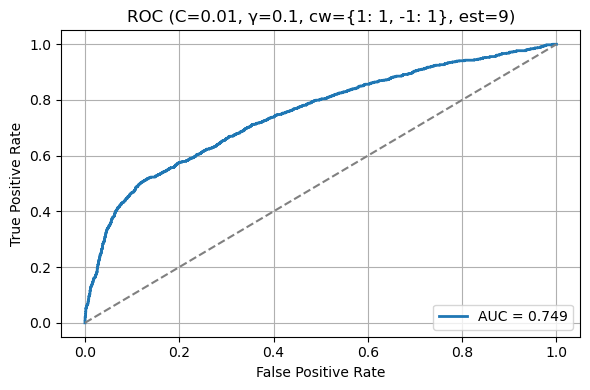

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  298  3321  183  698     0.804       0.62   0.299        0.948  0.404


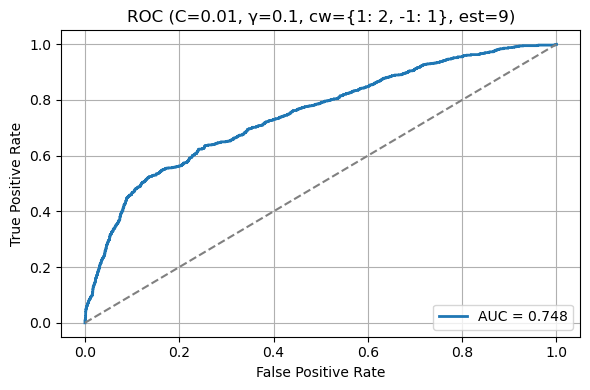

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  566  2888  616  430     0.768      0.479   0.568        0.824  0.52


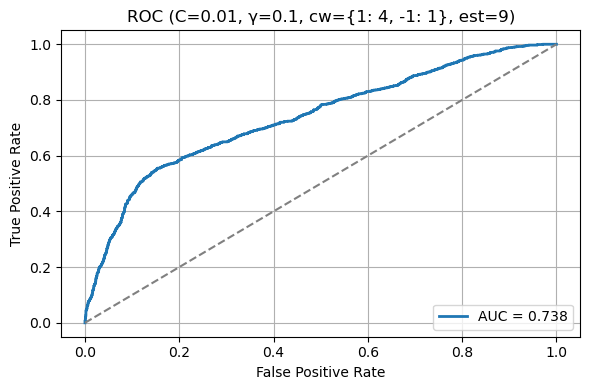

Model not found for (9, 0.3, 0.01, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  78  3479  25  918      0.79      0.757   0.078        0.993  0.142


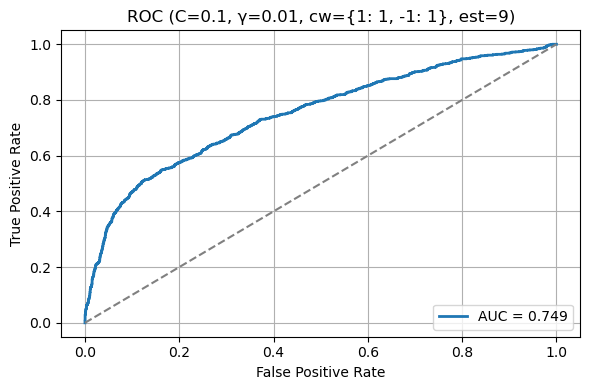

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  365  3241  263  631     0.801      0.581   0.366        0.925  0.45


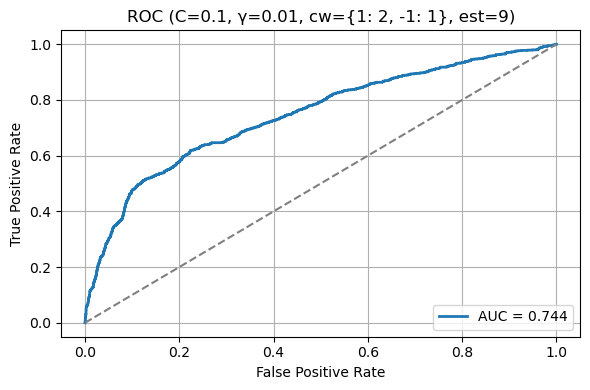

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  532  2987  517  464     0.782      0.507   0.534        0.852  0.52


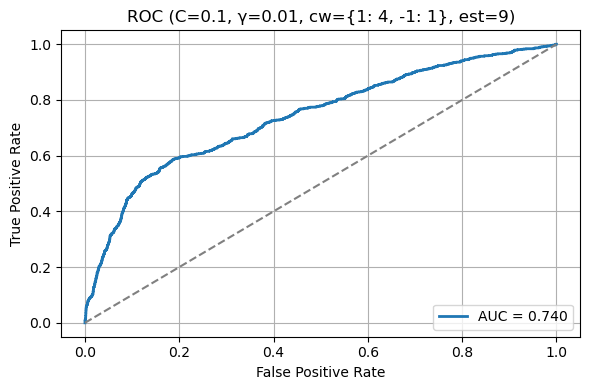

Model not found for (9, 0.3, 0.1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  296  3381  123  700     0.817      0.706   0.297        0.965  0.418


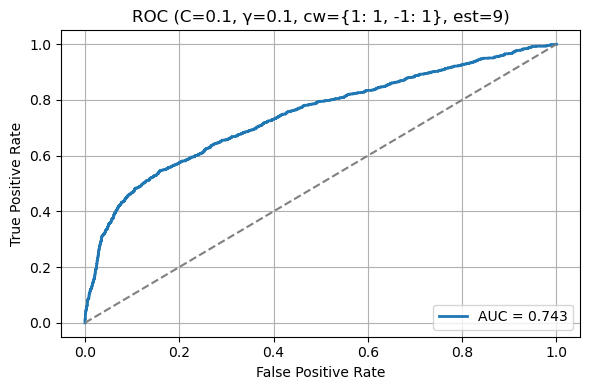

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  436  3196  308  560     0.807      0.586   0.438        0.912  0.501


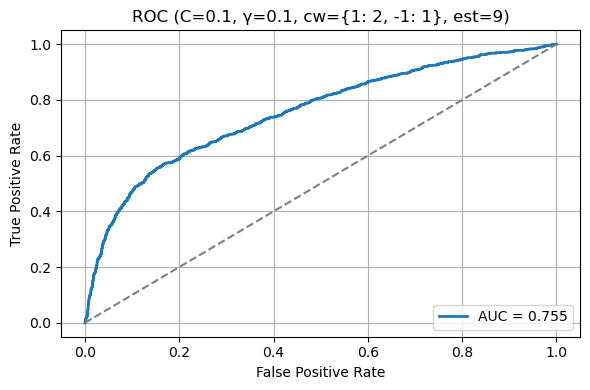

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  570  2879  625  426     0.766      0.477   0.572        0.822  0.52


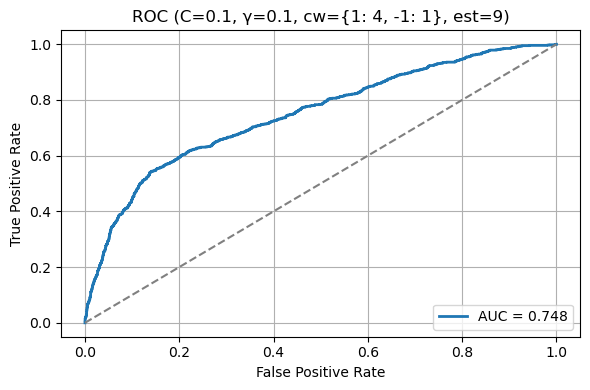

Model not found for (9, 0.3, 0.1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  313  3372  132  683     0.819      0.703   0.314        0.962  0.434


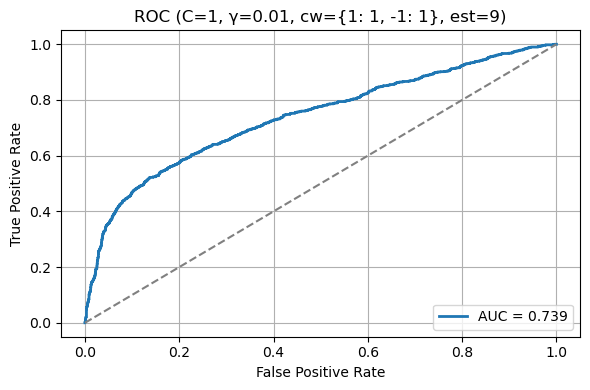

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  444  3189  315  552     0.807      0.585   0.446         0.91  0.506


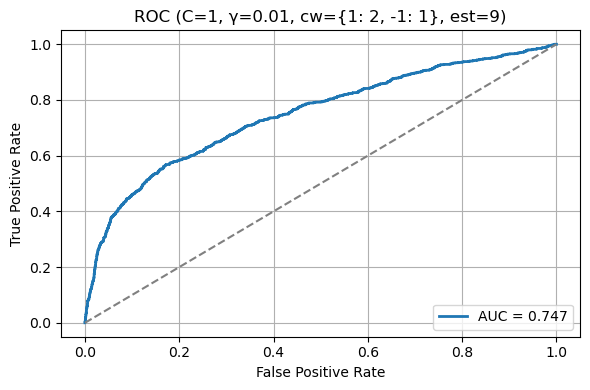

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  538  2948  556  458     0.775      0.492    0.54        0.841  0.515


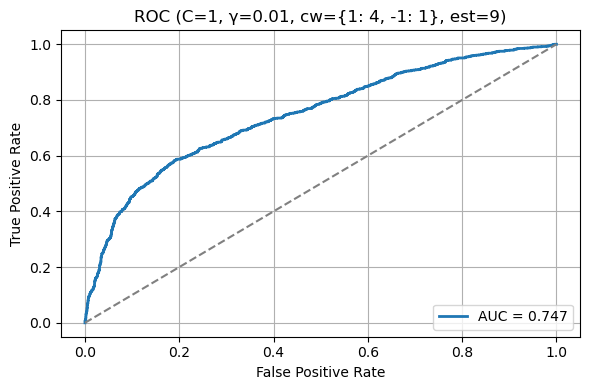

Model not found for (9, 0.3, 1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  339  3332  172  657     0.816      0.663    0.34        0.951  0.45


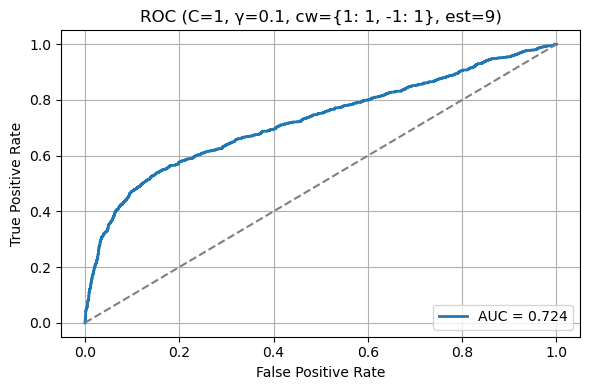

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  491  3115  389  505     0.801      0.558   0.493        0.889  0.523


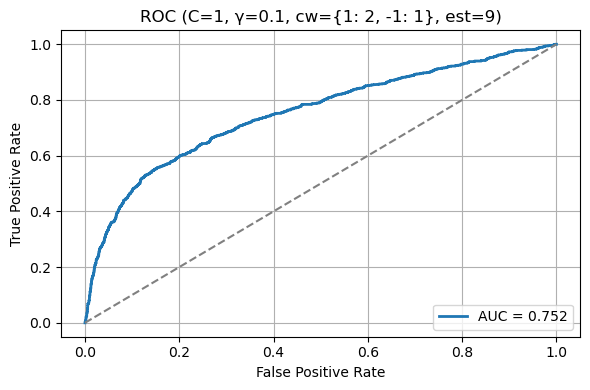

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  591  2810  694  405     0.756       0.46   0.593        0.802  0.518


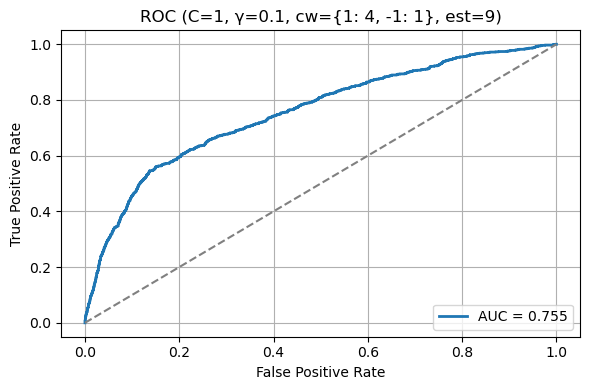

Model not found for (9, 0.3, 1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  322  3366  138  674      0.82        0.7   0.323        0.961  0.442


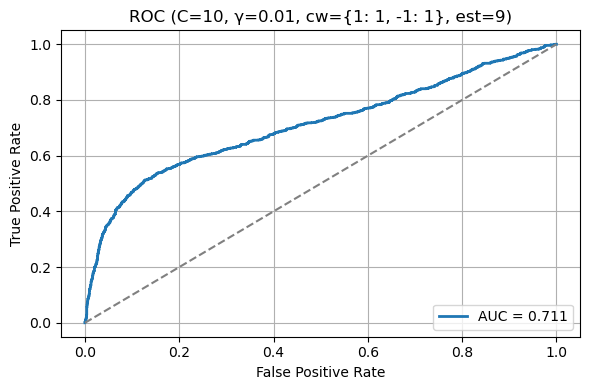

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  442  3191  313  554     0.807      0.585   0.444        0.911  0.505


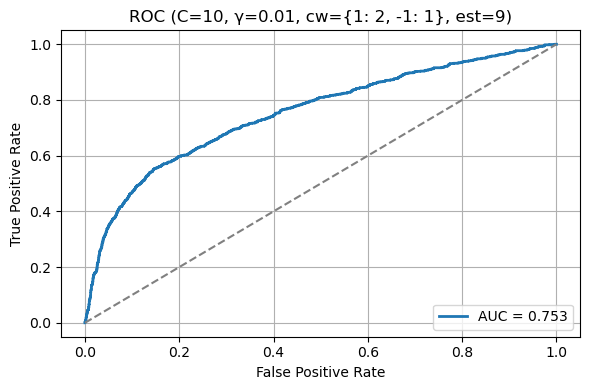

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  573  2865  639  423     0.764      0.473   0.575        0.818  0.519


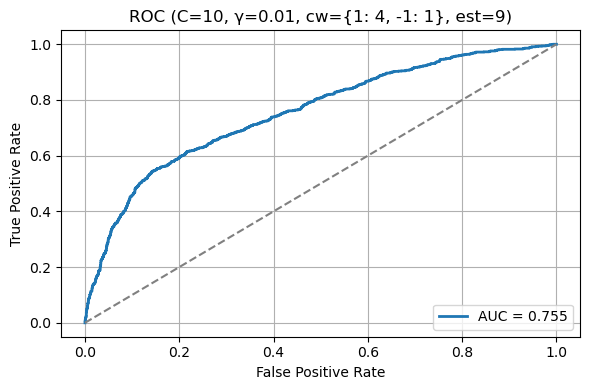

Model not found for (9, 0.3, 10, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  353  3323  181  643     0.817      0.661   0.354        0.948  0.461


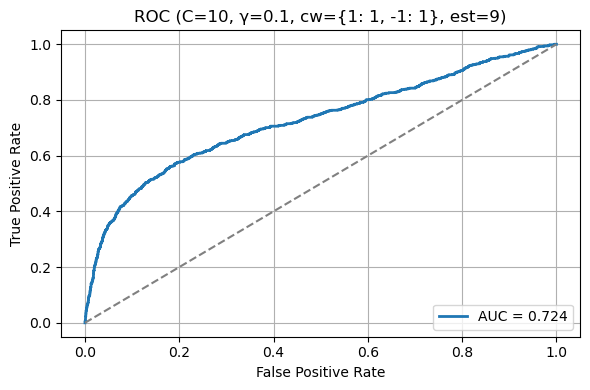

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  475  3132  372  521     0.802      0.561   0.477        0.894  0.515


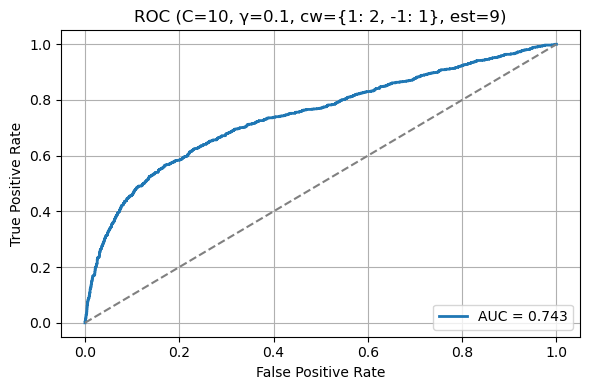

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.3

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  565  2877  627  431     0.765      0.474   0.567        0.821  0.516


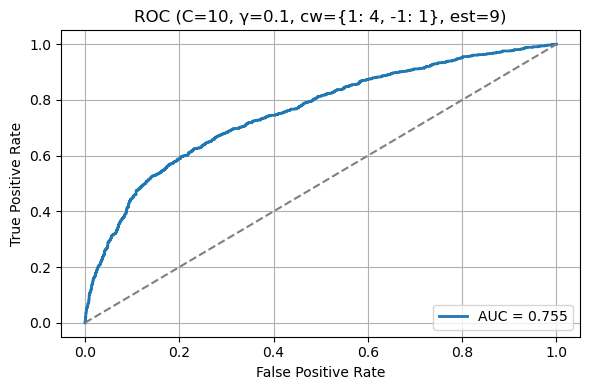

Model not found for (9, 0.3, 10, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


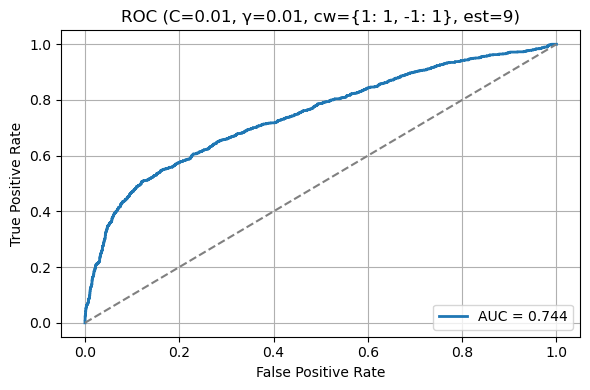

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  119  3442  62  877     0.791      0.657   0.119        0.982  0.202


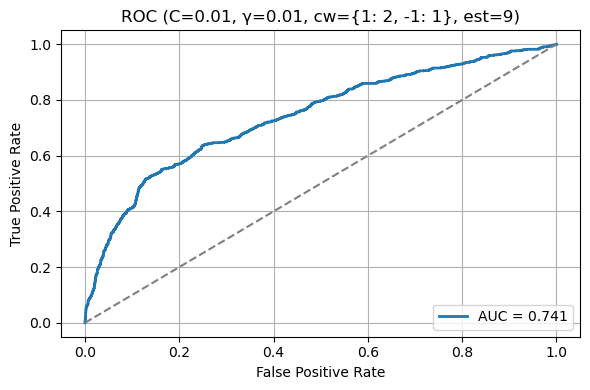

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  513  2885  619  483     0.755      0.453   0.515        0.823  0.482


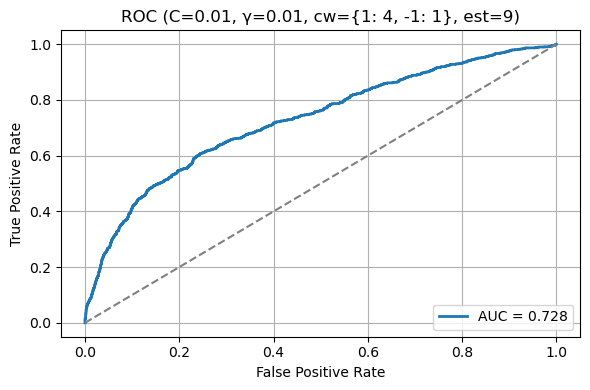

Model not found for (9, 0.6, 0.01, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  62  3487  17  934     0.789      0.785   0.062        0.995  0.115


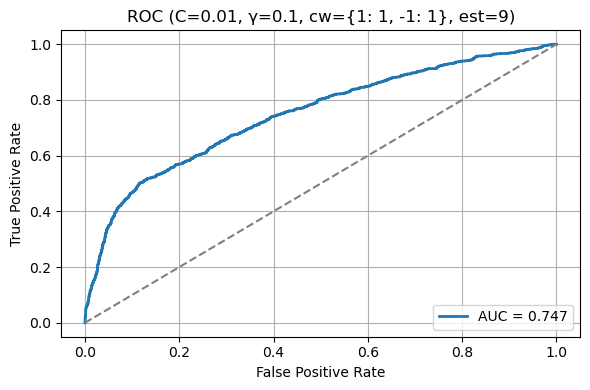

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  429  3204  300  567     0.807      0.588   0.431        0.914  0.497


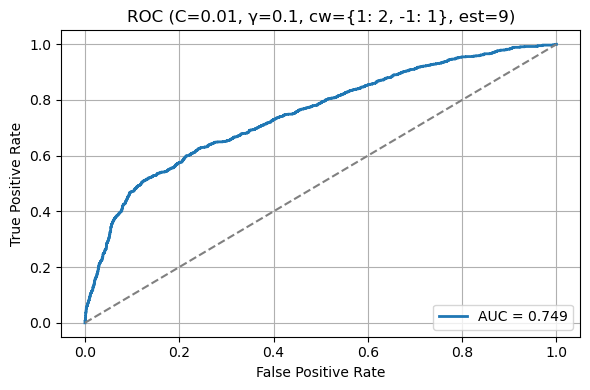

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  540  2975  529  456     0.781      0.505   0.542        0.849  0.523


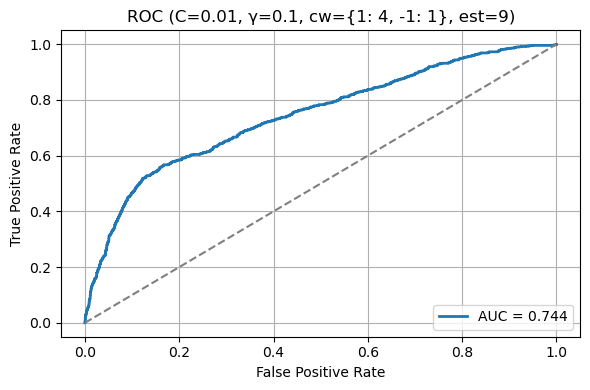

Model not found for (9, 0.6, 0.01, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  229  3415  89  767      0.81       0.72    0.23        0.975  0.349


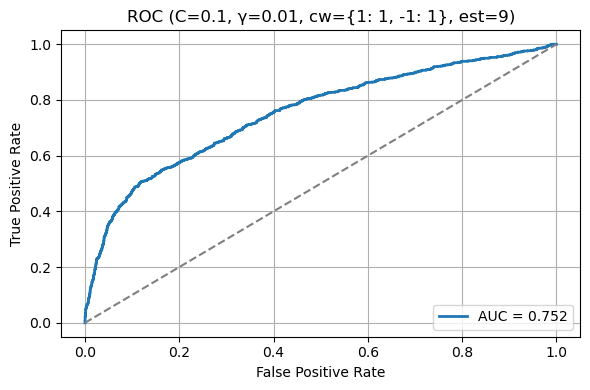

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  437  3196  308  559     0.807      0.587   0.439        0.912  0.502


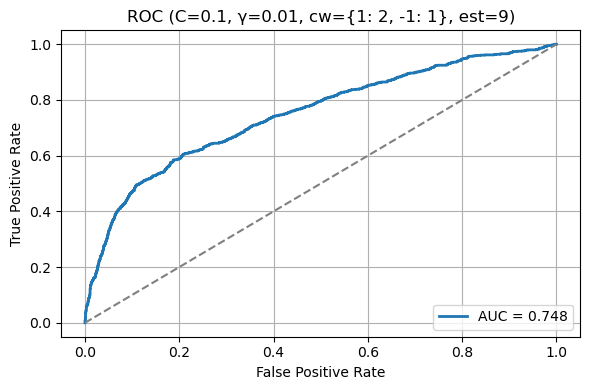

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  530  2978  526  466      0.78      0.502   0.532         0.85  0.517


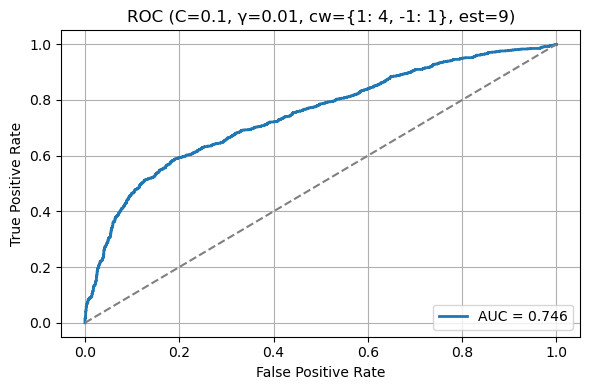

Model not found for (9, 0.6, 0.1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  316  3369  135  680     0.819      0.701   0.317        0.961  0.437


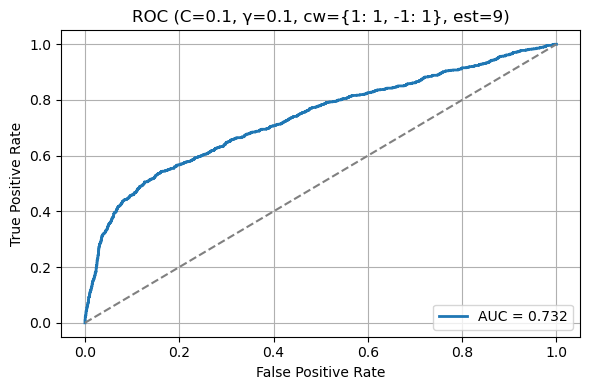

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  442  3187  317  554     0.806      0.582   0.444         0.91  0.504


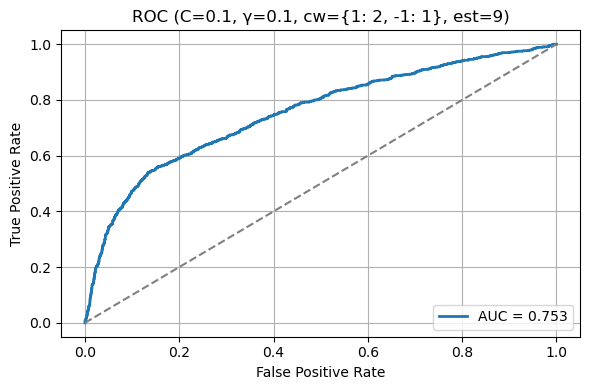

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  580  2874  630  416     0.768      0.479   0.582         0.82  0.526


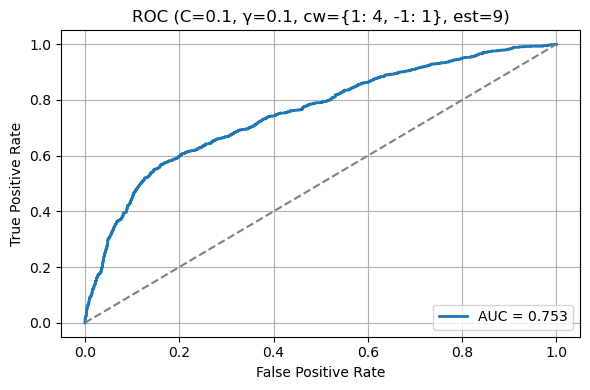

Model not found for (9, 0.6, 0.1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  318  3369  135  678     0.819      0.702   0.319        0.961  0.439


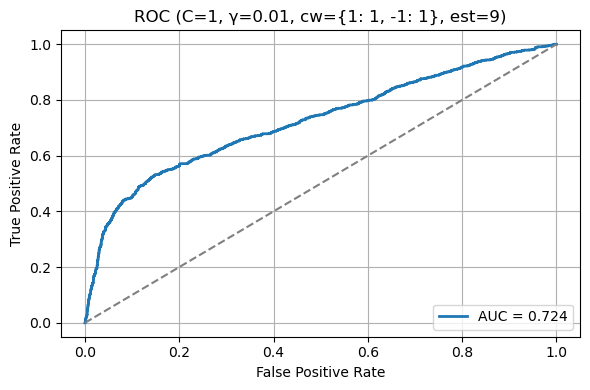

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  444  3192  312  552     0.808      0.587   0.446        0.911  0.507


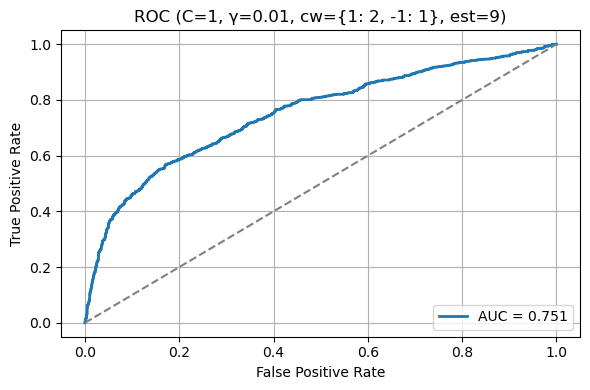

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  540  2936  568  456     0.772      0.487   0.542        0.838  0.513


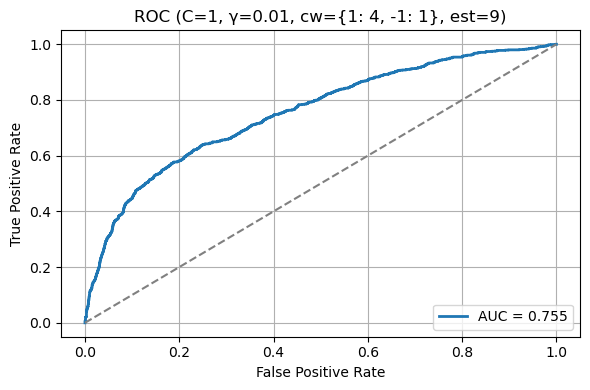

Model not found for (9, 0.6, 1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  341  3330  174  655     0.816      0.662   0.342         0.95  0.451


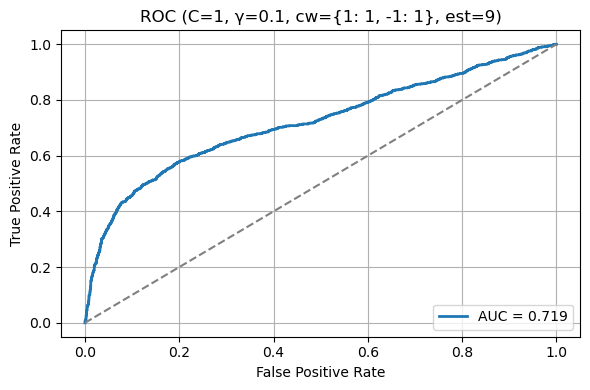

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  495  3107  397  501       0.8      0.555   0.497        0.887  0.524


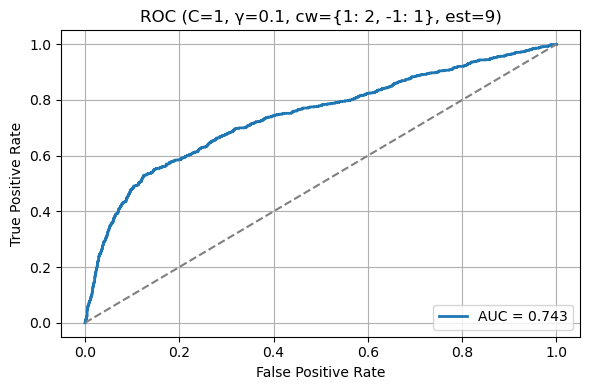

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  596  2786  718  400     0.752      0.454   0.598        0.795  0.516


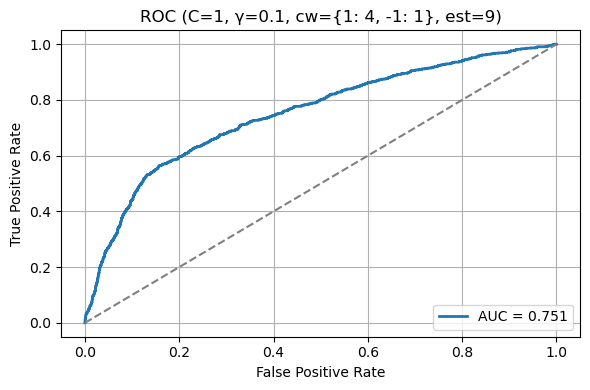

Model not found for (9, 0.6, 1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  322  3366  138  674      0.82        0.7   0.323        0.961  0.442


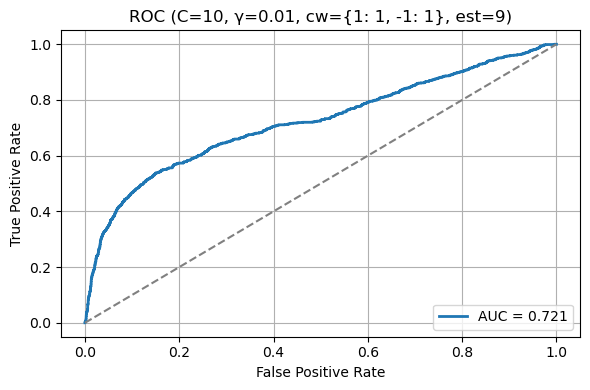

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  447  3187  317  549     0.808      0.585   0.449         0.91  0.508


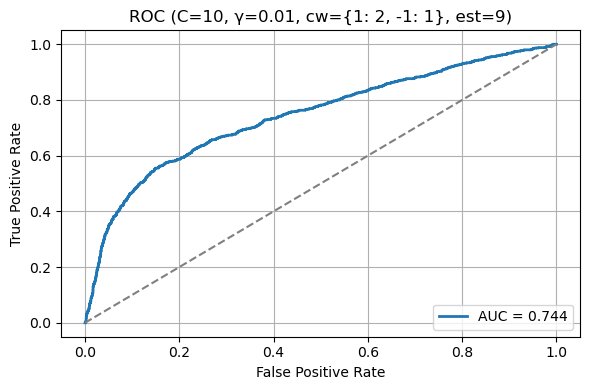

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  591  2832  672  405     0.761      0.468   0.593        0.808  0.523


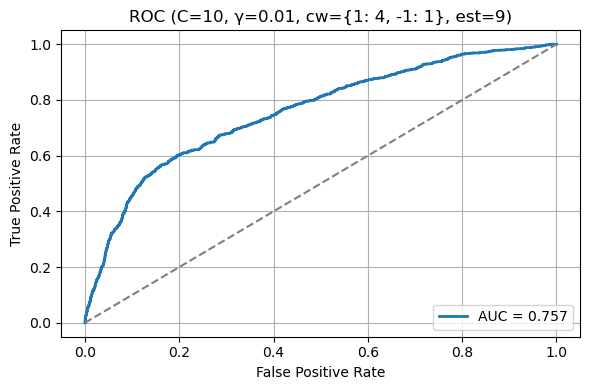

Model not found for (9, 0.6, 10, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  350  3321  183  646     0.816      0.657   0.351        0.948  0.458


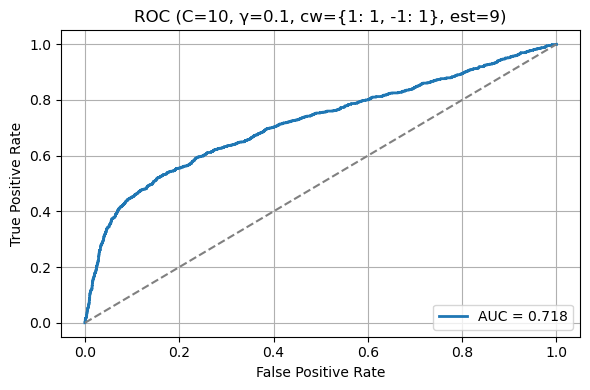

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  476  3131  373  520     0.802      0.561   0.478        0.894  0.516


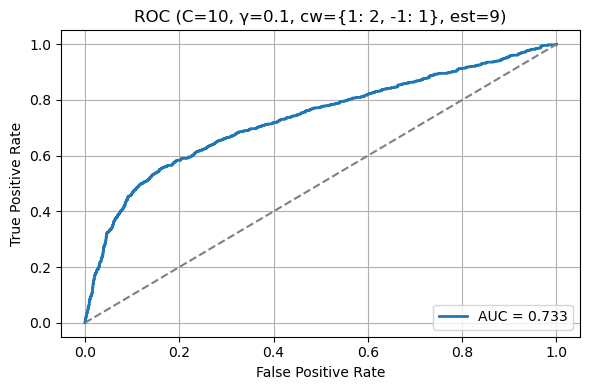

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.6

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  576  2814  690  420     0.753      0.455   0.578        0.803  0.509


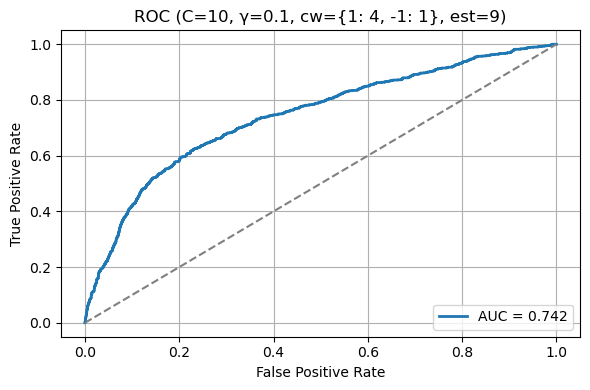

Model not found for (9, 0.6, 10, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
   TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity  F1
0   0  3504   0  996     0.779          0     0.0          1.0   0


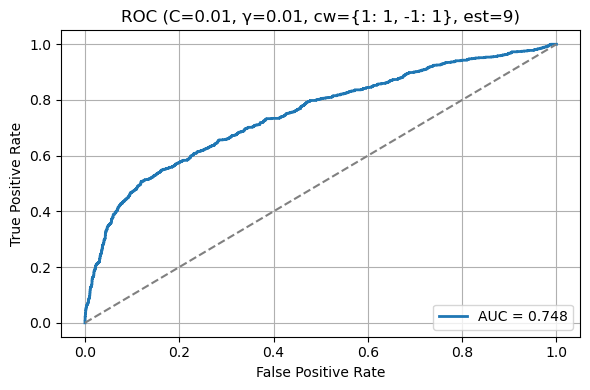

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  249  3365  139  747     0.803      0.642    0.25         0.96  0.36


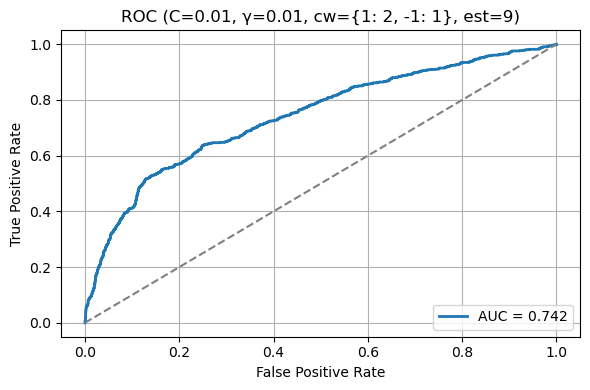

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  504  3049  455  492      0.79      0.526   0.506         0.87  0.516


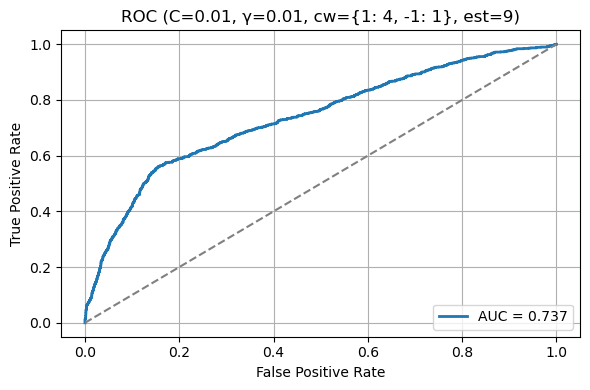

Model not found for (9, 0.9, 0.01, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN  FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  165  3426  78  831     0.798      0.679   0.166        0.978  0.266


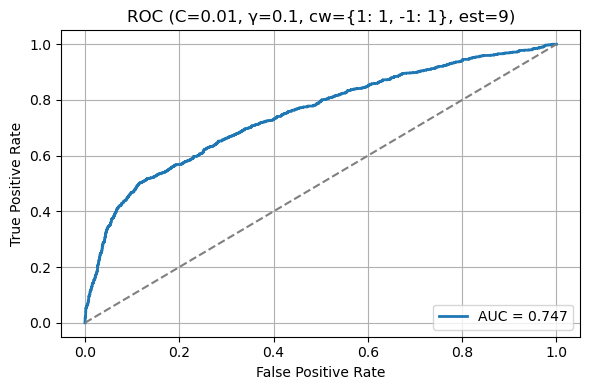

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  440  3199  305  556     0.809      0.591   0.442        0.913  0.505


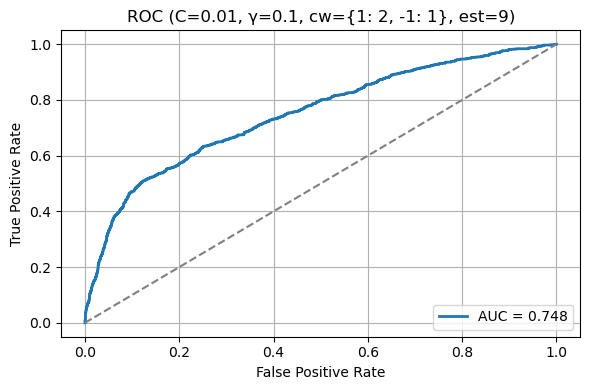

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.01, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  543  2977  527  453     0.782      0.507   0.545         0.85  0.526


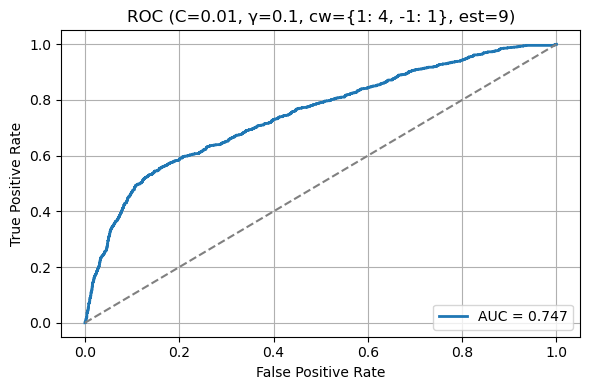

Model not found for (9, 0.9, 0.01, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  290  3382  122  706     0.816      0.704   0.291        0.965  0.412


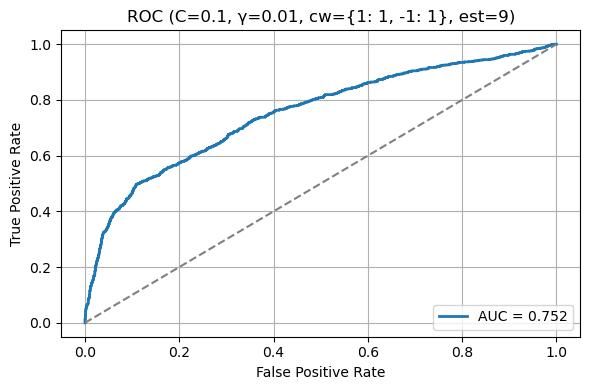

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  441  3191  313  555     0.807      0.585   0.443        0.911  0.504


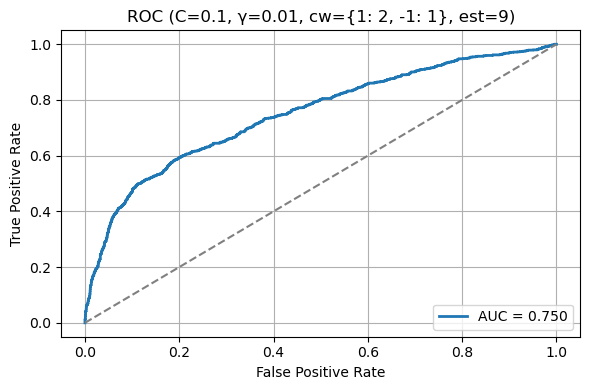

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  538  2957  547  458     0.777      0.496    0.54        0.844  0.517


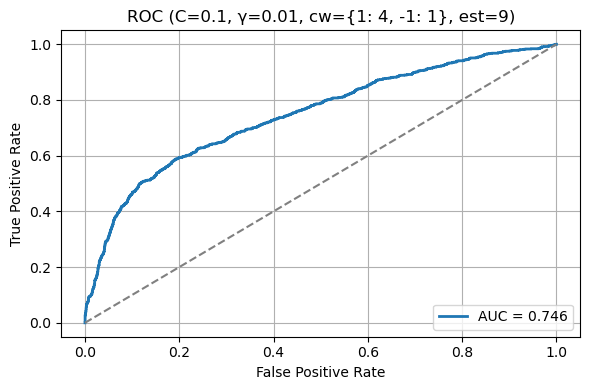

Model not found for (9, 0.9, 0.1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  321  3364  140  675     0.819      0.696   0.322         0.96  0.441


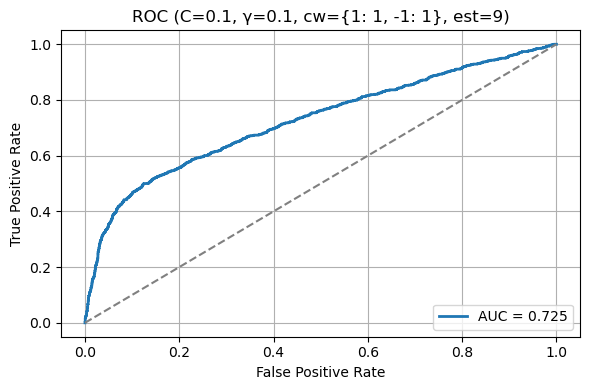

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  445  3185  319  551     0.807      0.582   0.447        0.909  0.506


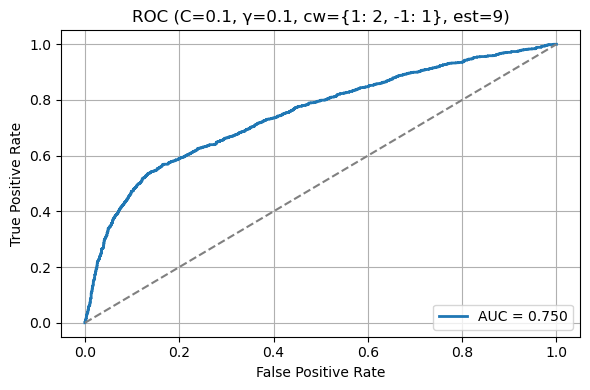

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 0.1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  595  2836  668  401     0.762      0.471   0.597        0.809  0.527


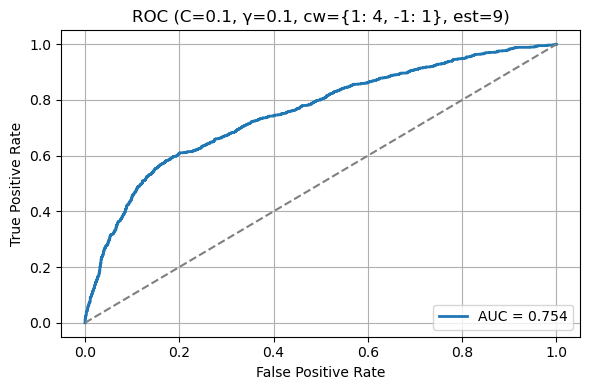

Model not found for (9, 0.9, 0.1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  320  3367  137  676     0.819        0.7   0.321        0.961  0.44


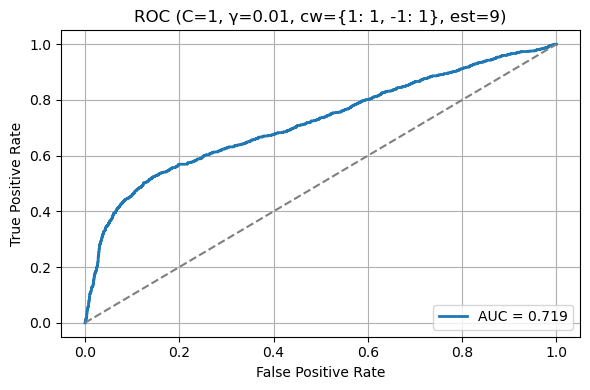

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  440  3191  313  556     0.807      0.584   0.442        0.911  0.503


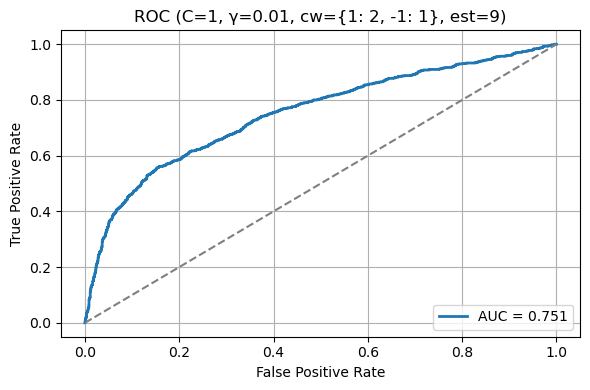

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  549  2920  584  447     0.771      0.485   0.551        0.833  0.516


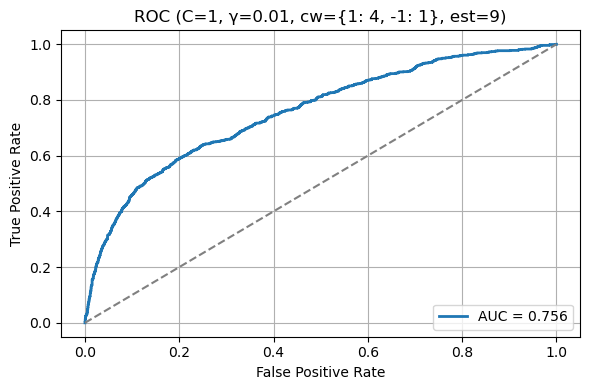

Model not found for (9, 0.9, 1, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  341  3332  172  655     0.816      0.665   0.342        0.951  0.452


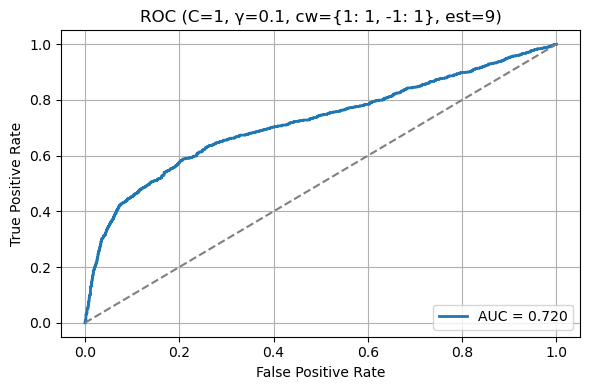

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  498  3118  386  498     0.804      0.563     0.5         0.89  0.53


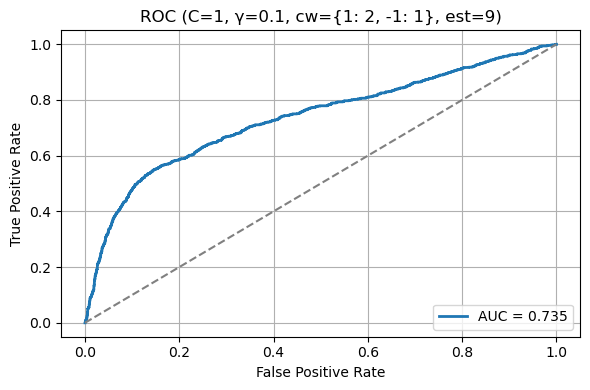

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 1, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  597  2793  711  399     0.753      0.456   0.599        0.797  0.518


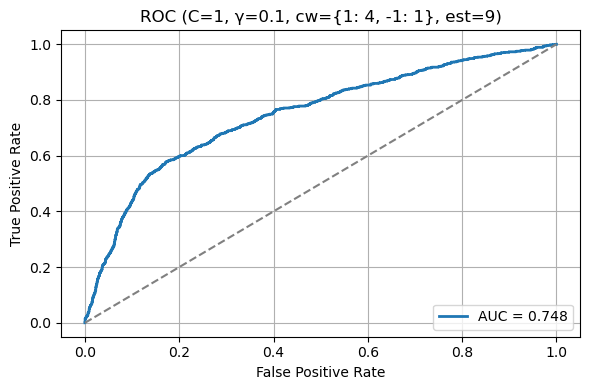

Model not found for (9, 0.9, 1, 0.1, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  321  3366  138  675     0.819      0.699   0.322        0.961  0.441


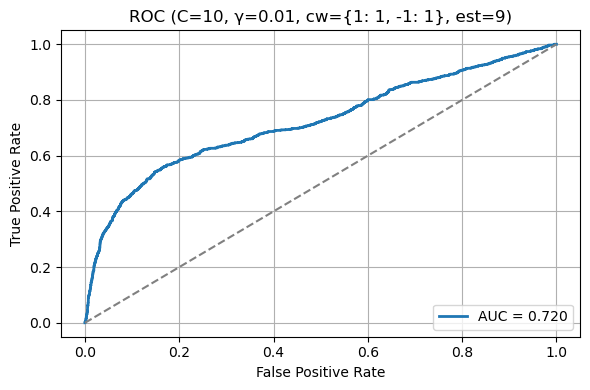

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  451  3180  324  545     0.807      0.582   0.453        0.908  0.509


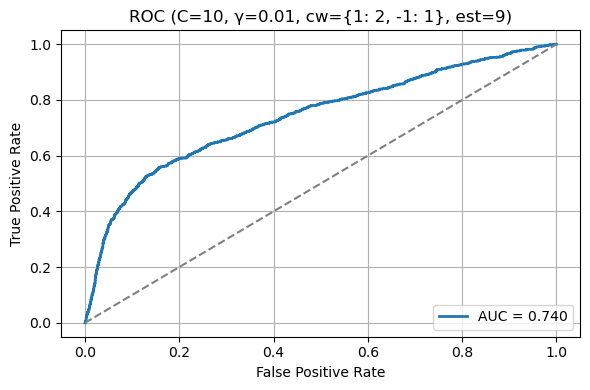

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  599  2824  680  397     0.761      0.468   0.601        0.806  0.527


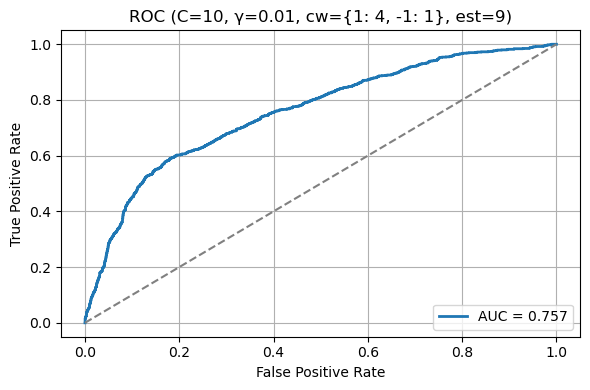

Model not found for (9, 0.9, 10, 0.01, '{1: 6, -1: 1}')
----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 1, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  350  3333  171  646     0.818      0.672   0.351        0.951  0.461


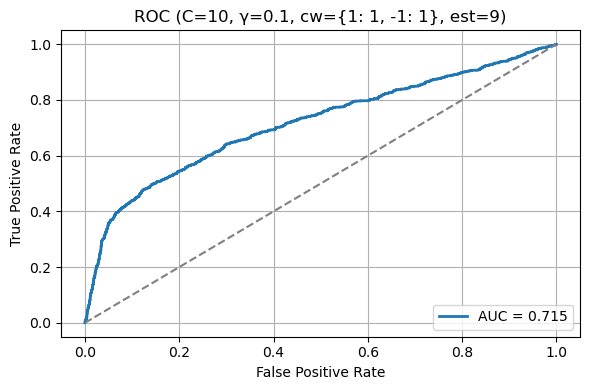

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 2, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  479  3140  364  517     0.804      0.568   0.481        0.896  0.521


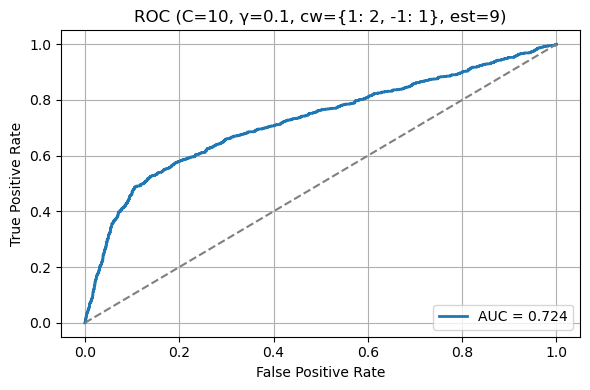

----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.1, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.9

 Evaluation Metrics on the Validation Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity    F1
0  586  2787  717  410      0.75       0.45   0.588        0.795  0.51


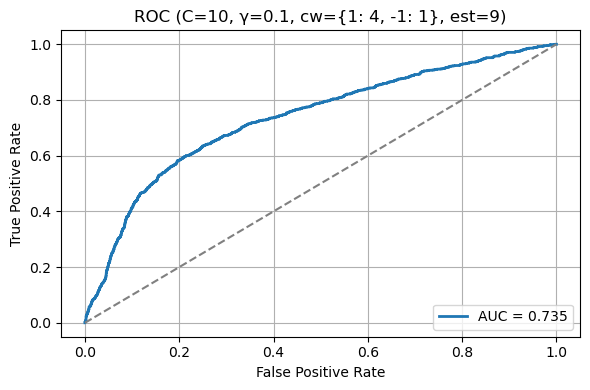

Model not found for (9, 0.9, 10, 0.1, '{1: 6, -1: 1}')


In [289]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Evaluation with Boosted Ensembles
C_values = [0.01, 0.1, 1, 10]
gamma_values = [0.01, 0.1]
class_weight_options = [{1:1, -1:1}, {1:2, -1:1}, {1:4, -1:1}]
n_estimators_options = [3, 6, 9]
subset_fraction_options = [0.3, 0.6, 0.9]

for n_estimators in n_estimators_options:
    for subset_fraction in subset_fraction_options:
        for C in C_values:
            for gamma in gamma_values:
                for cw in class_weight_options:
                    cw_str = str(cw)
                    key = (n_estimators, round(subset_fraction, 2), C, gamma, cw_str)

                    if key not in boosted_models_weighted_svm_rbf_kernel:
                        print(f"Model not found for {key}")
                        continue

                    print("-" * 100)
                    print(f"\n Evaluating Boosted Ensemble:")
                    print(f"C = {C}, gamma = {gamma}, class_weight = {cw_str}")
                    print(f"n_estimators = {n_estimators}, subset_fraction = {subset_fraction}")

                    model_info = boosted_models_weighted_svm_rbf_kernel[key]
                    ensemble_models = model_info["models"]

                    try:
                        val_decisions = np.mean(
                            [model.decision_function(X_SVM_val) for model in ensemble_models],
                            axis=0
                        )
                    except Exception as e:
                        print(f" Error during decision_function ensemble: {e}")
                        continue

                    y_val_pred = np.sign(val_decisions)

                    # Evaluation Metrics
                    TP = np.sum((y_SVM_val == 1) & (y_val_pred == 1))
                    TN = np.sum((y_SVM_val == -1) & (y_val_pred == -1))
                    FP = np.sum((y_SVM_val == -1) & (y_val_pred == 1))
                    FN = np.sum((y_SVM_val == 1) & (y_val_pred == -1))

                    Accuracy = (TP + TN) / len(y_SVM_val)
                    Precision = TP / (TP + FP) if (TP + FP) > 0 else 0
                    Recall = TP / (TP + FN) if (TP + FN) > 0 else 0
                    Specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
                    F1 = 2 * (Precision * Recall) / (Precision + Recall) if (Precision + Recall) > 0 else 0

                    evaluationresults = [{
                        "TP": TP,
                        "TN": TN,
                        "FP": FP,
                        "FN": FN,
                        "Accuracy": Accuracy,
                        "Precision": Precision,
                        "Recall": Recall,
                        "Specificity": Specificity,
                        "F1": F1,
                    }]

                    # Print metrics
                    df_eval = pd.DataFrame(evaluationresults)
                    print("\n Evaluation Metrics on the Validation Set:")
                    print(df_eval.round(3))

                    # ROC Curve
                    try:
                        fpr, tpr, _ = roc_curve(y_SVM_val, val_decisions, pos_label=1)
                        roc_auc = auc(fpr, tpr)

                        plt.figure(figsize=(6, 4))
                        plt.plot(fpr, tpr, lw=2, label=f"AUC = {roc_auc:.3f}")
                        plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
                        plt.title(f"ROC (C={C}, γ={gamma}, cw={cw_str}, est={n_estimators})")
                        plt.xlabel("False Positive Rate")
                        plt.ylabel("True Positive Rate")
                        plt.legend(loc="lower right")
                        plt.grid(True)
                        plt.tight_layout()
                        plt.show()
                    except Exception as e:
                        print(f" Error generating ROC curve: {e}")


## Results (Boosting SVM with RBF Kernel)
Now we can interpret our results. If we take a closer look to what happened when we change the **Number of Estimator** and the ** Value of Subfraction** for a chosen single model we can see that:

**1. Effect of `subset_fraction`**  
*(Fixed: `C` = 0.1, `γ` = 0.1, `weight` = 4, `n_estimators` = 6)*

| subset_fraction | FN  | TP  | Recall | F1  | ROC |
|-----------------|-----|-----|--------|-----|-----|
| 0.3             | 758 | 214 | 0.22   | 0.27| 0.64|
| 0.6             | 464 | 508 | 0.52   | 0.51| 0.74|
| 0.9             | 439 | 533 | 0.55   | 0.52| 0.75|

**Interpretation:**  
Moving from **0.3 → 0.6** gives a **huge gain** in recall (0.22 → 0.52) and F1 (0.27 → 0.51).  
**0.6 → 0.9** gives a small bump: recall +0.03, F1 +0.01.  
So, **larger `subset_fraction` = better generalization**, but the **biggest impact is from 0.3 → 0.6**.

**2. Effect of `n_estimators`**  
*(Fixed: `C` = 0.1, `γ` = 0.1, `weight` = 4, `subset_fraction` = 0.9)*

| n_estimators | FN  | TP  | Recall | F1  | ROC |
|--------------|-----|-----|--------|-----|-----|
| 3            | 747 | 225 | 0.23   | 0.27| 0.66|
| 6            | 439 | 533 | 0.55   | 0.52| 0.75|
| 9            | 428 | 544 | 0.56   | 0.52| 0.75|

**Interpretation:**  
Increasing from **3 → 6 estimators** gives a **huge recall bump** (0.23 → 0.55) and F1 (0.27 → 0.52).  
**6 → 9** yields only **marginal gains**.  
This shows **diminishing returns** after 6 estimators, likely due to nearing model capacity.


Also, we know from previous results that our best final model was the following **SVM with RBF Kernel** model:
| C    | γ    | CWR | LOSS | FP | FN | Recall | F1 | CCSVR  | CCOMR  | CCCMR  | ICSVR  | NSV  | ROC  |
|------|------|-----|------|----|----|--------|----|--------|--------|--------|--------|------|------|
| 10  | 0.01  | 4   |0.57  |671 |398 |0.60    |0.53|0.64    |0.04    |0.96    |0.36    |13759 |0.76  |

Now, if we take a look at the best boosting candidate:
| C   | γ    | CWR | Estimators | Subset | FN  | Recall | Precision | F1   | Accuracy |
|-----|------|-----|------------|--------|-----|--------|-----------|------|----------|
| 10  | 0.01 | 4   | 9          | 0.9    | 397 | 0.601  | 0.468     | 0.527| 0.761    |
| 10  | 0.1  | 4   | 9          | 0.9    | 410 | 0.588  | 0.450     | 0.510| 0.750    |
| 1   | 0.1  | 2   | 9          | 0.9    | 498 | 0.500  | 0.563     | 0.530| 0.804    |
| 0.1 | 0.1  | 4   | 9          | 0.9    | 401 | 0.597  | 0.471     | 0.527| 0.762    |

we can see again that the best candidate is:

| C   | γ    | CWR | Estimators | Subset | FN  | Recall | Precision | F1   | Accuracy |
|-----|------|-----|------------|--------|-----|--------|-----------|------|----------|
| 10  | 0.01 | 4   | 9          | 0.9    | 397 | 0.601  | 0.468     | 0.527| 0.761    |

which gives us a very close result as our chosen **SVM with RBF Kernel** model.

## Final Model for Boosting SVM with RBF Kernel

In [306]:
from sklearn.svm import SVC
from sklearn.metrics import hinge_loss
import numpy as np
import pandas as pd

# Grid search values
C_values = [10]
gamma_values = [0.01]
class_weight_options = [{1:4, -1:1}]
n_estimators_options = [9]
subset_fraction_options = [0.9]

# Store results
boosted_models_weighted_svm_rbf_kernel_final = {}

# Looping through all combinations
for n_estimators in n_estimators_options:
    for subset_fraction in subset_fraction_options:
        for C in C_values:
            for gamma in gamma_values:
                for cw in class_weight_options:

                    print("-" * 60)
                    print(f"Boosted Ensemble | Estimators: {n_estimators}, Subset Fraction: {subset_fraction}")
                    print(f"Training SVM: C = {C}, gamma = {gamma}, class_weight = {cw}")

                    ensemble_models = []
                    train_losses = []
                    val_losses = []

                    for i in range(n_estimators):
                        subset_indices = X_SVM_train.sample(frac = subset_fraction, random_state = 42 + i).index
                        X_subset = X_SVM_train.loc[subset_indices]
                        y_subset = y_SVM_train.loc[subset_indices]

                        model = SVC(kernel = 'rbf', C = C, gamma = gamma, class_weight = cw)
                        model.fit(X_subset, y_subset)

                        # Store model
                        ensemble_models.append(model)

                        # Decision values on full training & val sets
                        train_decision = model.decision_function(X_SVM_train)
                        val_decision = model.decision_function(X_SVM_val)

                        train_loss = hinge_loss(y_SVM_train, train_decision)
                        val_loss = hinge_loss(y_SVM_val, val_decision)

                        train_losses.append(train_loss)
                        val_losses.append(val_loss)

                    # Average metrics
                    avg_train_loss = np.mean(train_losses)
                    avg_val_loss = np.mean(val_losses)

                    print(f"Average Train Hinge Loss: {avg_train_loss:.4f}")
                    print(f"Average Validation Hinge Loss: {avg_val_loss:.4f}")

                    # Use tuple of all hyperparameters as the key
                    key = (n_estimators, subset_fraction, C, gamma, str(cw))
                    boosted_models_weighted_svm_rbf_kernel_final[key] = {
                        "models": ensemble_models,
                        "avg_train_loss": avg_train_loss,
                        "avg_val_loss": avg_val_loss
                    }

print("-" * 60)
print("All boosted SVM ensembles have been trained and stored.")


------------------------------------------------------------
Boosted Ensemble | Estimators: 9, Subset Fraction: 0.9
Training SVM: C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}
Average Train Hinge Loss: 0.4702
Average Validation Hinge Loss: 0.4851
------------------------------------------------------------
All boosted SVM ensembles have been trained and stored.


## Prediction on Test Data

In [310]:
import pandas as pd
import numpy as np

# Define fixed parameter values
C = 10
gamma = 0.01
cw = {1: 4, -1: 1}
n_estimators = 9
subset_fraction = 0.9

# Format key
cw_str = str(cw)
key = (n_estimators, round(subset_fraction, 2), C, gamma, cw_str)

# Retrieve model
if key not in boosted_models_weighted_svm_rbf_kernel_final:
    print(f"Model not found for {key}")
else:
    print("-" * 100)
    print(f"\n Evaluating Boosted Ensemble:")
    print(f"C = {C}, gamma = {gamma}, class_weight = {cw_str}")
    print(f"n_estimators = {n_estimators}, subset_fraction = {subset_fraction}")

    model_info = boosted_models_weighted_svm_rbf_kernel_final[key]
    ensemble_models = model_info["models"]

    try:
        test_decisions = np.mean(
            [model.decision_function(X_SVM_test) for model in ensemble_models],
            axis=0
        )
    except Exception as e:
        print(f"Error during decision_function ensemble: {e}")
    else:
        y_test_pred = np.sign(test_decisions)

        # Evaluation Metrics
        TP = np.sum((y_SVM_test == 1) & (y_test_pred == 1))
        TN = np.sum((y_SVM_test == -1) & (y_test_pred == -1))
        FP = np.sum((y_SVM_test == -1) & (y_test_pred == 1))
        FN = np.sum((y_SVM_test == 1) & (y_test_pred == -1))

        Accuracy = (TP + TN) / len(y_SVM_test)
        Precision = TP / (TP + FP) if (TP + FP) > 0 else 0
        Recall = TP / (TP + FN) if (TP + FN) > 0 else 0
        Specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
        F1 = 2 * (Precision * Recall) / (Precision + Recall) if (Precision + Recall) > 0 else 0

        evaluationresults = [{
            "TP": TP,
            "TN": TN,
            "FP": FP,
            "FN": FN,
            "Accuracy": Accuracy,
            "Precision": Precision,
            "Recall": Recall,
            "Specificity": Specificity,
            "F1": F1,
        }]

        # Print metrics
        df_eval = pd.DataFrame(evaluationresults)
        print("\nEvaluation Metrics on the Test Set:")
        print(df_eval.round(3))


----------------------------------------------------------------------------------------------------

 Evaluating Boosted Ensemble:
C = 10, gamma = 0.01, class_weight = {1: 4, -1: 1}
n_estimators = 9, subset_fraction = 0.9

Evaluation Metrics on the Test Set:
    TP    TN   FP   FN  Accuracy  Precision  Recall  Specificity     F1
0  585  2849  656  410     0.763      0.471   0.588        0.813  0.523


Again, our result on Test Data is very close to what we obtained by using **SVM with RBF Kernel**:

**SVM with RBF Kernel (Final Model: C = 10, γ = 0.01, weight = 4)**
| TP  | TN   | FP  | FN  | Accuracy | Precision | Recall | Specificity | F1   |
|-----|------|-----|-----|----------|-----------|--------|-------------|------|
| 584 | 2855 | 650 | 411 | 0.764    | 0.473     | 0.587  | 0.815       | 0.524|

**Boosting SVM with RBF Kernel (Final Model: C = 10, γ = 0.01, weight = 4, Number of Estimator = 9, Value of Subfraction = 0.9)**
| TP  | TN   | FP  | FN  | Accuracy | Precision | Recall | Specificity | F1   |
|-----|------|-----|-----|----------|-----------|--------|-------------|------|
| 585 | 2849 | 656 | 410 | 0.763    | 0.471     | 0.588  | 0.813       | 0.523|